In [1]:
import os
import librosa
# import pydub
from pydub import AudioSegment
import numpy as np
import copy
import random
from scipy import signal as scipy_signal
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim

import datetime

from torch.utils.tensorboard import SummaryWriter

import threading
import time

from tqdm.notebook import tqdm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics._plot.confusion_matrix import ConfusionMatrixDisplay

In [2]:
dataset_dir = '/home/torooc/dataHDD2/speech_commands_v0.01/'

run_name = 'runs/2_layer_rnn_hidden_fc_uni_dir' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# run_name = 'runs/debug_' + datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")

device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')
torch.cuda.set_device(device)


In [3]:
testing_list_path = dataset_dir + 'testing_list.txt'
validation_list_path = dataset_dir + 'validation_list.txt'

In [4]:
with open(testing_list_path) as f:
    testing_list = f.readlines()
    testing_list = [file.strip() for file in testing_list]
    
with open(validation_list_path) as f:
    validation_list = f.readlines()
    validation_list = [file.strip() for file in validation_list]

In [5]:
command_dirs = os.listdir(dataset_dir)

command_dirs = [direc for direc in command_dirs if os.path.isdir(os.path.join(dataset_dir, direc))]

command_dirs.sort()

command_dirs.remove('_background_noise_')

command_dirs.remove('_hey_liku')


In [6]:
print(command_dirs)

['bed', 'bird', 'cat', 'dog', 'down', 'eight', 'five', 'four', 'go', 'happy', 'house', 'left', 'marvin', 'nine', 'no', 'off', 'on', 'one', 'right', 'seven', 'sheila', 'six', 'stop', 'three', 'tree', 'two', 'up', 'wow', 'yes', 'zero']


In [7]:
key2label_dict = dict()
label2key_list = list()

key2label_dict[' '] = 0
label2key_list.append(' ')

for i, command in enumerate(command_dirs):
    key2label_dict[command] = i + 1
    label2key_list.append(command)

In [8]:
key2label_dict

{' ': 0,
 'bed': 1,
 'bird': 2,
 'cat': 3,
 'dog': 4,
 'down': 5,
 'eight': 6,
 'five': 7,
 'four': 8,
 'go': 9,
 'happy': 10,
 'house': 11,
 'left': 12,
 'marvin': 13,
 'nine': 14,
 'no': 15,
 'off': 16,
 'on': 17,
 'one': 18,
 'right': 19,
 'seven': 20,
 'sheila': 21,
 'six': 22,
 'stop': 23,
 'three': 24,
 'tree': 25,
 'two': 26,
 'up': 27,
 'wow': 28,
 'yes': 29,
 'zero': 30}

In [9]:
total_wav_file_list = list()

for command_dir in command_dirs:
    wav_list = os.listdir(os.path.join(dataset_dir, command_dir))
    
    wav_list_with_prefix = [os.path.join(command_dir, file_name) for file_name in wav_list]
    
    total_wav_file_list += wav_list_with_prefix

In [10]:
training_list = list(set(total_wav_file_list) - set(testing_list) - set(validation_list))
training_list.sort()


In [11]:
'''
validation_list
testing_list
training_list
'''

'\nvalidation_list\ntesting_list\ntraining_list\n'

In [12]:
audio_metadata = list()

for wav_file_name in tqdm(total_wav_file_list):
    audio = AudioSegment.from_wav(dataset_dir + wav_file_name)
    fs = audio.frame_rate
    length_in_samples = audio.frame_count()
    
#   normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15
    
#   print("Max: {}, Min: {}".format(max(normalized_audio_array), min(normalized_audio_array)))
    
    audio_metadata.append([fs, length_in_samples])

In [13]:
SR = 16000

class DatasetLoader():
    
    def __init__(self, batch_size, dataset_dir, wav_file_name_list, key2label, label2key, is_train):
        self.batch_size = batch_size
        self.dataset_dir = dataset_dir
        self.wav_file_name_list = copy.deepcopy(wav_file_name_list)
        self.sr = SR
        self.nsc_in_ms = 40
#         self.nov_in_ms = self.nsc_in_ms / 2
        self.nov_in_ms = 0
        self.nsc_in_sample = int(self.nsc_in_ms / 1000 * self.sr)
        self.nov_in_sample = int(self.nov_in_ms / 1000 * self.sr)
        
        self.key2label = key2label
        self.label2key = label2key
        
        self.spectrogram_list = list()
        self.label_list = list()
        
        self.lock = threading.RLock()
        
        self.num_thread = 4
        
        self.loading_counter = 0
        
        self.dataset_number = len(self.wav_file_name_list)
        
        self.is_train = is_train
        
    def shuffle_dataset_order(self):
        random.shuffle(self.wav_file_name_list)
        
    def load_dataset(self):
        
        self.shuffle_dataset_order()
        self.spectrogram_list = list()
        self.label_list = list()
        self.loading_counter = 0
        
        step = int(np.floor(self.dataset_number / self.num_thread))
        
        for i in range(self.num_thread):
            
            wav_file_name_list_thread = self.wav_file_name_list[i*step:(i+1)*step]
            
            if i + 1 == self.num_thread:
                wav_file_name_list_thread = self.wav_file_name_list[i*step:]
            
            thread = threading.Thread(target=self.load_spectrogram, args=(wav_file_name_list_thread,))
            thread.start()
        
    def batch_generator(self):
        
        self.load_dataset()
        x = 0
        
        while self.loading_counter < self.dataset_number or len(self.spectrogram_list) > self.batch_size:
            
            if len(self.spectrogram_list) >= self.batch_size:

                spectrogram_list = self.spectrogram_list[:self.batch_size]
                label_list = self.label_list[:self.batch_size]

                with self.lock:
                    self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                    self.label_list = self.label_list[self.batch_size:]
#                     print('[GPU Count: {}]'.format(x))
#                     x += 1

                spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
                max_time_step = max(spectrogram_time_step_list)
                freq_size = spectrogram_list[0].shape[0]
                batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

                for j, specgram in enumerate(spectrogram_list):
                    batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

                batch_label = np.asarray(label_list)

                yield batch, batch_label
            
            else:
                time.sleep(0.05)
        
        
        if len(self.spectrogram_list) > 0:

            spectrogram_list = self.spectrogram_list
            label_list = self.label_list

            with self.lock:
                self.spectrogram_list = self.spectrogram_list[self.batch_size:]
                self.label_list = self.label_list[self.batch_size:]
#                 print('[GPU Count: {}]'.format(x))
#                 x += 1

            spectrogram_time_step_list = [specgram.shape[1] for specgram in spectrogram_list]
            max_time_step = max(spectrogram_time_step_list)
            freq_size = spectrogram_list[0].shape[0]
            batch = np.zeros([len(spectrogram_list), freq_size, max_time_step])

            for j, specgram in enumerate(spectrogram_list):
                batch[j, :specgram.shape[0], :specgram.shape[1]] = specgram

            batch_label = np.asarray(label_list)

            yield batch, batch_label
        
        return 0
    

    def load_spectrogram(self, wav_file_name_list_part):

        for i, wav_file_name in enumerate(wav_file_name_list_part):

            audio = AudioSegment.from_wav(self.dataset_dir + wav_file_name)

            normalized_audio_array = np.asarray(audio.get_array_of_samples()) / 2 ** 15

            f, t, Zxx = scipy_signal.stft(normalized_audio_array, fs=self.sr, 
                                          nperseg=self.nsc_in_sample,
                                          noverlap=self.nov_in_sample)

            Sxx = np.abs(Zxx)

            normalized_spectrogram = (20 * np.log10(np.maximum(Sxx, 1e-8)) + 160) / 160
            
            ###
            if self.is_train:
                normalized_spectrogram += (np.random.random(normalized_spectrogram.shape) - 0.5)/10
                normalized_spectrogram = np.clip(normalized_spectrogram, 0, None)

            ###
            
            keyword = wav_file_name.split('/')[0]
            label = self.key2label[keyword]
            
            with self.lock:
                self.spectrogram_list.append(normalized_spectrogram)
                self.label_list.append(label)
                self.loading_counter += 1
#                 print('[Dataset Count: {}] [Specgram Length: {}]'.format(self.loading_counter, len(self.spectrogram_list)))
            

In [14]:
len(training_list)

51088

In [15]:
dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

# dataset_loader_testing = DatasetLoader(64, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(64, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(512, dataset_dir, training_list, key2label_dict, label2key_list)
# dataset_loader_testing = DatasetLoader(512, dataset_dir, testing_list, key2label_dict, label2key_list)
# dataset_loader_validation = DatasetLoader(512, dataset_dir, validation_list, key2label_dict, label2key_list)

# dataset_loader_training = DatasetLoader(768, dataset_dir, training_list, key2label_dict, label2key_list, True)
# dataset_loader_testing = DatasetLoader(768, dataset_dir, testing_list, key2label_dict, label2key_list, False)
# dataset_loader_validation = DatasetLoader(768, dataset_dir, validation_list, key2label_dict, label2key_list, False)

In [16]:
# batch_generator = dataset_loader_training.batch_generator()

In [17]:
# class basic_model(nn.Module):
#     def __init__(self, D_in, H, num_layers, num_labels):
#         super(basic_model, self).__init__()
#         self.fc = torch.nn.Linear(D_in, H)
#         self.relu = torch.nn.ReLU()
#         self.dropout = nn.Dropout(p=0.2)

#         self.gru_layers = nn.ModuleList([nn.GRU(H, int(H / 2), bidirectional=True, batch_first=True) for i in range(num_layers)])

#         self.fc_pred = nn.Linear(H, num_labels)
#         self.log_softmax = nn.LogSoftmax(dim=2)
        
#     def forward(self, input_tensor):
#         # (B, T, F)
#         output_tensor = self.fc(input_tensor)
#         output_tensor = self.relu(output_tensor)
#         output_tensor = self.dropout(output_tensor)
#         # (B, T, H)
#         for layer in self.gru_layers:
#             output_tensor, _ = layer(output_tensor)
            
#         output_tensor = self.fc_pred(output_tensor)

#         output_tensor = self.log_softmax(output_tensor)
        
#         return output_tensor

class basic_conv_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_conv_model, self).__init__()
        self.conv2d_1 = nn.Conv2d(1, 16, (13, 2))
        self.conv2d_2 = nn.Conv2d(16, 32, (13, 2))
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(4800, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)
        tensor = self.conv2d_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor = self.conv2d_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_crnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_crnn_model, self).__init__()
#         self.conv2d = nn.Conv2d(1, 128, (13, 2))
        self.conv2d_1 = nn.Conv2d(1, 64, (7, 2))
        self.conv2d_2 = nn.Conv2d(64, 64, (7, 2))
#         self.gru_1 = nn.GRU(16 * 103, 256, 1)
#         self.gru_1 = nn.GRU(128 * 103, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 33, 256, 1, bidirectional=True)
#         self.gru_1 = nn.GRU(64 * 99, 256, 1, bidirectional=True)
        self.gru_1 = nn.GRU(19776, 256, 1, bidirectional=True)
        self.gru_2 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_3 = nn.GRU(512, 256, 1, bidirectional=True)
        self.gru_4 = nn.GRU(512, 256, 1, bidirectional=True)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 2 * 12, 31)
#         self.fc = nn.Linear(256 * 10, 31) # 5632
        self.fc = nn.Linear(256 * 48, 31) # 12288
#         self.fc = nn.Linear(256 * 22, 31)
        
    def forward(self, input_tensor):
        input_tensor.unsqueeze_(1)  # (B, 1, F, T)
        tensor = self.conv2d_1(input_tensor) # (B, 16, F, T)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))

        tensor = self.conv2d_2(tensor) # (B, 16, F, T)
# #         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
#         tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
        
        tensor = tensor.view(tensor.shape[0], -1, tensor.shape[3])
        # (B, 16 * F, T)
        
#         print('[After Reshape]: {}'.format(tensor.shape))
        
        tensor.transpose_(0, 2) # (T, F, B)
        tensor.transpose_(1, 2) # (T, B, F)

        tensor, _ = self.gru_1(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))

        tensor, _ = self.gru_2(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)
        
        tensor, _ = self.gru_4(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True) # (T, B, F)

        tensor.transpose_(0, 1) # (B, T, F)
    
#         print('[After Reshape]: {}'.format(tensor.shape))
    
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
class basic_rnn_model(nn.Module):
#     def __init__(self, first_kernel_size, second_kernel_size, dropout_rate, num_labels):
    def __init__(self):
        super(basic_rnn_model, self).__init__()
#         self.gru_1 = nn.GRU(321, 128, 1, bidirectional=True)
#         self.gru_2 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_3 = nn.GRU(256, 128, 1, bidirectional=True)
#         self.gru_4 = nn.GRU(256, 128, 1, bidirectional=True)

        self.gru_1 = nn.GRU(321, 256, 1, bidirectional=False)
        self.gru_2 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_3 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_4 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_5 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_6 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_7 = nn.GRU(256, 256, 1, bidirectional=False)
#         self.gru_8 = nn.GRU(256, 256, 1, bidirectional=False)
        self.flatten = nn.Flatten()
#         self.fc = nn.Linear(256 * 26, 31)
        self.fc = nn.Linear(256, 31)
        
    def forward(self, input_tensor):
#       input_tensor.unsqueeze_(1)
        # (B, F, T)
        input_tensor.transpose_(0, 2) # (T, F, B)
        input_tensor.transpose_(1, 2) # (T, B, F)
        tensor, _ = self.gru_1(input_tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, hidden = self.gru_2(tensor)
        '''
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_3(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, _ = self.gru_4(tensor) # Hidden (2[Direction], B, H)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.2, training=True)
        
#         tensor = F.relu(hidden)
#         tensor = F.dropout(tensor, 0.1, training=True)
        
#         print(hidden.shape)
        
        tensor, _ = self.gru_5(tensor)
#         print('[After 1st Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 1st maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_6(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
#         tensor = F.max_pool2d(tensor, (3, 2))
#         print('[After 2nd maxpool2d]: {}'.format(tensor.shape))
        tensor, _ = self.gru_7(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        tensor = F.relu(tensor)
        tensor = F.dropout(tensor, 0.1, training=True)
        tensor, hiddden = self.gru_8(tensor)
#         print('[After 2nd Conv2d]: {}'.format(tensor.shape))
        '''
        tensor = F.relu(hidden)
        tensor = F.dropout(tensor, 0.1, training=True)
        
        tensor.transpose_(0, 1) # (B, T, F)
        tensor = self.flatten(tensor)
#         print('[After Flatten]: {}'.format(tensor.shape))
        tensor = self.fc(tensor)
#         print('[After fc]: {}'.format(tensor.shape))
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor

    
# model = basic_model(321, 512, 3, 31).float().to(device)
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
# dictation_loss = nn.CTCLoss().to(device)

# model = basic_crnn_model().float().to(device)  
# optimizer = optim.Adam(model.parameters(), lr=1e-4)
        

In [18]:
class hello_edge_fc_model(nn.Module):
    def __init__(self):
        super(hello_edge_fc_model, self).__init__()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(8346, 31)
        
    def forward(self, input_tensor):
        tensor = self.flatten(input_tensor)
        tensor = self.fc(tensor)
        pred_tensor = F.log_softmax(tensor, dim=-1)
        
        return pred_tensor
    
# model = basic_crnn_model().float().to(device)  
model = basic_rnn_model().float().to(device)  
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [19]:
# batch_generator = dataset_loader_training.batch_generator()
# next(batch_generator)[0].shape

13:08:40.542619
#000 [Train: 3.413] [Test: 3.394] [Valid: 3.393]
#000 [Train: 0.038] [Test: 0.044] [Valid: 0.049]


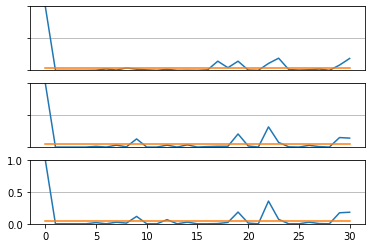

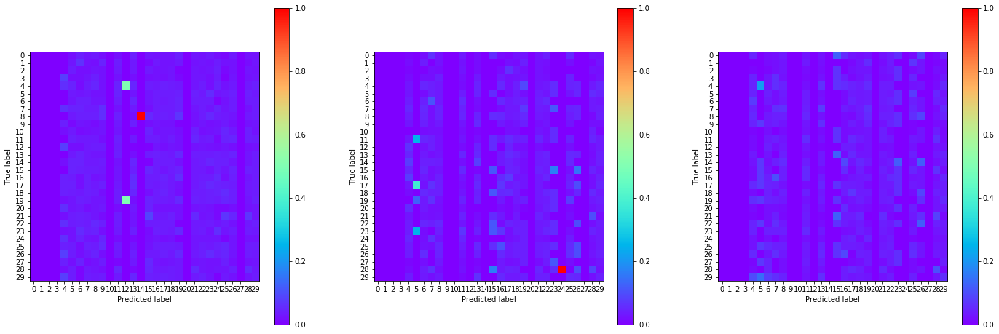

13:09:46.832233
#001 [Train: 3.362] [Test: 3.279] [Valid: 3.261]
#001 [Train: 0.057] [Test: 0.077] [Valid: 0.076]


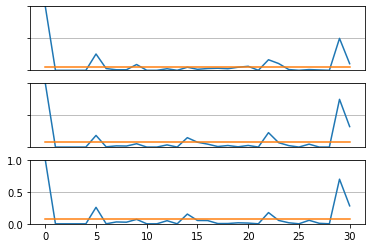

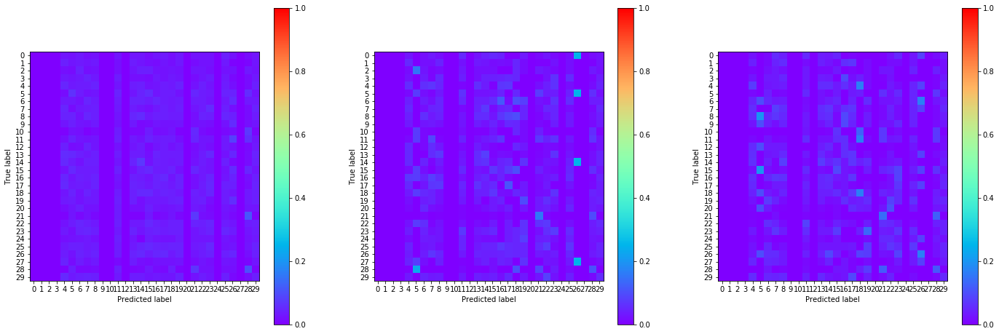

13:10:51.826360
#002 [Train: 3.215] [Test: 3.148] [Valid: 3.108]
#002 [Train: 0.085] [Test: 0.097] [Valid: 0.101]


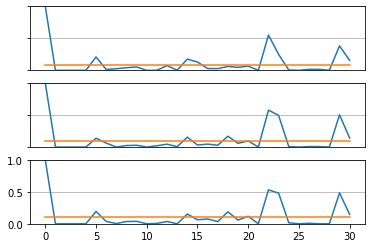

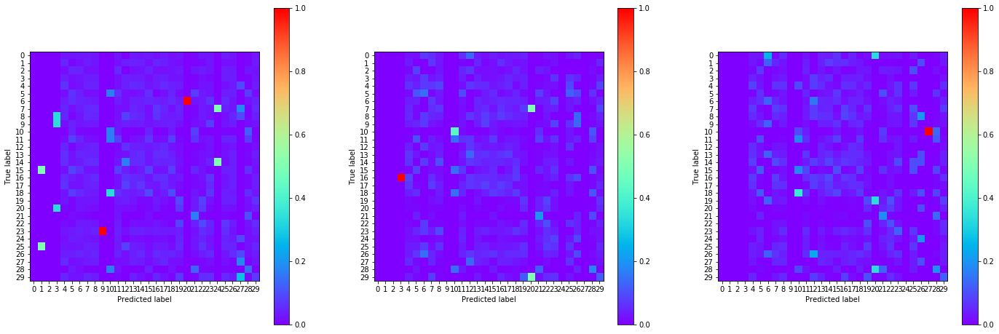

13:11:59.281683
#003 [Train: 3.077] [Test: 3.024] [Valid: 2.975]
#003 [Train: 0.109] [Test: 0.116] [Valid: 0.125]


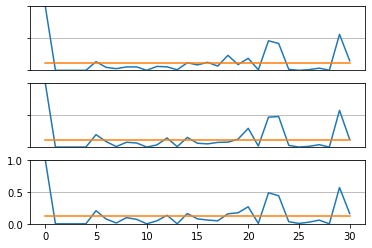

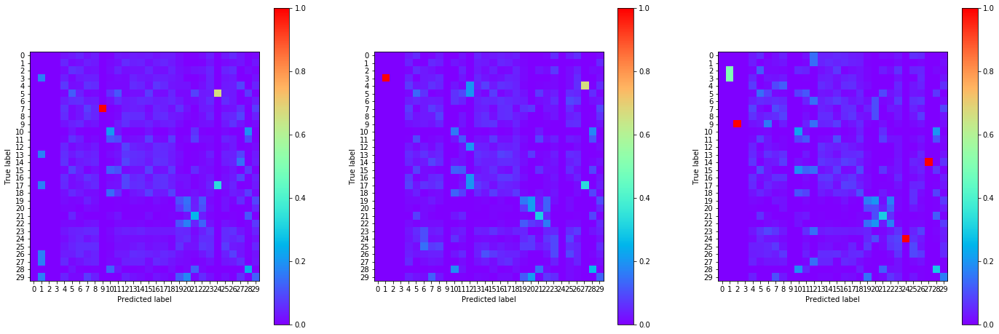

13:13:05.218726
#004 [Train: 2.959] [Test: 2.912] [Valid: 2.867]
#004 [Train: 0.127] [Test: 0.140] [Valid: 0.144]


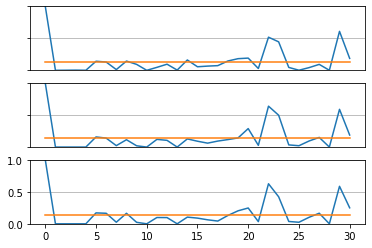

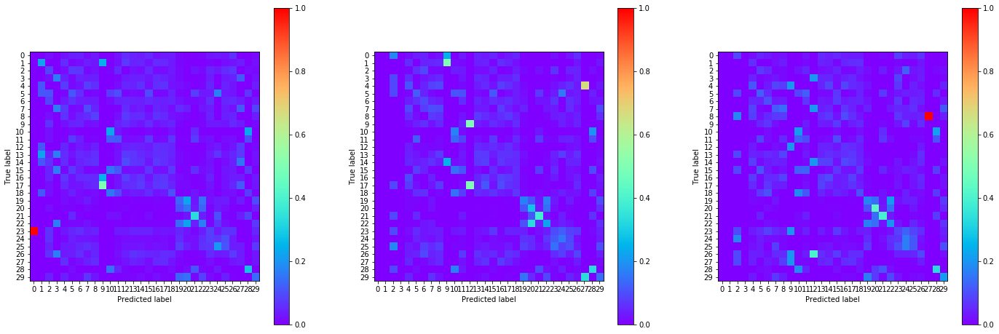

13:14:11.343996
#005 [Train: 2.854] [Test: 2.816] [Valid: 2.767]
#005 [Train: 0.145] [Test: 0.159] [Valid: 0.160]


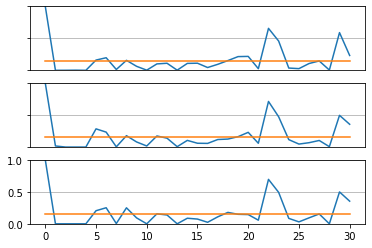

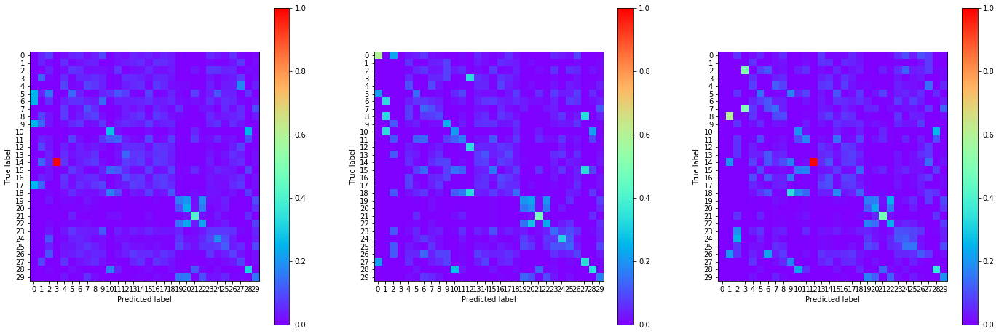

13:15:17.494281
#006 [Train: 2.759] [Test: 2.722] [Valid: 2.681]
#006 [Train: 0.160] [Test: 0.174] [Valid: 0.178]


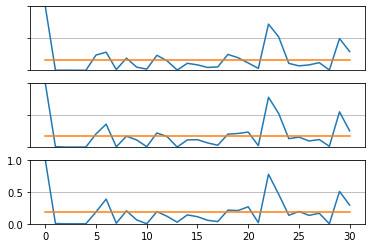

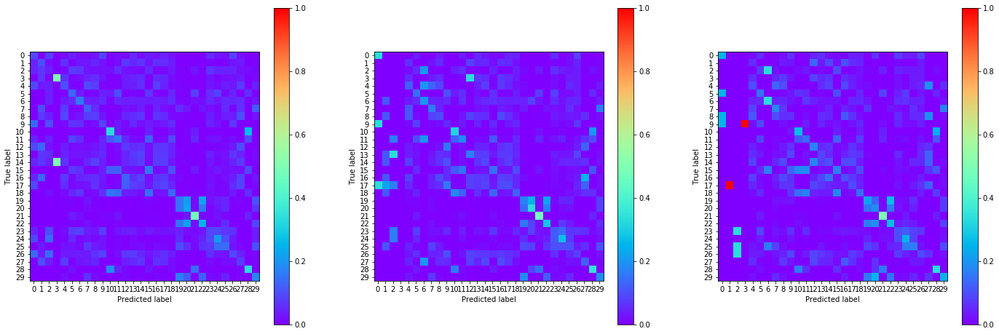

13:16:22.687208
#007 [Train: 2.667] [Test: 2.630] [Valid: 2.580]
#007 [Train: 0.182] [Test: 0.196] [Valid: 0.203]


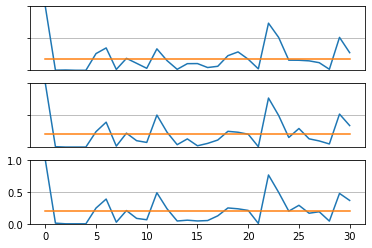

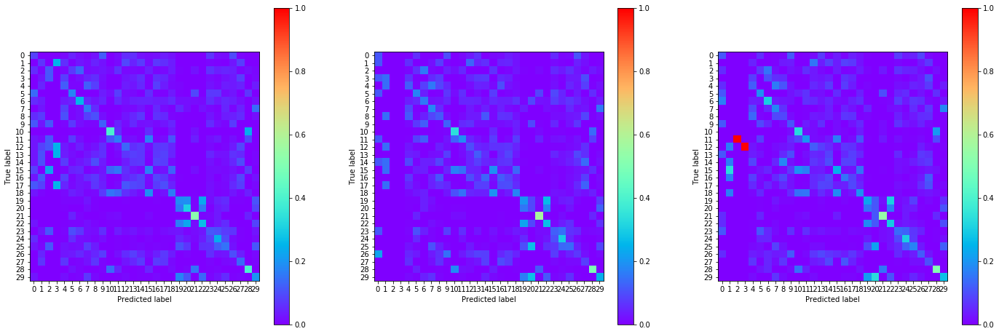

13:17:28.292155
#008 [Train: 2.565] [Test: 2.538] [Valid: 2.486]
#008 [Train: 0.211] [Test: 0.212] [Valid: 0.229]


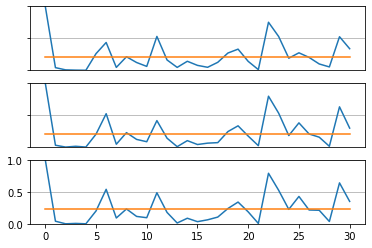

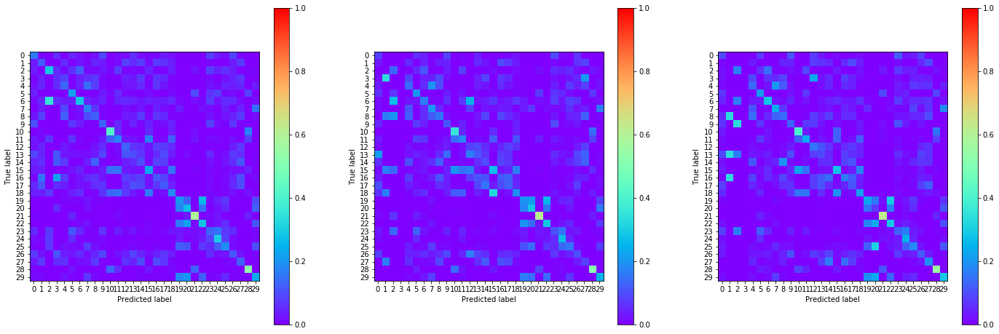

13:18:34.850915
#009 [Train: 2.466] [Test: 2.437] [Valid: 2.379]
#009 [Train: 0.234] [Test: 0.237] [Valid: 0.250]


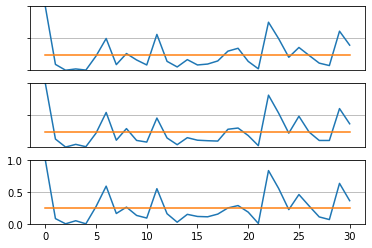

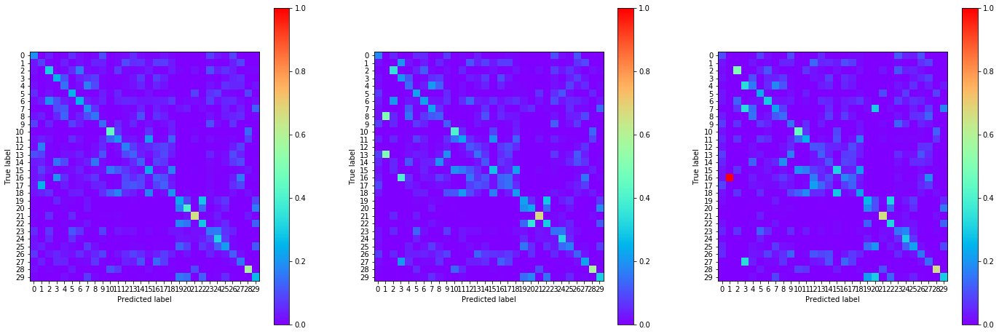

13:19:41.364956
#010 [Train: 2.368] [Test: 2.339] [Valid: 2.284]
#010 [Train: 0.261] [Test: 0.272] [Valid: 0.285]


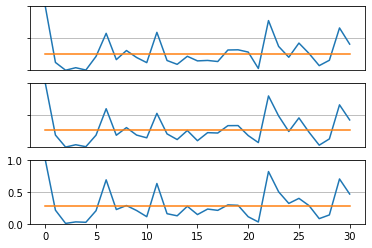

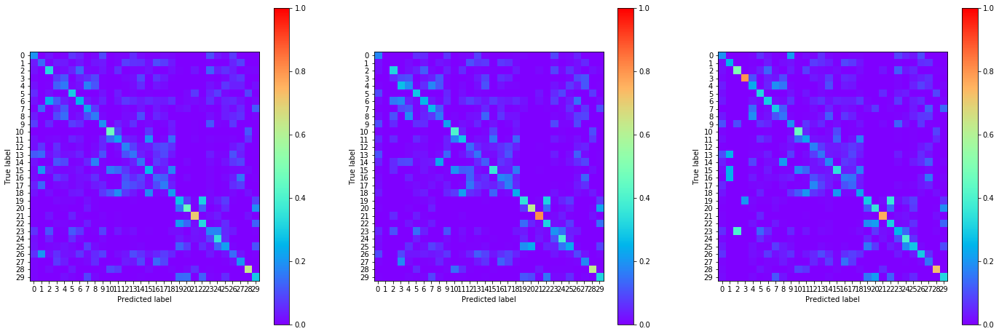

13:20:48.462914
#011 [Train: 2.283] [Test: 2.262] [Valid: 2.210]
#011 [Train: 0.284] [Test: 0.293] [Valid: 0.302]


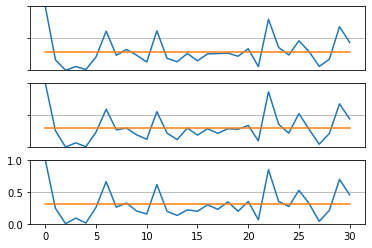

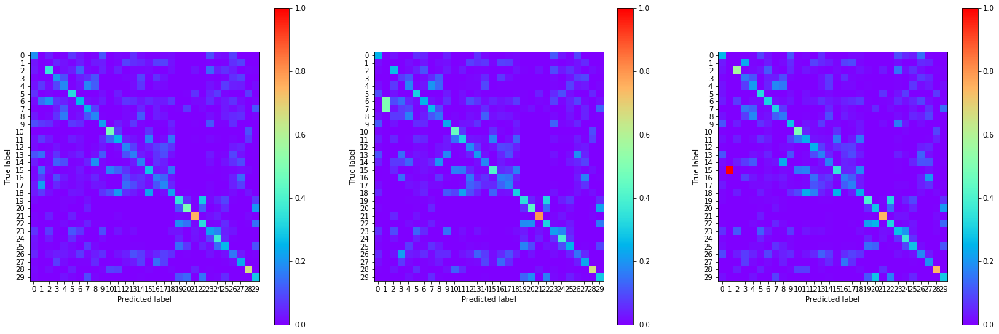

13:21:55.574034
#012 [Train: 2.216] [Test: 2.201] [Valid: 2.142]
#012 [Train: 0.304] [Test: 0.320] [Valid: 0.327]


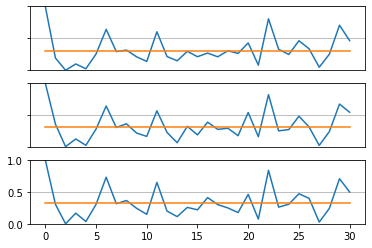

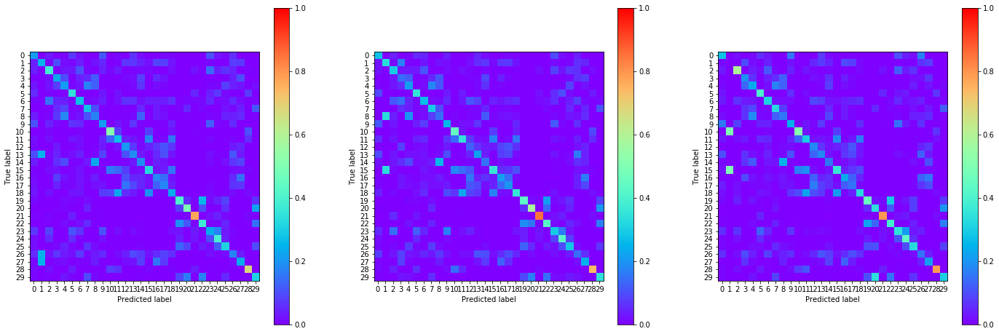

13:23:02.338764
#013 [Train: 2.138] [Test: 2.135] [Valid: 2.084]
#013 [Train: 0.330] [Test: 0.344] [Valid: 0.352]


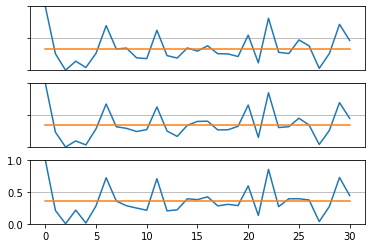

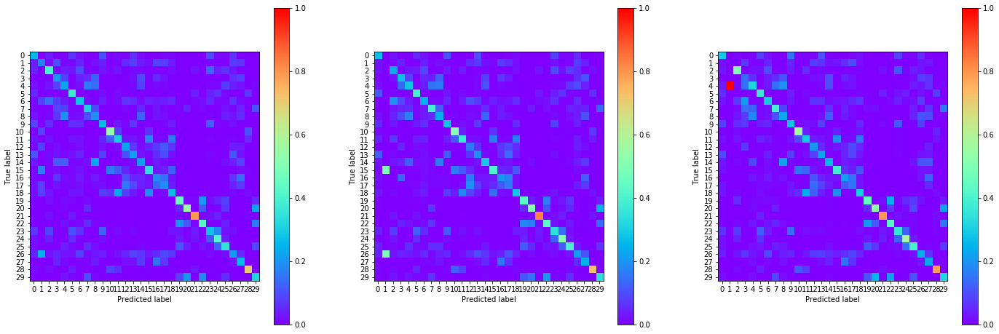

13:24:08.938973
#014 [Train: 2.069] [Test: 2.065] [Valid: 2.016]
#014 [Train: 0.354] [Test: 0.360] [Valid: 0.372]


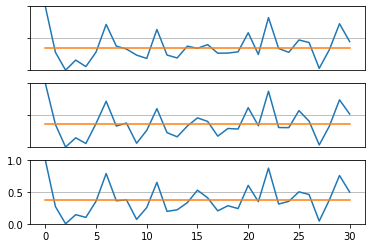

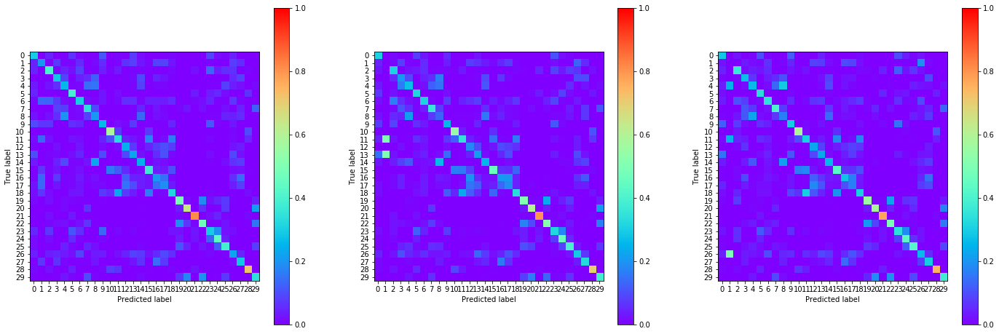

13:25:15.679780
#015 [Train: 1.991] [Test: 2.012] [Valid: 1.969]
#015 [Train: 0.388] [Test: 0.396] [Valid: 0.410]


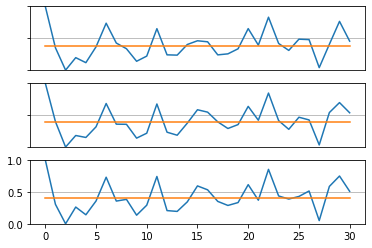

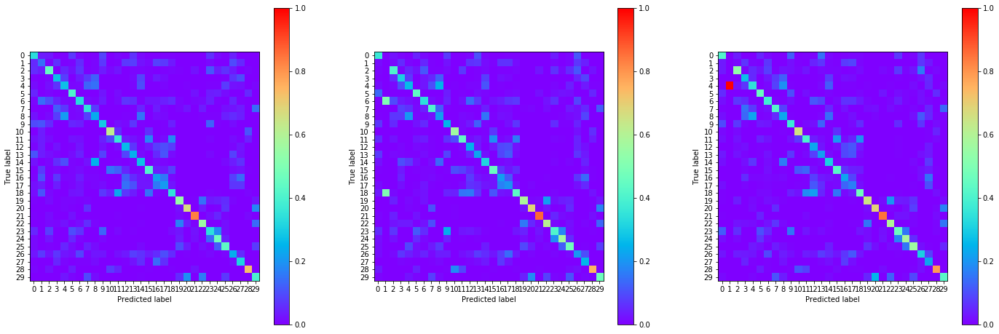

13:26:22.854777
#016 [Train: 1.927] [Test: 1.929] [Valid: 1.885]
#016 [Train: 0.412] [Test: 0.418] [Valid: 0.434]


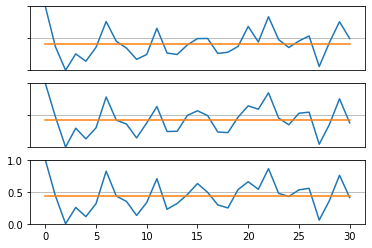

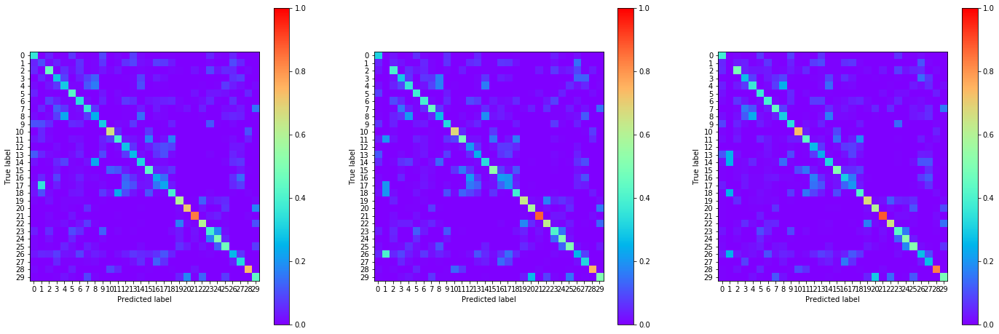

13:27:29.142211
#017 [Train: 1.852] [Test: 1.855] [Valid: 1.806]
#017 [Train: 0.444] [Test: 0.453] [Valid: 0.473]


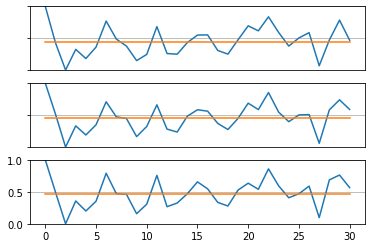

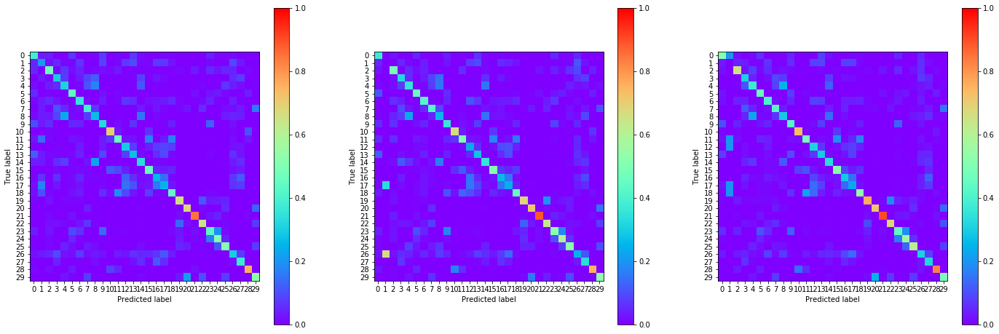

13:28:34.464049
#018 [Train: 1.777] [Test: 1.781] [Valid: 1.729]
#018 [Train: 0.475] [Test: 0.478] [Valid: 0.494]


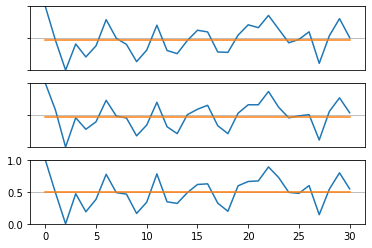

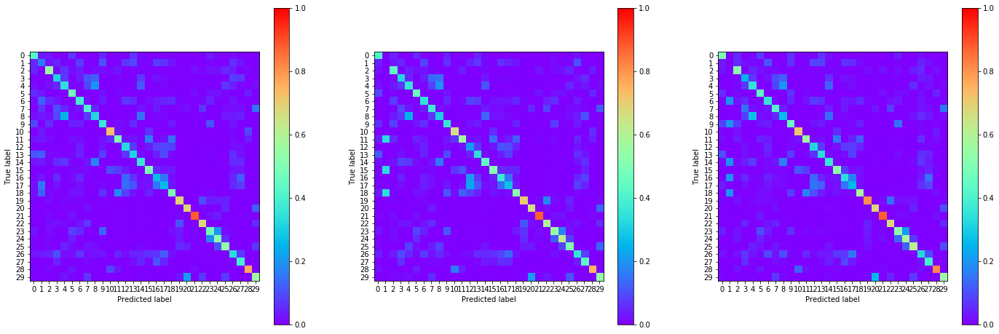

13:29:40.582676
#019 [Train: 1.704] [Test: 1.743] [Valid: 1.698]
#019 [Train: 0.494] [Test: 0.482] [Valid: 0.493]


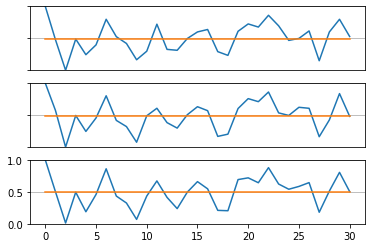

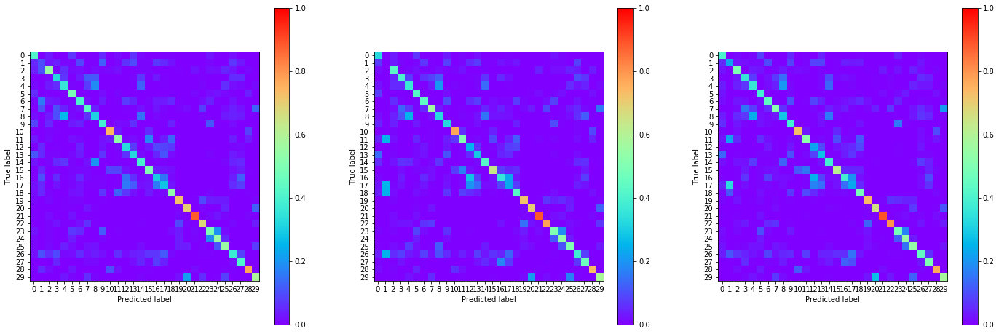

13:30:48.161868
#020 [Train: 1.631] [Test: 1.639] [Valid: 1.593]
#020 [Train: 0.517] [Test: 0.514] [Valid: 0.530]


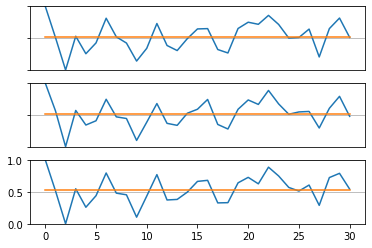

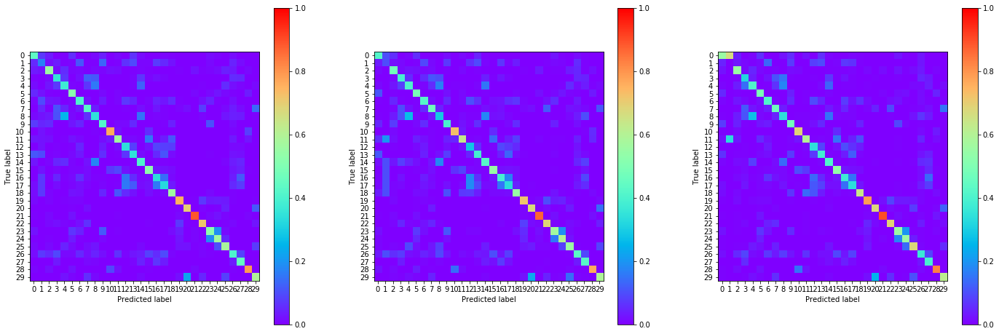

13:31:54.851253
#021 [Train: 1.566] [Test: 1.595] [Valid: 1.530]
#021 [Train: 0.537] [Test: 0.525] [Valid: 0.553]


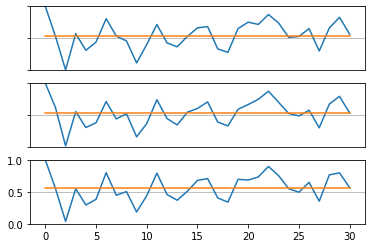

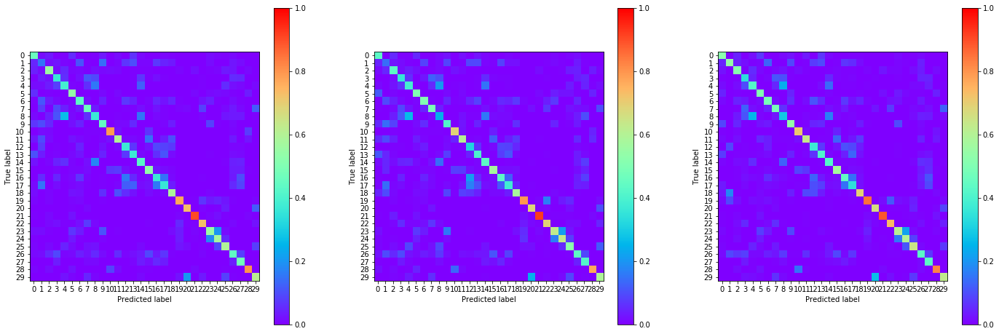

13:33:01.720125
#022 [Train: 1.512] [Test: 1.526] [Valid: 1.479]
#022 [Train: 0.554] [Test: 0.546] [Valid: 0.566]


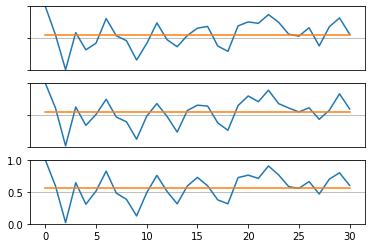

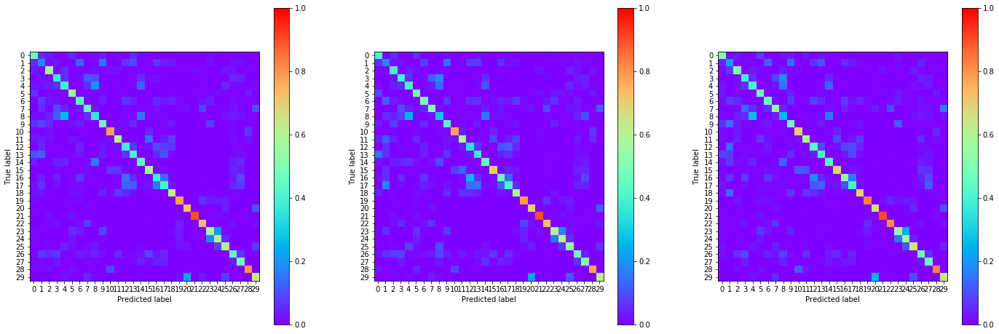

13:34:09.315047
#023 [Train: 1.456] [Test: 1.478] [Valid: 1.430]
#023 [Train: 0.569] [Test: 0.558] [Valid: 0.581]


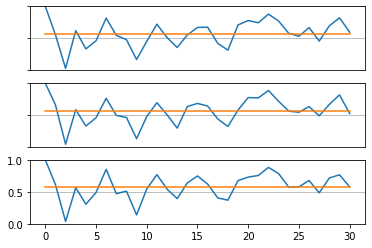

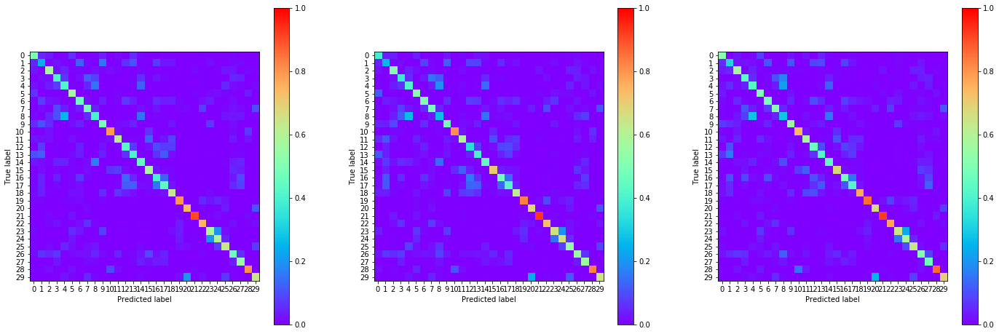

13:35:18.111048
#024 [Train: 1.406] [Test: 1.431] [Valid: 1.388]
#024 [Train: 0.584] [Test: 0.572] [Valid: 0.592]


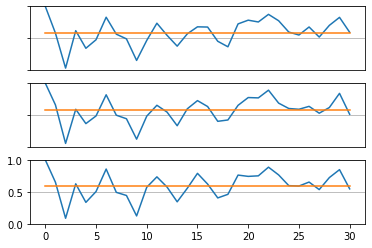

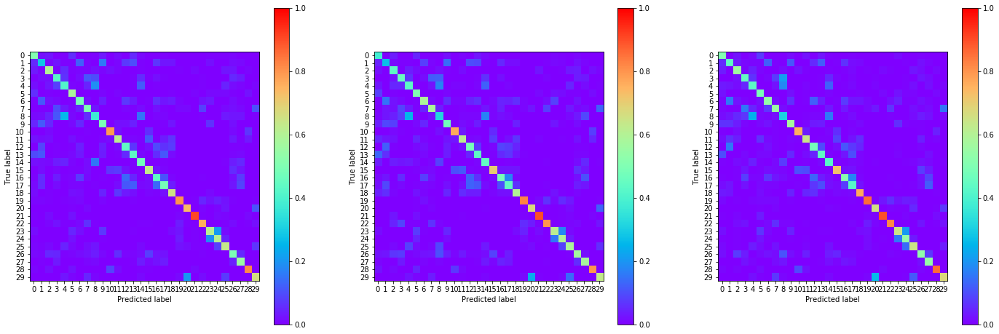

13:36:25.259144
#025 [Train: 1.349] [Test: 1.376] [Valid: 1.339]
#025 [Train: 0.602] [Test: 0.593] [Valid: 0.608]


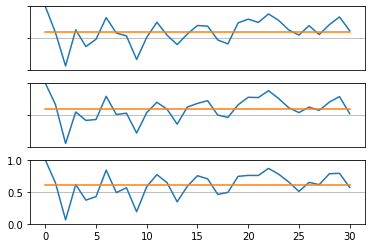

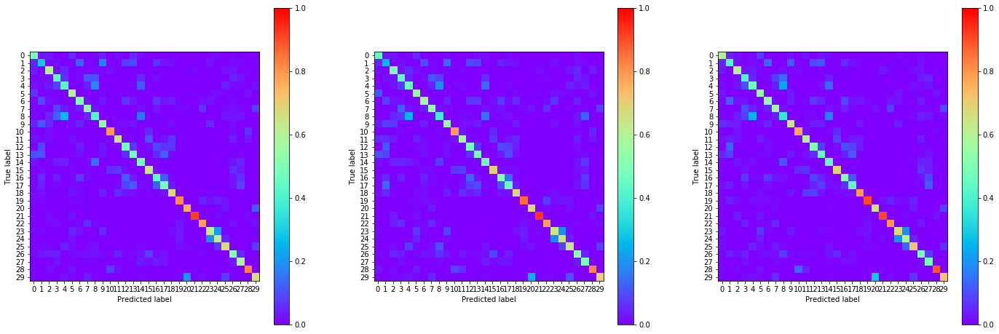

13:37:33.324410
#026 [Train: 1.306] [Test: 1.334] [Valid: 1.293]
#026 [Train: 0.613] [Test: 0.607] [Valid: 0.623]


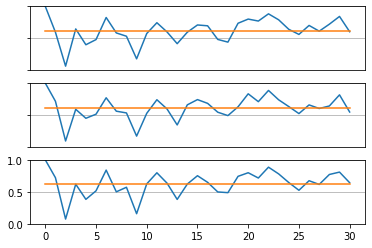

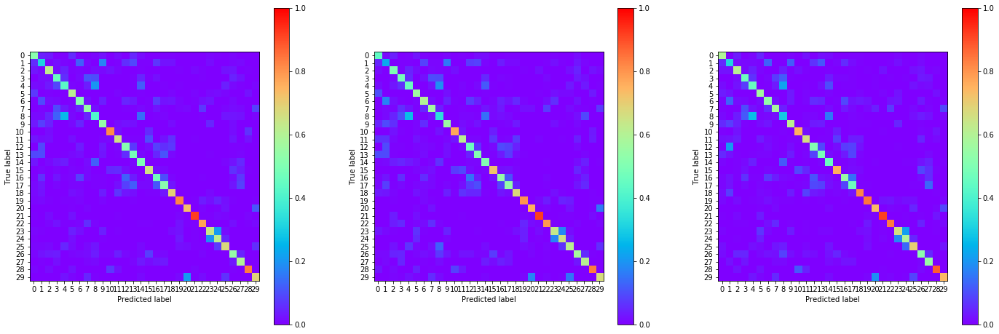

13:38:42.021839
#027 [Train: 1.266] [Test: 1.299] [Valid: 1.253]
#027 [Train: 0.625] [Test: 0.620] [Valid: 0.636]


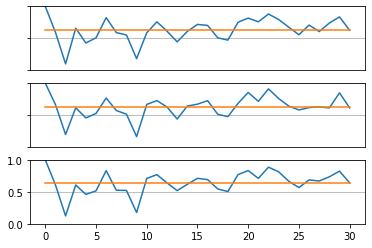

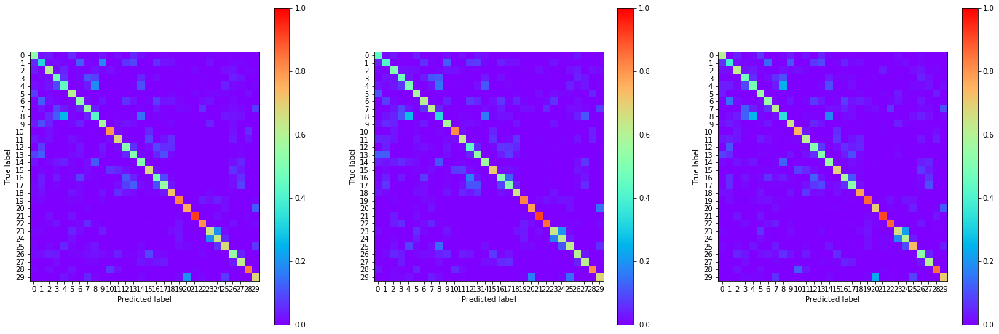

13:39:49.790987
#028 [Train: 1.230] [Test: 1.312] [Valid: 1.264]
#028 [Train: 0.633] [Test: 0.610] [Valid: 0.623]


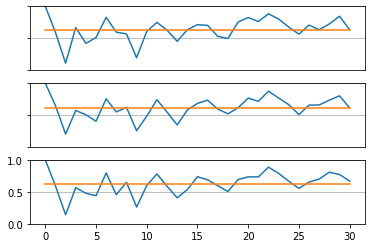

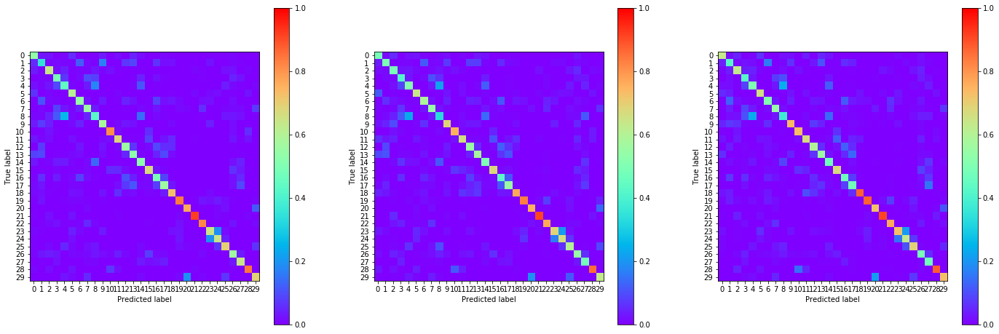

13:40:57.427712
#029 [Train: 1.195] [Test: 1.242] [Valid: 1.199]
#029 [Train: 0.649] [Test: 0.634] [Valid: 0.649]


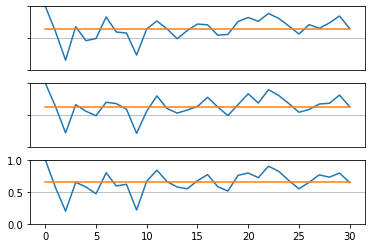

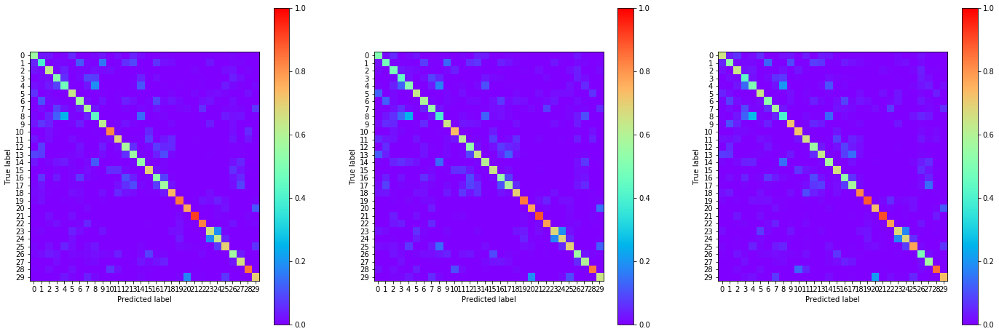

13:42:05.297953
#030 [Train: 1.163] [Test: 1.213] [Valid: 1.167]
#030 [Train: 0.656] [Test: 0.639] [Valid: 0.658]


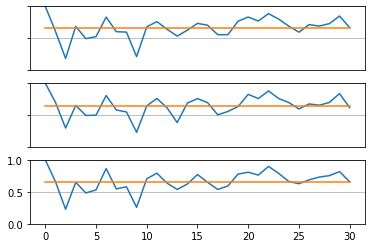

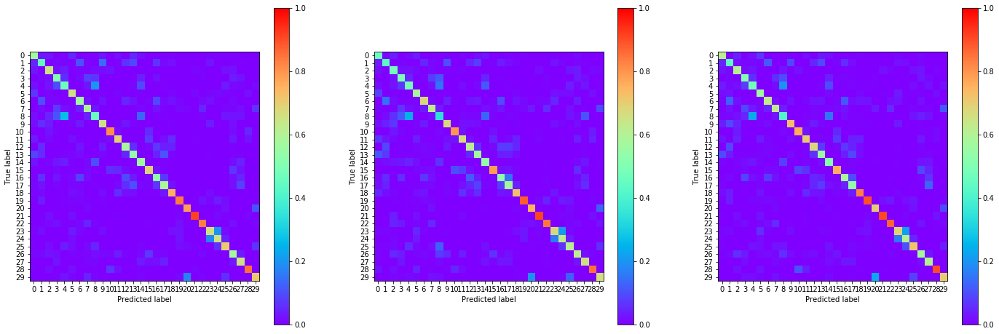

13:43:14.338547
#031 [Train: 1.127] [Test: 1.170] [Valid: 1.129]
#031 [Train: 0.668] [Test: 0.656] [Valid: 0.667]


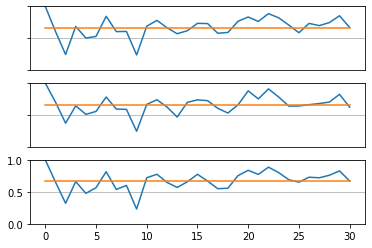

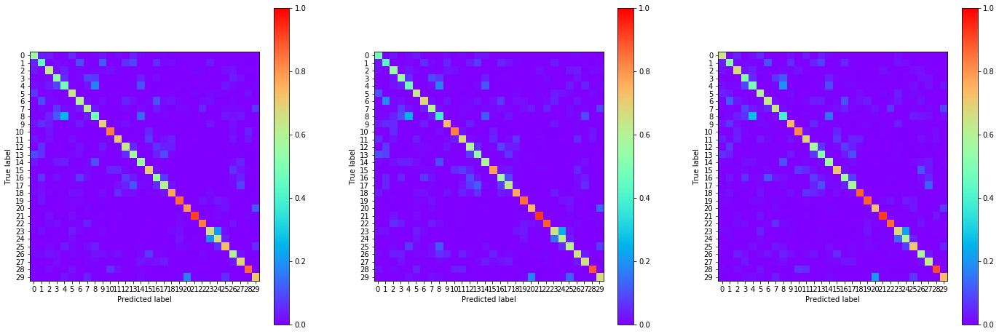

13:44:21.210278
#032 [Train: 1.098] [Test: 1.149] [Valid: 1.118]
#032 [Train: 0.676] [Test: 0.661] [Valid: 0.672]


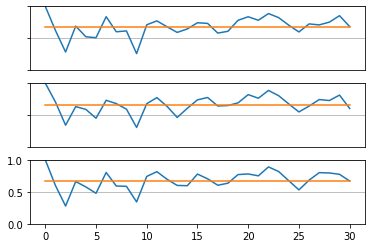

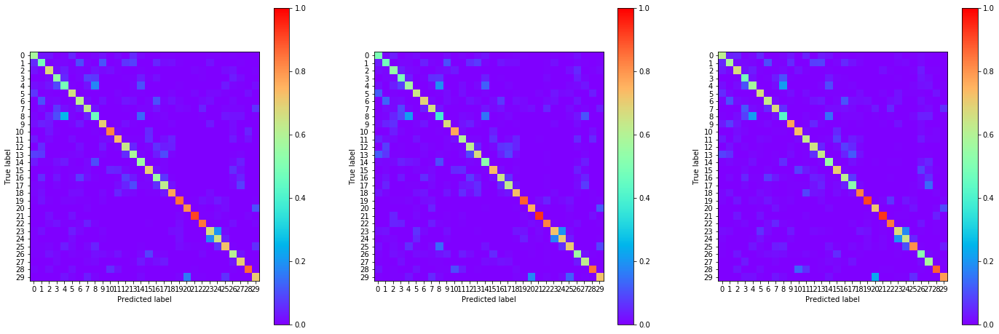

13:45:29.314242
#033 [Train: 1.069] [Test: 1.118] [Valid: 1.077]
#033 [Train: 0.685] [Test: 0.677] [Valid: 0.682]


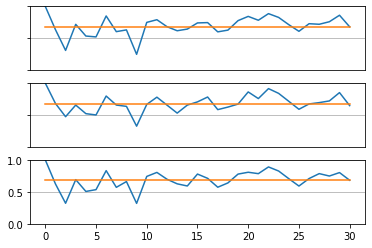

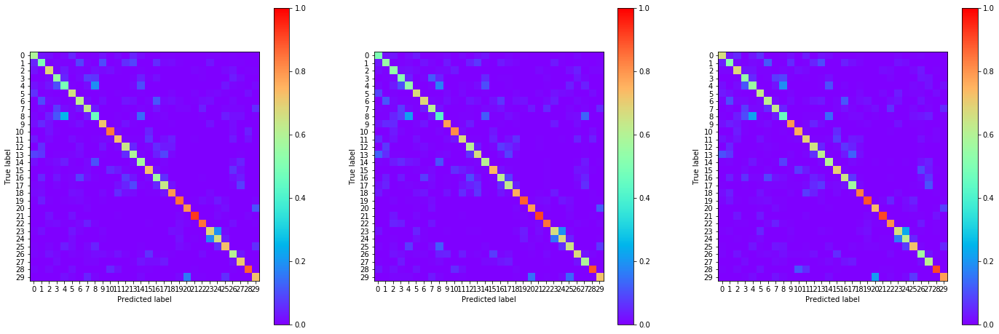

13:46:37.898545
#034 [Train: 1.038] [Test: 1.115] [Valid: 1.076]
#034 [Train: 0.693] [Test: 0.675] [Valid: 0.680]


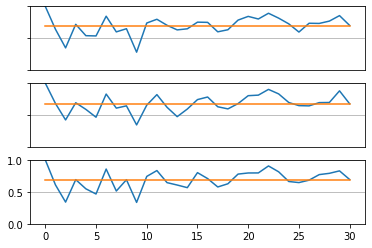

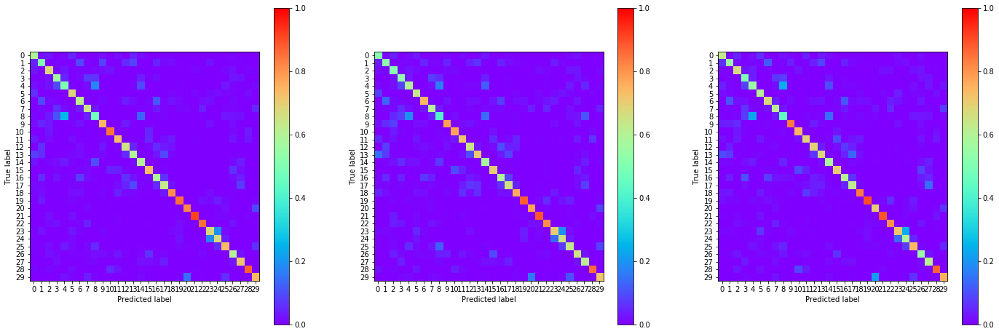

13:47:46.416275
#035 [Train: 1.011] [Test: 1.071] [Valid: 1.037]
#035 [Train: 0.703] [Test: 0.678] [Valid: 0.697]


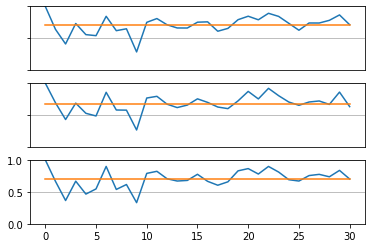

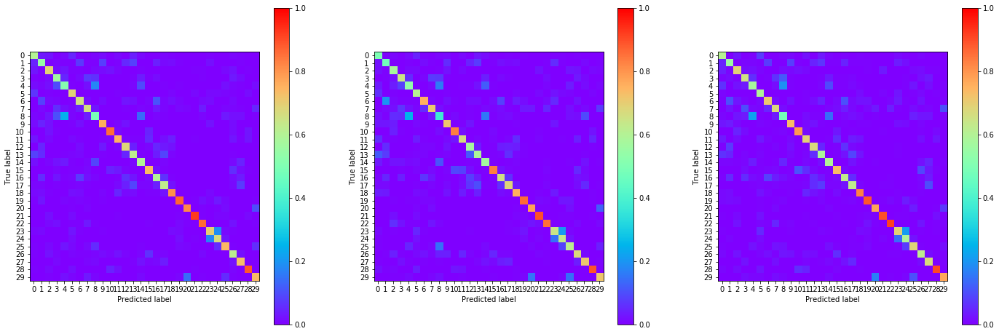

13:48:55.258732
#036 [Train: 0.985] [Test: 1.052] [Valid: 1.025]
#036 [Train: 0.710] [Test: 0.686] [Valid: 0.704]


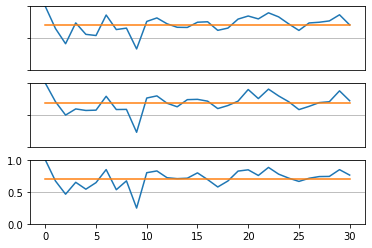

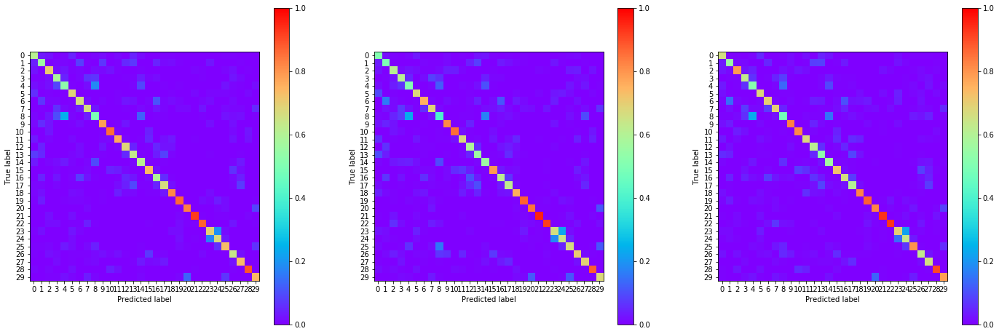

13:50:03.047352
#037 [Train: 0.967] [Test: 1.020] [Valid: 0.998]
#037 [Train: 0.714] [Test: 0.701] [Valid: 0.703]


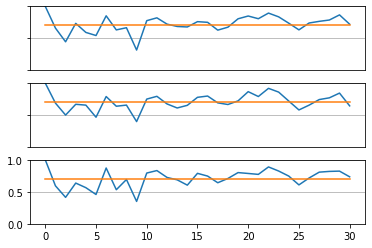

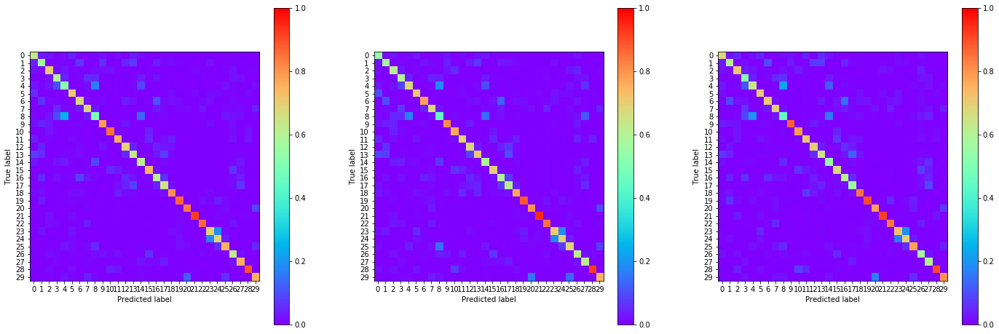

13:51:11.339090
#038 [Train: 0.947] [Test: 1.008] [Valid: 0.967]
#038 [Train: 0.721] [Test: 0.704] [Valid: 0.719]


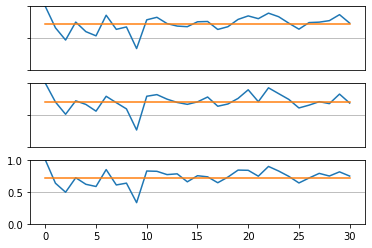

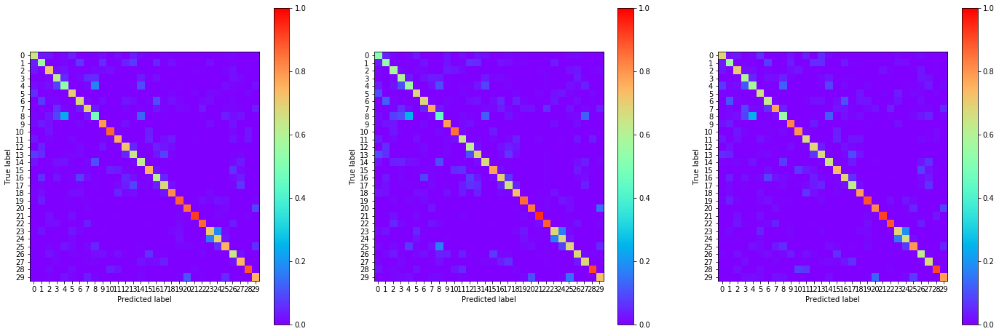

13:52:18.335011
#039 [Train: 0.925] [Test: 0.991] [Valid: 0.964]
#039 [Train: 0.728] [Test: 0.705] [Valid: 0.715]


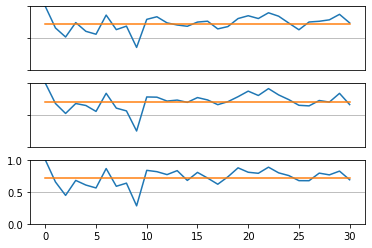

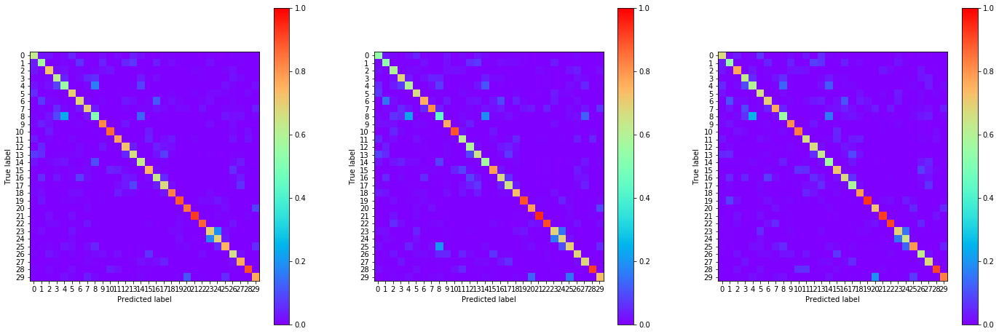

13:53:26.406132
#040 [Train: 0.903] [Test: 0.963] [Valid: 0.939]
#040 [Train: 0.736] [Test: 0.716] [Valid: 0.725]


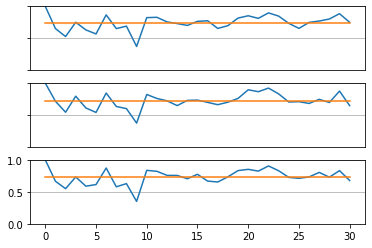

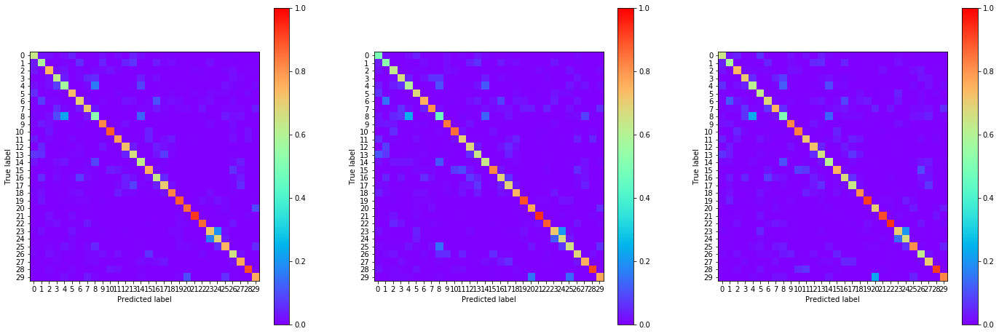

13:54:35.978410
#041 [Train: 0.883] [Test: 0.941] [Valid: 0.917]
#041 [Train: 0.741] [Test: 0.725] [Valid: 0.732]


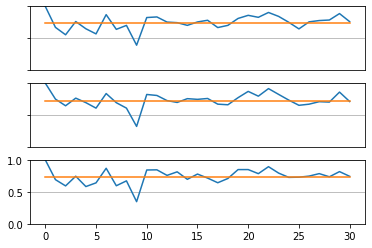

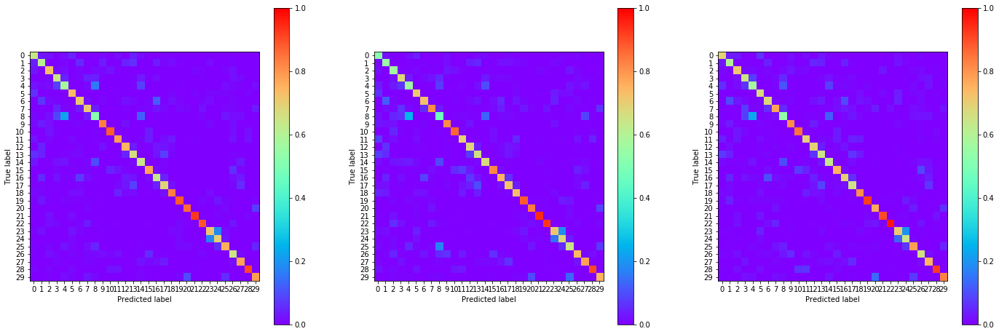

13:55:44.303060
#042 [Train: 0.862] [Test: 0.933] [Valid: 0.889]
#042 [Train: 0.746] [Test: 0.729] [Valid: 0.741]


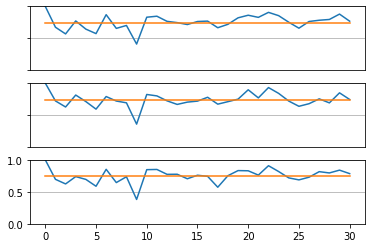

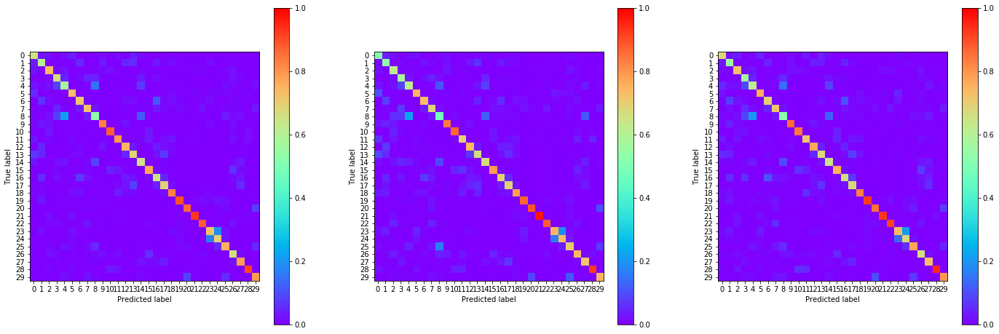

13:56:51.014906
#043 [Train: 0.846] [Test: 0.919] [Valid: 0.873]
#043 [Train: 0.752] [Test: 0.732] [Valid: 0.745]


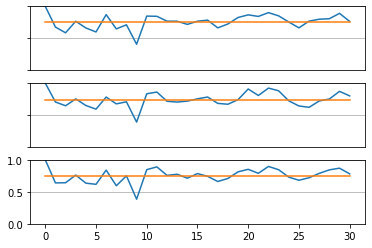

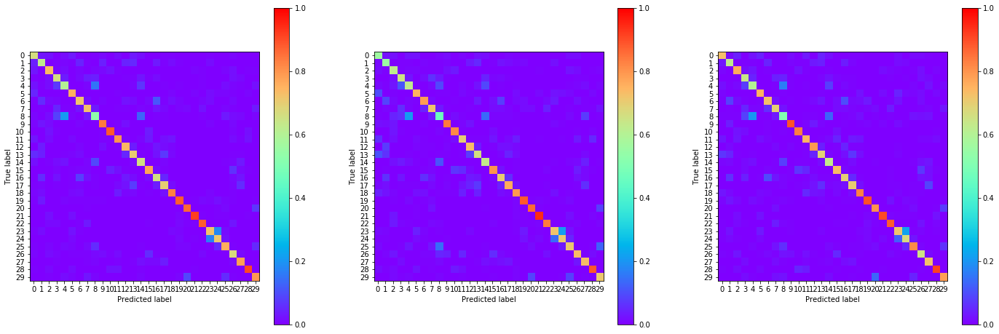

13:57:59.642301
#044 [Train: 0.830] [Test: 0.910] [Valid: 0.871]
#044 [Train: 0.757] [Test: 0.729] [Valid: 0.743]


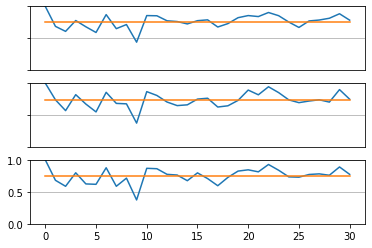

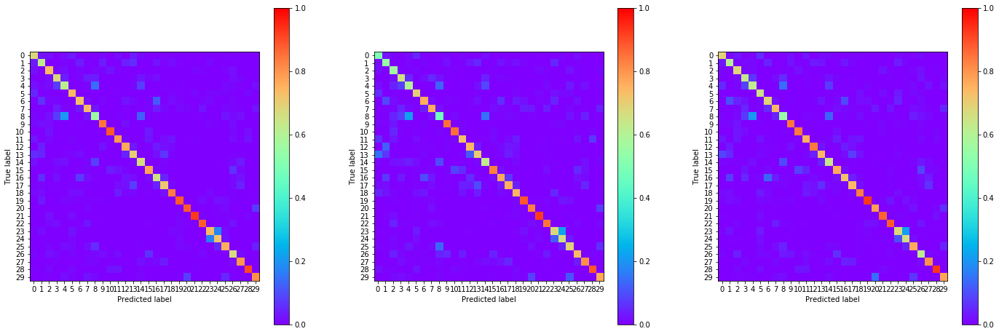

13:59:08.397315
#045 [Train: 0.825] [Test: 0.925] [Valid: 0.884]
#045 [Train: 0.757] [Test: 0.723] [Valid: 0.742]


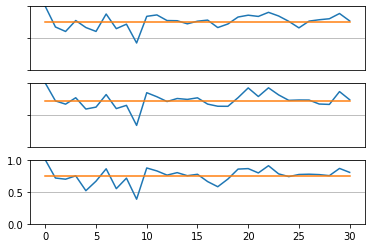

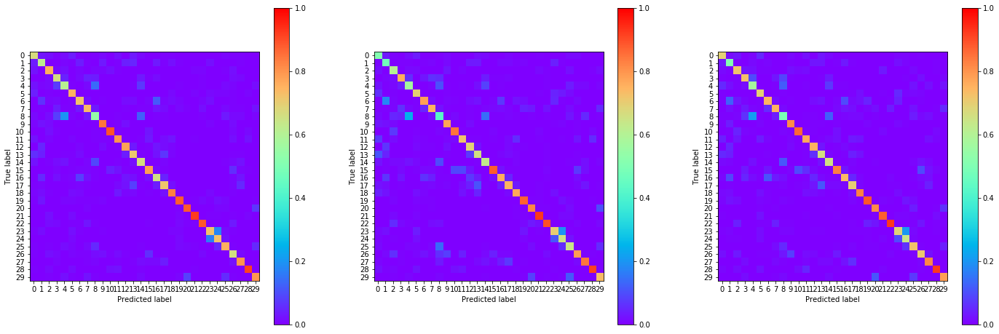

14:00:16.699274
#046 [Train: 0.803] [Test: 0.866] [Valid: 0.832]
#046 [Train: 0.766] [Test: 0.750] [Valid: 0.753]


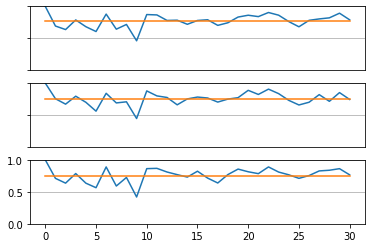

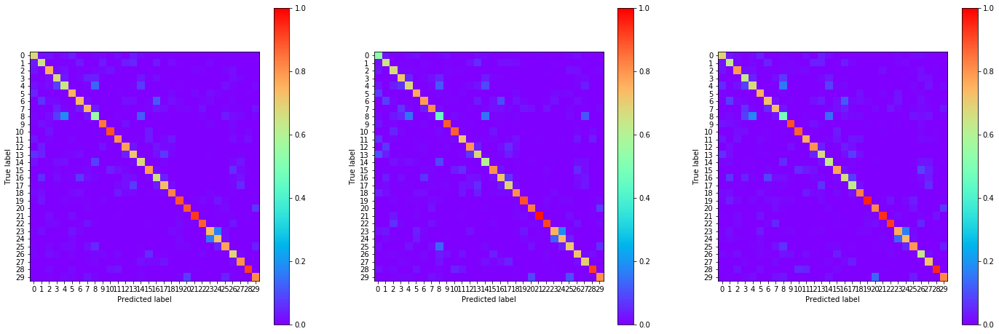

14:01:26.127566
#047 [Train: 0.779] [Test: 0.850] [Valid: 0.821]
#047 [Train: 0.773] [Test: 0.748] [Valid: 0.761]


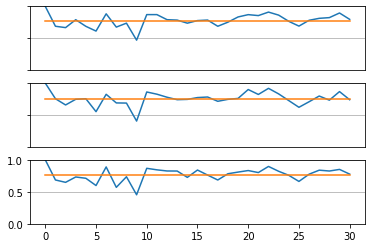

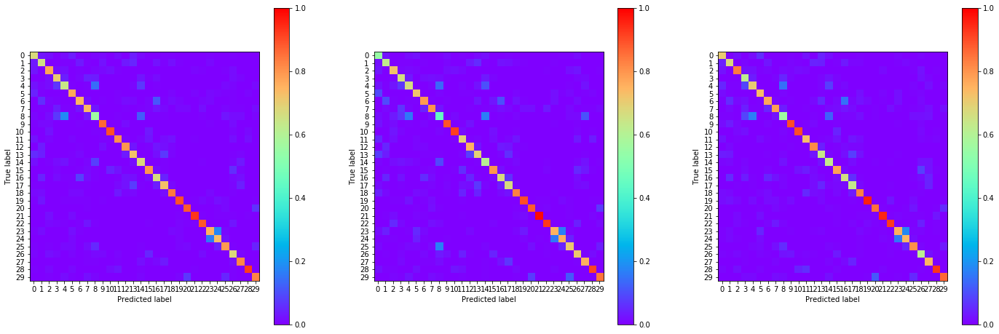

14:02:32.747553
#048 [Train: 0.763] [Test: 0.864] [Valid: 0.835]
#048 [Train: 0.777] [Test: 0.744] [Valid: 0.754]


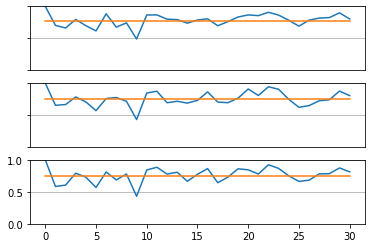

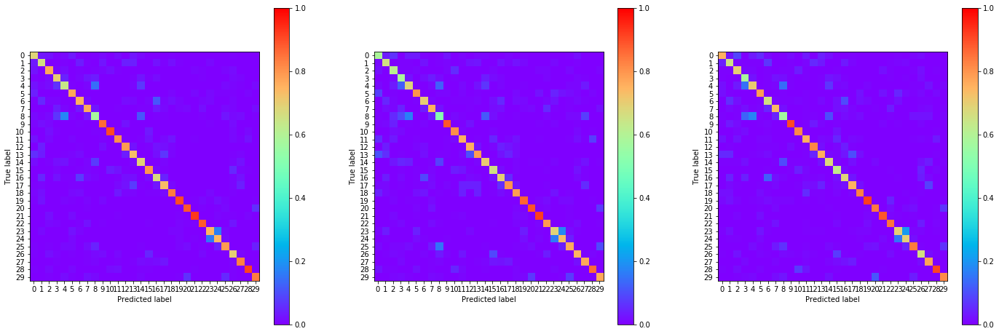

14:03:41.529247
#049 [Train: 0.754] [Test: 0.824] [Valid: 0.800]
#049 [Train: 0.779] [Test: 0.759] [Valid: 0.761]


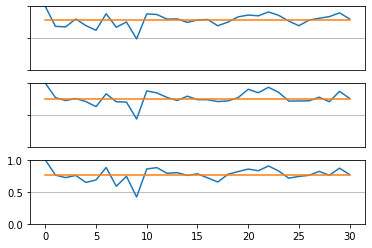

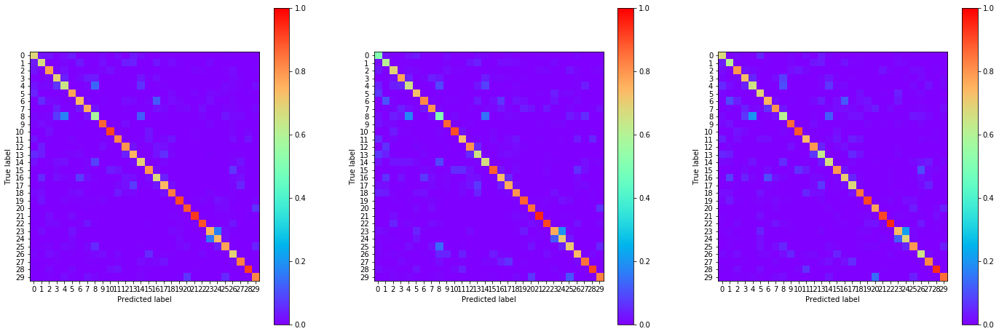

14:04:49.430267
#050 [Train: 0.734] [Test: 0.813] [Valid: 0.795]
#050 [Train: 0.787] [Test: 0.761] [Valid: 0.765]


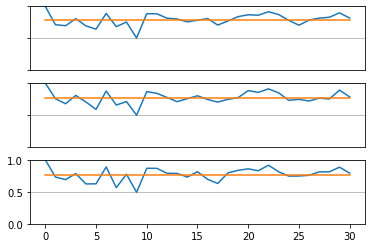

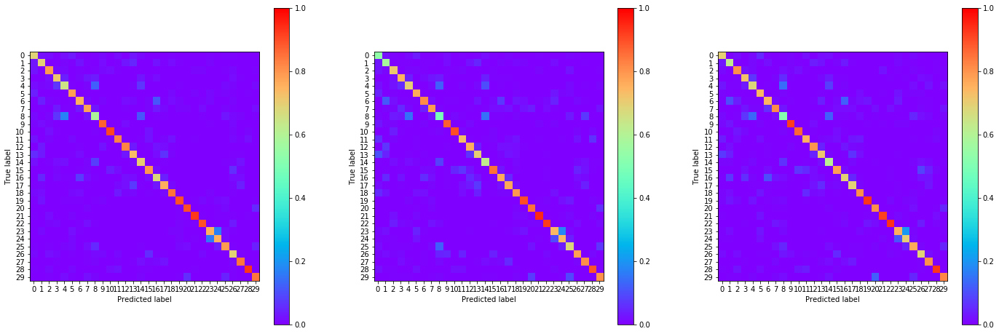

14:05:58.018900
#051 [Train: 0.720] [Test: 0.796] [Valid: 0.775]
#051 [Train: 0.789] [Test: 0.768] [Valid: 0.775]


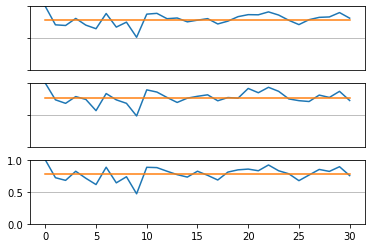

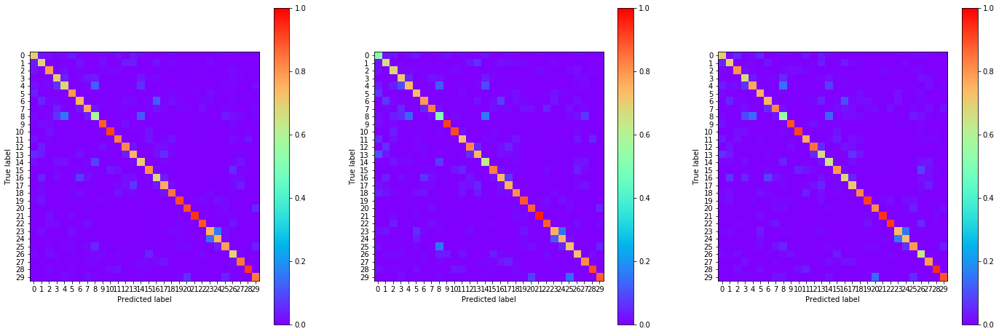

14:07:06.995509
#052 [Train: 0.707] [Test: 0.777] [Valid: 0.760]
#052 [Train: 0.794] [Test: 0.772] [Valid: 0.781]


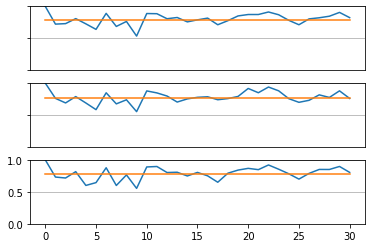

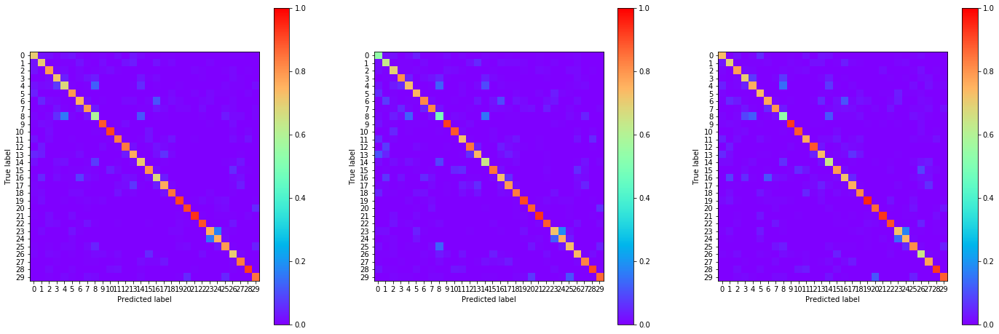

14:08:15.334202
#053 [Train: 0.702] [Test: 0.770] [Valid: 0.752]
#053 [Train: 0.794] [Test: 0.775] [Valid: 0.777]


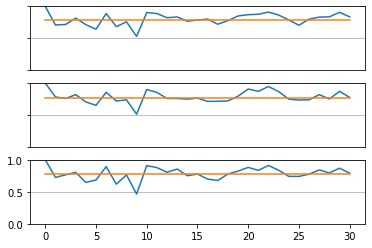

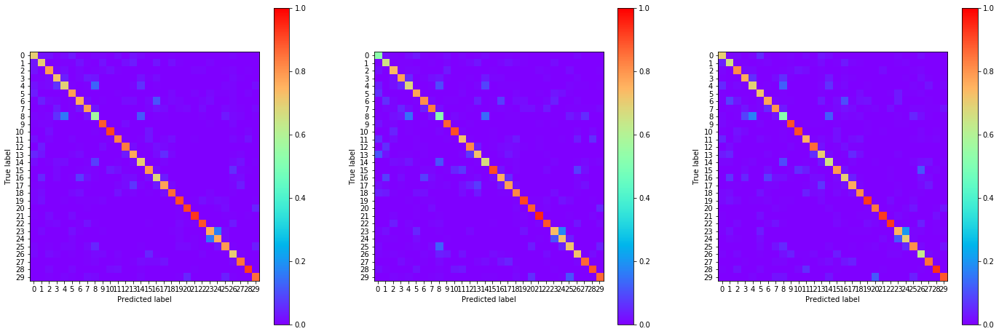

14:09:23.839594
#054 [Train: 0.685] [Test: 0.742] [Valid: 0.734]
#054 [Train: 0.802] [Test: 0.785] [Valid: 0.785]


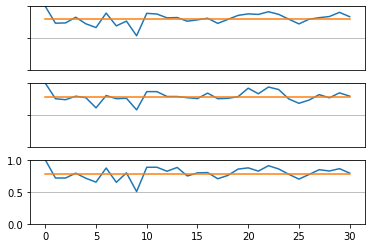

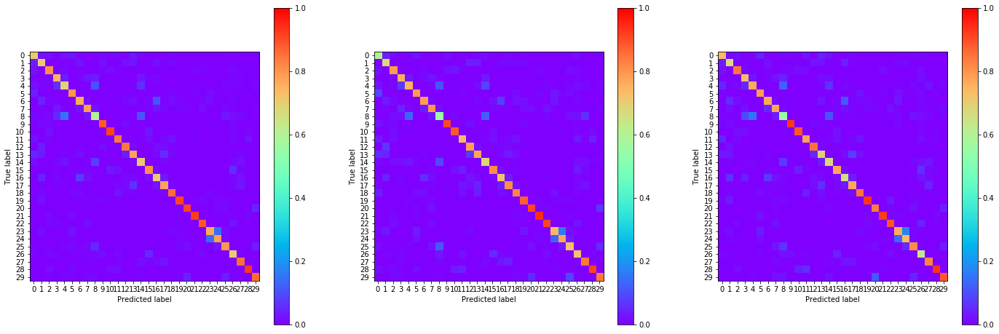

14:10:29.573497
#055 [Train: 0.673] [Test: 0.748] [Valid: 0.731]
#055 [Train: 0.804] [Test: 0.776] [Valid: 0.784]


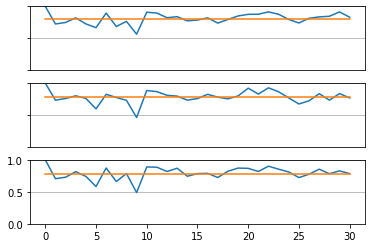

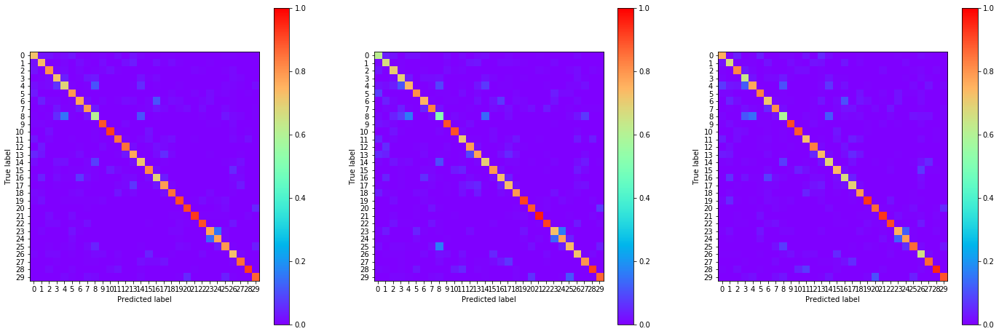

14:11:36.073585
#056 [Train: 0.665] [Test: 0.759] [Valid: 0.734]
#056 [Train: 0.804] [Test: 0.777] [Valid: 0.786]


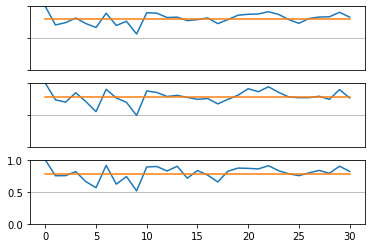

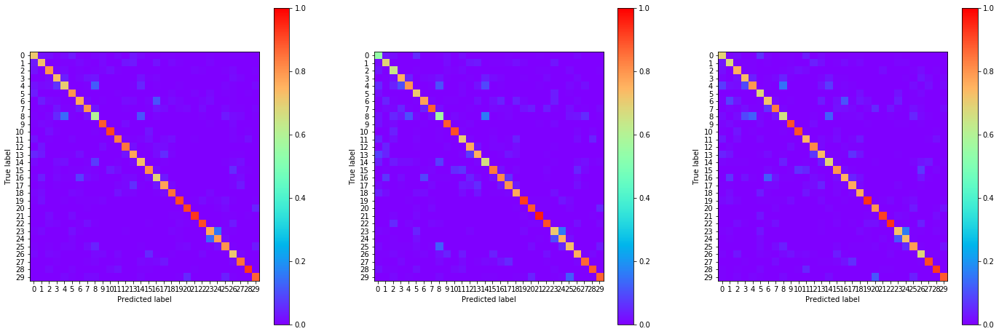

14:12:41.838420
#057 [Train: 0.654] [Test: 0.729] [Valid: 0.700]
#057 [Train: 0.807] [Test: 0.787] [Valid: 0.794]


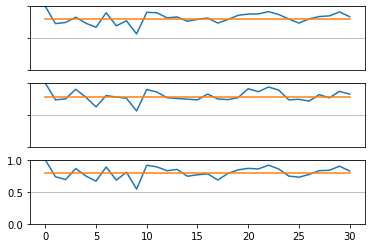

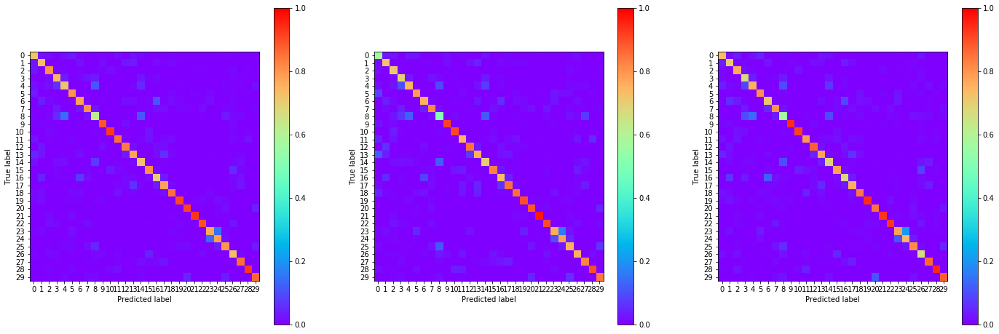

14:13:48.106765
#058 [Train: 0.639] [Test: 0.744] [Valid: 0.704]
#058 [Train: 0.812] [Test: 0.784] [Valid: 0.792]


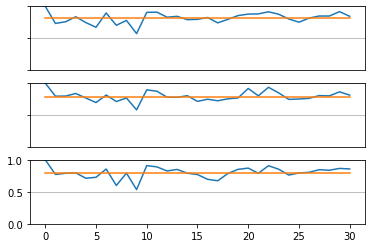

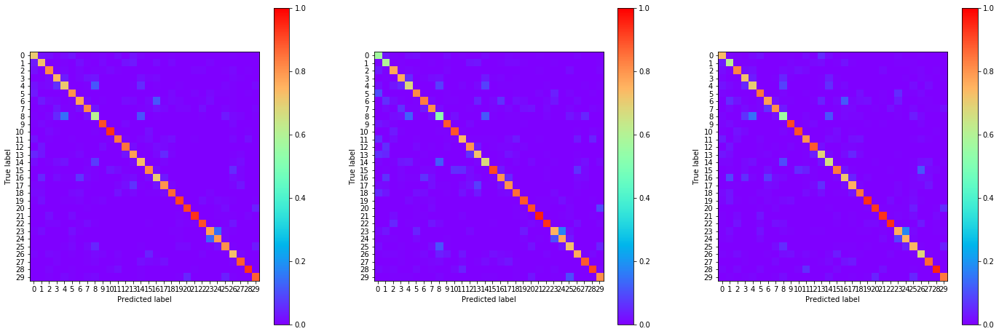

14:14:54.048434
#059 [Train: 0.633] [Test: 0.700] [Valid: 0.691]
#059 [Train: 0.814] [Test: 0.799] [Valid: 0.797]


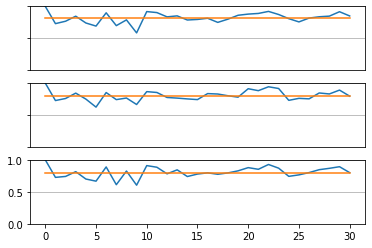

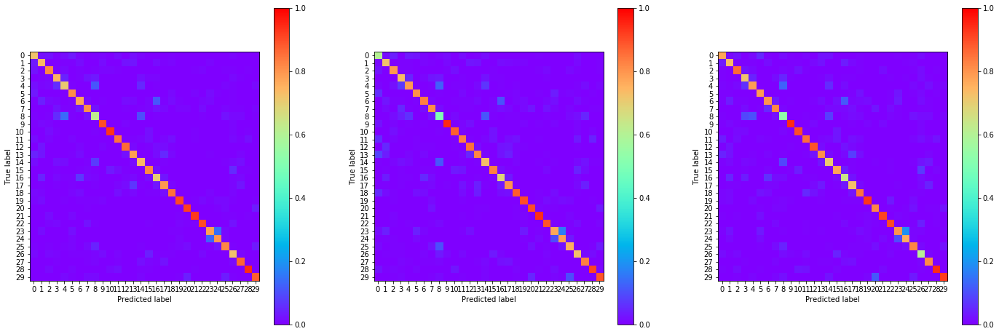

14:16:00.097334
#060 [Train: 0.619] [Test: 0.701] [Valid: 0.684]
#060 [Train: 0.818] [Test: 0.789] [Valid: 0.802]


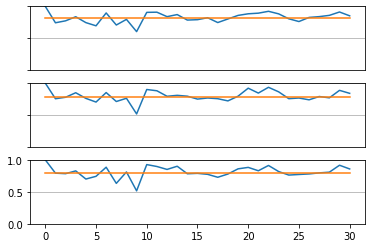

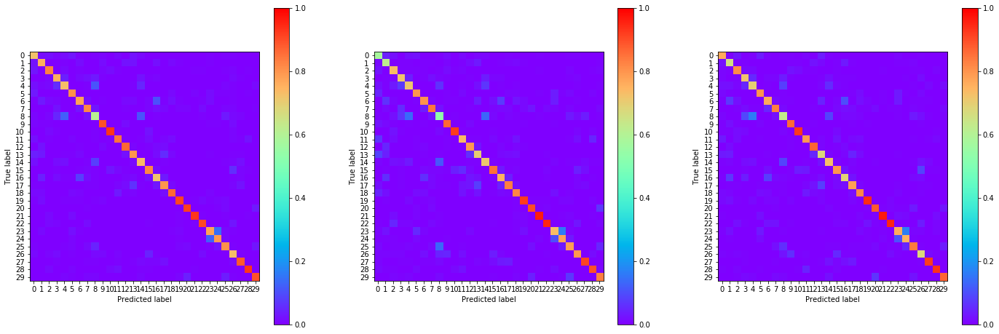

14:17:06.914911
#061 [Train: 0.608] [Test: 0.689] [Valid: 0.661]
#061 [Train: 0.822] [Test: 0.800] [Valid: 0.804]


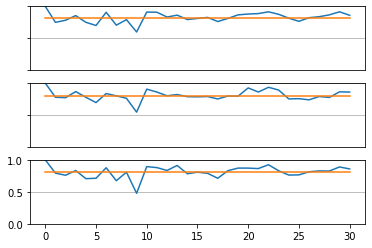

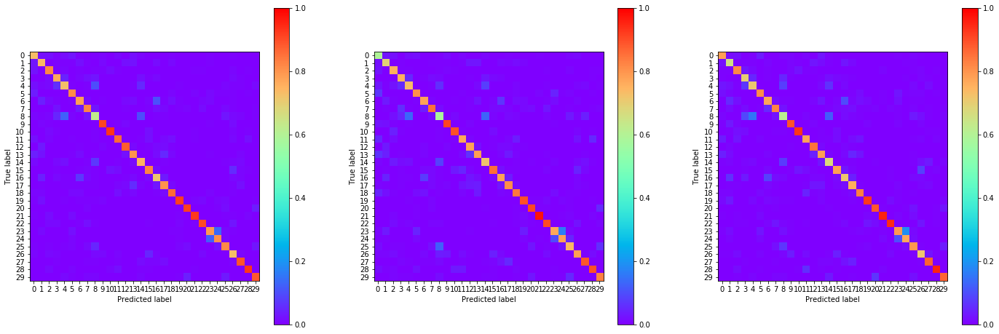

14:18:13.290776
#062 [Train: 0.602] [Test: 0.673] [Valid: 0.655]
#062 [Train: 0.824] [Test: 0.804] [Valid: 0.807]


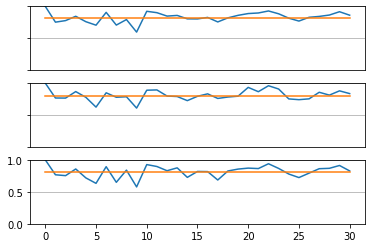

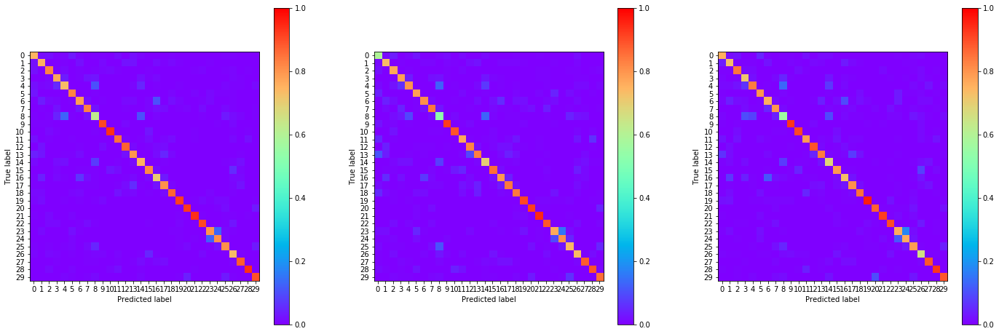

14:19:19.483922
#063 [Train: 0.590] [Test: 0.661] [Valid: 0.644]
#063 [Train: 0.829] [Test: 0.808] [Valid: 0.812]


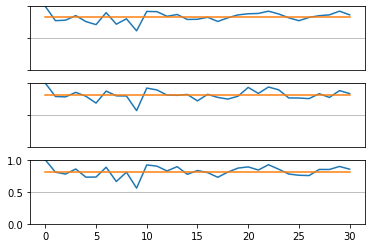

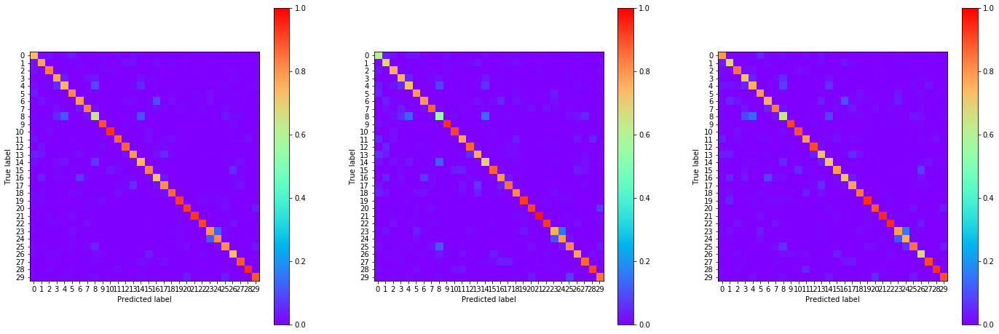

14:20:25.385404
#064 [Train: 0.584] [Test: 0.660] [Valid: 0.644]
#064 [Train: 0.829] [Test: 0.804] [Valid: 0.810]


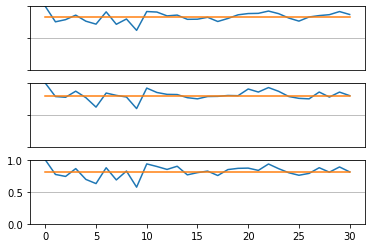

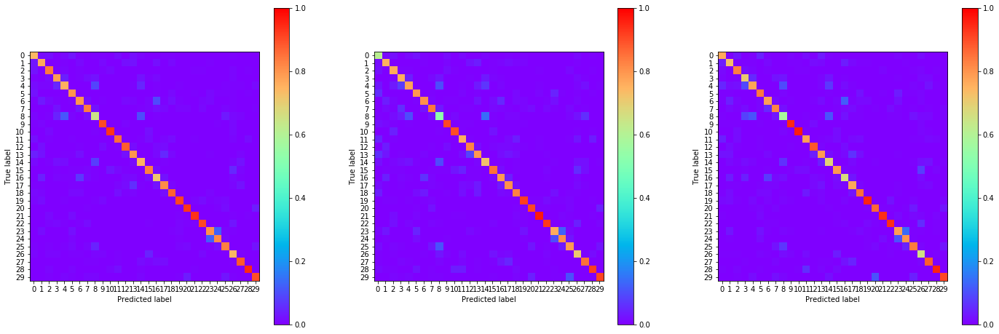

14:21:32.618118
#065 [Train: 0.575] [Test: 0.661] [Valid: 0.637]
#065 [Train: 0.831] [Test: 0.806] [Valid: 0.813]


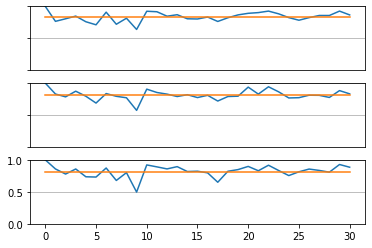

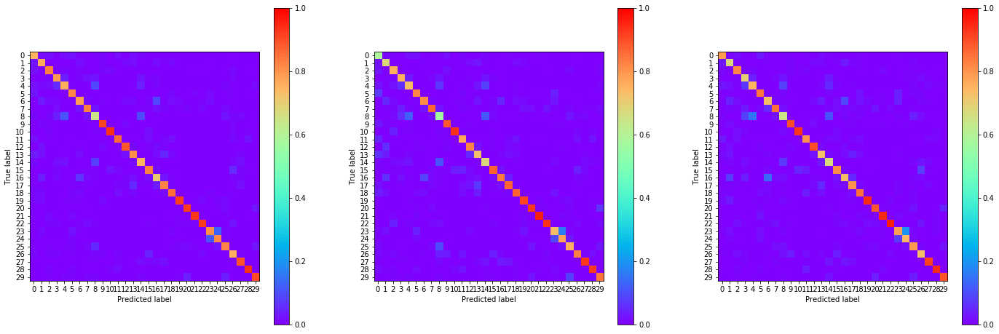

14:22:40.035021
#066 [Train: 0.566] [Test: 0.641] [Valid: 0.624]
#066 [Train: 0.834] [Test: 0.812] [Valid: 0.817]


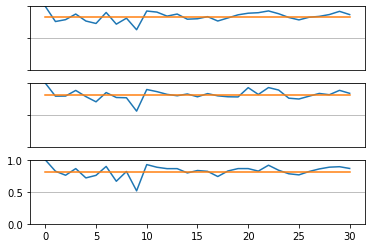

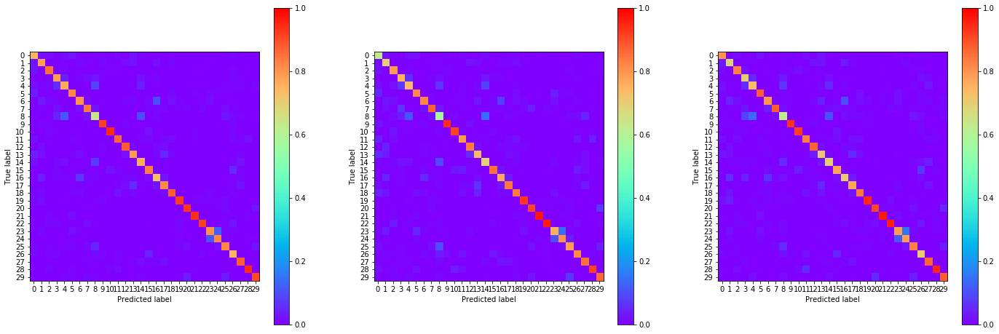

14:23:46.467292
#067 [Train: 0.550] [Test: 0.641] [Valid: 0.631]
#067 [Train: 0.839] [Test: 0.811] [Valid: 0.816]


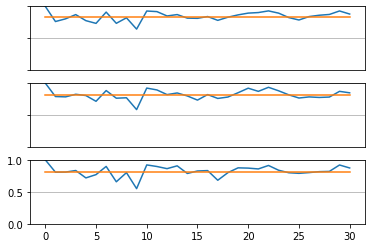

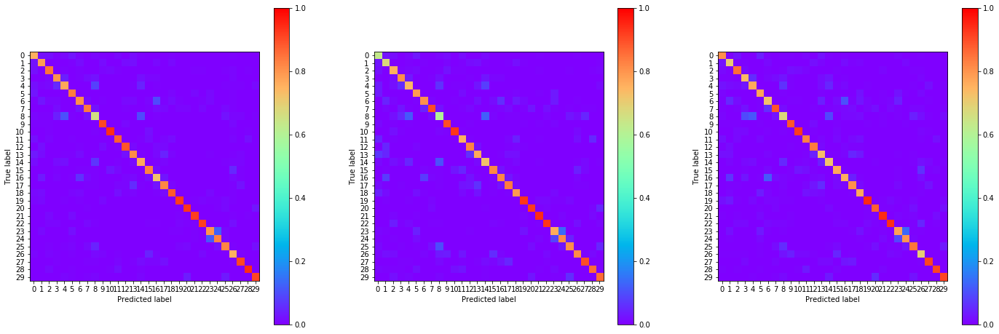

14:24:53.787530
#068 [Train: 0.543] [Test: 0.622] [Valid: 0.608]
#068 [Train: 0.841] [Test: 0.817] [Valid: 0.822]


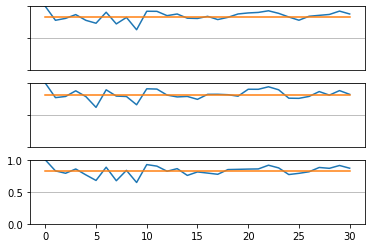

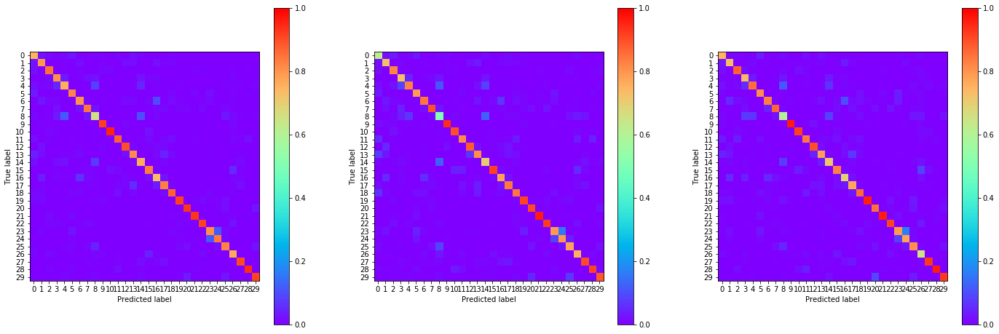

14:26:01.177496
#069 [Train: 0.536] [Test: 0.616] [Valid: 0.598]
#069 [Train: 0.844] [Test: 0.820] [Valid: 0.825]


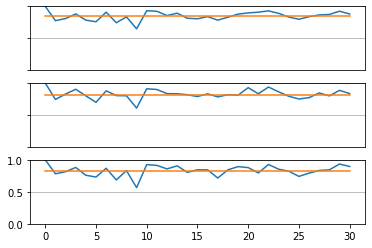

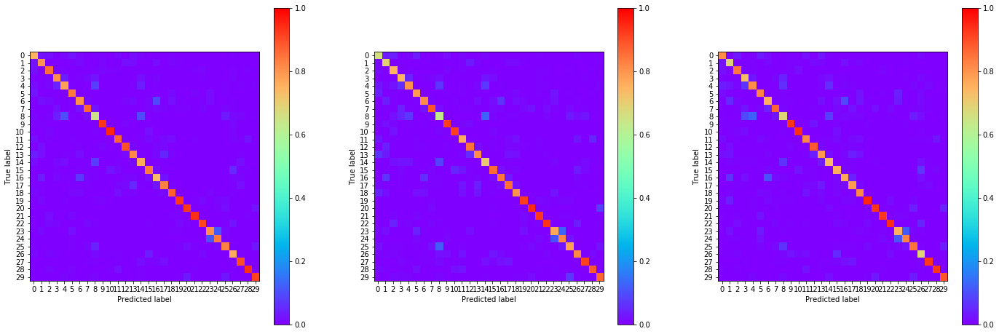

14:27:08.111705
#070 [Train: 0.527] [Test: 0.606] [Valid: 0.591]
#070 [Train: 0.847] [Test: 0.821] [Valid: 0.828]


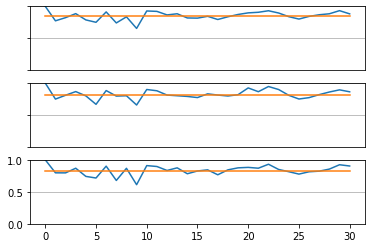

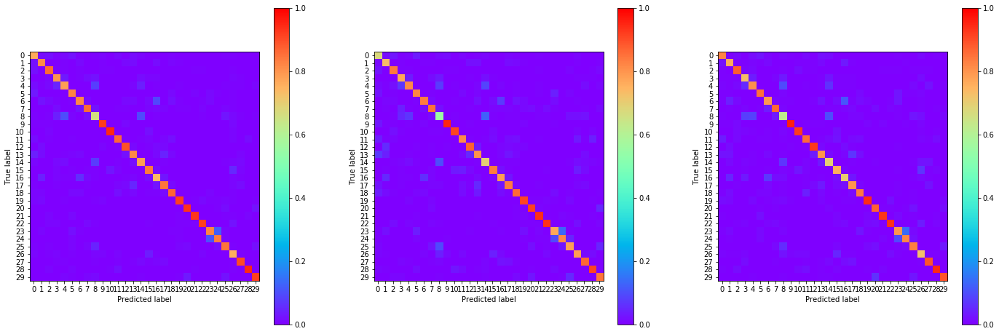

14:28:16.596345
#071 [Train: 0.528] [Test: 0.613] [Valid: 0.591]
#071 [Train: 0.845] [Test: 0.818] [Valid: 0.829]


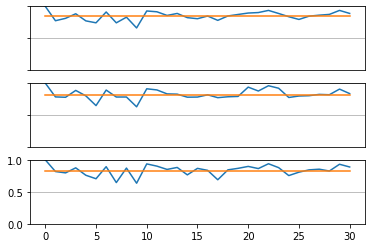

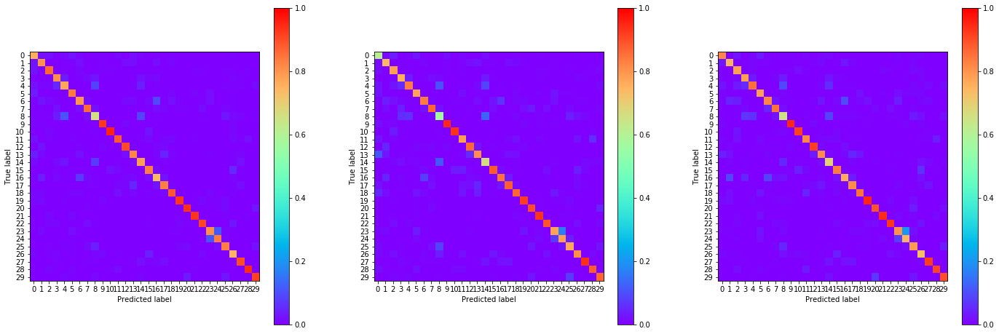

14:29:25.317912
#072 [Train: 0.519] [Test: 0.627] [Valid: 0.605]
#072 [Train: 0.848] [Test: 0.815] [Valid: 0.821]


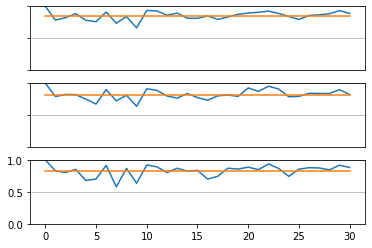

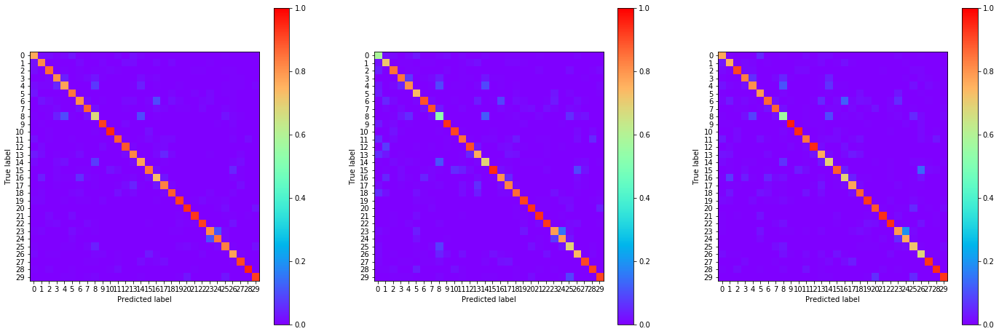

14:30:32.514294
#073 [Train: 0.510] [Test: 0.601] [Valid: 0.593]
#073 [Train: 0.852] [Test: 0.822] [Valid: 0.826]


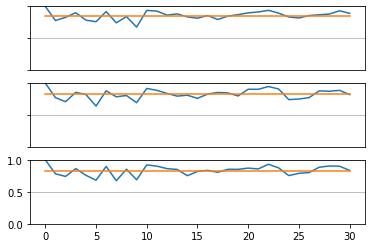

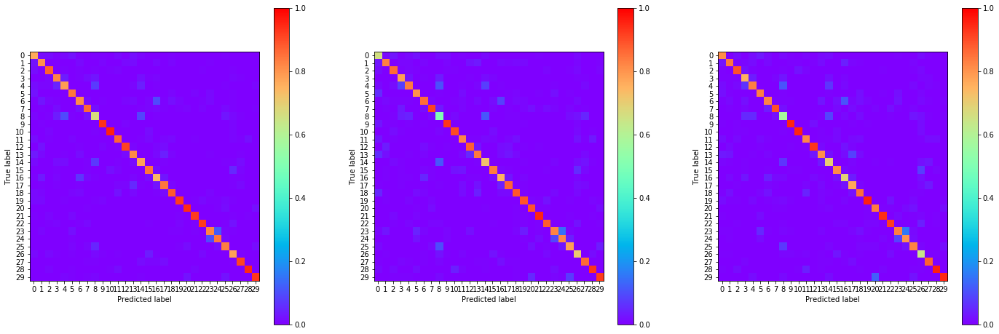

14:31:40.939484
#074 [Train: 0.500] [Test: 0.610] [Valid: 0.572]
#074 [Train: 0.854] [Test: 0.821] [Valid: 0.832]


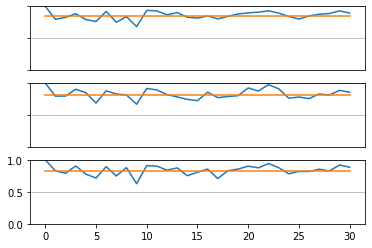

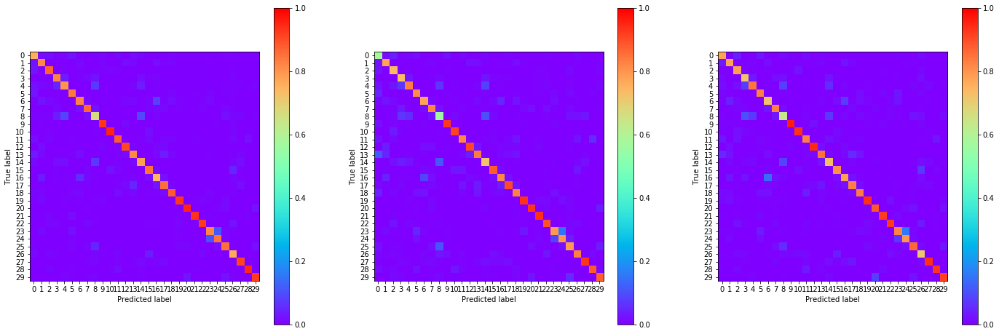

14:32:47.747275
#075 [Train: 0.495] [Test: 0.582] [Valid: 0.556]
#075 [Train: 0.855] [Test: 0.831] [Valid: 0.839]


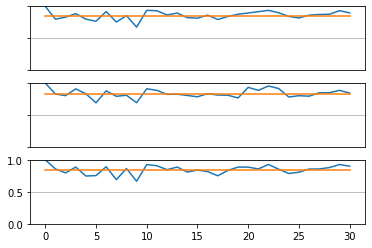

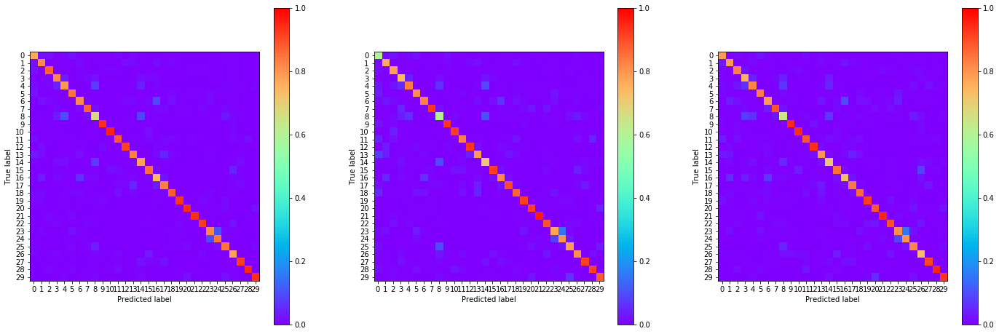

14:33:54.984832
#076 [Train: 0.482] [Test: 0.567] [Valid: 0.571]
#076 [Train: 0.859] [Test: 0.835] [Valid: 0.836]


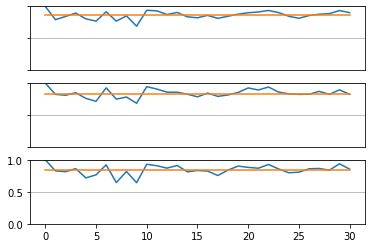

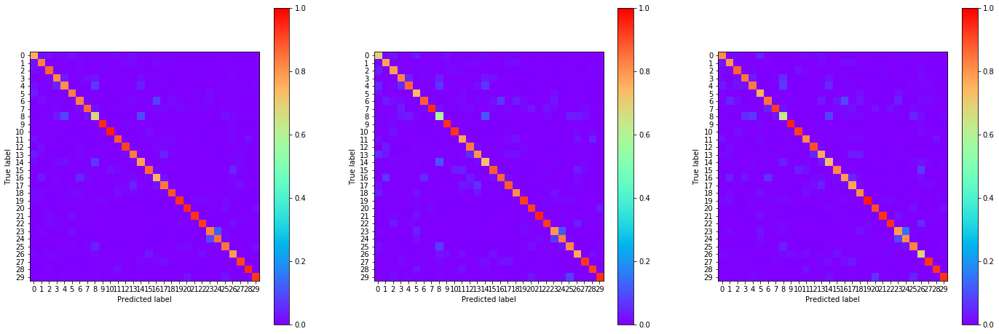

14:35:02.079146
#077 [Train: 0.479] [Test: 0.561] [Valid: 0.545]
#077 [Train: 0.860] [Test: 0.836] [Valid: 0.838]


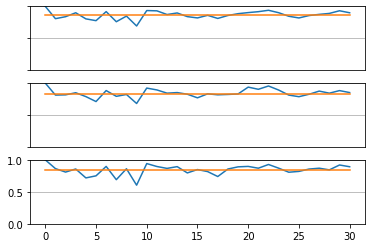

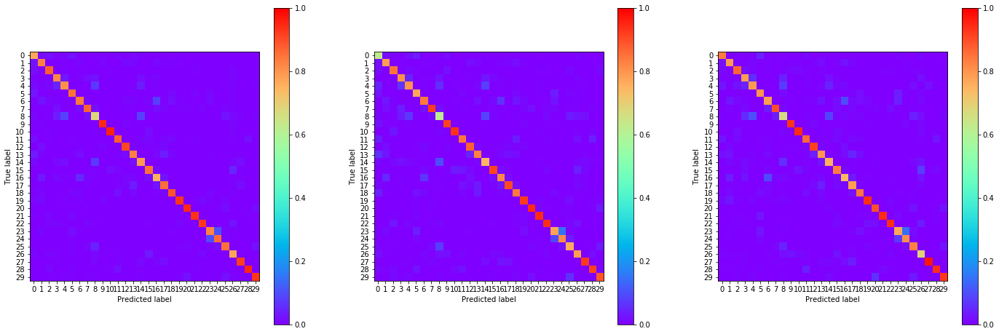

14:36:09.031569
#078 [Train: 0.475] [Test: 0.559] [Valid: 0.560]
#078 [Train: 0.861] [Test: 0.837] [Valid: 0.837]


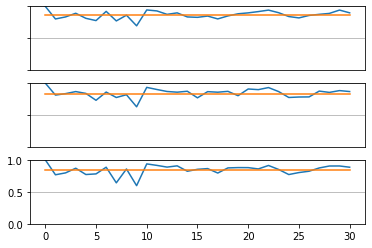

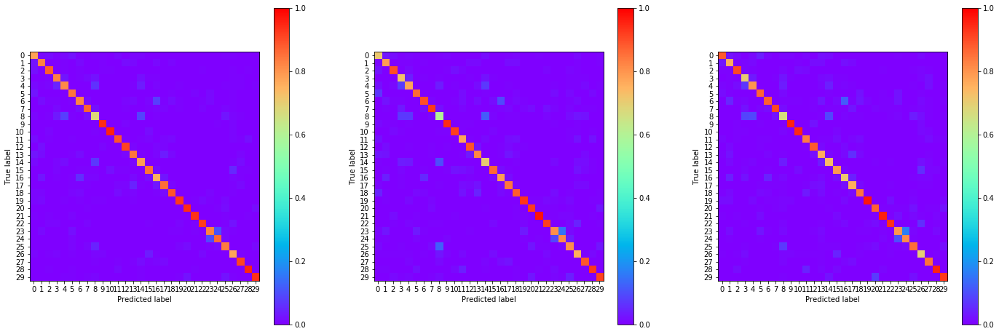

14:37:16.659249
#079 [Train: 0.467] [Test: 0.549] [Valid: 0.538]
#079 [Train: 0.863] [Test: 0.842] [Valid: 0.840]


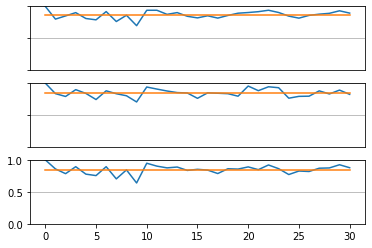

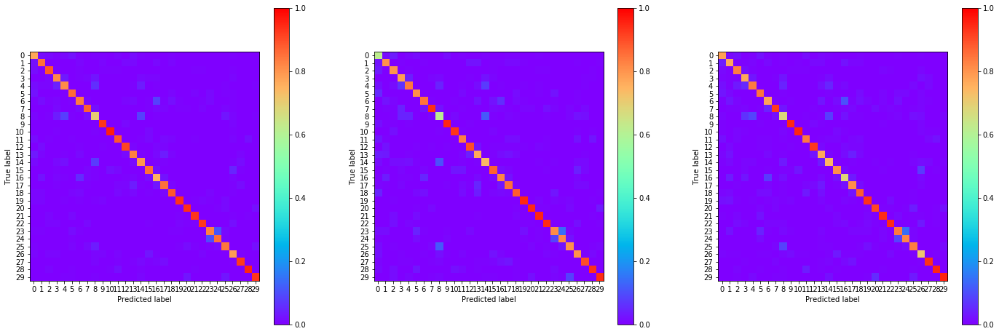

14:38:24.598436
#080 [Train: 0.461] [Test: 0.550] [Valid: 0.537]
#080 [Train: 0.866] [Test: 0.835] [Valid: 0.842]


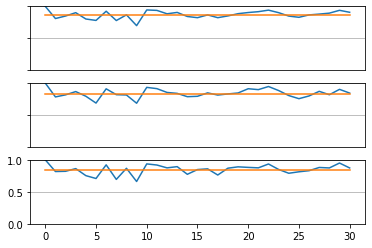

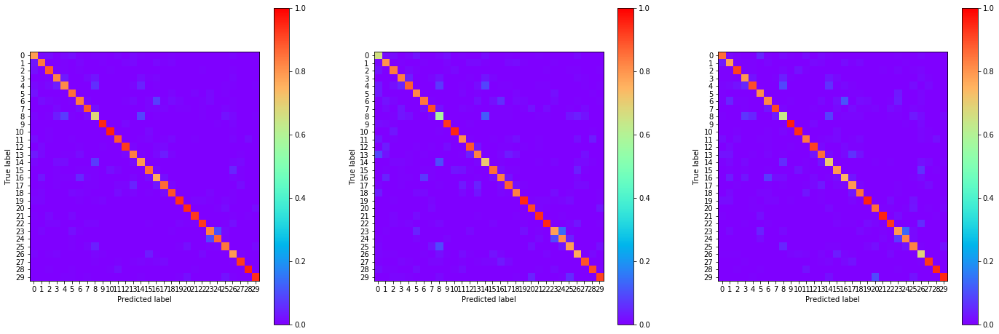

14:39:32.835281
#081 [Train: 0.455] [Test: 0.531] [Valid: 0.540]
#081 [Train: 0.866] [Test: 0.842] [Valid: 0.842]


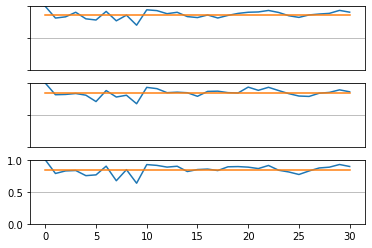

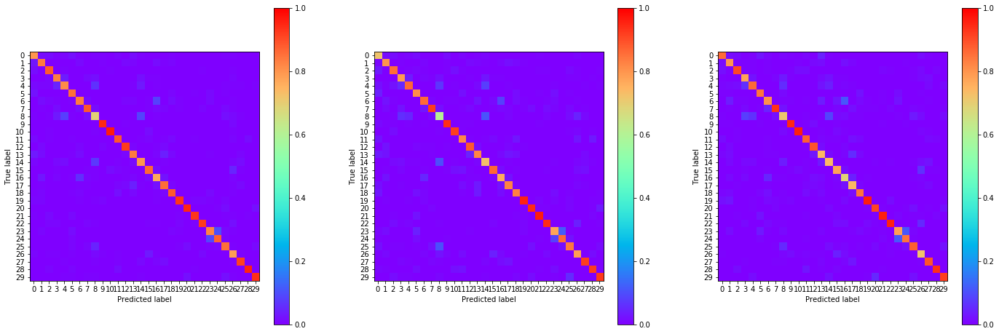

14:40:41.760235
#082 [Train: 0.449] [Test: 0.538] [Valid: 0.541]
#082 [Train: 0.868] [Test: 0.842] [Valid: 0.843]


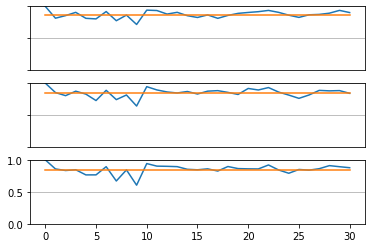

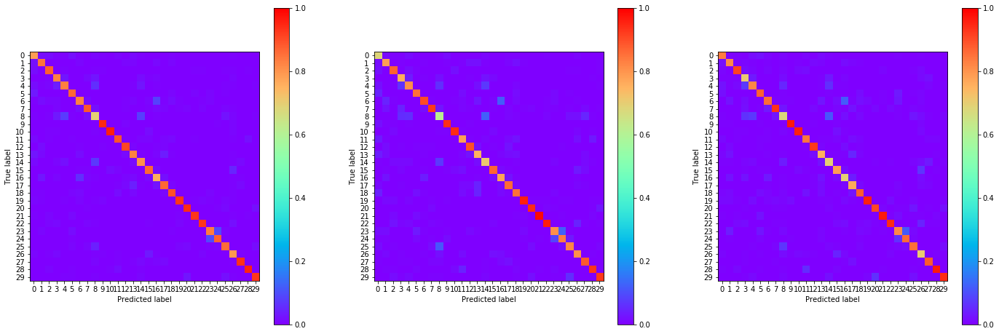

14:41:51.305261
#083 [Train: 0.441] [Test: 0.528] [Valid: 0.517]
#083 [Train: 0.871] [Test: 0.843] [Valid: 0.847]


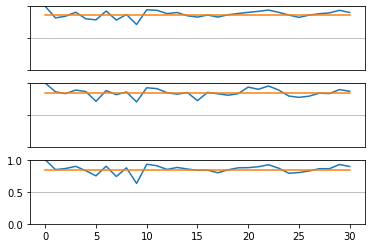

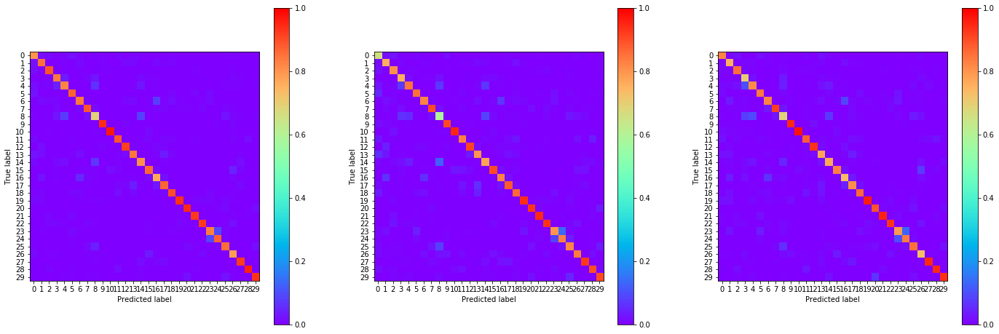

14:42:59.181034
#084 [Train: 0.436] [Test: 0.541] [Valid: 0.516]
#084 [Train: 0.873] [Test: 0.839] [Valid: 0.849]


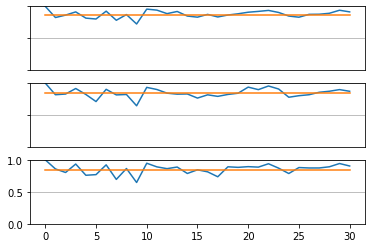

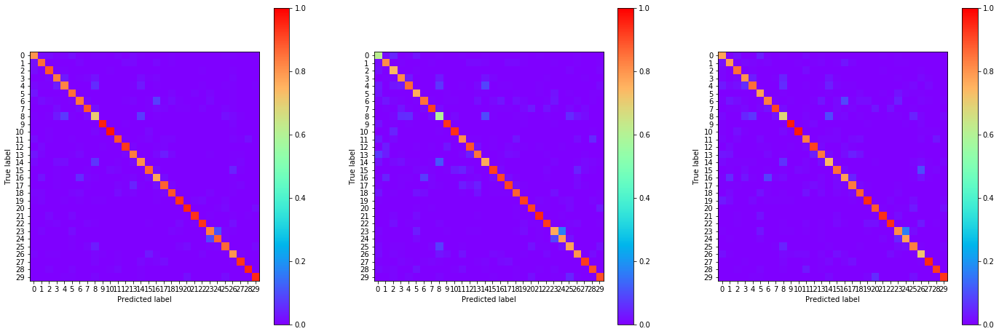

14:44:10.023052
#085 [Train: 0.434] [Test: 0.523] [Valid: 0.508]
#085 [Train: 0.873] [Test: 0.849] [Valid: 0.852]


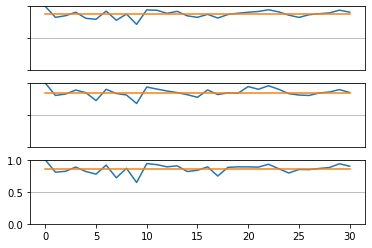

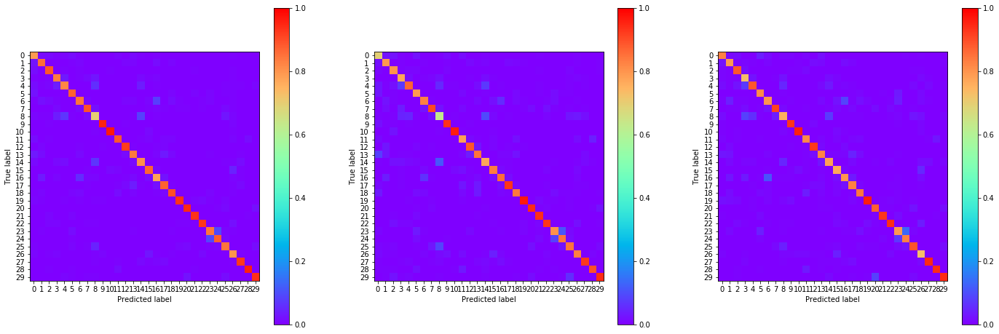

14:45:18.405331
#086 [Train: 0.426] [Test: 0.523] [Valid: 0.507]
#086 [Train: 0.876] [Test: 0.848] [Valid: 0.852]


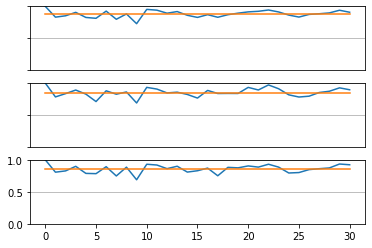

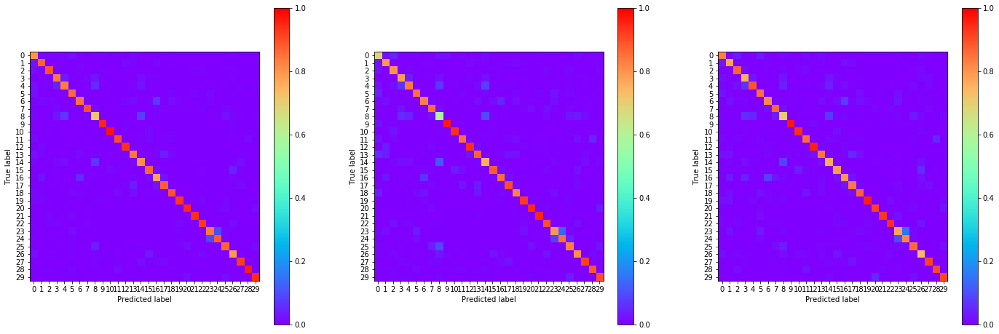

14:46:26.951483
#087 [Train: 0.423] [Test: 0.509] [Valid: 0.496]
#087 [Train: 0.877] [Test: 0.848] [Valid: 0.856]


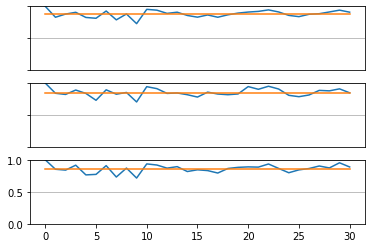

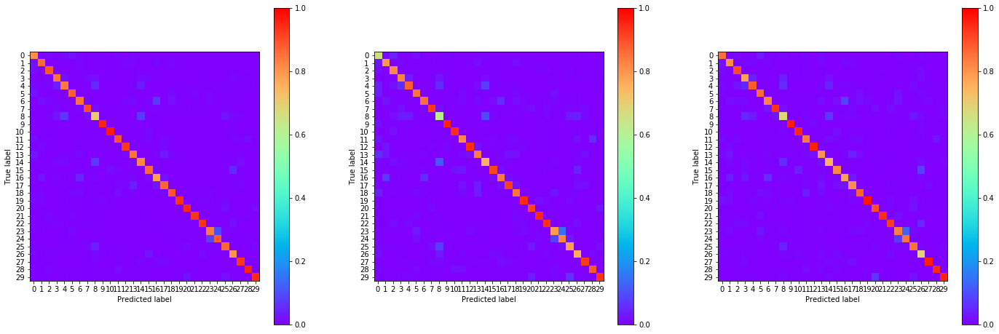

14:47:35.523927
#088 [Train: 0.417] [Test: 0.513] [Valid: 0.499]
#088 [Train: 0.877] [Test: 0.845] [Valid: 0.856]


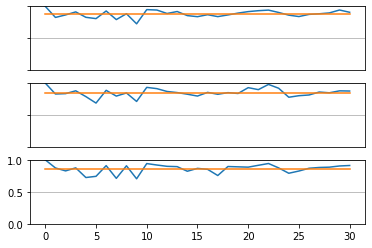

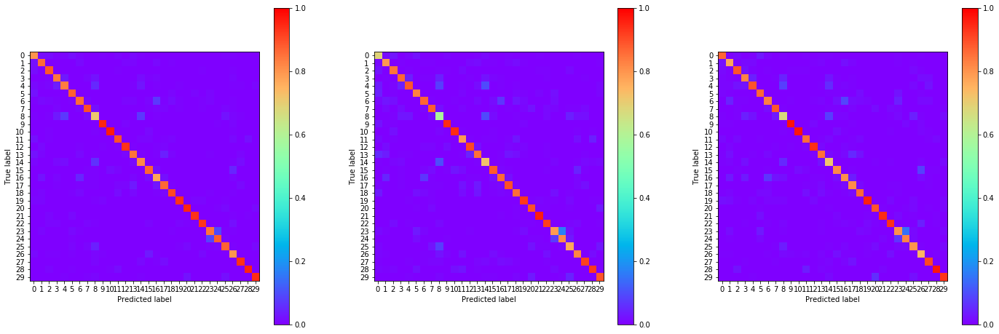

14:48:44.484607
#089 [Train: 0.418] [Test: 0.501] [Valid: 0.492]
#089 [Train: 0.877] [Test: 0.850] [Valid: 0.855]


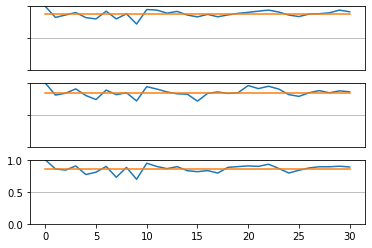

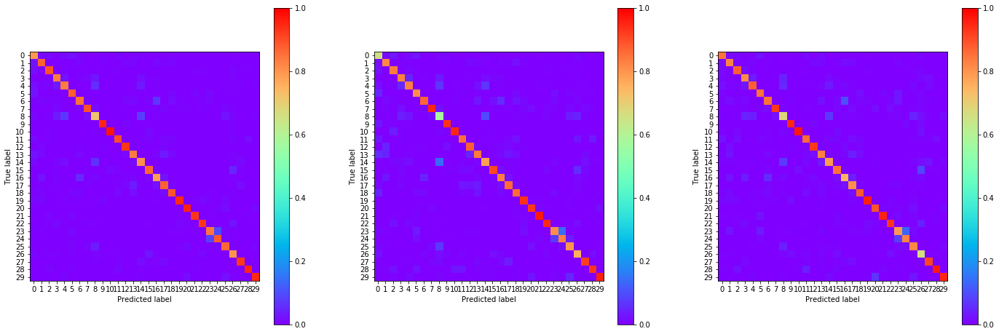

14:49:53.119326
#090 [Train: 0.405] [Test: 0.493] [Valid: 0.483]
#090 [Train: 0.881] [Test: 0.854] [Valid: 0.858]


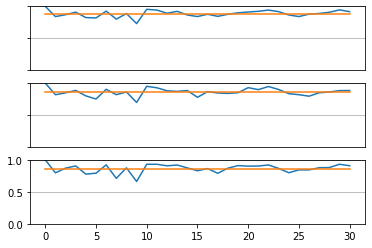

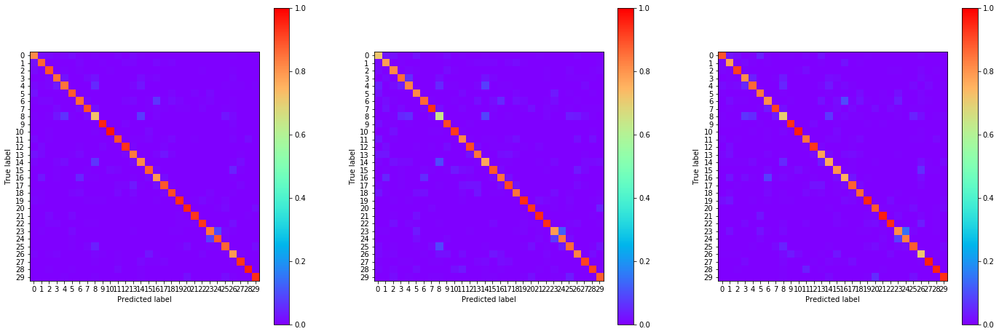

14:51:01.428041
#091 [Train: 0.403] [Test: 0.494] [Valid: 0.484]
#091 [Train: 0.882] [Test: 0.853] [Valid: 0.858]


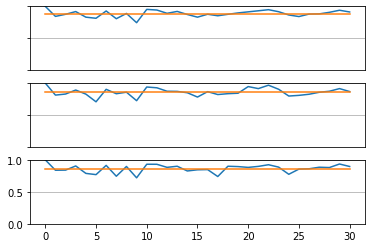

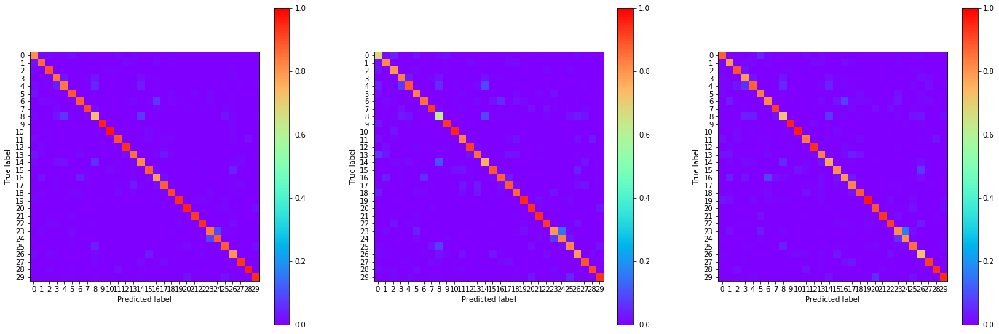

14:52:09.002307
#092 [Train: 0.405] [Test: 0.503] [Valid: 0.502]
#092 [Train: 0.882] [Test: 0.853] [Valid: 0.851]


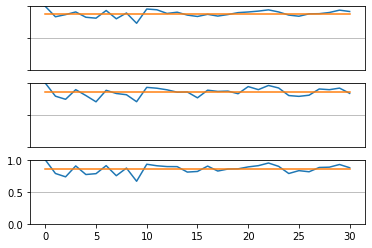

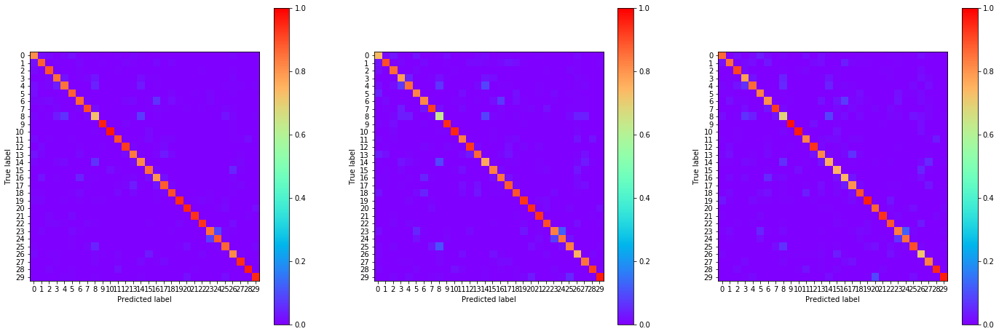

14:53:17.606316
#093 [Train: 0.396] [Test: 0.491] [Valid: 0.486]
#093 [Train: 0.883] [Test: 0.857] [Valid: 0.859]


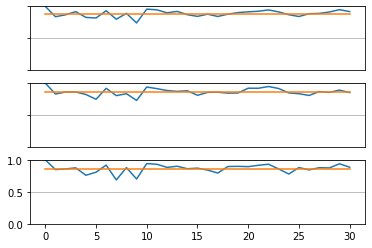

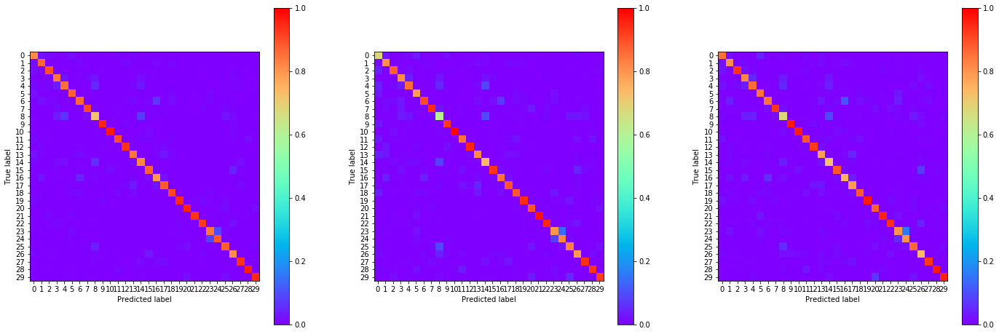

14:54:25.374734
#094 [Train: 0.389] [Test: 0.486] [Valid: 0.478]
#094 [Train: 0.887] [Test: 0.861] [Valid: 0.859]


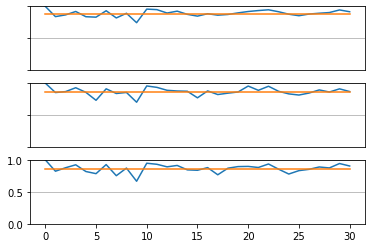

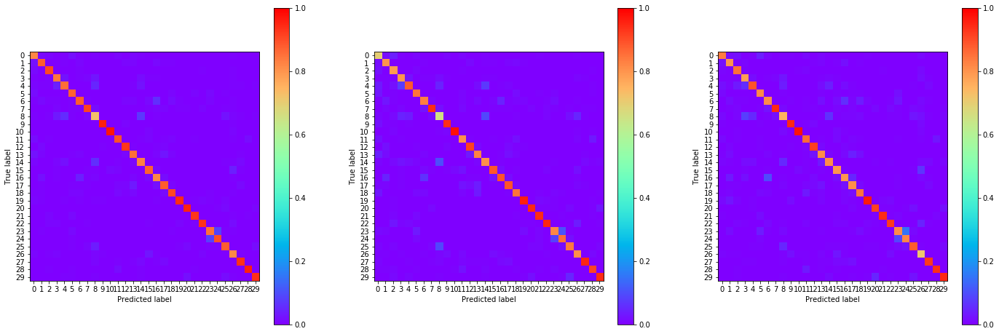

14:55:32.606737
#095 [Train: 0.385] [Test: 0.478] [Valid: 0.475]
#095 [Train: 0.887] [Test: 0.855] [Valid: 0.863]


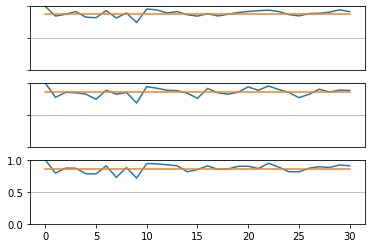

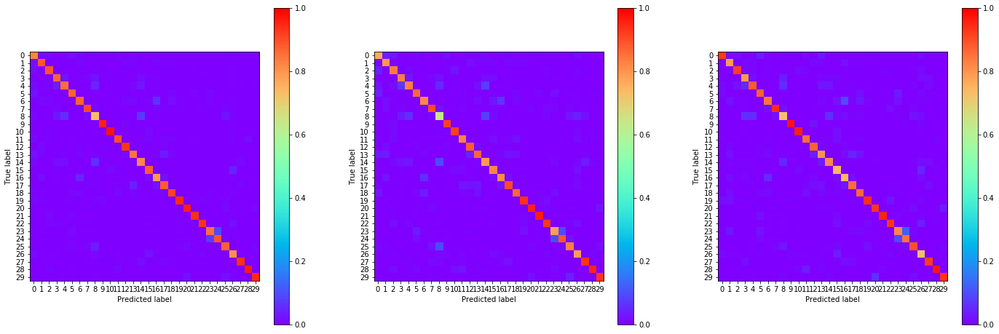

14:56:45.626977
#096 [Train: 0.381] [Test: 0.469] [Valid: 0.471]
#096 [Train: 0.888] [Test: 0.861] [Valid: 0.862]


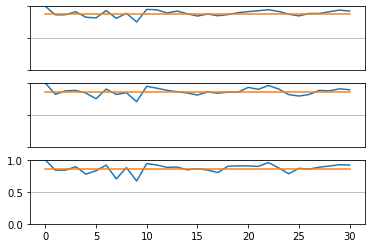

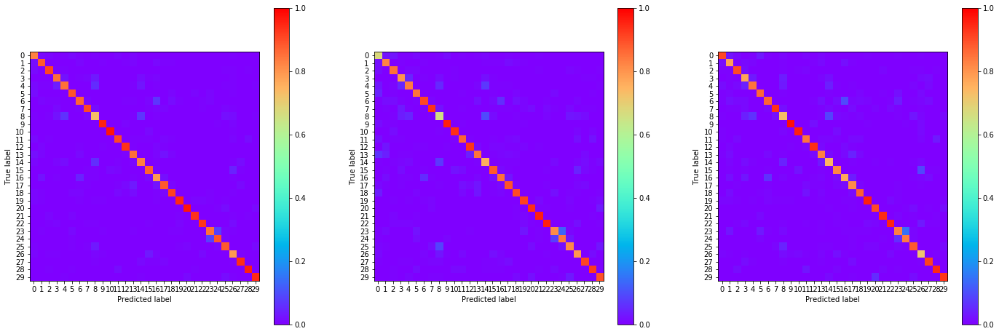

14:57:53.506923
#097 [Train: 0.380] [Test: 0.477] [Valid: 0.465]
#097 [Train: 0.889] [Test: 0.857] [Valid: 0.864]


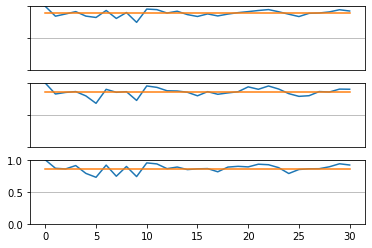

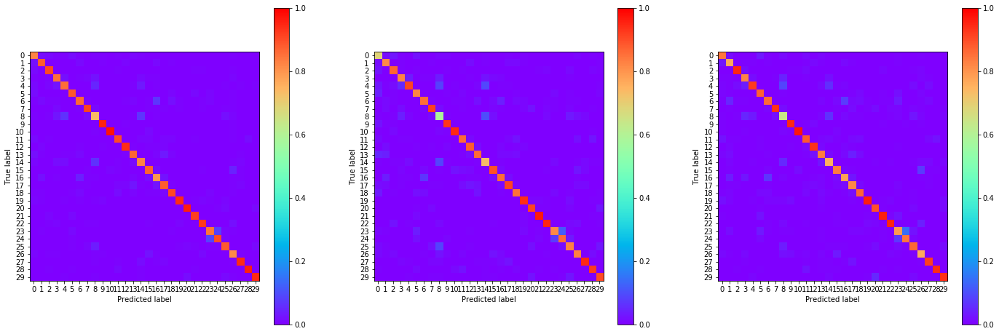

14:59:07.454778
#098 [Train: 0.373] [Test: 0.486] [Valid: 0.496]
#098 [Train: 0.891] [Test: 0.851] [Valid: 0.859]


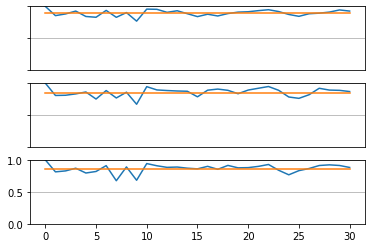

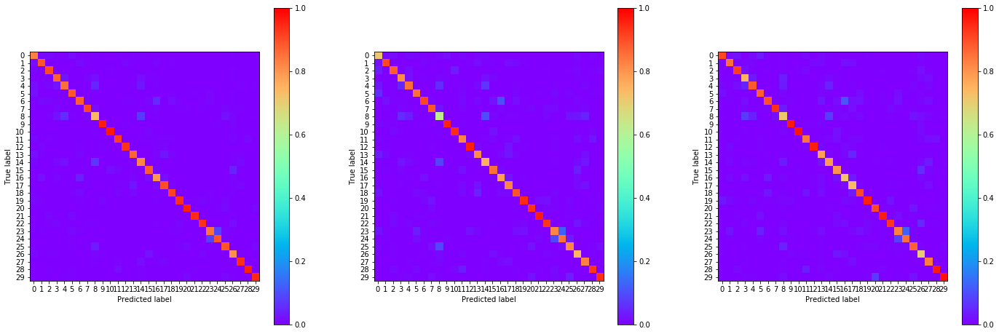

15:00:16.112224
#099 [Train: 0.373] [Test: 0.468] [Valid: 0.466]
#099 [Train: 0.890] [Test: 0.862] [Valid: 0.862]


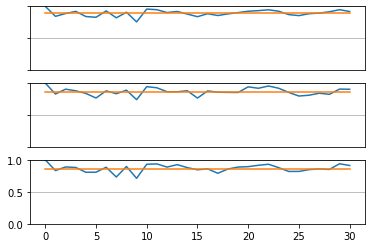

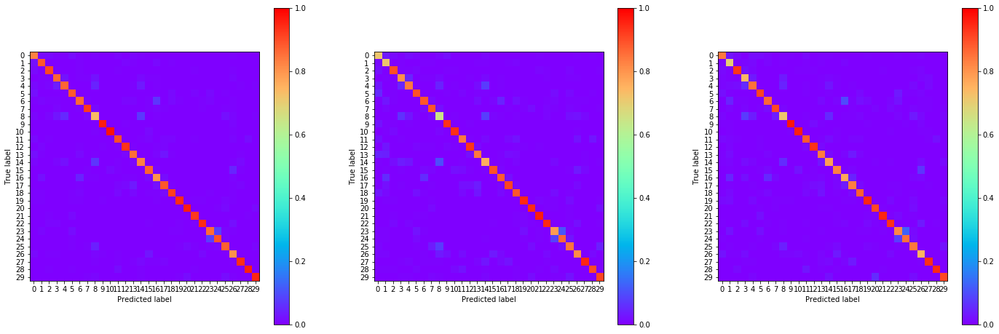

15:01:26.762710
#100 [Train: 0.368] [Test: 0.474] [Valid: 0.456]
#100 [Train: 0.891] [Test: 0.859] [Valid: 0.866]


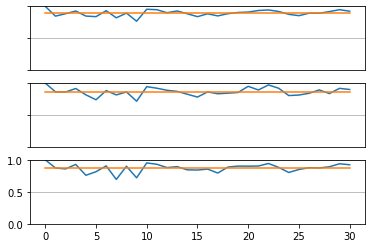

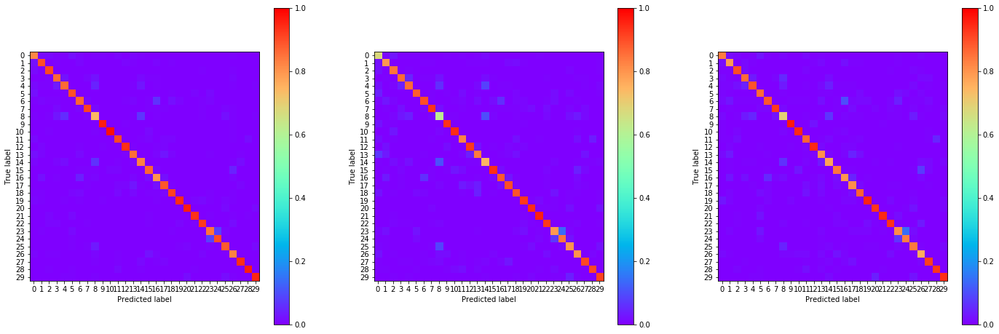

15:02:36.963716
#101 [Train: 0.361] [Test: 0.472] [Valid: 0.460]
#101 [Train: 0.895] [Test: 0.862] [Valid: 0.867]


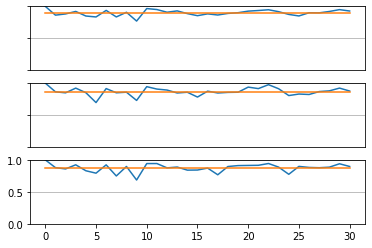

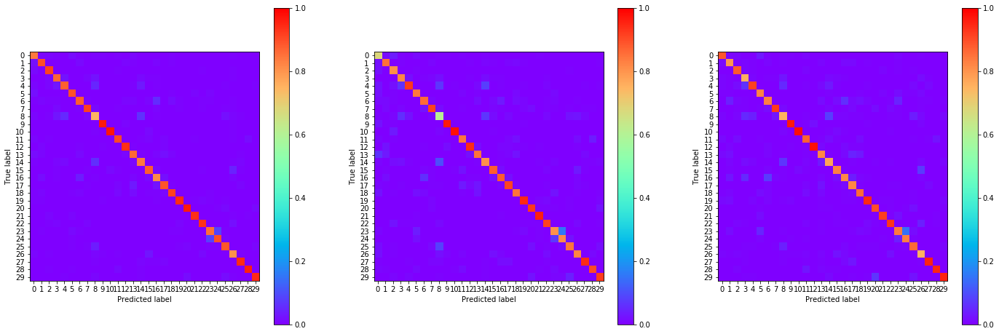

15:03:46.554941
#102 [Train: 0.359] [Test: 0.460] [Valid: 0.453]
#102 [Train: 0.895] [Test: 0.865] [Valid: 0.868]


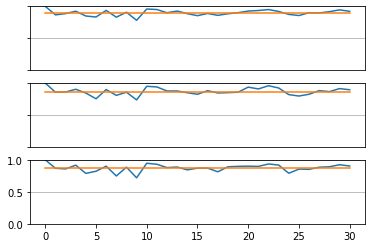

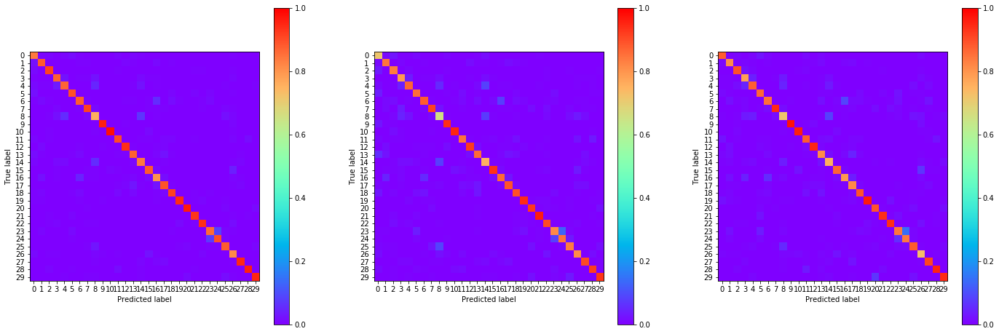

15:04:58.564249
#103 [Train: 0.356] [Test: 0.459] [Valid: 0.450]
#103 [Train: 0.896] [Test: 0.866] [Valid: 0.865]


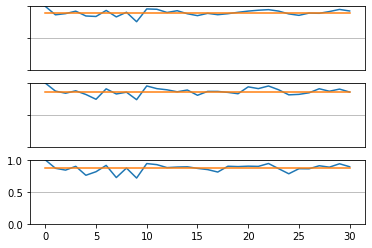

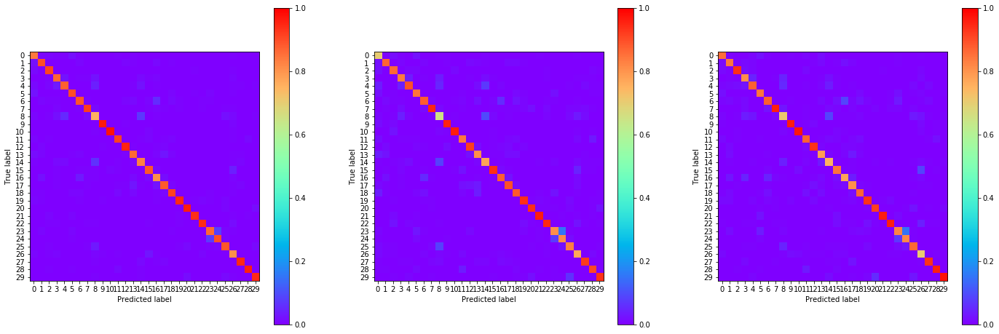

15:06:14.305402
#104 [Train: 0.360] [Test: 0.453] [Valid: 0.448]
#104 [Train: 0.893] [Test: 0.869] [Valid: 0.870]


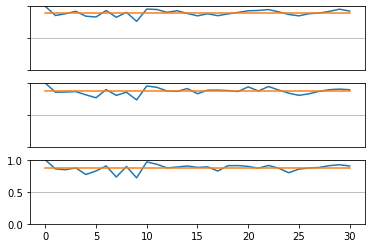

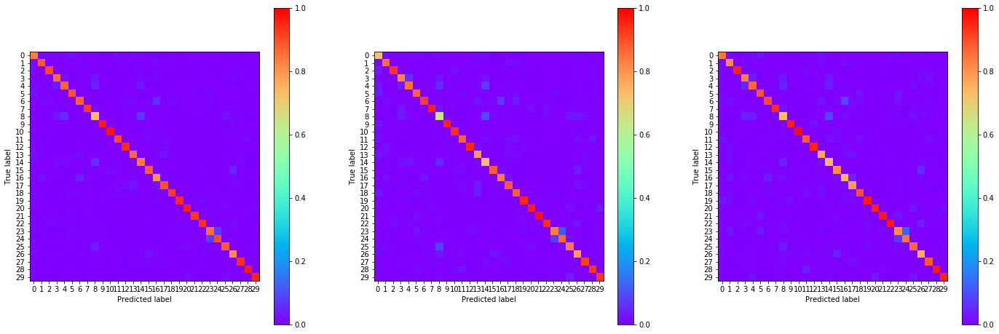

15:07:26.825846
#105 [Train: 0.354] [Test: 0.477] [Valid: 0.466]
#105 [Train: 0.896] [Test: 0.862] [Valid: 0.864]


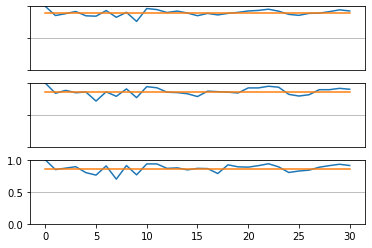

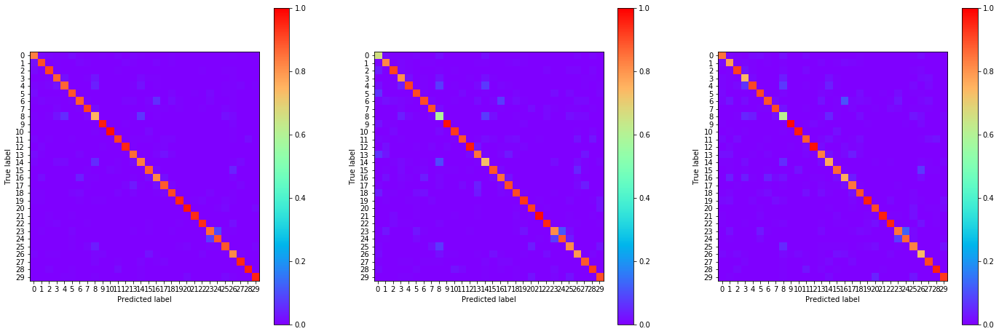

15:08:36.664100
#106 [Train: 0.346] [Test: 0.460] [Valid: 0.444]
#106 [Train: 0.898] [Test: 0.863] [Valid: 0.872]


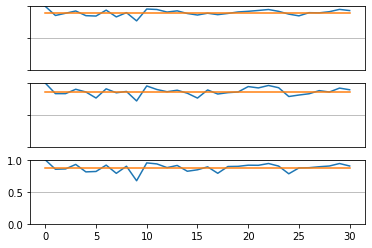

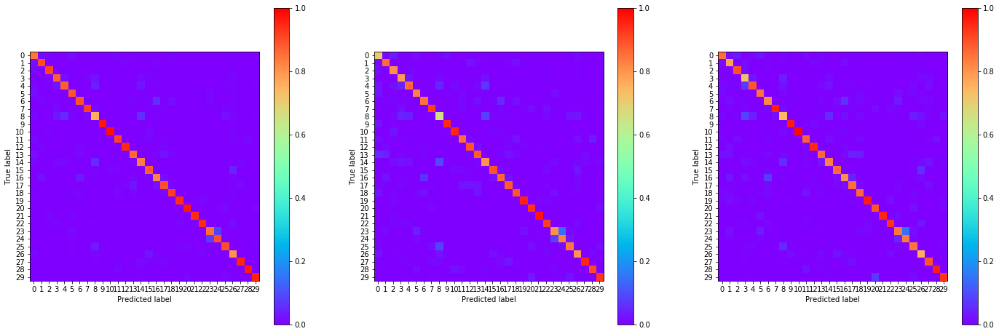

15:09:43.970315
#107 [Train: 0.346] [Test: 0.460] [Valid: 0.446]
#107 [Train: 0.897] [Test: 0.864] [Valid: 0.870]


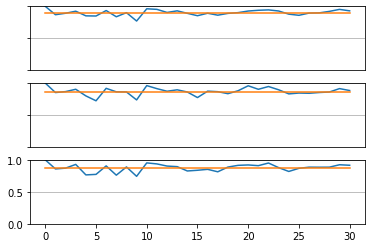

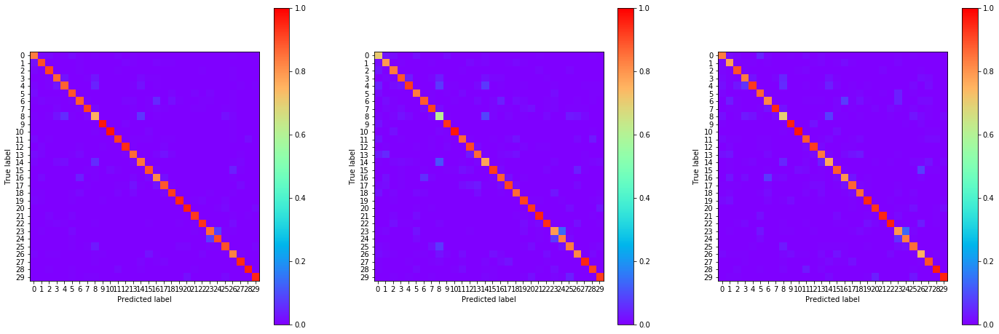

15:10:52.779297
#108 [Train: 0.337] [Test: 0.452] [Valid: 0.451]
#108 [Train: 0.901] [Test: 0.868] [Valid: 0.870]


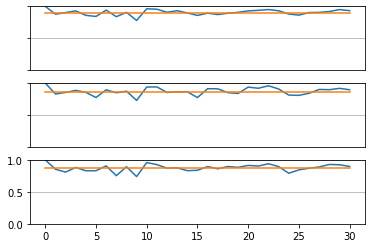

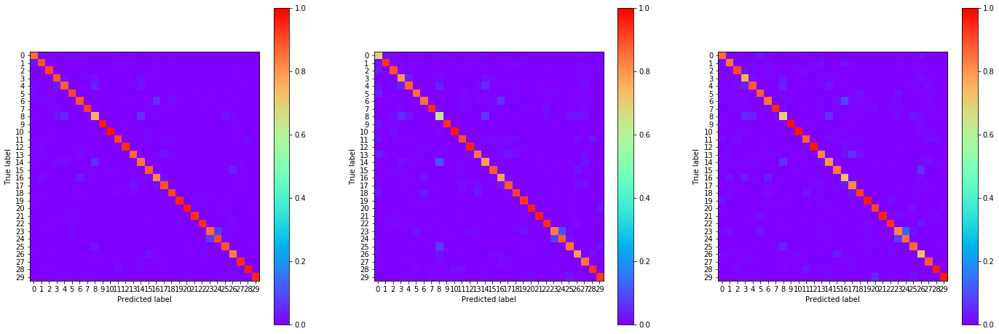

15:11:59.934631
#109 [Train: 0.337] [Test: 0.444] [Valid: 0.445]
#109 [Train: 0.901] [Test: 0.868] [Valid: 0.867]


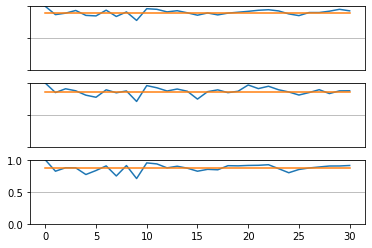

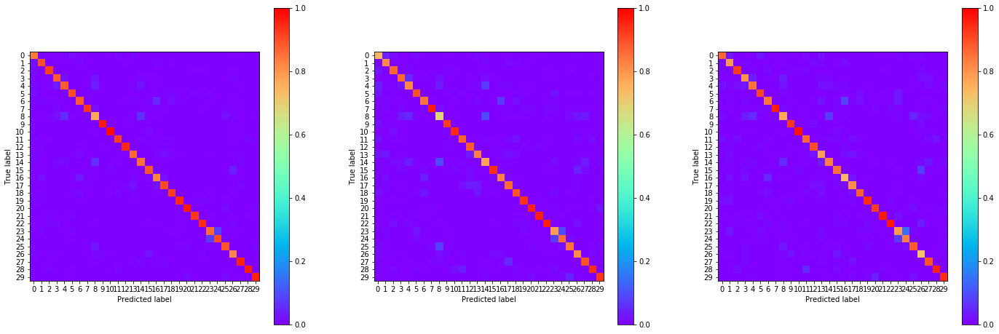

15:13:09.837493
#110 [Train: 0.337] [Test: 0.456] [Valid: 0.450]
#110 [Train: 0.901] [Test: 0.868] [Valid: 0.869]


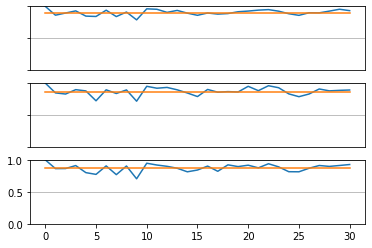

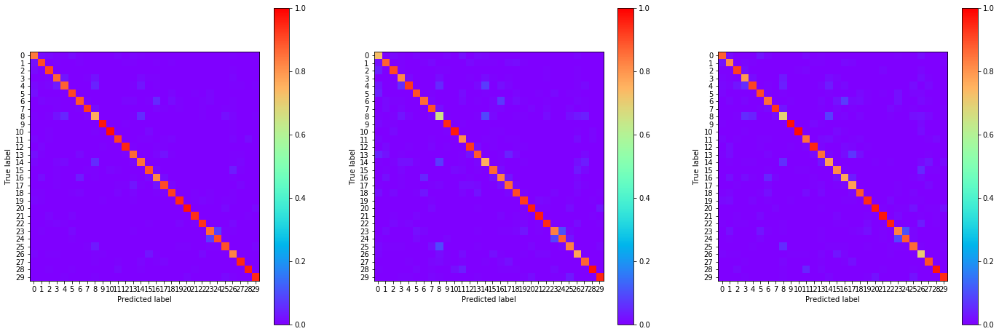

15:14:17.306915
#111 [Train: 0.334] [Test: 0.446] [Valid: 0.443]
#111 [Train: 0.901] [Test: 0.869] [Valid: 0.868]


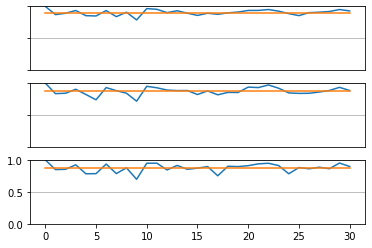

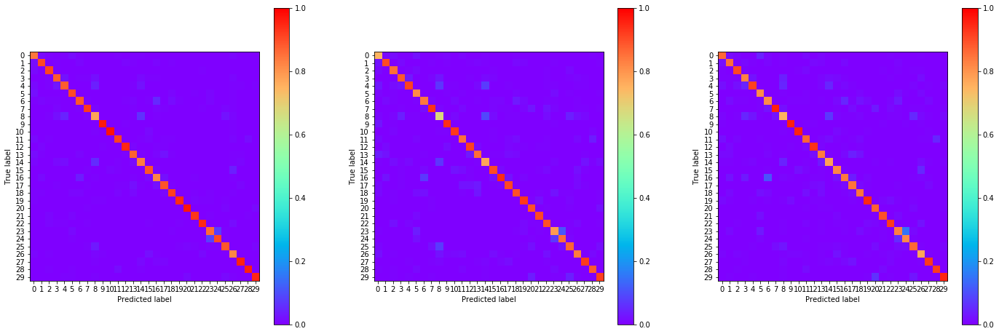

15:15:25.753926
#112 [Train: 0.328] [Test: 0.432] [Valid: 0.425]
#112 [Train: 0.903] [Test: 0.875] [Valid: 0.874]


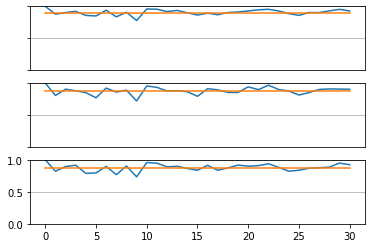

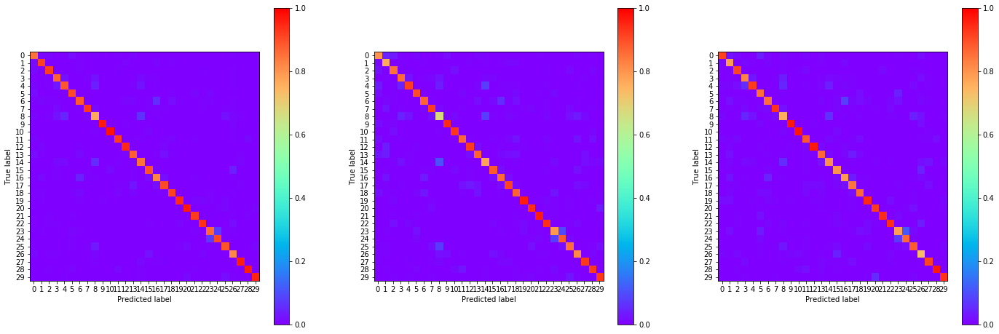

15:16:34.418492
#113 [Train: 0.321] [Test: 0.426] [Valid: 0.426]
#113 [Train: 0.905] [Test: 0.875] [Valid: 0.878]


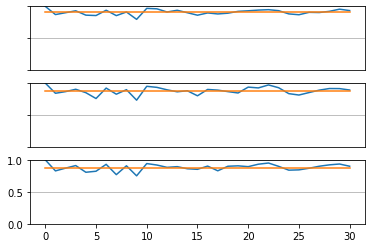

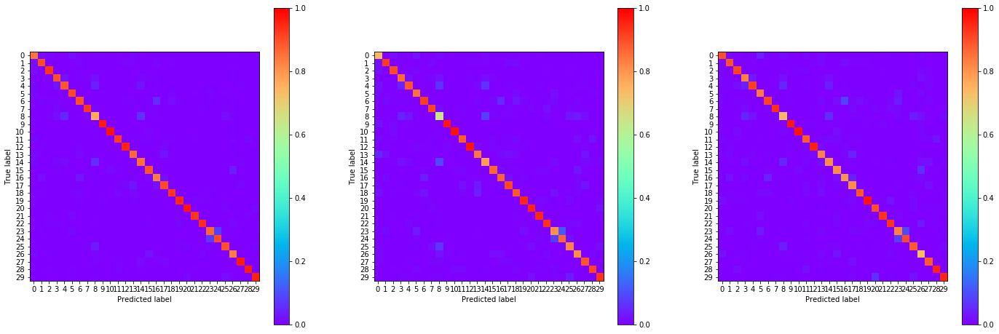

15:17:42.201896
#114 [Train: 0.323] [Test: 0.429] [Valid: 0.426]
#114 [Train: 0.906] [Test: 0.877] [Valid: 0.875]


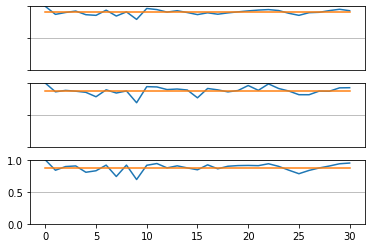

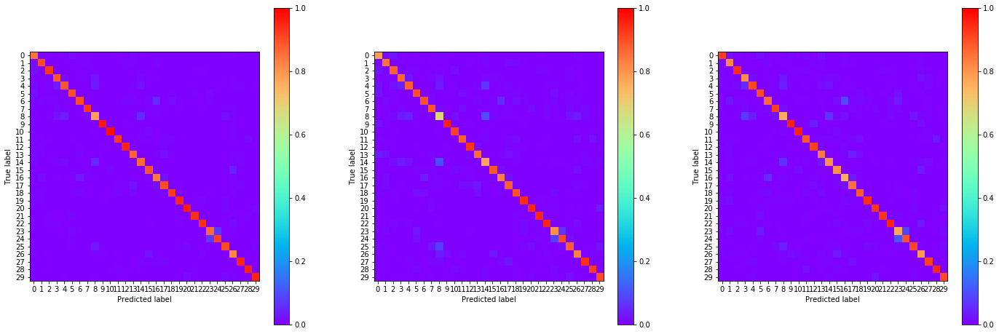

15:18:51.820734
#115 [Train: 0.314] [Test: 0.434] [Valid: 0.427]
#115 [Train: 0.907] [Test: 0.873] [Valid: 0.874]


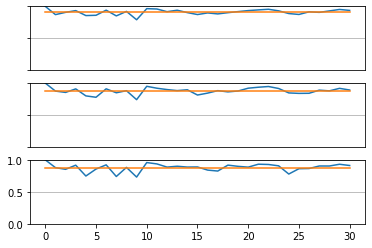

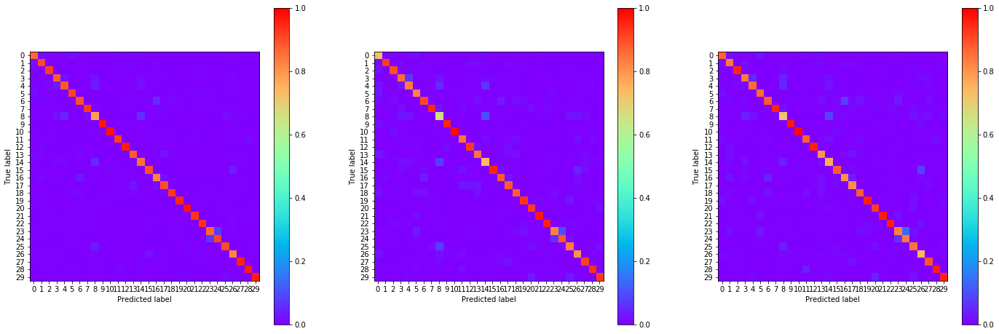

15:20:01.779870
#116 [Train: 0.313] [Test: 0.430] [Valid: 0.423]
#116 [Train: 0.908] [Test: 0.878] [Valid: 0.876]


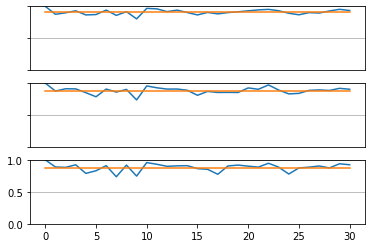

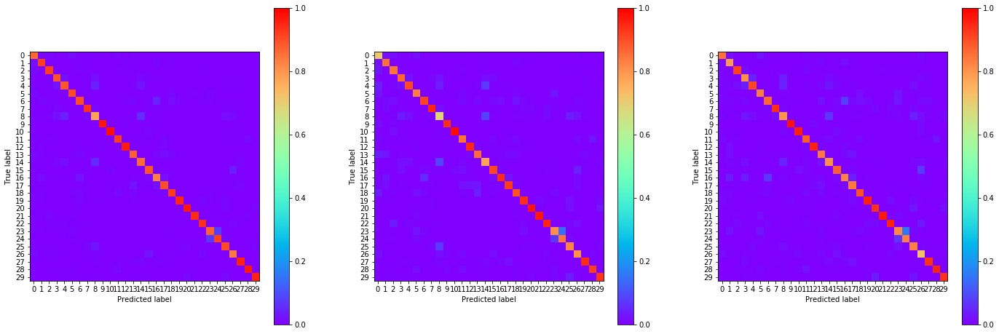

15:21:10.346458
#117 [Train: 0.317] [Test: 0.449] [Valid: 0.439]
#117 [Train: 0.907] [Test: 0.874] [Valid: 0.875]


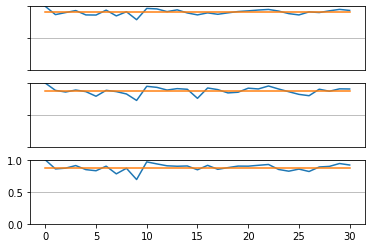

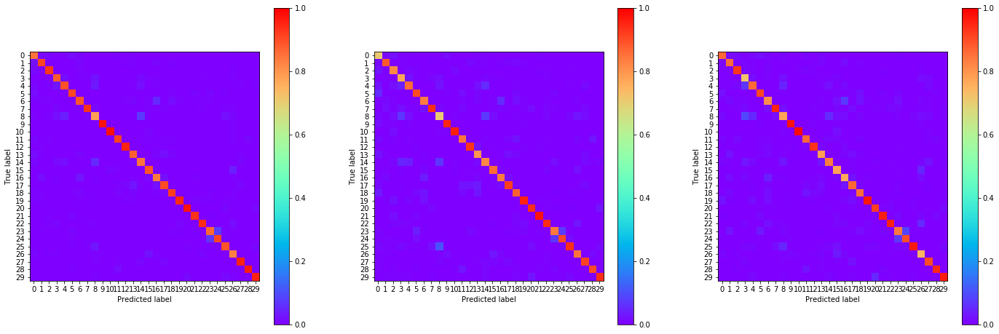

15:22:19.543479
#118 [Train: 0.312] [Test: 0.427] [Valid: 0.425]
#118 [Train: 0.908] [Test: 0.877] [Valid: 0.878]


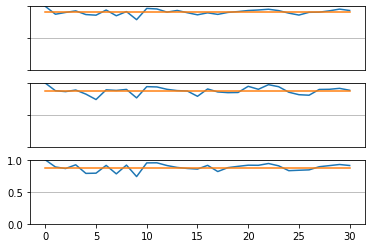

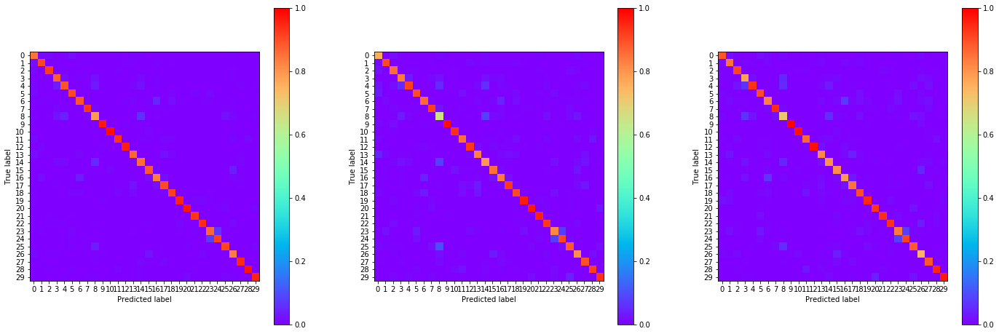

15:23:28.085783
#119 [Train: 0.305] [Test: 0.422] [Valid: 0.416]
#119 [Train: 0.909] [Test: 0.877] [Valid: 0.880]


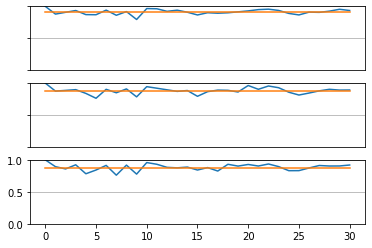

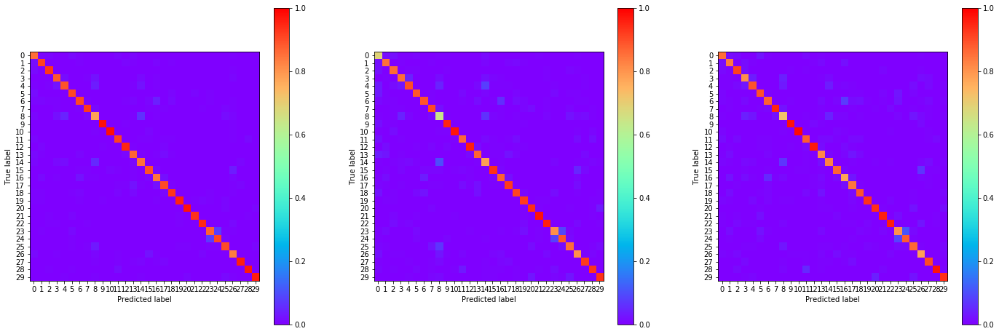

15:24:35.725029
#120 [Train: 0.307] [Test: 0.413] [Valid: 0.418]
#120 [Train: 0.908] [Test: 0.883] [Valid: 0.879]


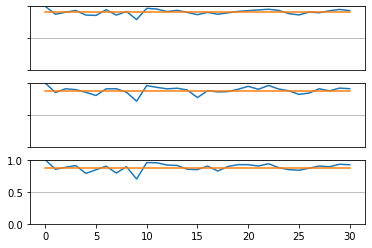

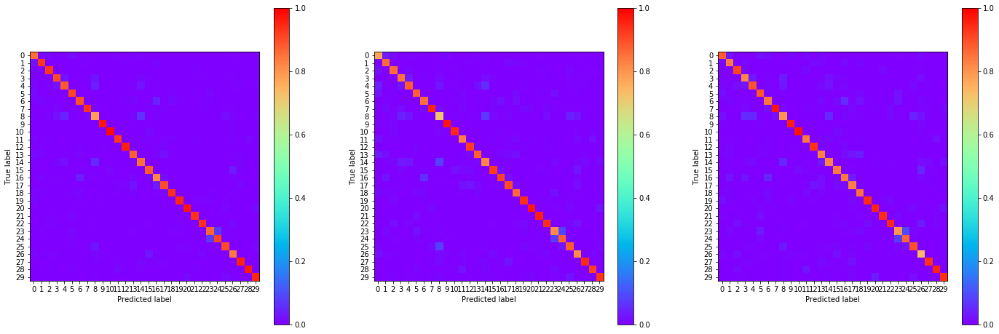

15:25:43.303107
#121 [Train: 0.303] [Test: 0.432] [Valid: 0.417]
#121 [Train: 0.911] [Test: 0.875] [Valid: 0.877]


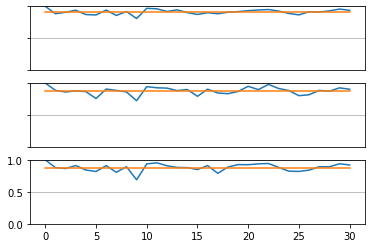

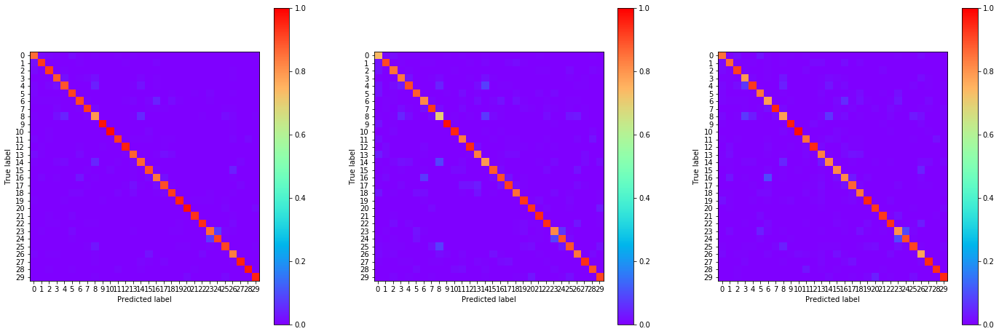

15:26:52.465688
#122 [Train: 0.304] [Test: 0.420] [Valid: 0.409]
#122 [Train: 0.910] [Test: 0.877] [Valid: 0.881]


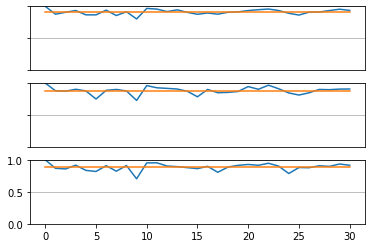

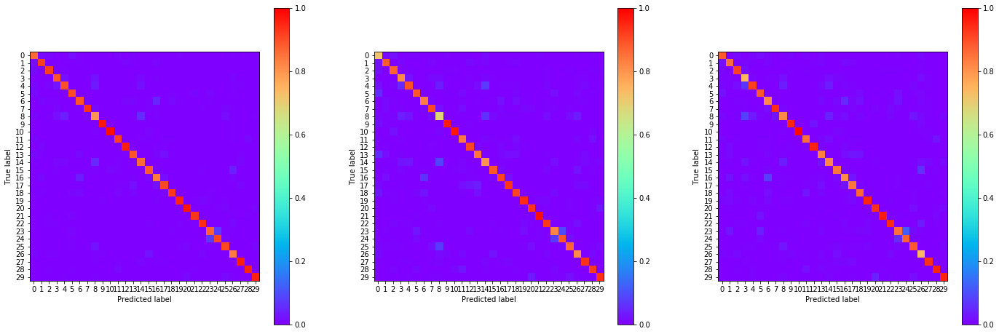

15:28:00.835122
#123 [Train: 0.296] [Test: 0.413] [Valid: 0.415]
#123 [Train: 0.912] [Test: 0.877] [Valid: 0.879]


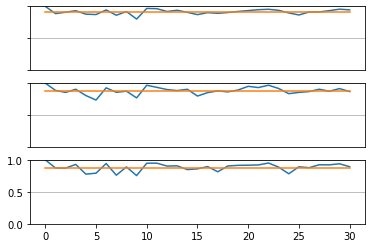

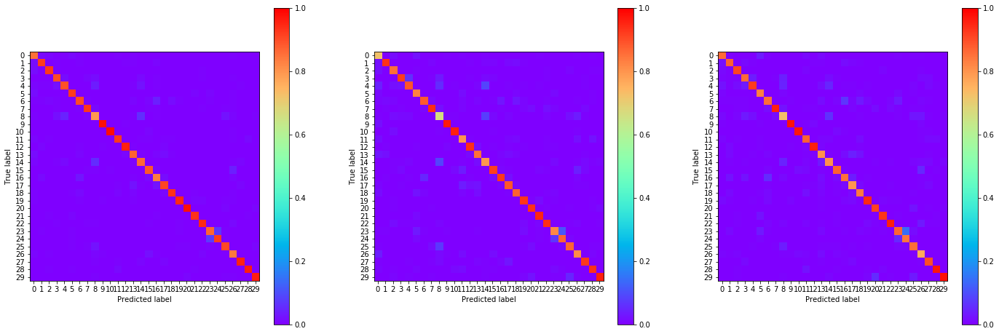

15:29:10.040445
#124 [Train: 0.295] [Test: 0.413] [Valid: 0.409]
#124 [Train: 0.913] [Test: 0.880] [Valid: 0.882]


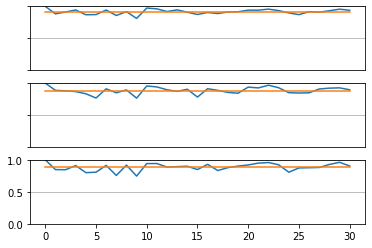

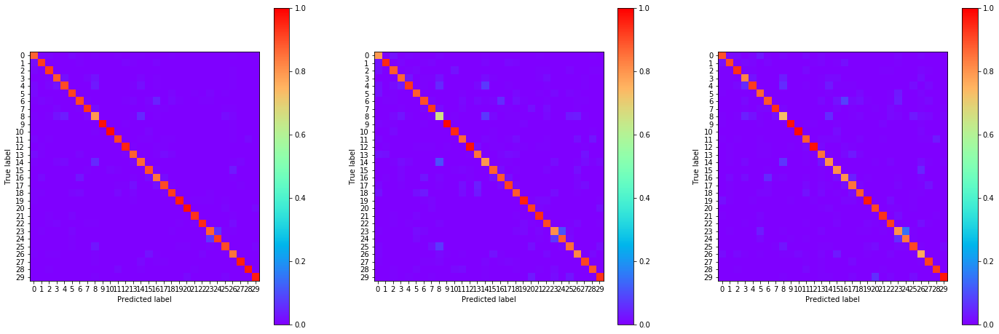

15:30:18.495271
#125 [Train: 0.295] [Test: 0.412] [Valid: 0.417]
#125 [Train: 0.914] [Test: 0.880] [Valid: 0.878]


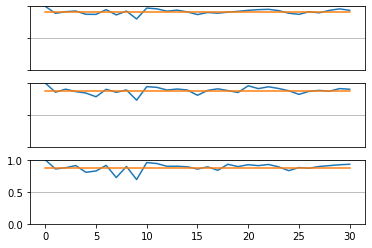

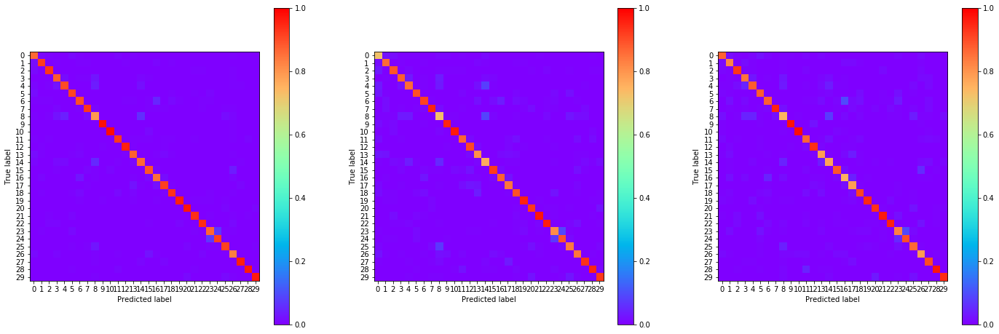

15:31:26.673054
#126 [Train: 0.289] [Test: 0.402] [Valid: 0.406]
#126 [Train: 0.914] [Test: 0.882] [Valid: 0.879]


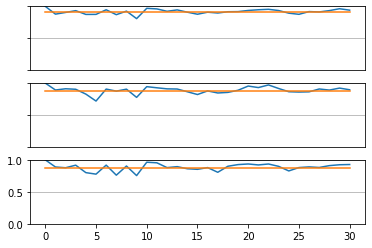

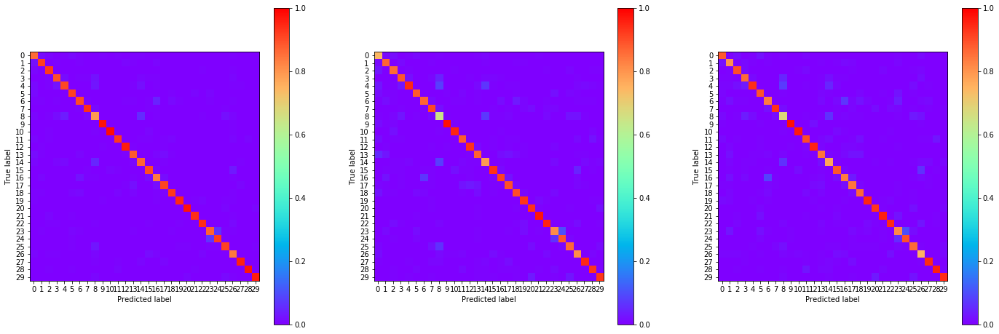

15:32:34.637664
#127 [Train: 0.286] [Test: 0.410] [Valid: 0.399]
#127 [Train: 0.915] [Test: 0.878] [Valid: 0.886]


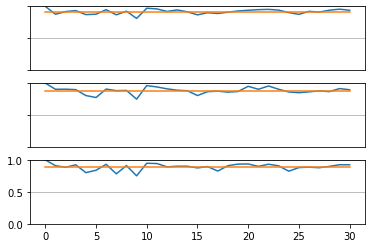

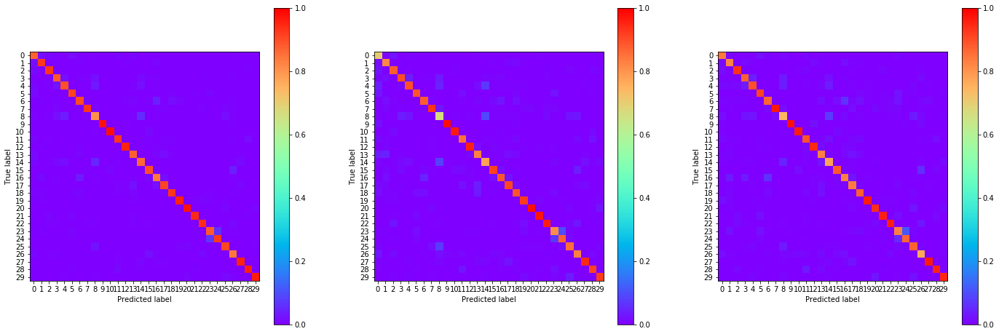

15:33:43.670670
#128 [Train: 0.284] [Test: 0.409] [Valid: 0.394]
#128 [Train: 0.916] [Test: 0.881] [Valid: 0.886]


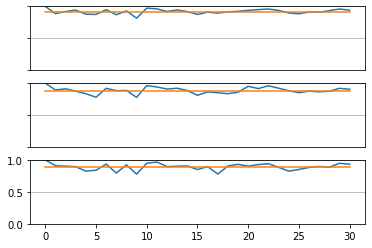

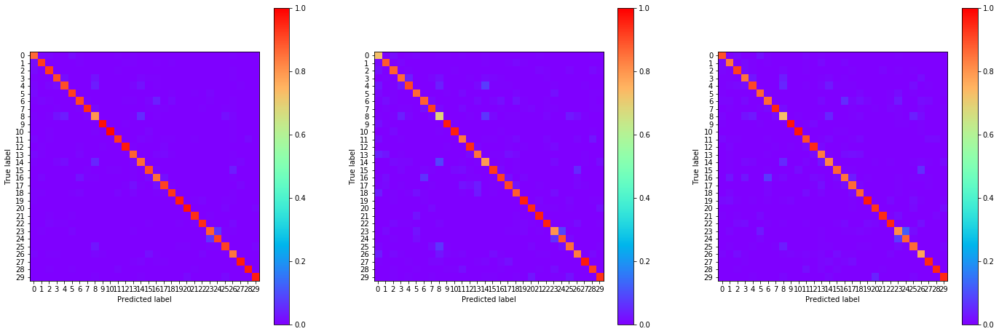

15:34:53.141511
#129 [Train: 0.287] [Test: 0.408] [Valid: 0.407]
#129 [Train: 0.916] [Test: 0.880] [Valid: 0.880]


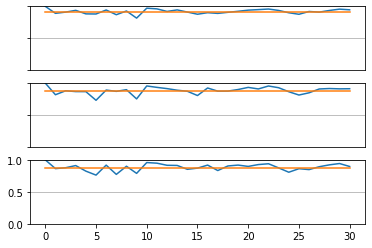

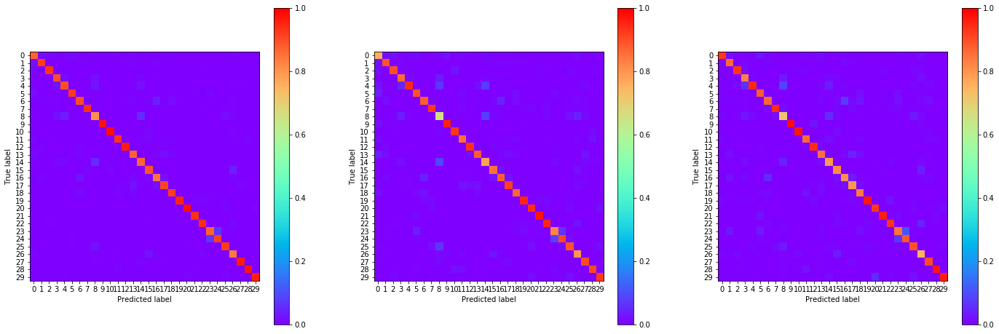

15:36:01.767541
#130 [Train: 0.281] [Test: 0.426] [Valid: 0.412]
#130 [Train: 0.917] [Test: 0.876] [Valid: 0.883]


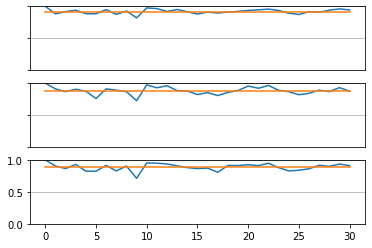

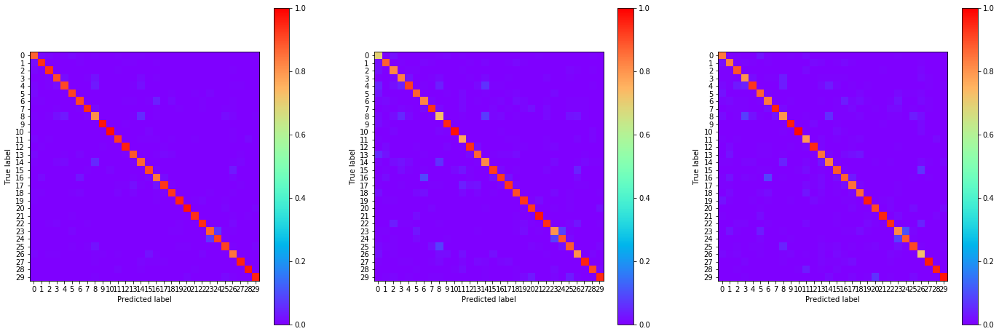

15:37:10.516499
#131 [Train: 0.280] [Test: 0.408] [Valid: 0.401]
#131 [Train: 0.918] [Test: 0.884] [Valid: 0.883]


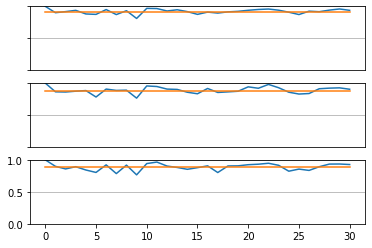

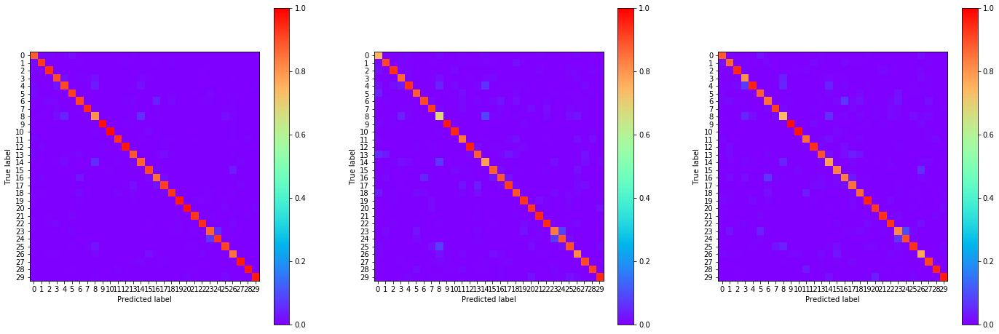

15:38:19.861145
#132 [Train: 0.277] [Test: 0.399] [Valid: 0.406]
#132 [Train: 0.919] [Test: 0.883] [Valid: 0.879]


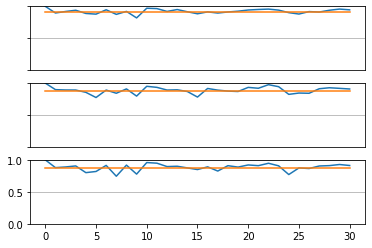

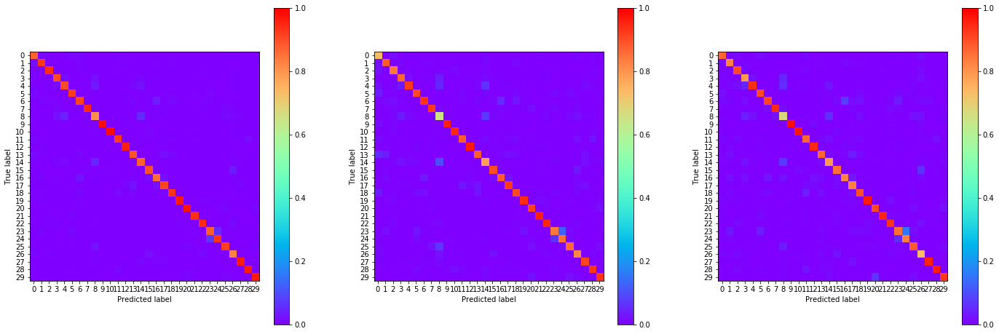

15:39:30.354466
#133 [Train: 0.276] [Test: 0.403] [Valid: 0.397]
#133 [Train: 0.919] [Test: 0.882] [Valid: 0.883]


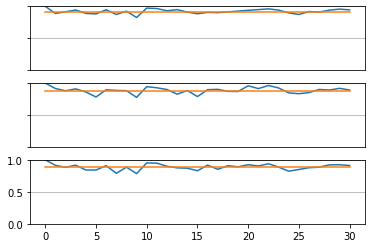

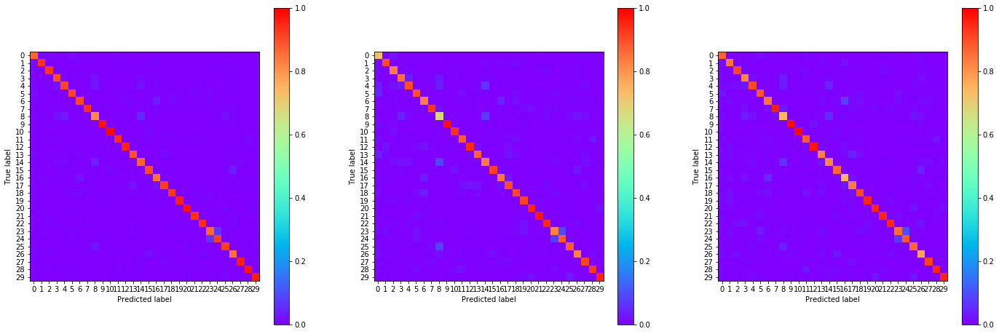

15:40:39.145332
#134 [Train: 0.272] [Test: 0.395] [Valid: 0.394]
#134 [Train: 0.920] [Test: 0.883] [Valid: 0.887]


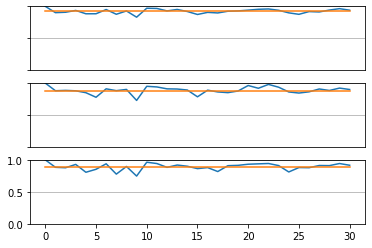

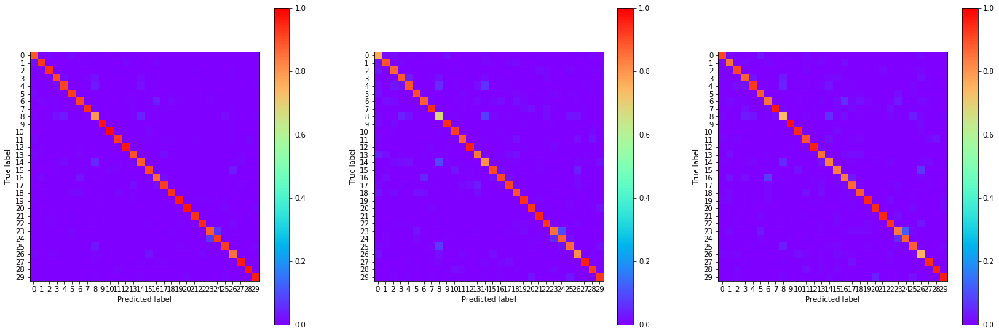

15:41:48.096860
#135 [Train: 0.270] [Test: 0.402] [Valid: 0.395]
#135 [Train: 0.919] [Test: 0.880] [Valid: 0.887]


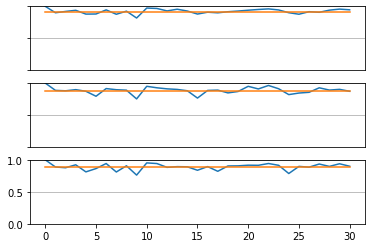

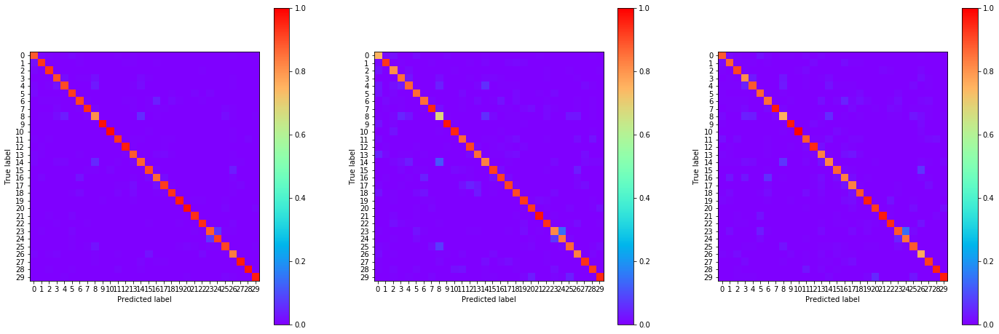

15:42:56.483987
#136 [Train: 0.270] [Test: 0.407] [Valid: 0.402]
#136 [Train: 0.920] [Test: 0.883] [Valid: 0.883]


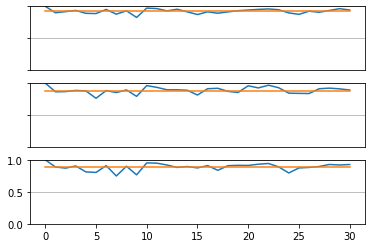

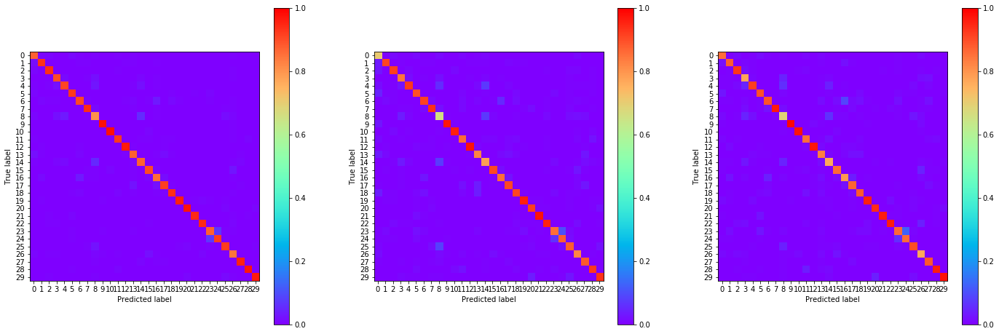

15:44:05.123808
#137 [Train: 0.269] [Test: 0.399] [Valid: 0.397]
#137 [Train: 0.920] [Test: 0.882] [Valid: 0.884]


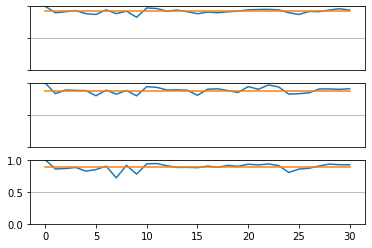

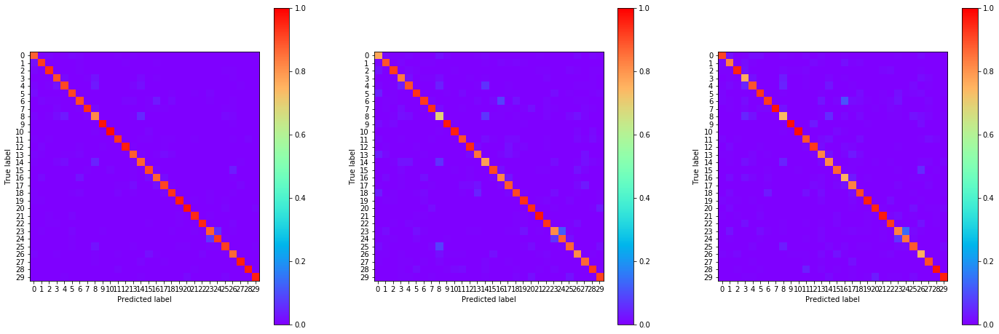

15:45:14.459480
#138 [Train: 0.263] [Test: 0.388] [Valid: 0.392]
#138 [Train: 0.923] [Test: 0.886] [Valid: 0.886]


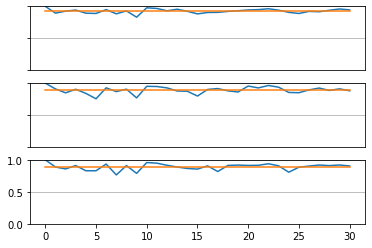

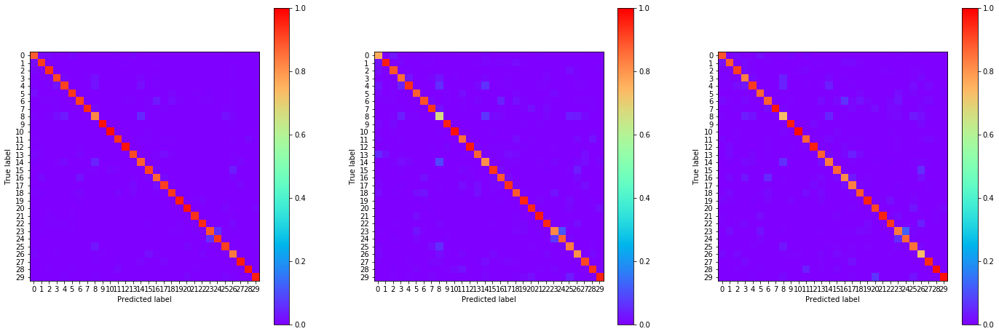

15:46:23.219033
#139 [Train: 0.259] [Test: 0.394] [Valid: 0.390]
#139 [Train: 0.924] [Test: 0.885] [Valid: 0.887]


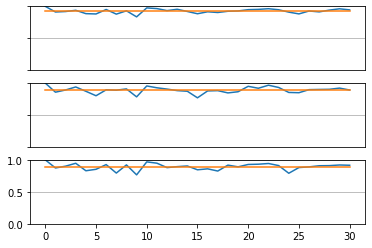

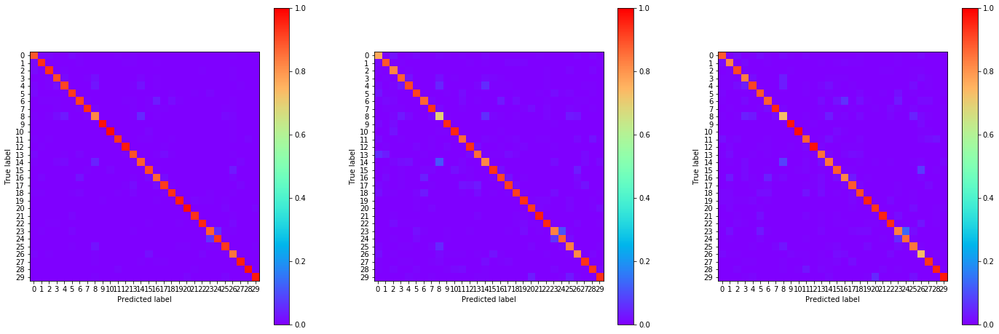

15:47:31.970701
#140 [Train: 0.264] [Test: 0.399] [Valid: 0.399]
#140 [Train: 0.921] [Test: 0.886] [Valid: 0.885]


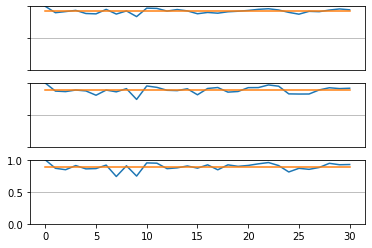

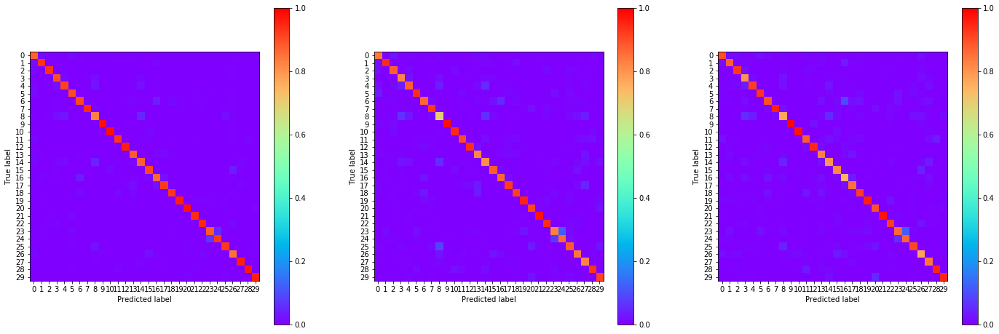

15:48:40.579223
#141 [Train: 0.258] [Test: 0.387] [Valid: 0.389]
#141 [Train: 0.924] [Test: 0.885] [Valid: 0.888]


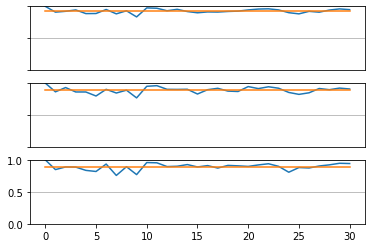

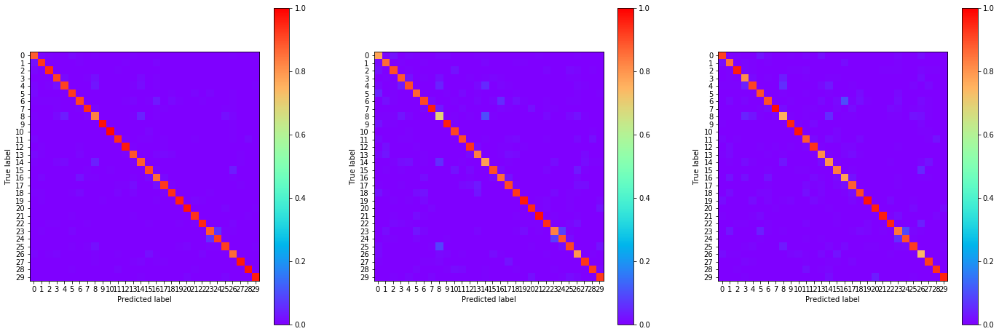

15:49:53.038064
#142 [Train: 0.252] [Test: 0.416] [Valid: 0.395]
#142 [Train: 0.925] [Test: 0.878] [Valid: 0.886]


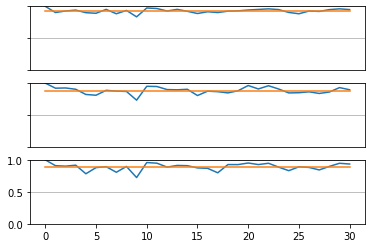

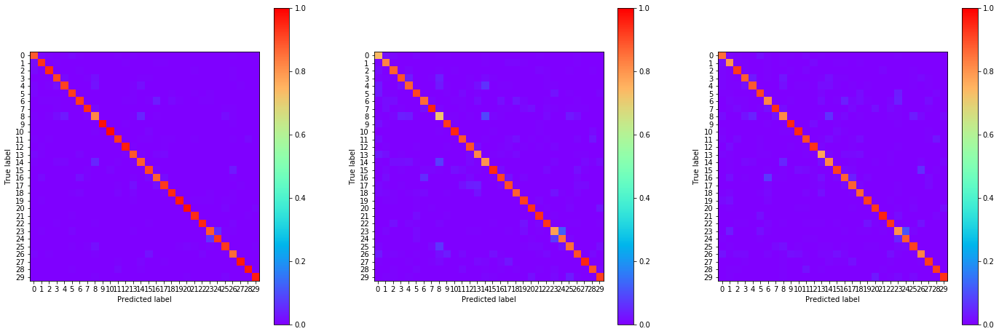

15:51:01.855347
#143 [Train: 0.253] [Test: 0.394] [Valid: 0.397]
#143 [Train: 0.923] [Test: 0.887] [Valid: 0.886]


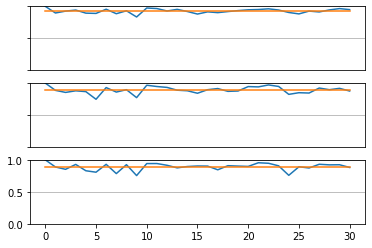

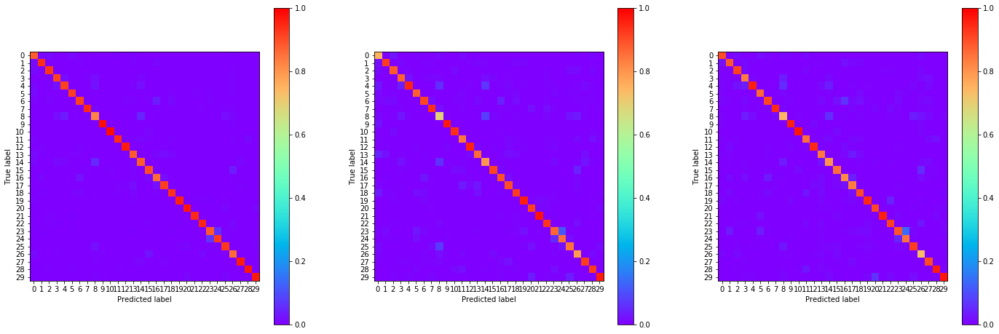

15:52:10.610963
#144 [Train: 0.245] [Test: 0.384] [Valid: 0.384]
#144 [Train: 0.928] [Test: 0.891] [Valid: 0.888]


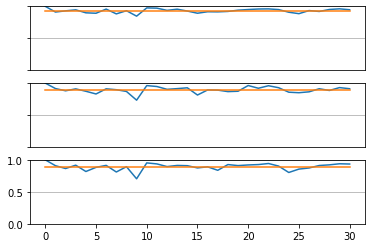

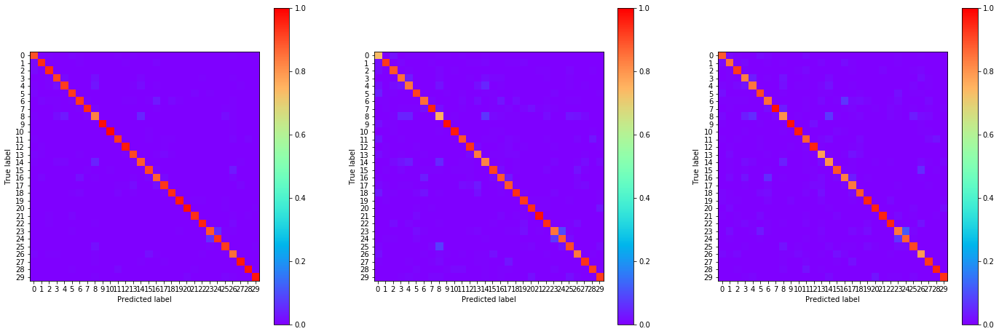

15:53:18.971491
#145 [Train: 0.250] [Test: 0.412] [Valid: 0.400]
#145 [Train: 0.926] [Test: 0.880] [Valid: 0.885]


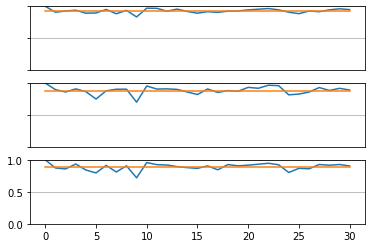

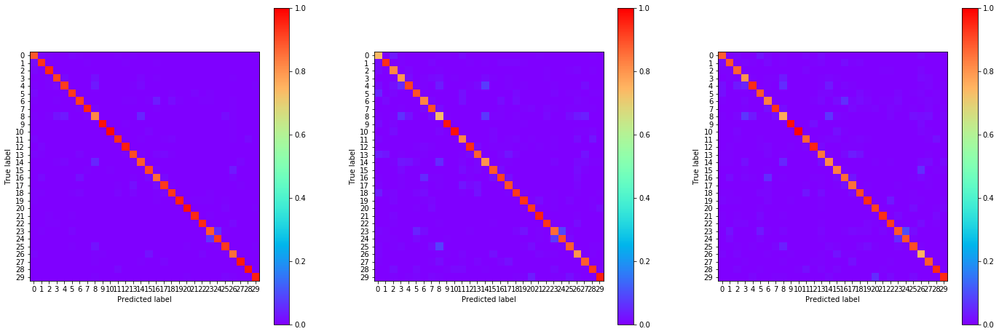

15:54:27.082051
#146 [Train: 0.251] [Test: 0.386] [Valid: 0.379]
#146 [Train: 0.926] [Test: 0.888] [Valid: 0.890]


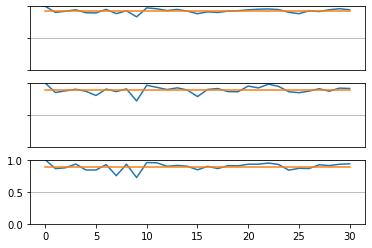

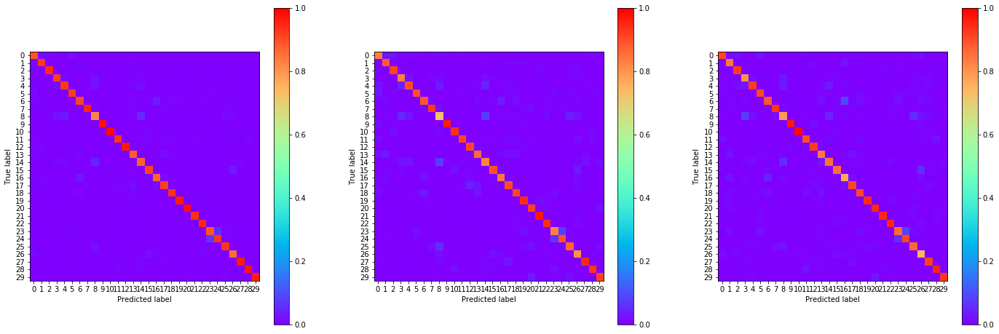

15:55:39.368592
#147 [Train: 0.243] [Test: 0.385] [Valid: 0.378]
#147 [Train: 0.929] [Test: 0.886] [Valid: 0.890]


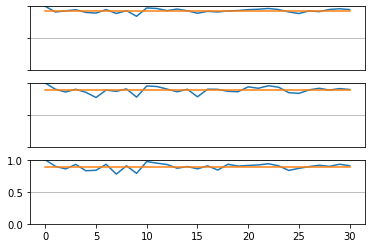

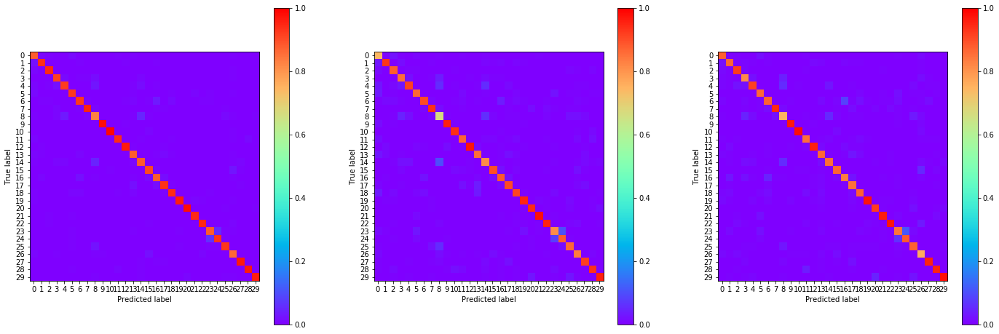

15:56:47.610110
#148 [Train: 0.241] [Test: 0.394] [Valid: 0.396]
#148 [Train: 0.929] [Test: 0.886] [Valid: 0.885]


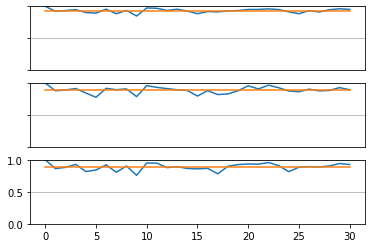

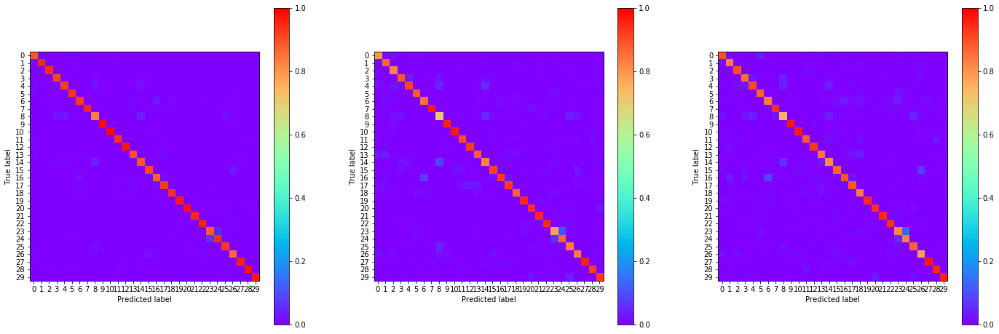

15:57:56.494080
#149 [Train: 0.242] [Test: 0.394] [Valid: 0.385]
#149 [Train: 0.929] [Test: 0.887] [Valid: 0.887]


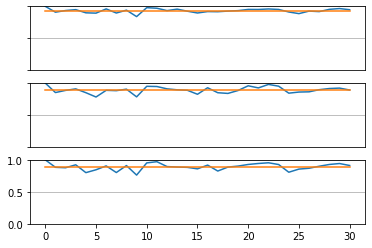

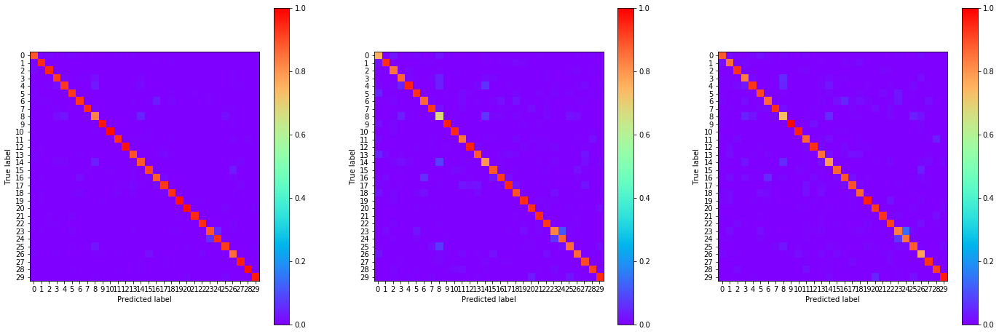

15:59:04.995731
#150 [Train: 0.239] [Test: 0.387] [Valid: 0.381]
#150 [Train: 0.930] [Test: 0.888] [Valid: 0.894]


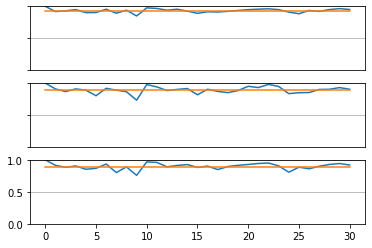

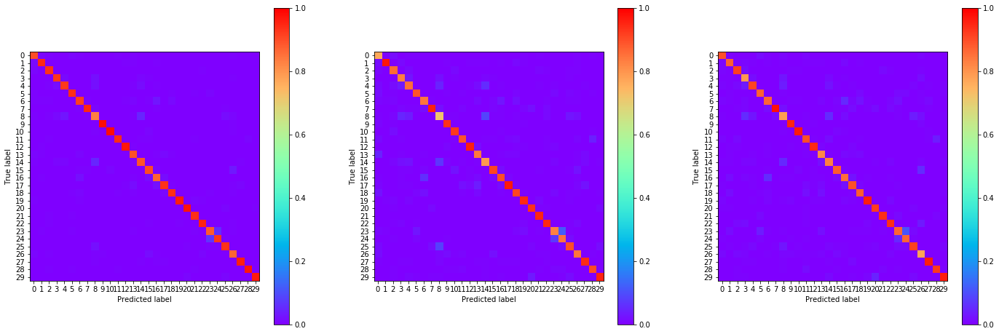

16:00:14.251272
#151 [Train: 0.237] [Test: 0.401] [Valid: 0.383]
#151 [Train: 0.930] [Test: 0.887] [Valid: 0.890]


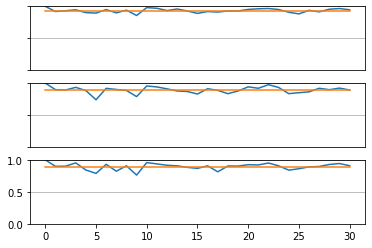

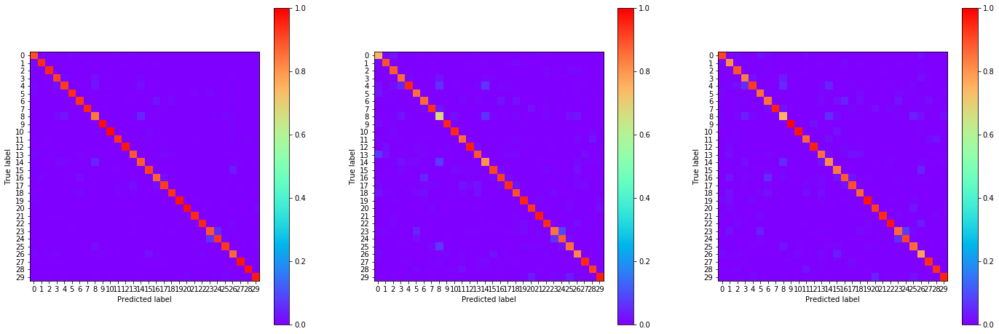

16:01:22.161451
#152 [Train: 0.234] [Test: 0.390] [Valid: 0.382]
#152 [Train: 0.932] [Test: 0.890] [Valid: 0.889]


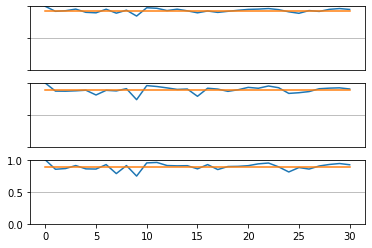

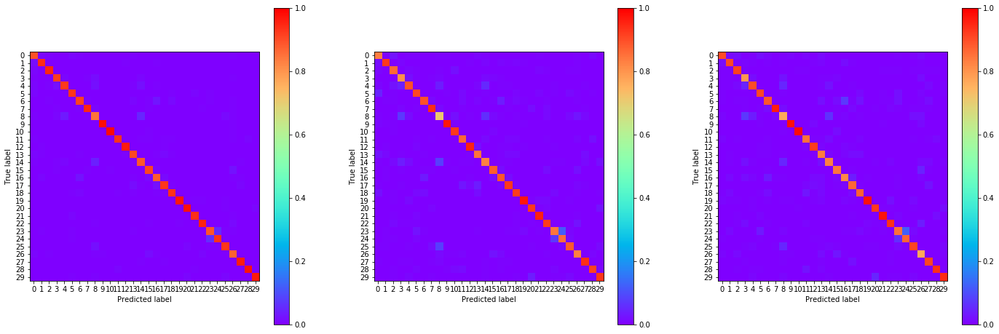

16:02:32.595514
#153 [Train: 0.233] [Test: 0.381] [Valid: 0.375]
#153 [Train: 0.931] [Test: 0.891] [Valid: 0.893]


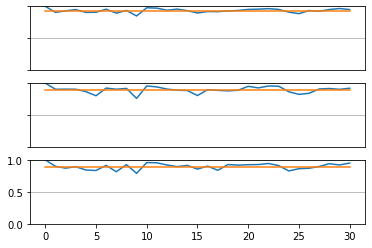

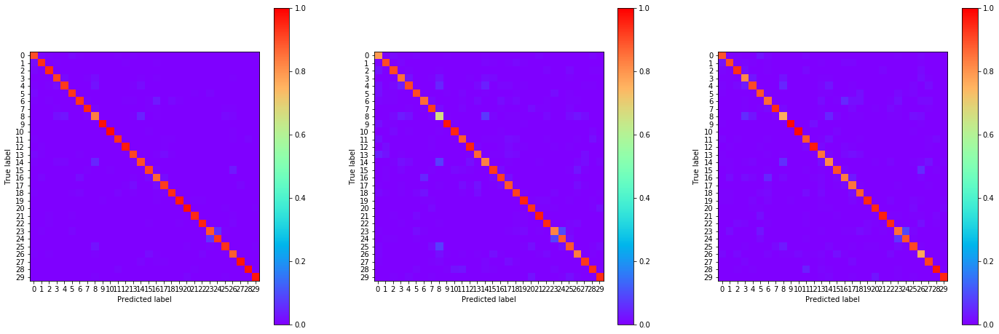

16:03:42.094790
#154 [Train: 0.233] [Test: 0.383] [Valid: 0.380]
#154 [Train: 0.931] [Test: 0.889] [Valid: 0.890]


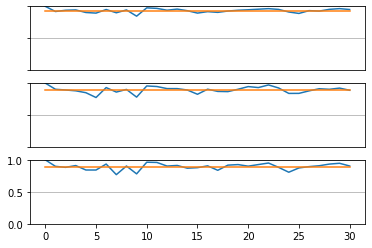

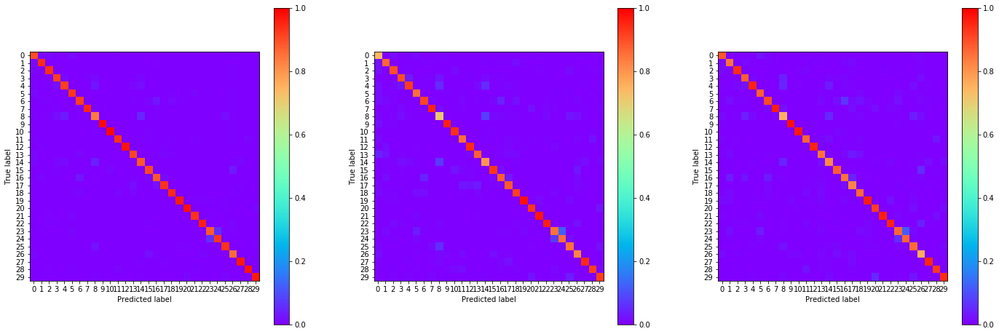

16:04:53.595452
#155 [Train: 0.235] [Test: 0.393] [Valid: 0.382]
#155 [Train: 0.930] [Test: 0.885] [Valid: 0.887]


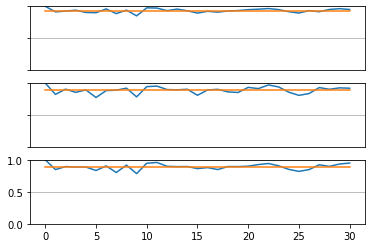

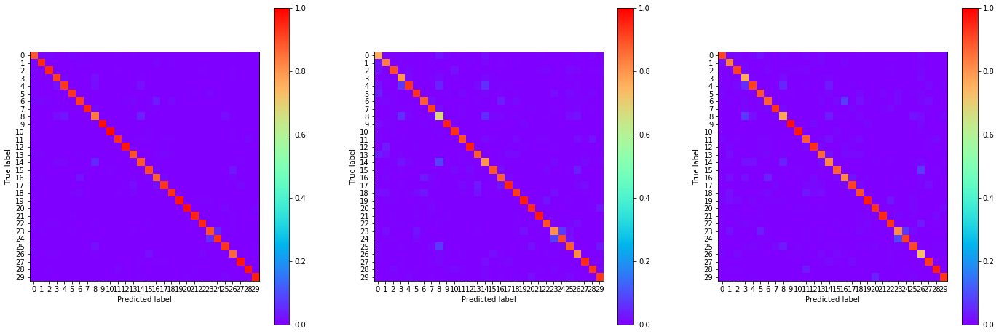

16:06:05.870787
#156 [Train: 0.230] [Test: 0.383] [Valid: 0.384]
#156 [Train: 0.932] [Test: 0.889] [Valid: 0.891]


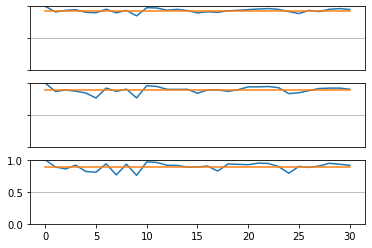

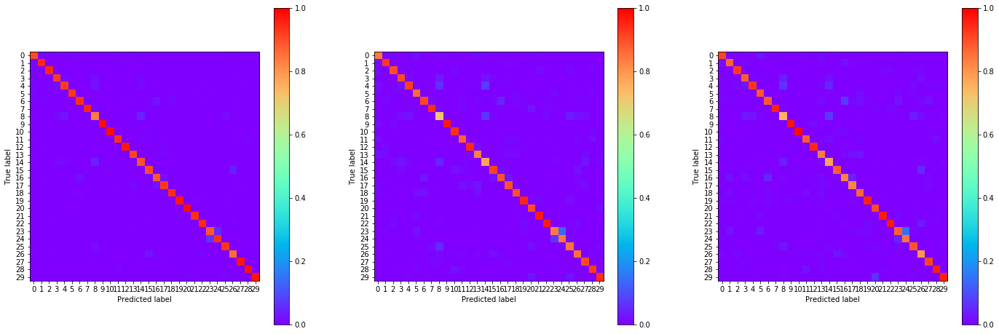

16:07:13.956470
#157 [Train: 0.229] [Test: 0.384] [Valid: 0.381]
#157 [Train: 0.933] [Test: 0.891] [Valid: 0.893]


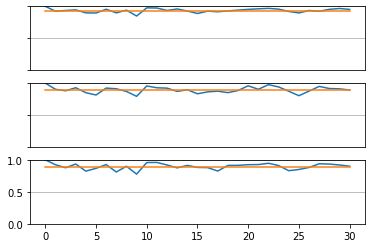

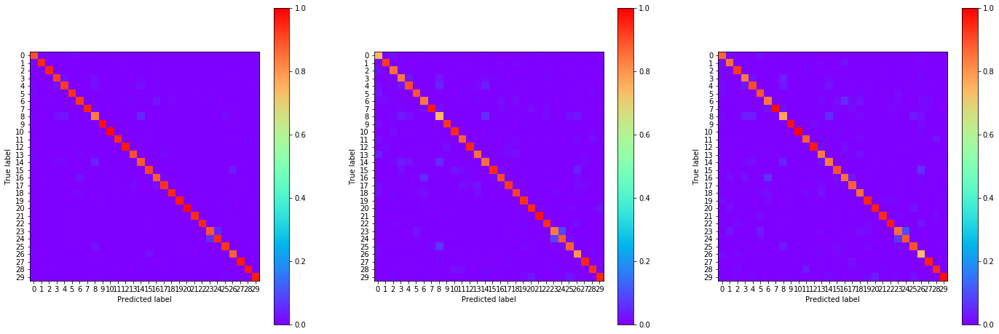

16:08:24.791170
#158 [Train: 0.223] [Test: 0.371] [Valid: 0.377]
#158 [Train: 0.934] [Test: 0.893] [Valid: 0.892]


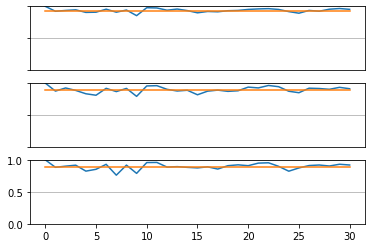

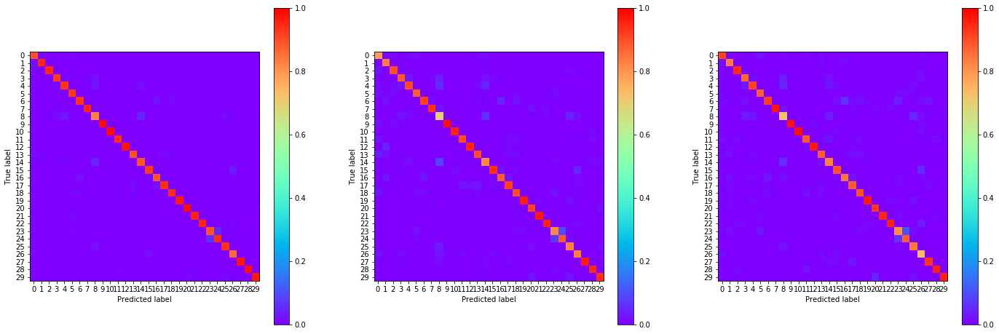

16:09:34.123293
#159 [Train: 0.222] [Test: 0.390] [Valid: 0.370]
#159 [Train: 0.935] [Test: 0.887] [Valid: 0.893]


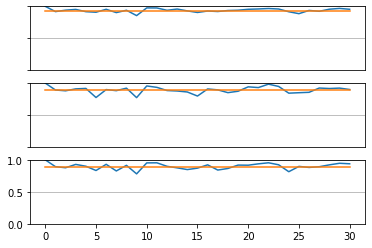

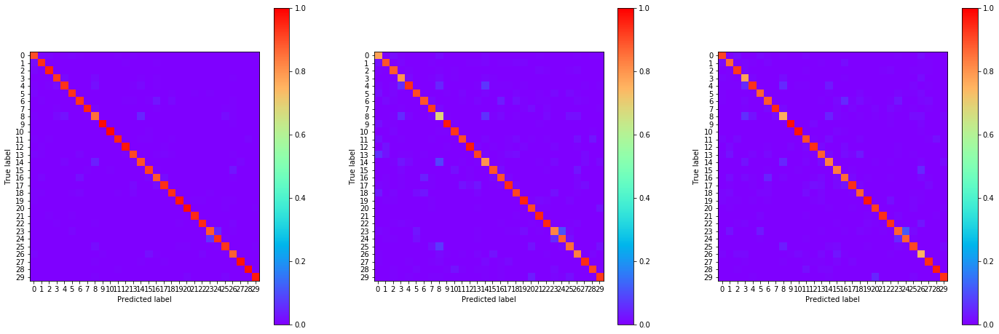

16:10:46.190673
#160 [Train: 0.222] [Test: 0.377] [Valid: 0.377]
#160 [Train: 0.935] [Test: 0.892] [Valid: 0.892]


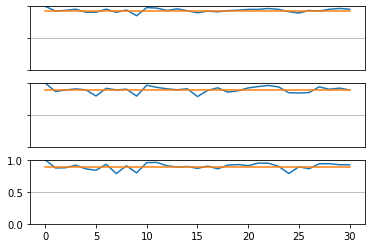

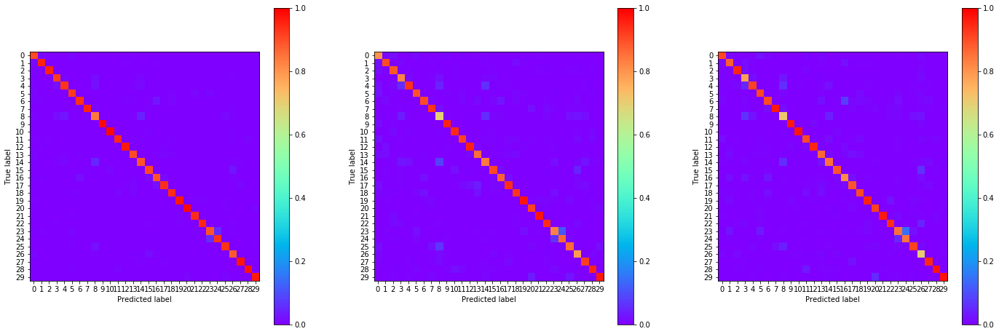

16:11:57.771211
#161 [Train: 0.222] [Test: 0.392] [Valid: 0.374]
#161 [Train: 0.934] [Test: 0.889] [Valid: 0.892]


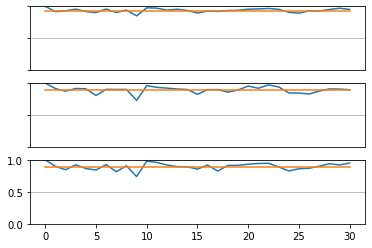

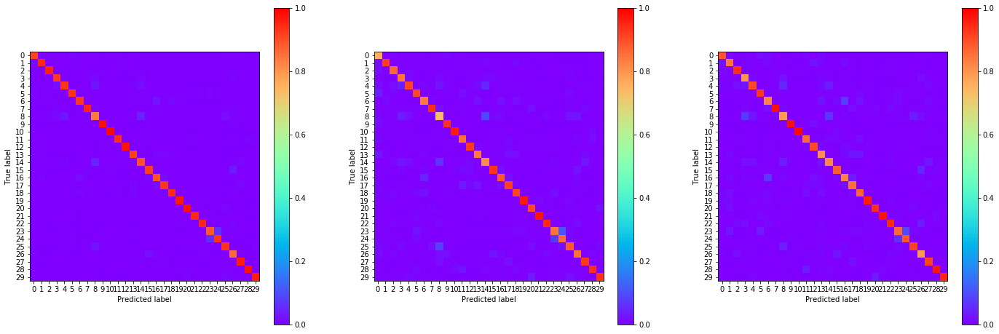

16:13:10.667049
#162 [Train: 0.221] [Test: 0.372] [Valid: 0.377]
#162 [Train: 0.934] [Test: 0.892] [Valid: 0.891]


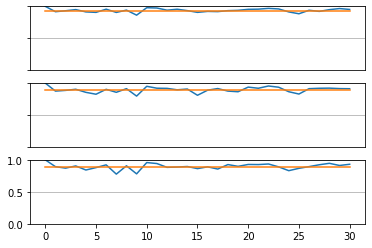

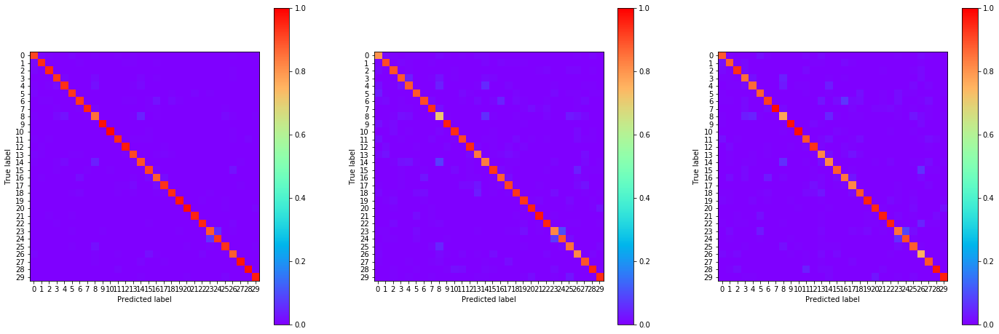

16:14:22.864614
#163 [Train: 0.218] [Test: 0.370] [Valid: 0.365]
#163 [Train: 0.936] [Test: 0.891] [Valid: 0.896]


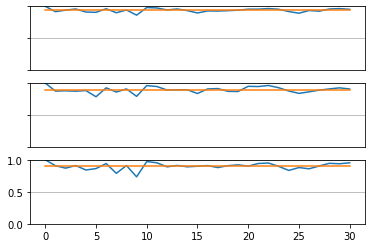

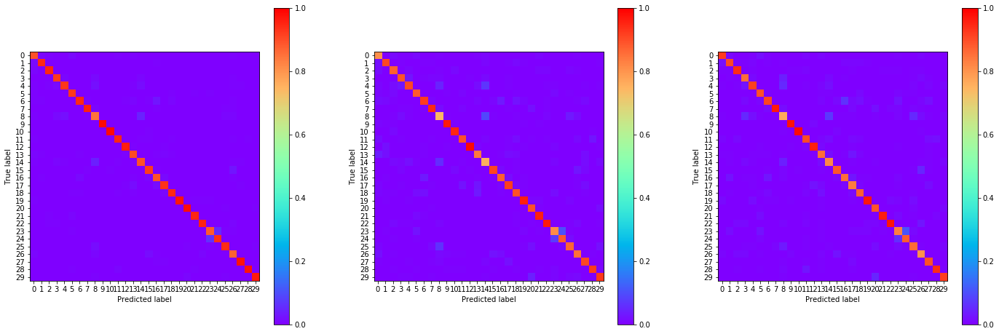

16:15:31.599098
#164 [Train: 0.215] [Test: 0.375] [Valid: 0.374]
#164 [Train: 0.935] [Test: 0.893] [Valid: 0.895]


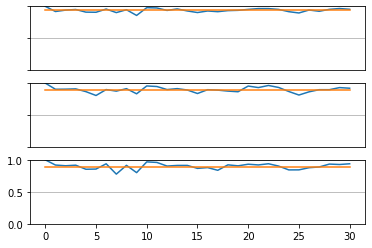

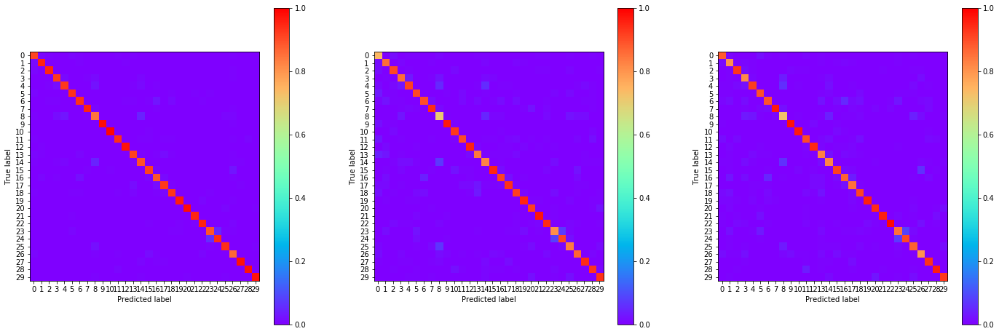

16:16:40.852298
#165 [Train: 0.214] [Test: 0.373] [Valid: 0.376]
#165 [Train: 0.936] [Test: 0.895] [Valid: 0.891]


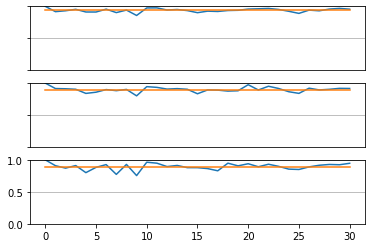

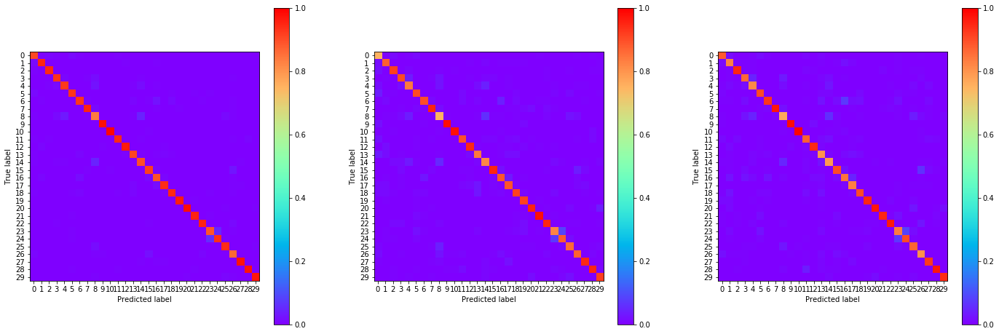

16:17:52.419359
#166 [Train: 0.213] [Test: 0.372] [Valid: 0.371]
#166 [Train: 0.937] [Test: 0.893] [Valid: 0.893]


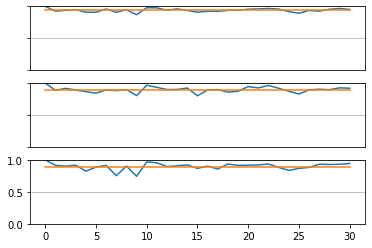

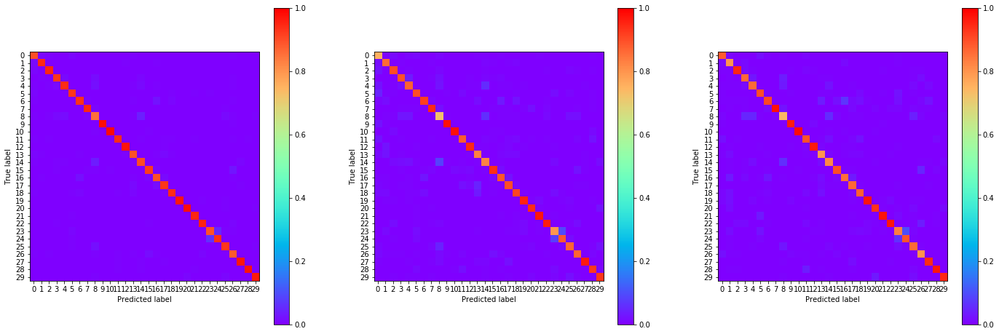

16:19:05.115193
#167 [Train: 0.213] [Test: 0.371] [Valid: 0.368]
#167 [Train: 0.936] [Test: 0.893] [Valid: 0.895]


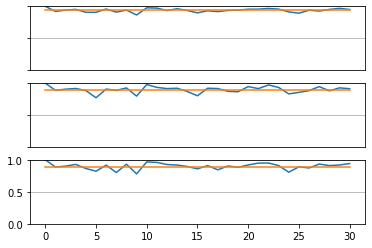

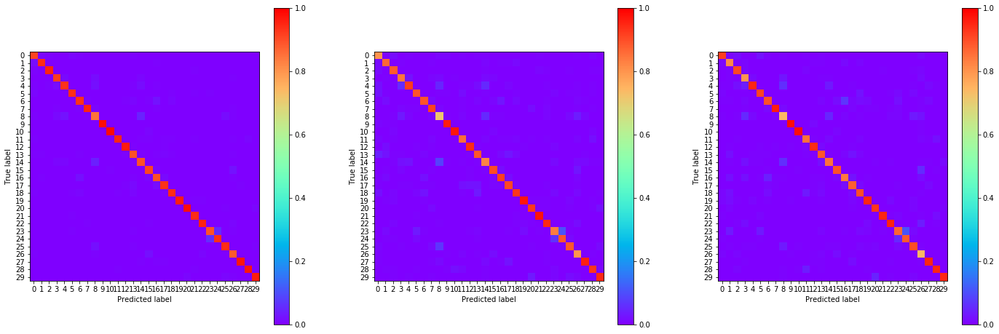

16:20:16.487013
#168 [Train: 0.210] [Test: 0.375] [Valid: 0.360]
#168 [Train: 0.937] [Test: 0.895] [Valid: 0.899]


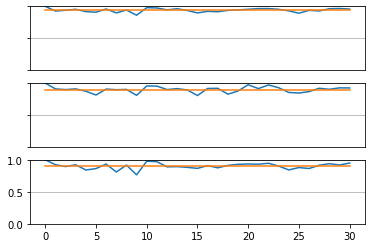

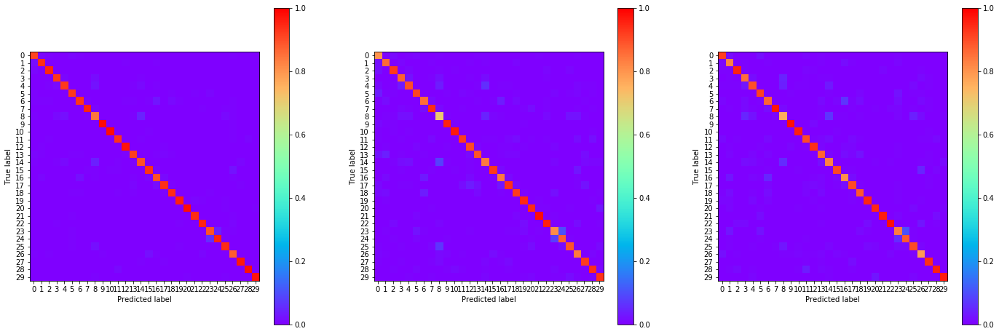

16:21:24.342774
#169 [Train: 0.211] [Test: 0.361] [Valid: 0.365]
#169 [Train: 0.938] [Test: 0.895] [Valid: 0.896]


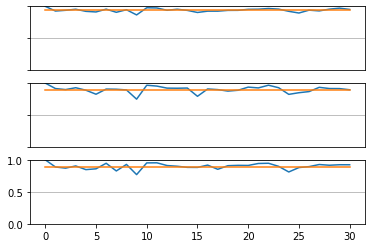

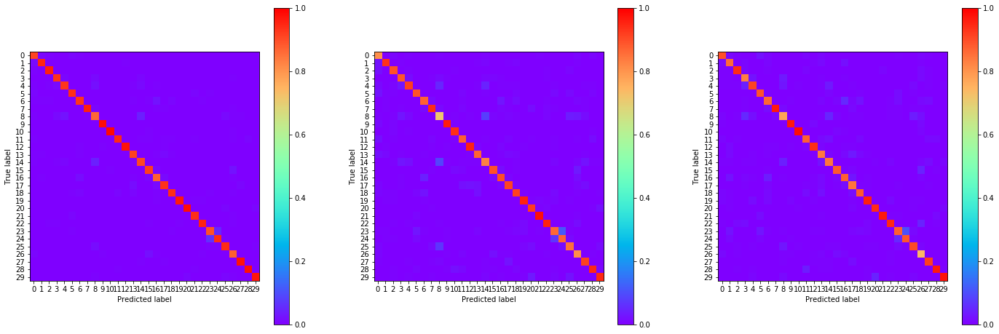

16:22:32.653983
#170 [Train: 0.206] [Test: 0.363] [Valid: 0.368]
#170 [Train: 0.939] [Test: 0.894] [Valid: 0.895]


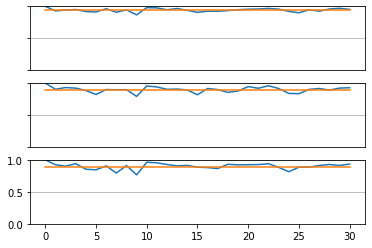

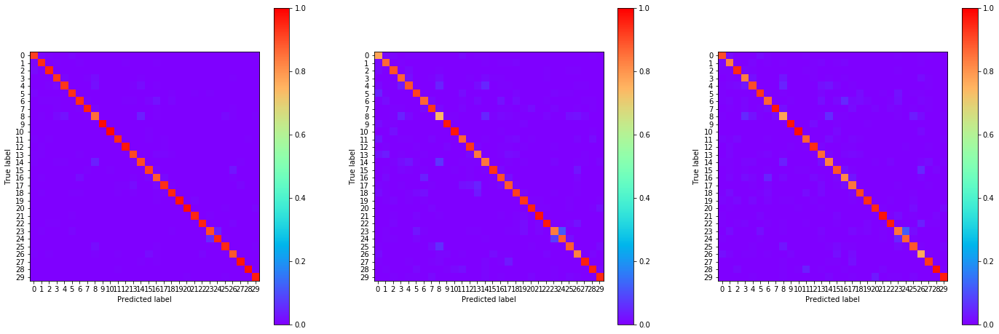

16:23:42.093006
#171 [Train: 0.202] [Test: 0.362] [Valid: 0.373]
#171 [Train: 0.940] [Test: 0.894] [Valid: 0.890]


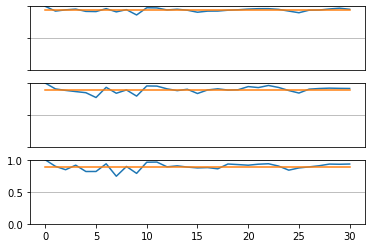

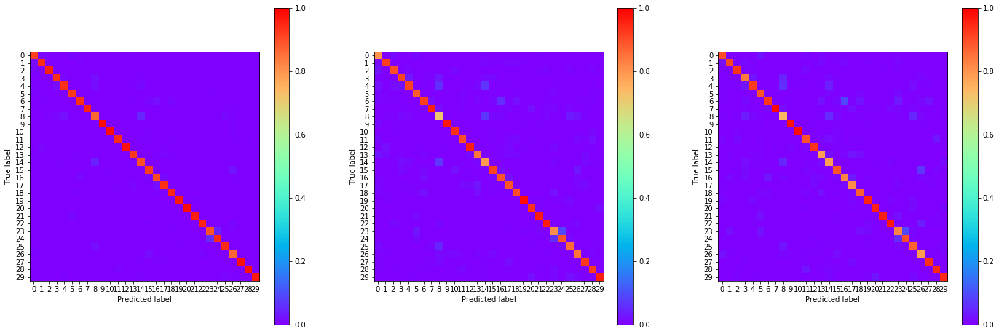

16:24:50.510017
#172 [Train: 0.203] [Test: 0.375] [Valid: 0.365]
#172 [Train: 0.940] [Test: 0.894] [Valid: 0.892]


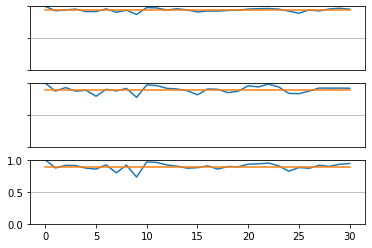

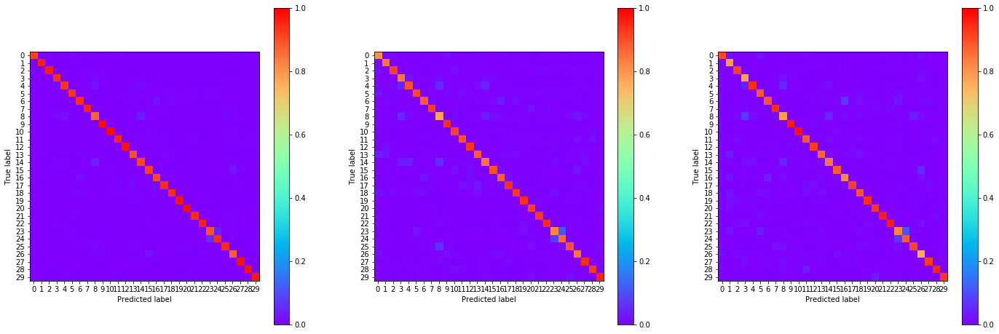

16:25:59.554600
#173 [Train: 0.206] [Test: 0.382] [Valid: 0.376]
#173 [Train: 0.939] [Test: 0.890] [Valid: 0.892]


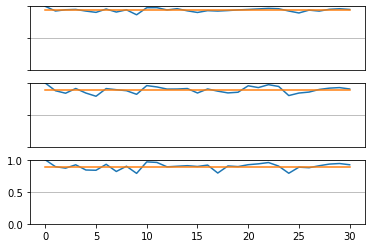

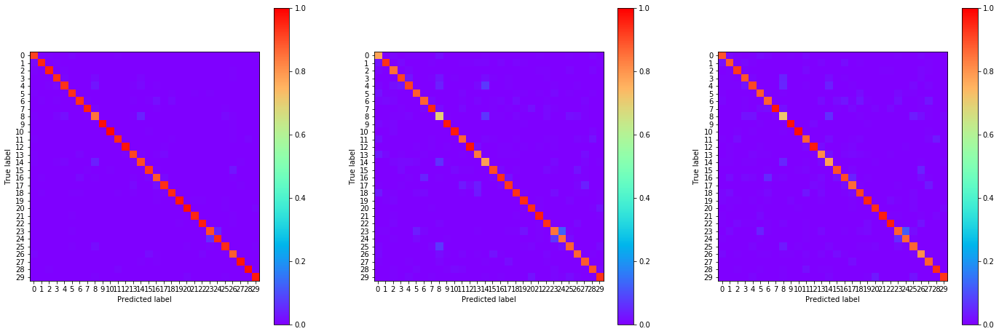

16:27:07.107502
#174 [Train: 0.203] [Test: 0.354] [Valid: 0.361]
#174 [Train: 0.940] [Test: 0.900] [Valid: 0.896]


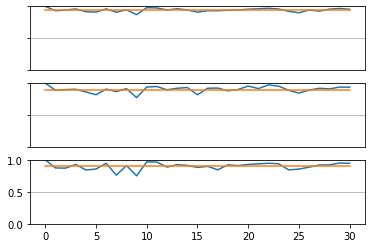

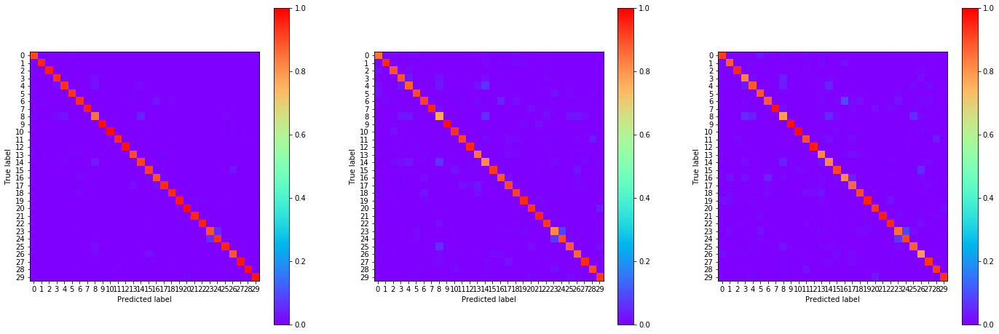

16:28:15.570865
#175 [Train: 0.198] [Test: 0.367] [Valid: 0.372]
#175 [Train: 0.942] [Test: 0.895] [Valid: 0.896]


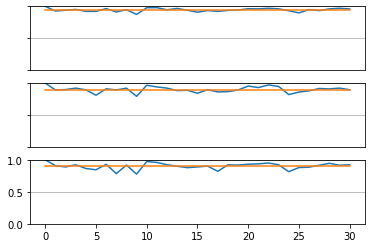

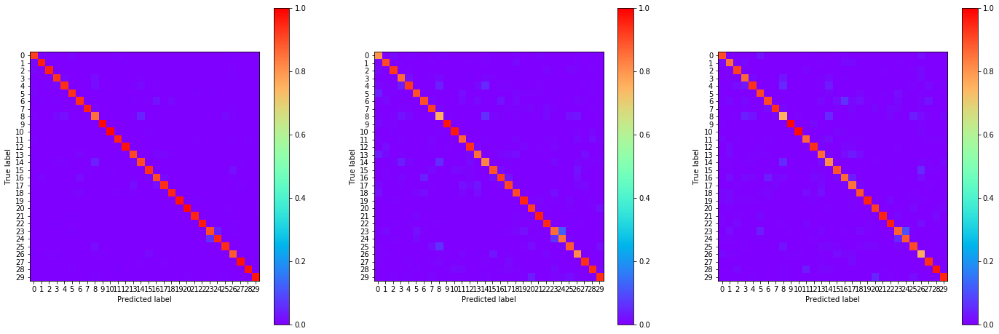

16:29:26.321973
#176 [Train: 0.200] [Test: 0.366] [Valid: 0.362]
#176 [Train: 0.941] [Test: 0.895] [Valid: 0.898]


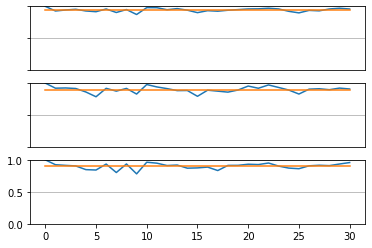

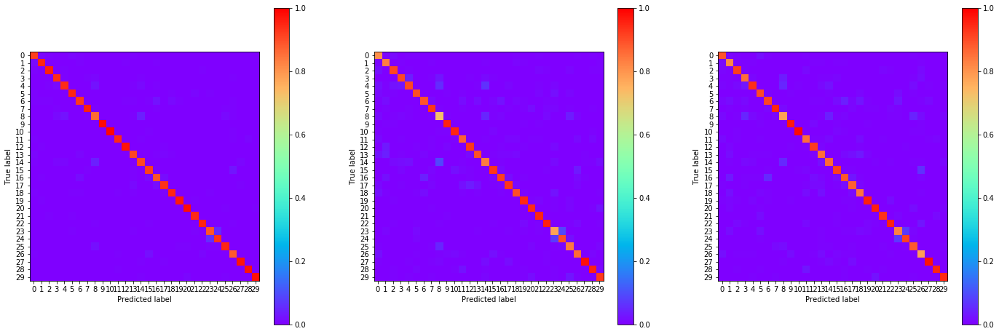

16:30:41.395602
#177 [Train: 0.198] [Test: 0.368] [Valid: 0.368]
#177 [Train: 0.941] [Test: 0.897] [Valid: 0.896]


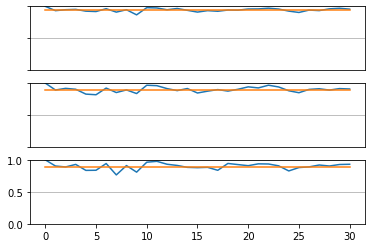

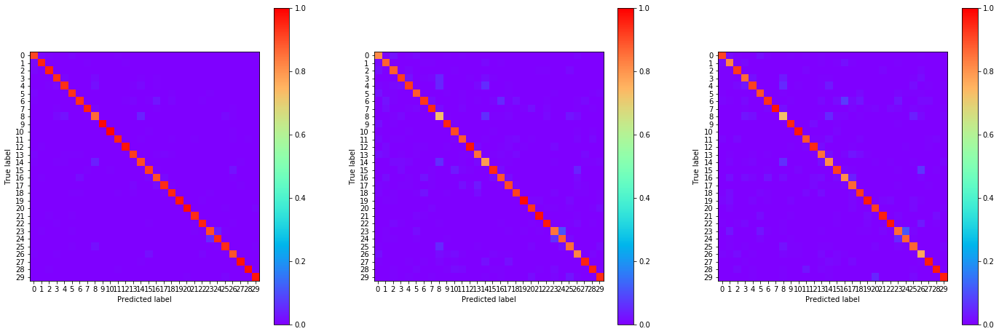

16:31:57.695603
#178 [Train: 0.195] [Test: 0.352] [Valid: 0.360]
#178 [Train: 0.943] [Test: 0.898] [Valid: 0.899]


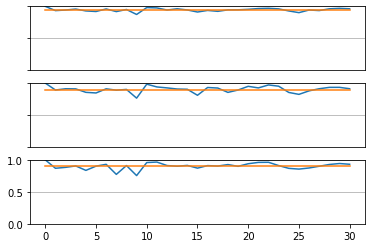

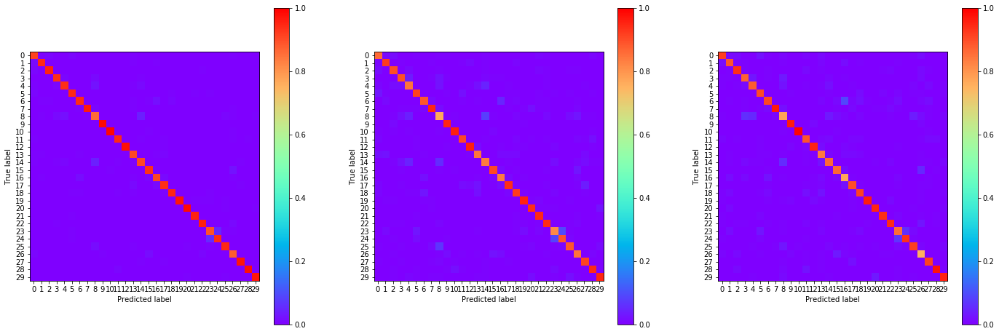

16:33:10.434450
#179 [Train: 0.193] [Test: 0.363] [Valid: 0.361]
#179 [Train: 0.943] [Test: 0.896] [Valid: 0.895]


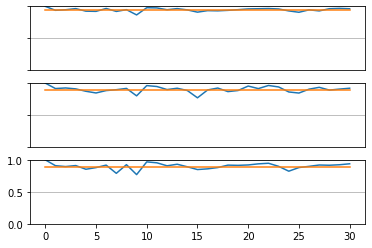

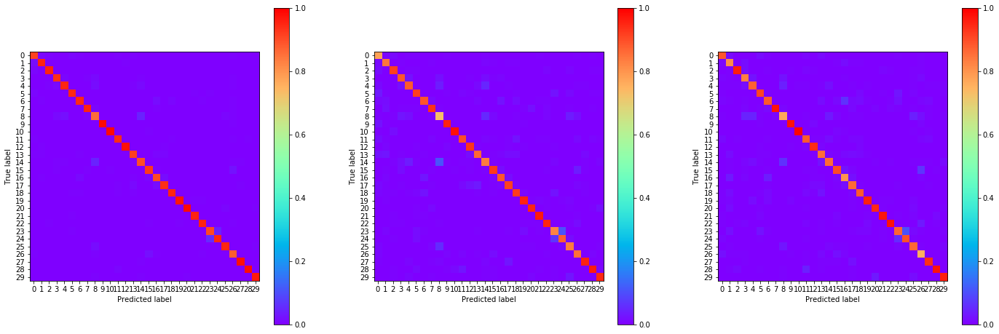

16:34:17.867293
#180 [Train: 0.191] [Test: 0.373] [Valid: 0.374]
#180 [Train: 0.944] [Test: 0.895] [Valid: 0.894]


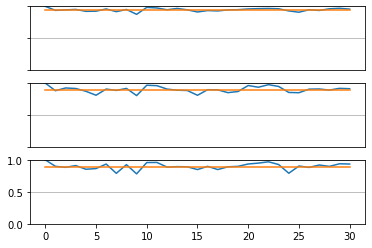

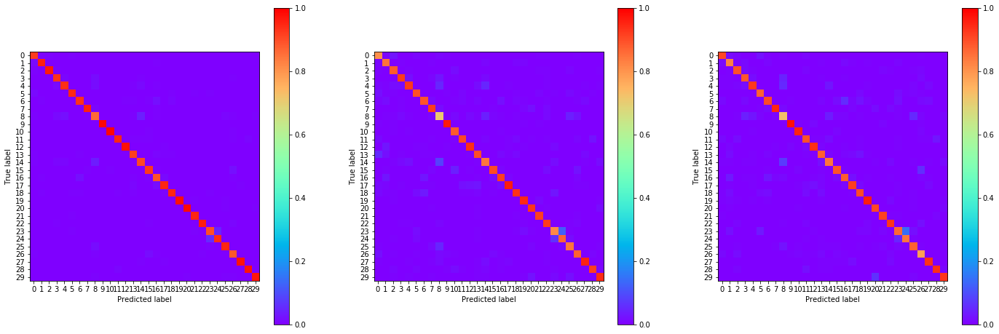

16:35:26.303273
#181 [Train: 0.192] [Test: 0.363] [Valid: 0.363]
#181 [Train: 0.943] [Test: 0.898] [Valid: 0.898]


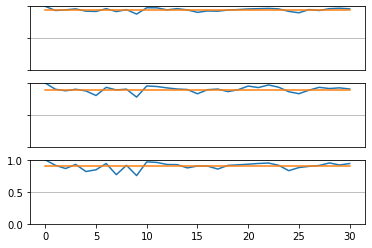

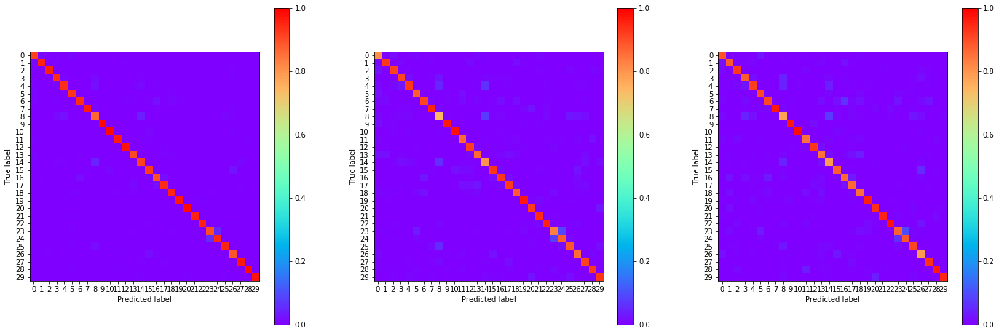

16:36:34.735143
#182 [Train: 0.193] [Test: 0.372] [Valid: 0.383]
#182 [Train: 0.943] [Test: 0.893] [Valid: 0.894]


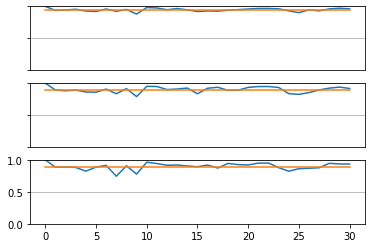

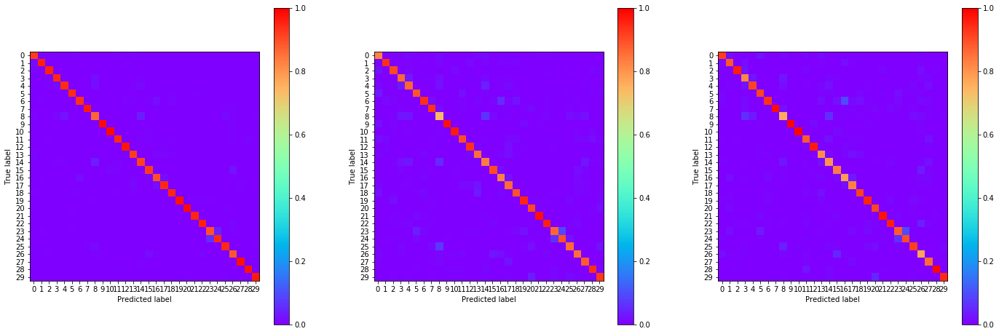

16:37:46.647680
#183 [Train: 0.192] [Test: 0.368] [Valid: 0.358]
#183 [Train: 0.943] [Test: 0.899] [Valid: 0.898]


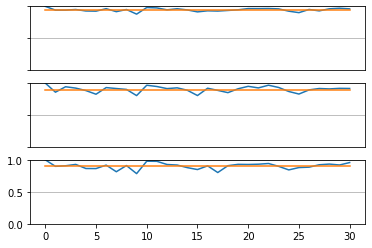

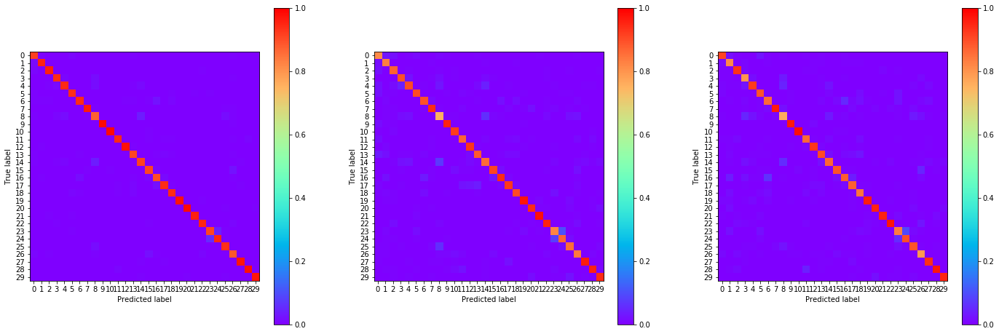

16:38:57.447970
#184 [Train: 0.187] [Test: 0.370] [Valid: 0.367]
#184 [Train: 0.946] [Test: 0.895] [Valid: 0.898]


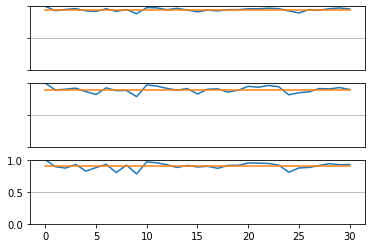

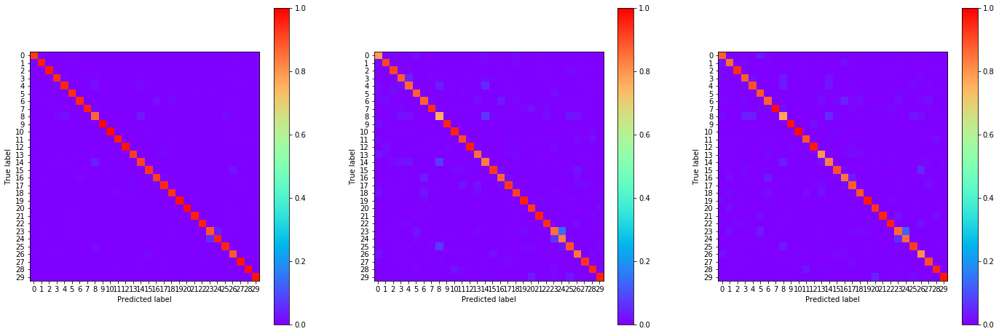

16:40:06.681461
#185 [Train: 0.187] [Test: 0.369] [Valid: 0.363]
#185 [Train: 0.945] [Test: 0.898] [Valid: 0.897]


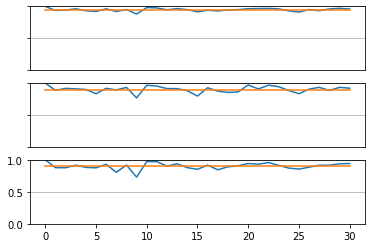

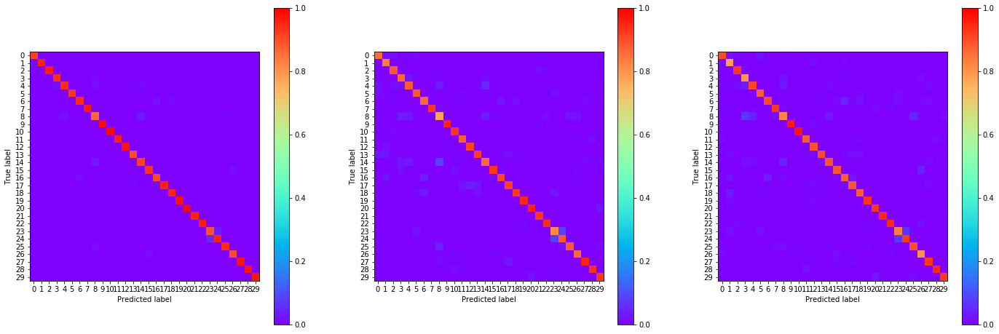

16:41:16.545561
#186 [Train: 0.187] [Test: 0.372] [Valid: 0.373]
#186 [Train: 0.945] [Test: 0.892] [Valid: 0.896]


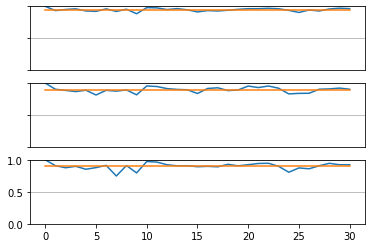

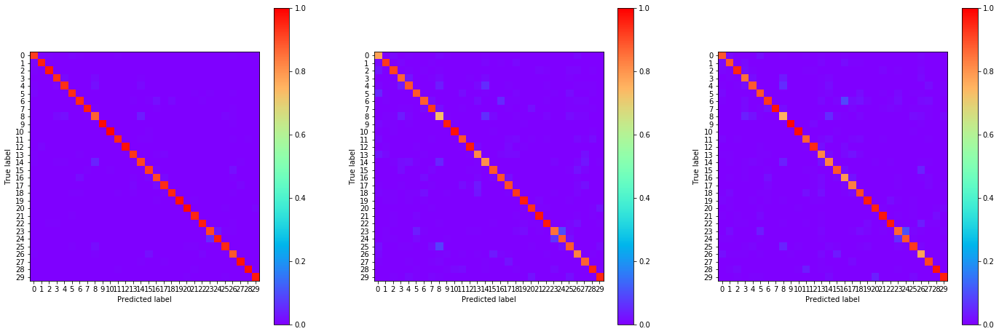

16:42:27.243606
#187 [Train: 0.181] [Test: 0.370] [Valid: 0.363]
#187 [Train: 0.947] [Test: 0.896] [Valid: 0.899]


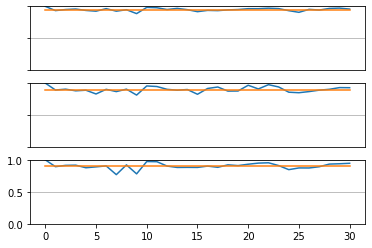

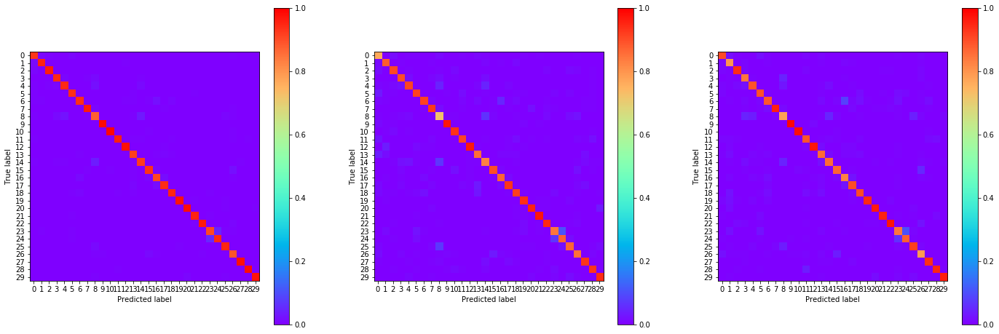

16:43:44.289332
#188 [Train: 0.183] [Test: 0.375] [Valid: 0.379]
#188 [Train: 0.946] [Test: 0.895] [Valid: 0.894]


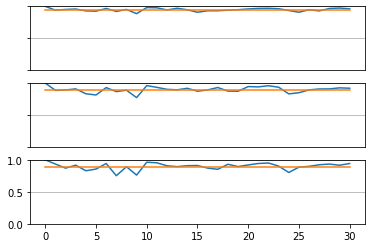

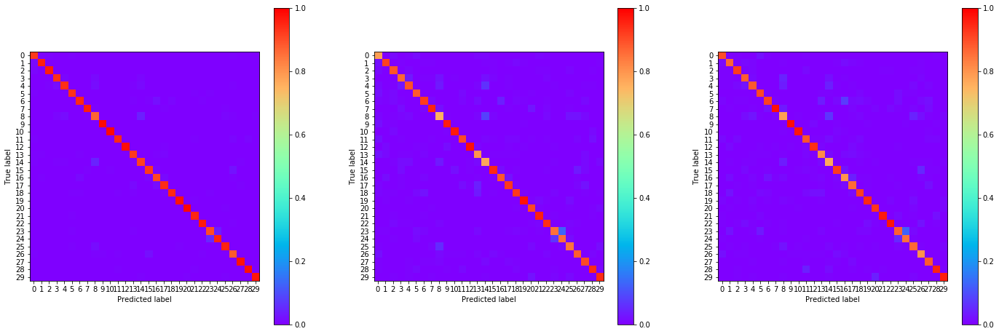

16:44:55.427725
#189 [Train: 0.185] [Test: 0.388] [Valid: 0.375]
#189 [Train: 0.945] [Test: 0.893] [Valid: 0.897]


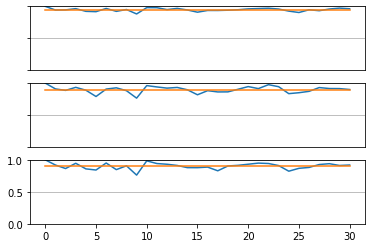

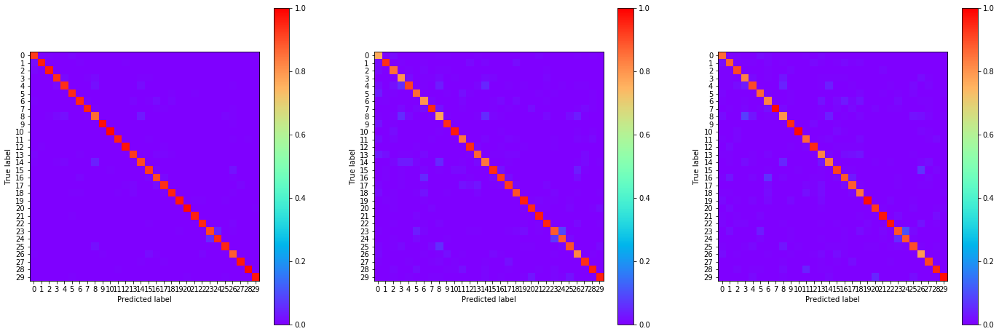

16:46:05.087071
#190 [Train: 0.184] [Test: 0.373] [Valid: 0.363]
#190 [Train: 0.945] [Test: 0.894] [Valid: 0.895]


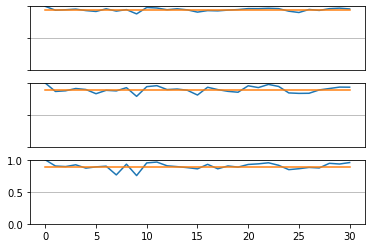

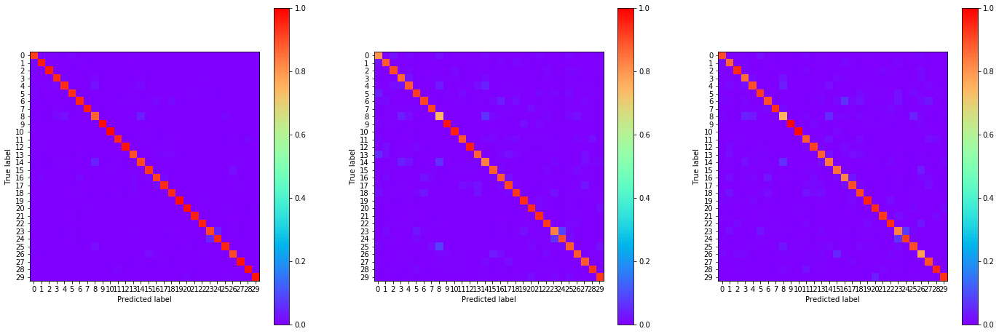

16:47:13.222396
#191 [Train: 0.178] [Test: 0.374] [Valid: 0.370]
#191 [Train: 0.947] [Test: 0.895] [Valid: 0.898]


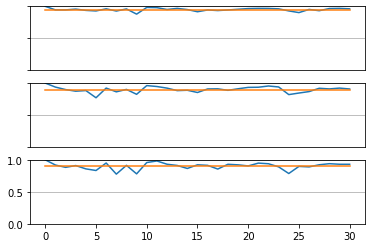

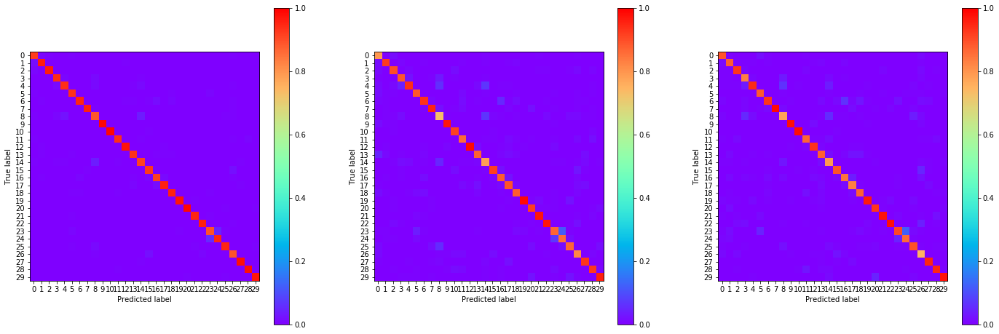

16:48:22.662904
#192 [Train: 0.180] [Test: 0.368] [Valid: 0.359]
#192 [Train: 0.947] [Test: 0.895] [Valid: 0.900]


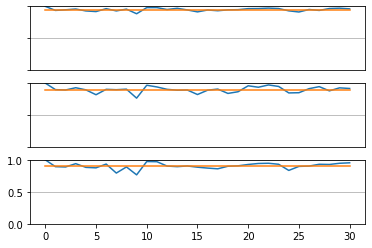

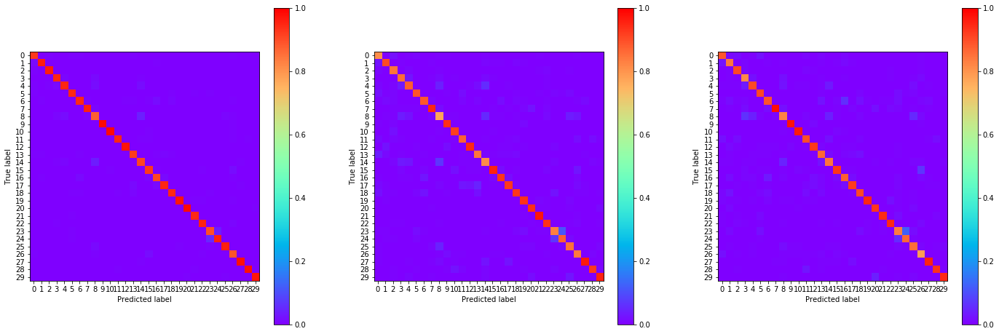

16:49:30.252233
#193 [Train: 0.177] [Test: 0.362] [Valid: 0.360]
#193 [Train: 0.948] [Test: 0.900] [Valid: 0.897]


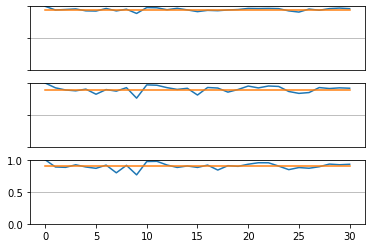

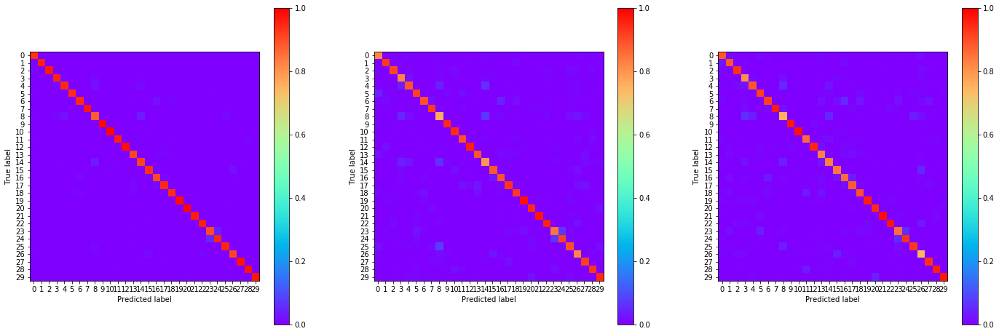

16:50:41.143153
#194 [Train: 0.175] [Test: 0.360] [Valid: 0.365]
#194 [Train: 0.949] [Test: 0.898] [Valid: 0.899]


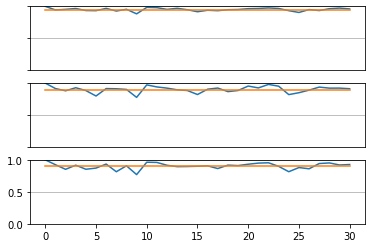

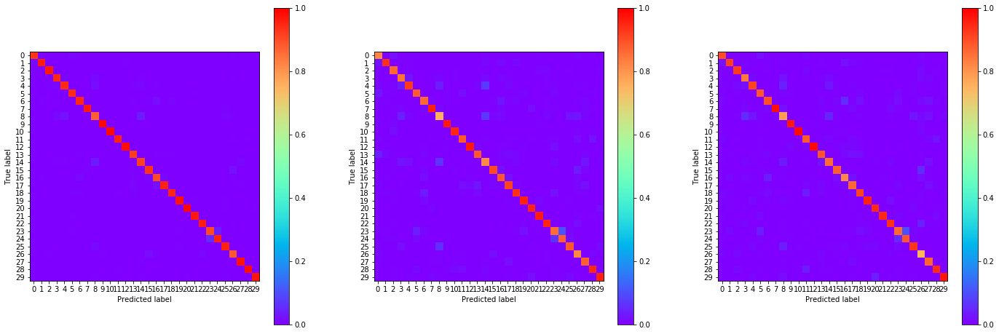

16:51:55.647194
#195 [Train: 0.176] [Test: 0.361] [Valid: 0.359]
#195 [Train: 0.948] [Test: 0.897] [Valid: 0.902]


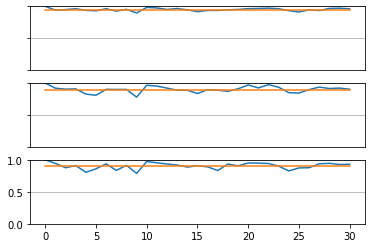

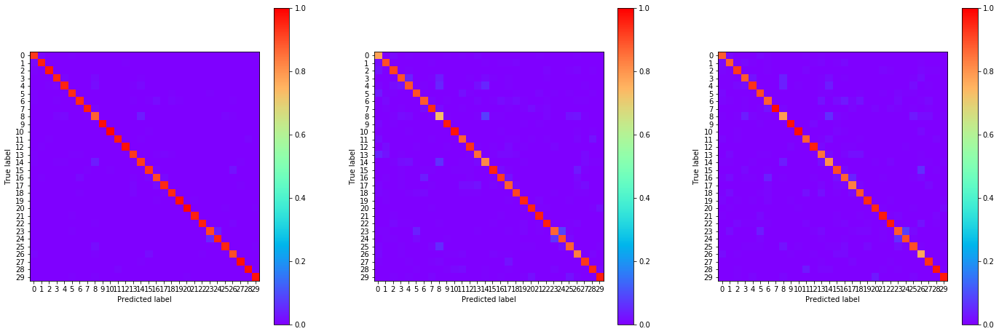

16:53:09.959228
#196 [Train: 0.174] [Test: 0.359] [Valid: 0.359]
#196 [Train: 0.949] [Test: 0.898] [Valid: 0.897]


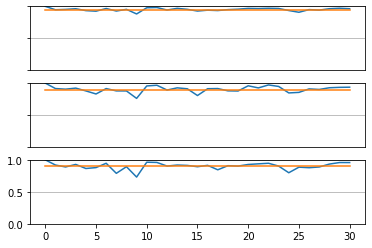

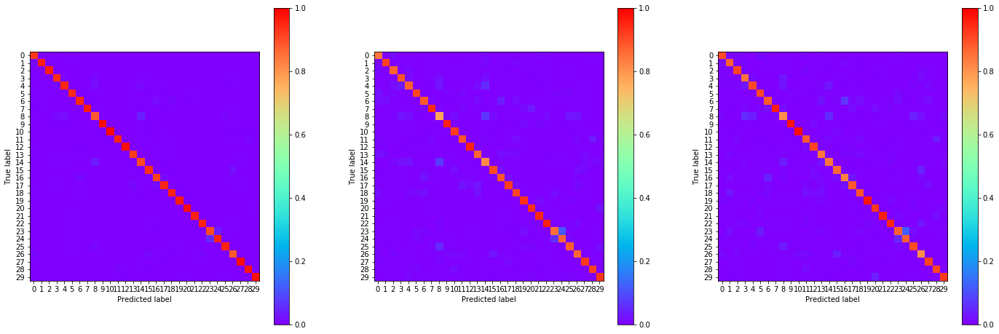

16:54:19.538895
#197 [Train: 0.174] [Test: 0.363] [Valid: 0.356]
#197 [Train: 0.949] [Test: 0.899] [Valid: 0.900]


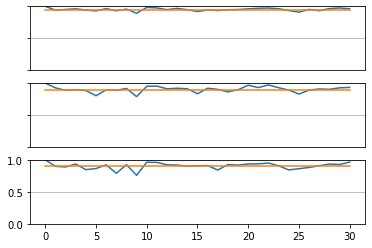

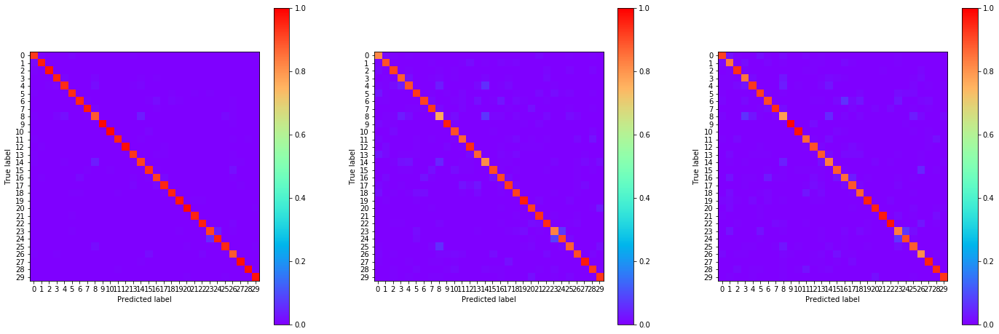

16:55:27.890793
#198 [Train: 0.173] [Test: 0.361] [Valid: 0.357]
#198 [Train: 0.949] [Test: 0.898] [Valid: 0.901]


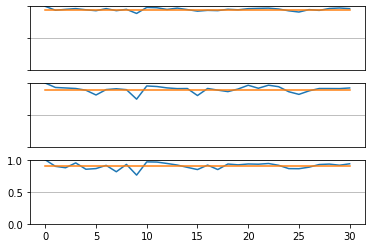

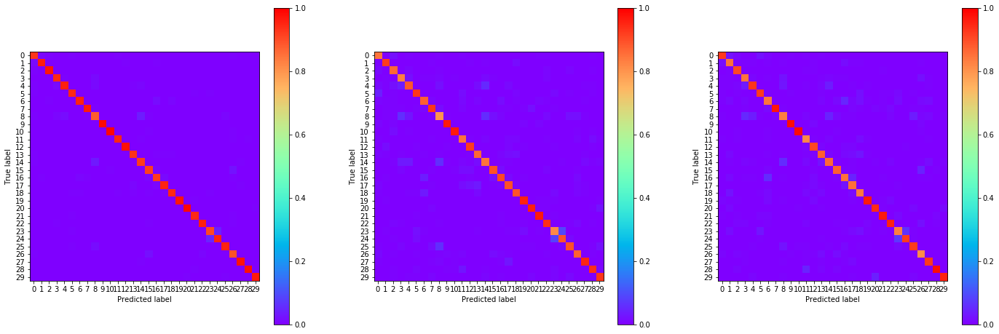

16:56:36.446088
#199 [Train: 0.171] [Test: 0.363] [Valid: 0.365]
#199 [Train: 0.950] [Test: 0.898] [Valid: 0.901]


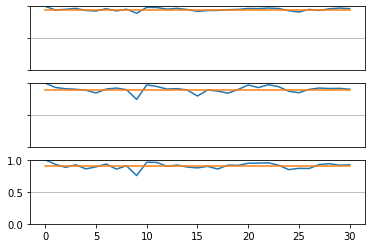

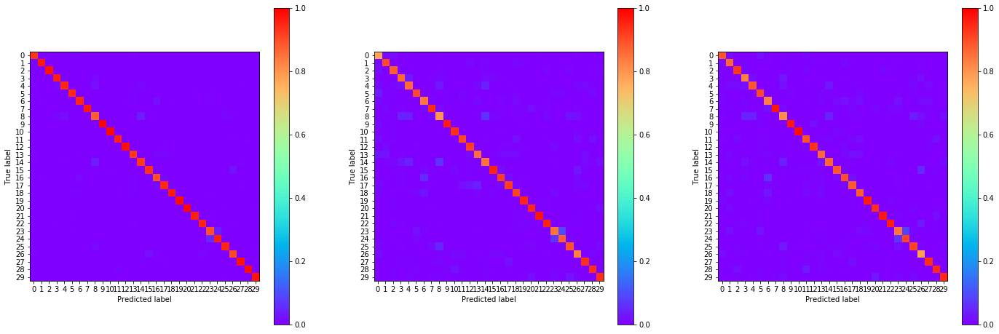

16:57:45.477923
#200 [Train: 0.169] [Test: 0.354] [Valid: 0.372]
#200 [Train: 0.951] [Test: 0.898] [Valid: 0.896]


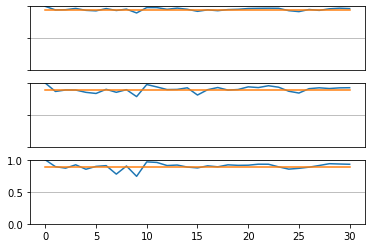

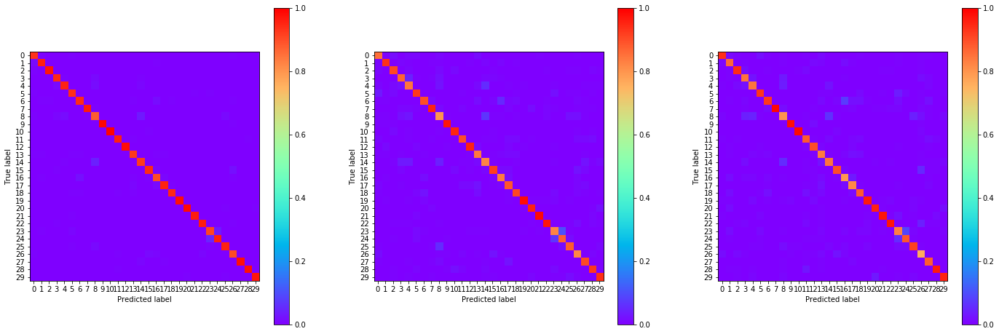

16:58:53.803284
#201 [Train: 0.168] [Test: 0.362] [Valid: 0.363]
#201 [Train: 0.949] [Test: 0.899] [Valid: 0.896]


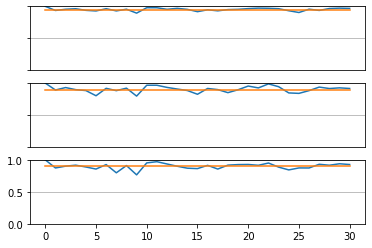

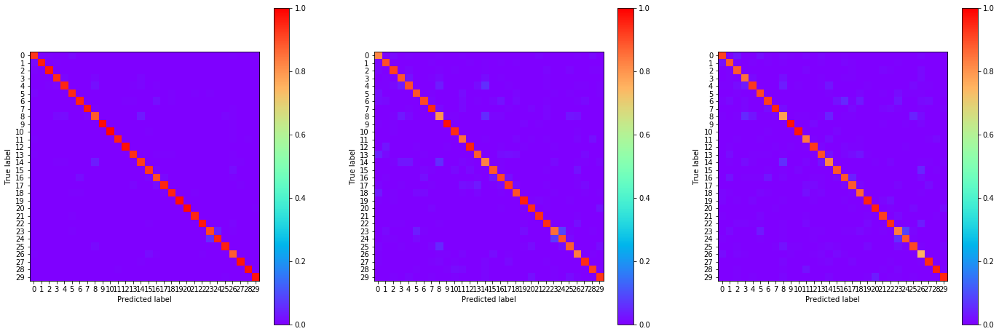

17:00:01.733269
#202 [Train: 0.166] [Test: 0.367] [Valid: 0.376]
#202 [Train: 0.952] [Test: 0.897] [Valid: 0.898]


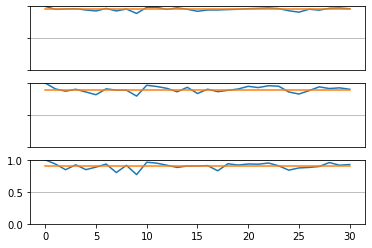

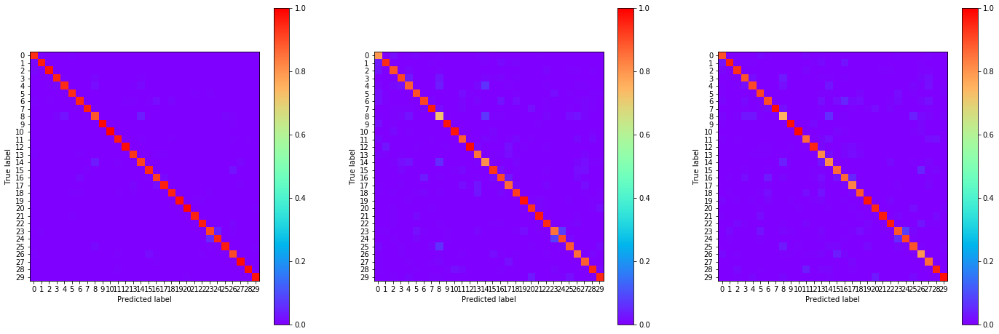

17:01:09.433851
#203 [Train: 0.168] [Test: 0.360] [Valid: 0.357]
#203 [Train: 0.950] [Test: 0.898] [Valid: 0.899]


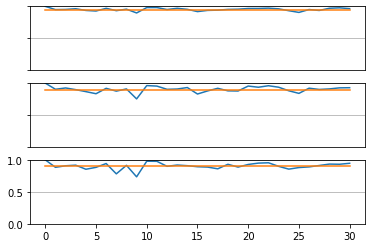

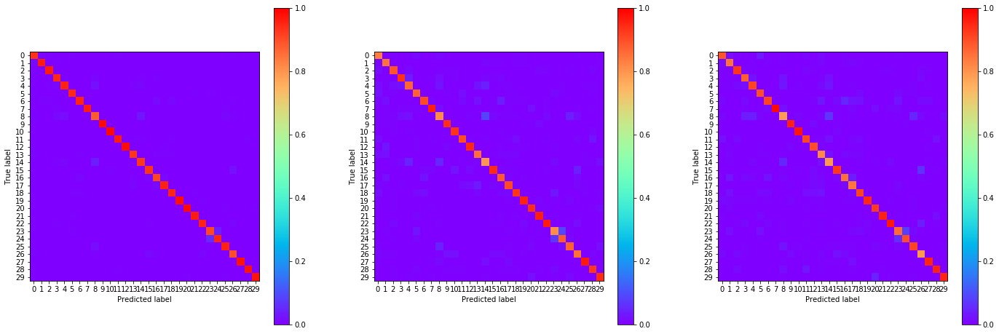

17:02:19.194811
#204 [Train: 0.167] [Test: 0.366] [Valid: 0.363]
#204 [Train: 0.950] [Test: 0.897] [Valid: 0.900]


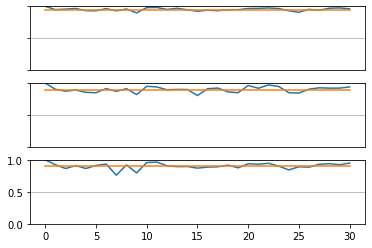

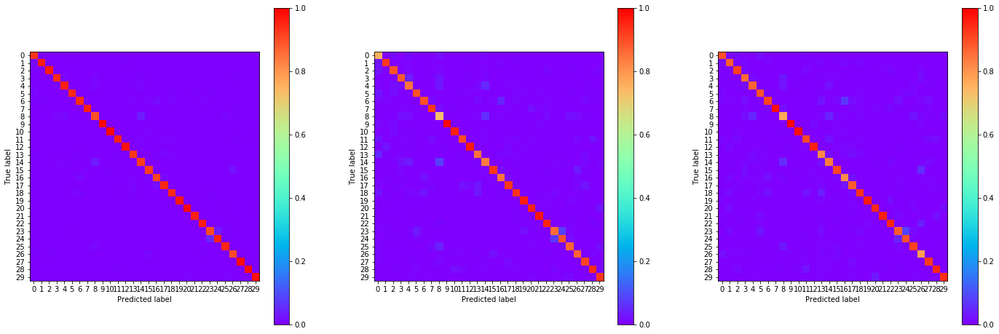

17:03:28.513013
#205 [Train: 0.162] [Test: 0.366] [Valid: 0.357]
#205 [Train: 0.952] [Test: 0.899] [Valid: 0.902]


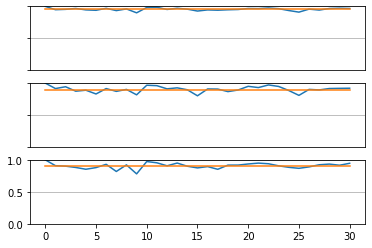

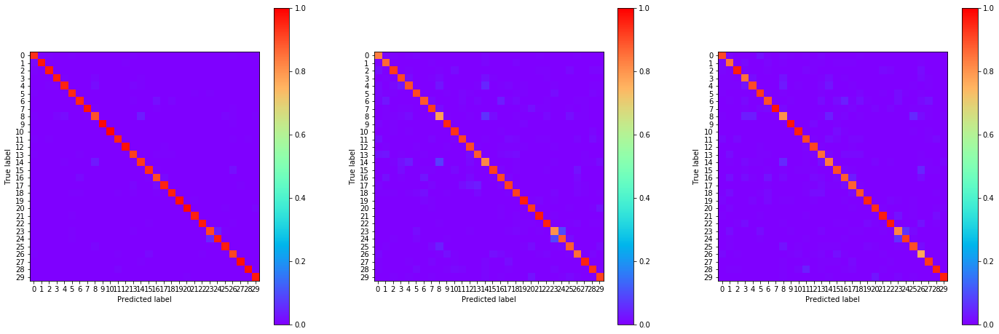

17:04:37.120749
#206 [Train: 0.161] [Test: 0.344] [Valid: 0.357]
#206 [Train: 0.952] [Test: 0.905] [Valid: 0.903]


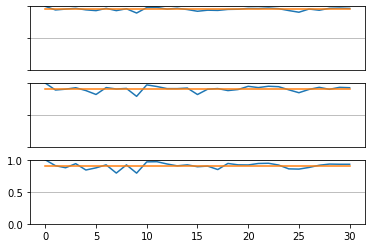

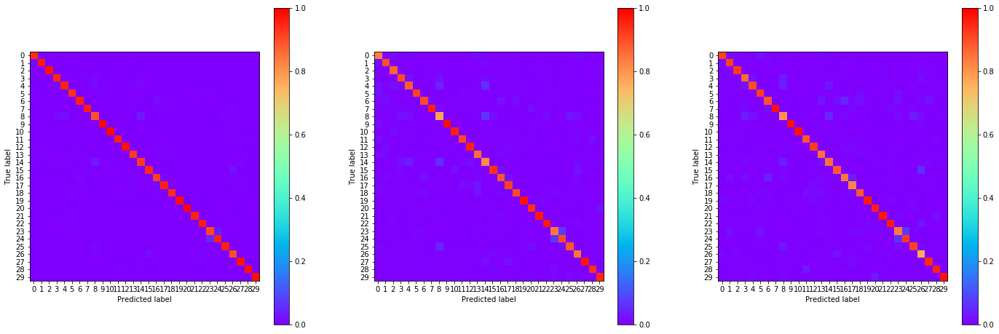

17:05:45.642529
#207 [Train: 0.162] [Test: 0.360] [Valid: 0.356]
#207 [Train: 0.952] [Test: 0.901] [Valid: 0.901]


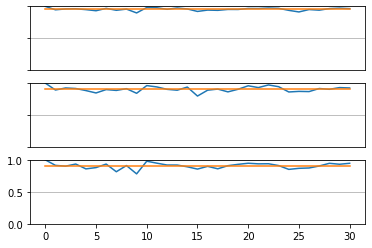

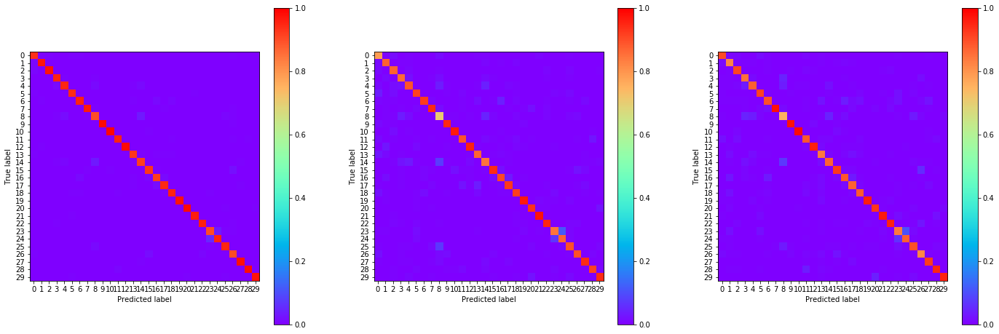

17:06:54.814709
#208 [Train: 0.161] [Test: 0.351] [Valid: 0.362]
#208 [Train: 0.953] [Test: 0.903] [Valid: 0.901]


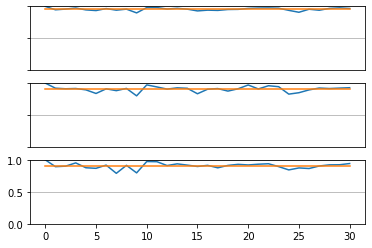

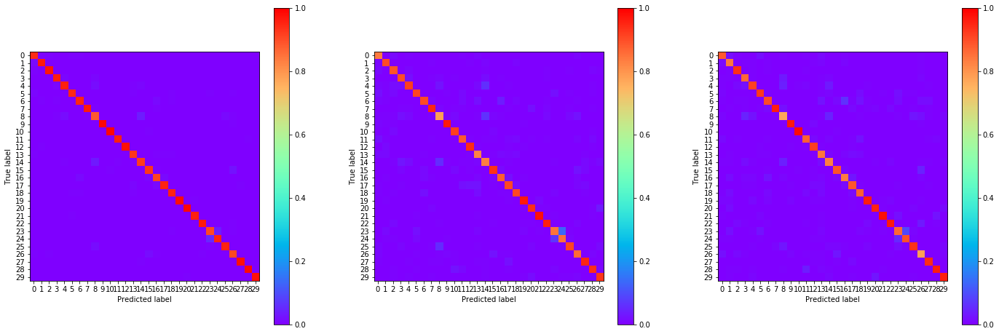

17:08:03.040309
#209 [Train: 0.159] [Test: 0.367] [Valid: 0.373]
#209 [Train: 0.952] [Test: 0.897] [Valid: 0.901]


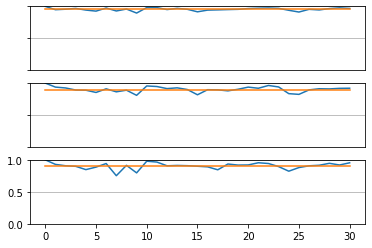

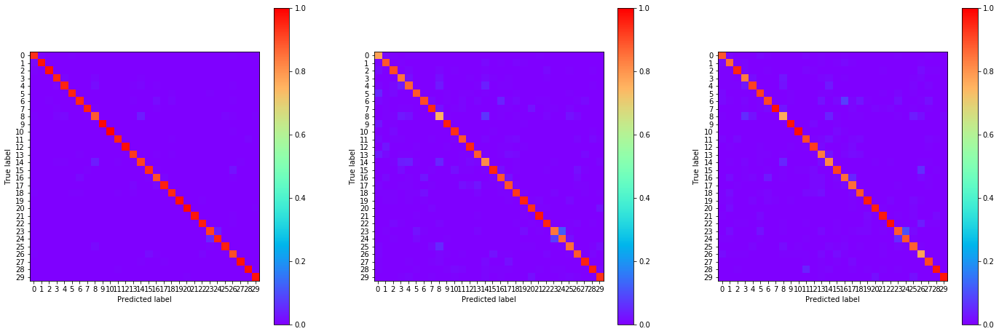

17:09:11.272531
#210 [Train: 0.161] [Test: 0.361] [Valid: 0.365]
#210 [Train: 0.953] [Test: 0.903] [Valid: 0.902]


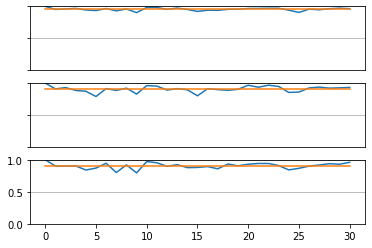

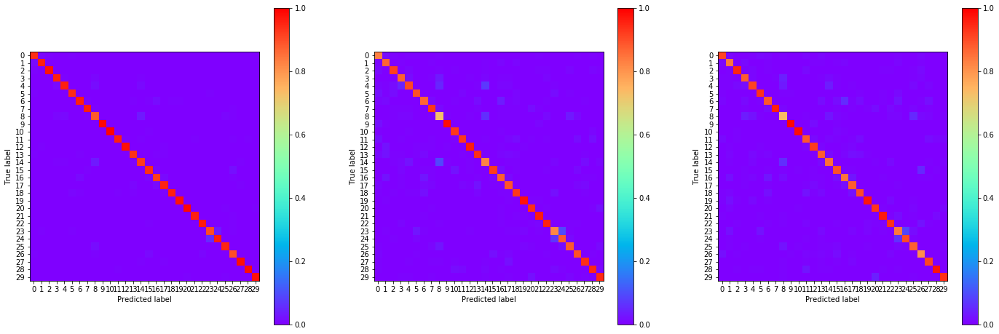

17:10:22.603944
#211 [Train: 0.157] [Test: 0.356] [Valid: 0.358]
#211 [Train: 0.954] [Test: 0.899] [Valid: 0.900]


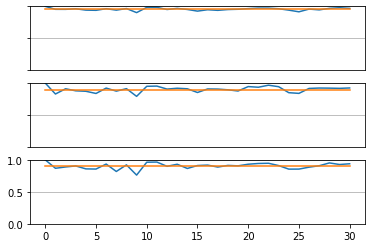

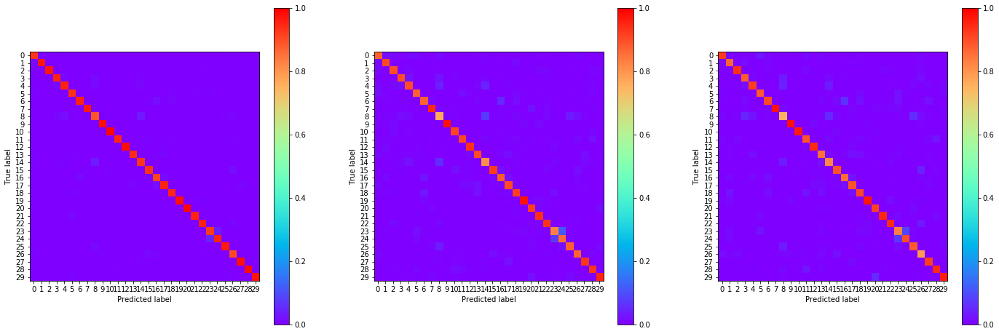

17:11:32.777395
#212 [Train: 0.161] [Test: 0.364] [Valid: 0.364]
#212 [Train: 0.953] [Test: 0.900] [Valid: 0.900]


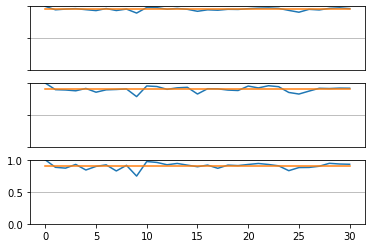

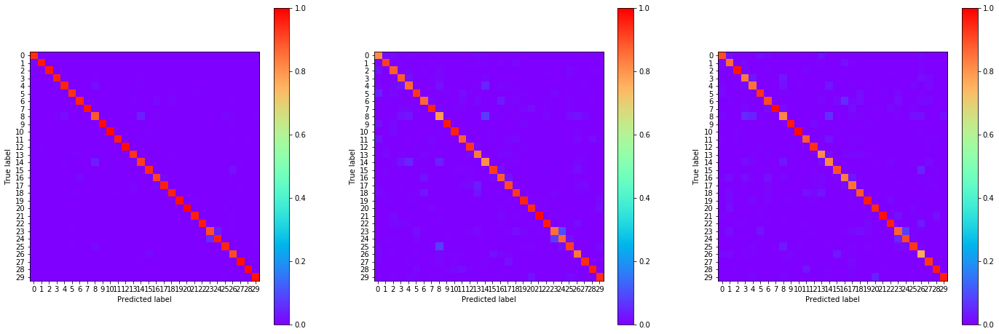

17:12:42.213774
#213 [Train: 0.154] [Test: 0.364] [Valid: 0.362]
#213 [Train: 0.955] [Test: 0.901] [Valid: 0.902]


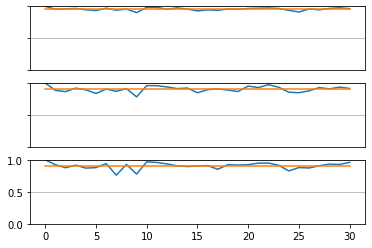

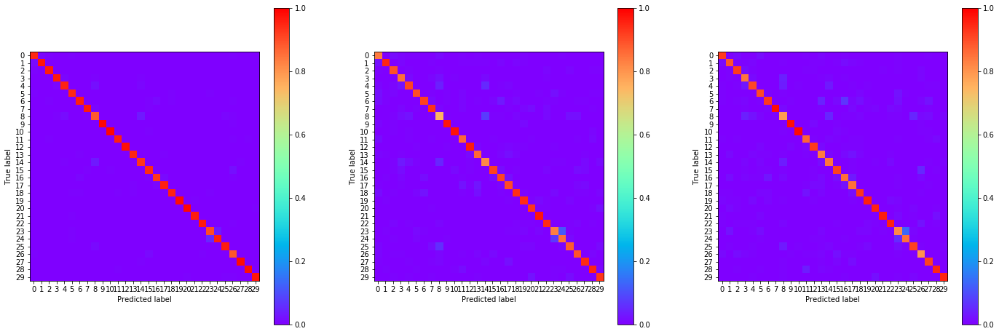

17:13:51.105872
#214 [Train: 0.154] [Test: 0.354] [Valid: 0.361]
#214 [Train: 0.955] [Test: 0.901] [Valid: 0.901]


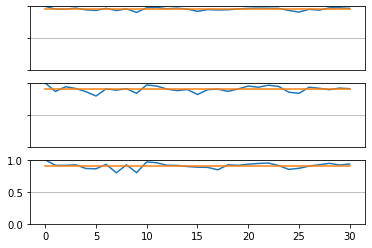

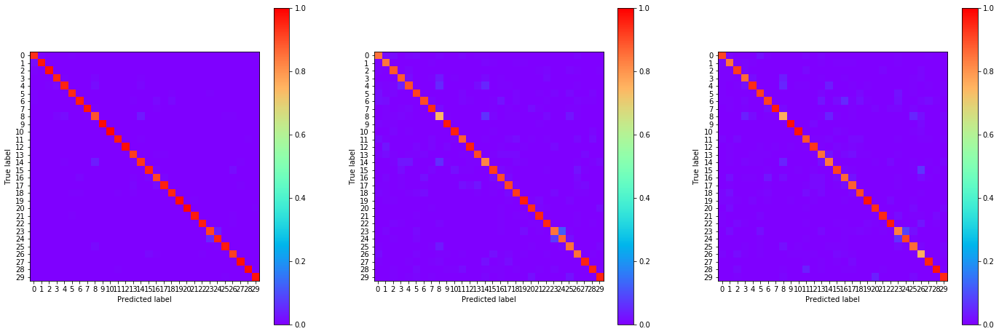

17:14:59.079260
#215 [Train: 0.155] [Test: 0.354] [Valid: 0.356]
#215 [Train: 0.954] [Test: 0.902] [Valid: 0.902]


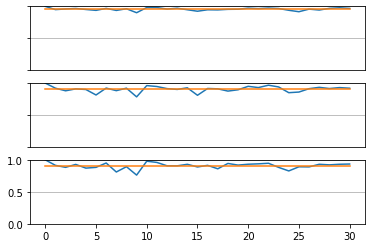

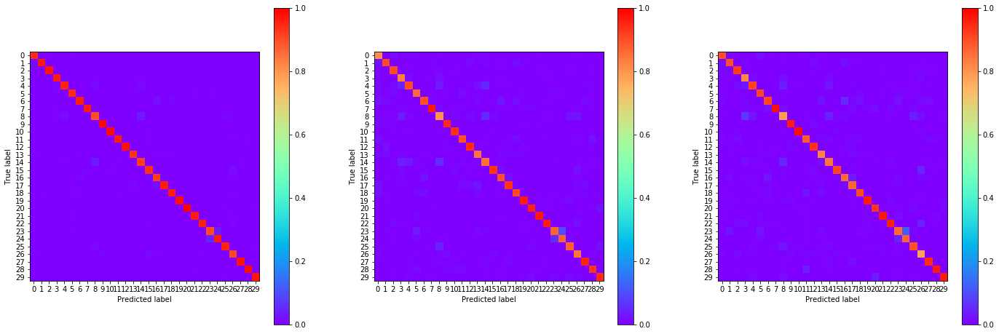

17:16:06.940225
#216 [Train: 0.150] [Test: 0.372] [Valid: 0.379]
#216 [Train: 0.956] [Test: 0.900] [Valid: 0.897]


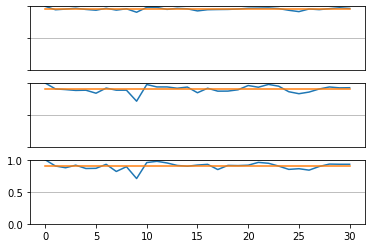

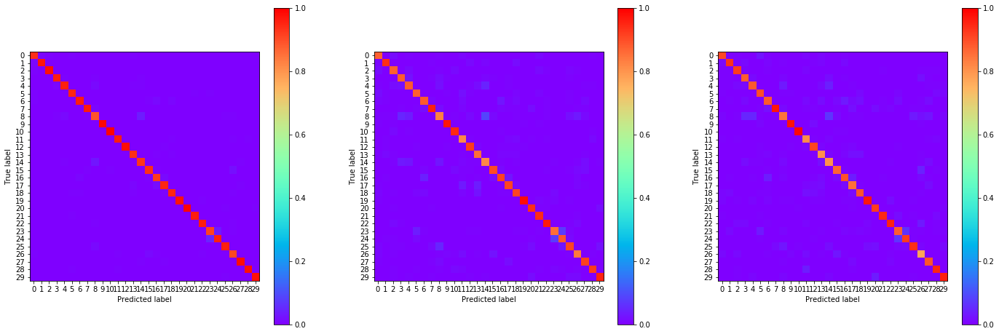

17:17:15.682983
#217 [Train: 0.152] [Test: 0.356] [Valid: 0.352]
#217 [Train: 0.955] [Test: 0.900] [Valid: 0.903]


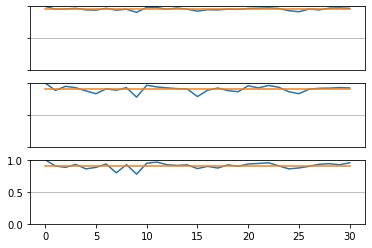

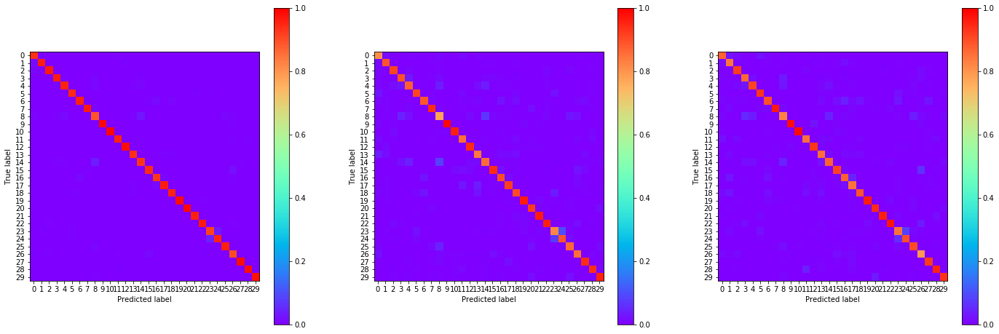

17:18:24.142840
#218 [Train: 0.152] [Test: 0.359] [Valid: 0.358]
#218 [Train: 0.956] [Test: 0.899] [Valid: 0.903]


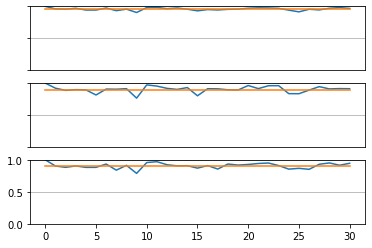

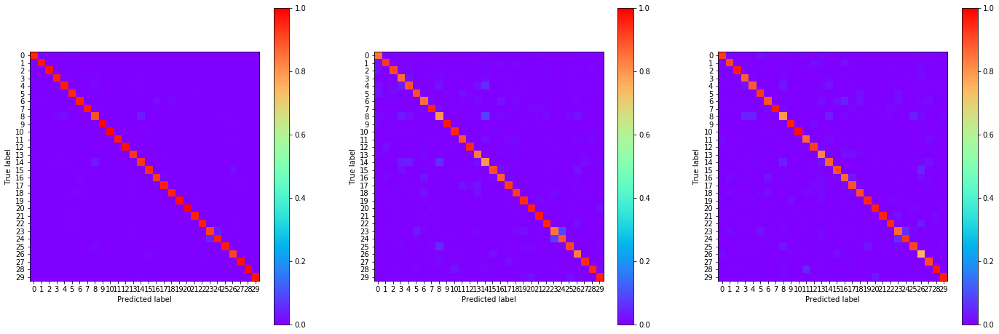

17:19:34.089985
#219 [Train: 0.150] [Test: 0.366] [Valid: 0.366]
#219 [Train: 0.956] [Test: 0.897] [Valid: 0.901]


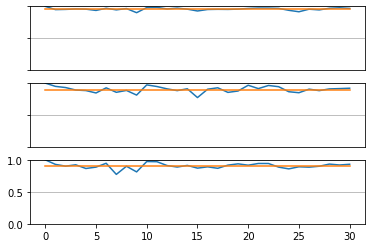

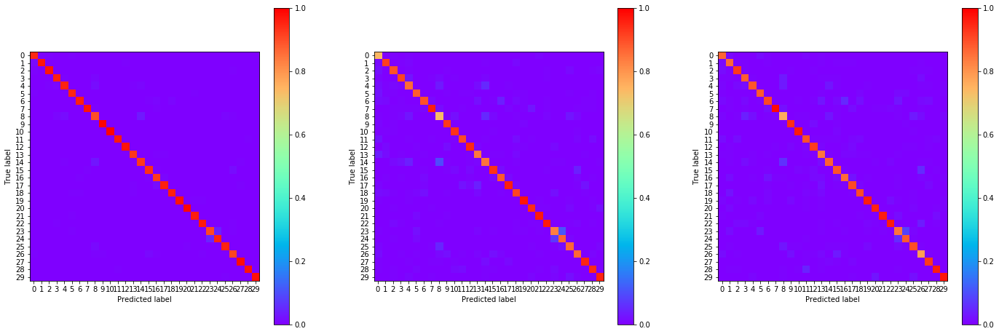

17:20:45.127831
#220 [Train: 0.149] [Test: 0.363] [Valid: 0.359]
#220 [Train: 0.956] [Test: 0.898] [Valid: 0.904]


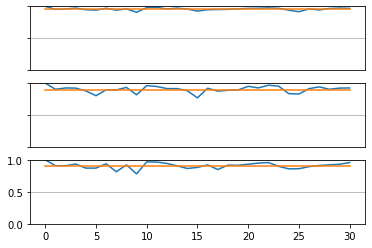

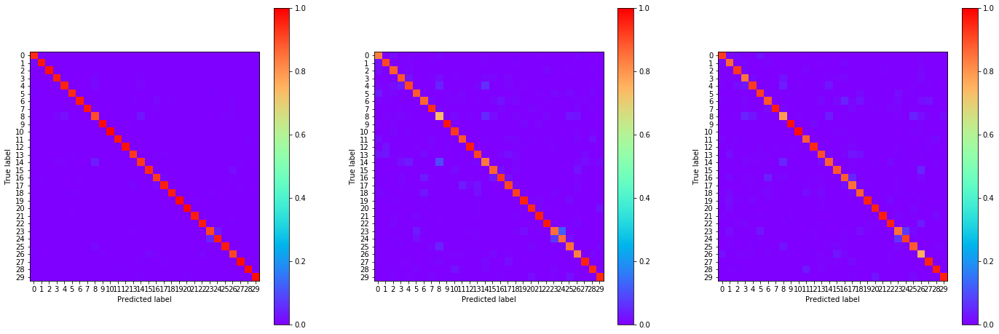

17:21:54.270833
#221 [Train: 0.147] [Test: 0.360] [Valid: 0.357]
#221 [Train: 0.957] [Test: 0.902] [Valid: 0.905]


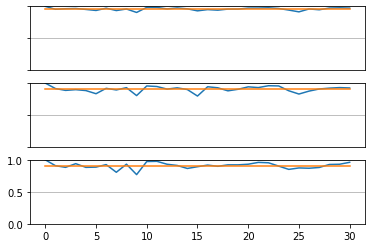

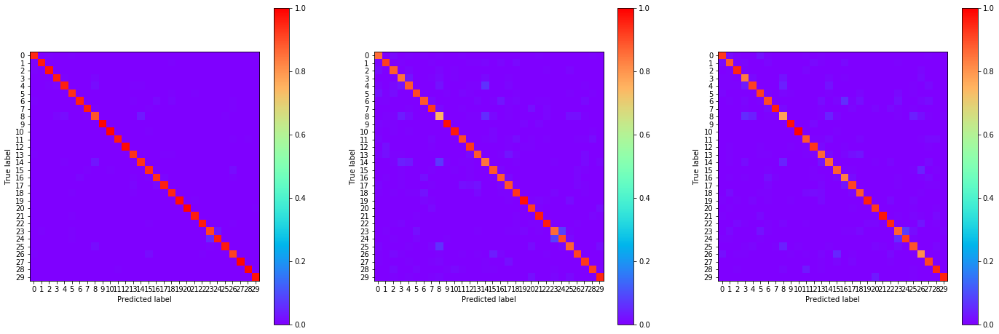

17:23:04.855928
#222 [Train: 0.147] [Test: 0.361] [Valid: 0.360]
#222 [Train: 0.956] [Test: 0.901] [Valid: 0.903]


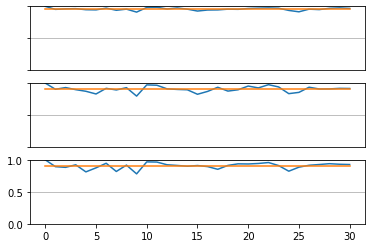

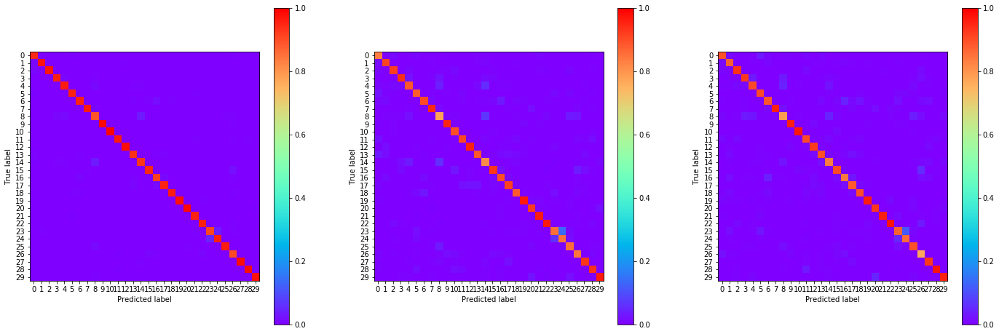

17:24:21.958843
#223 [Train: 0.145] [Test: 0.372] [Valid: 0.368]
#223 [Train: 0.957] [Test: 0.899] [Valid: 0.904]


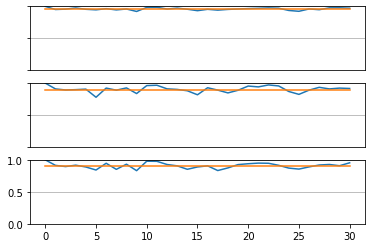

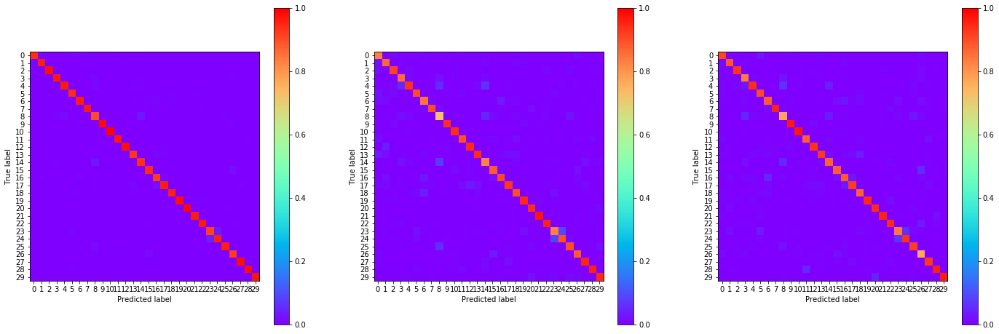

17:25:30.343524
#224 [Train: 0.145] [Test: 0.367] [Valid: 0.370]
#224 [Train: 0.958] [Test: 0.900] [Valid: 0.901]


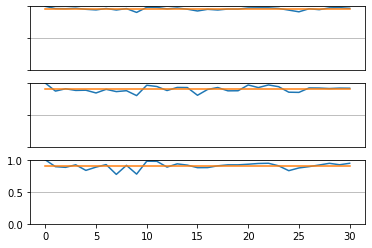

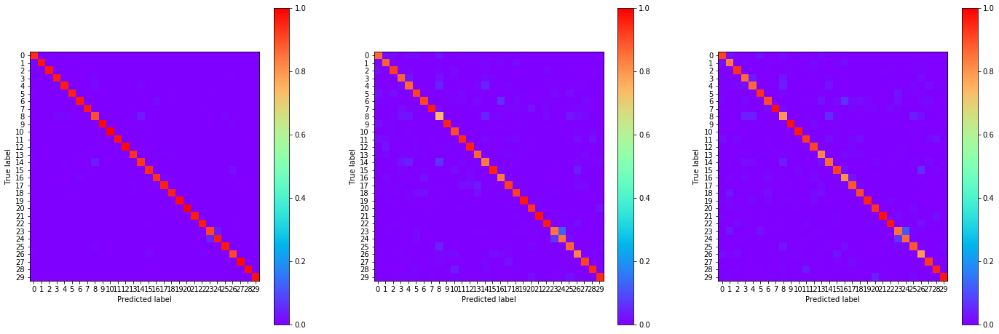

17:26:39.859258
#225 [Train: 0.143] [Test: 0.380] [Valid: 0.366]
#225 [Train: 0.958] [Test: 0.897] [Valid: 0.901]


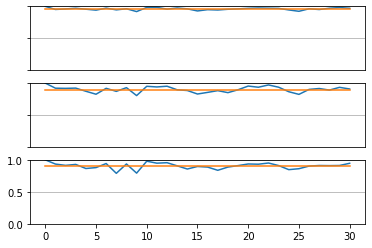

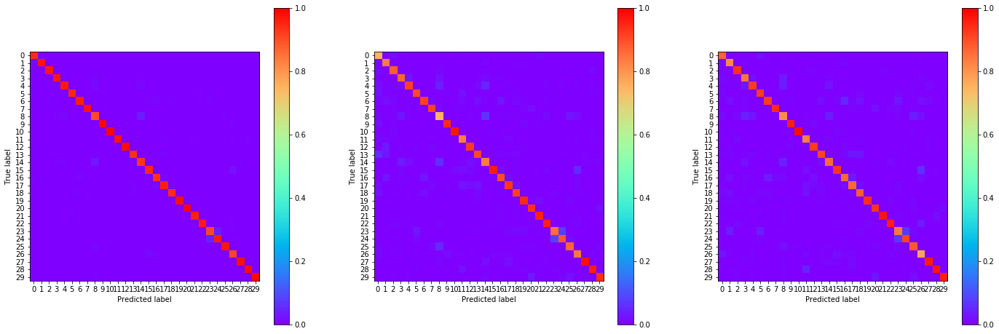

17:27:47.496836
#226 [Train: 0.144] [Test: 0.372] [Valid: 0.372]
#226 [Train: 0.958] [Test: 0.899] [Valid: 0.900]


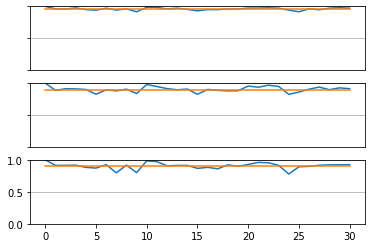

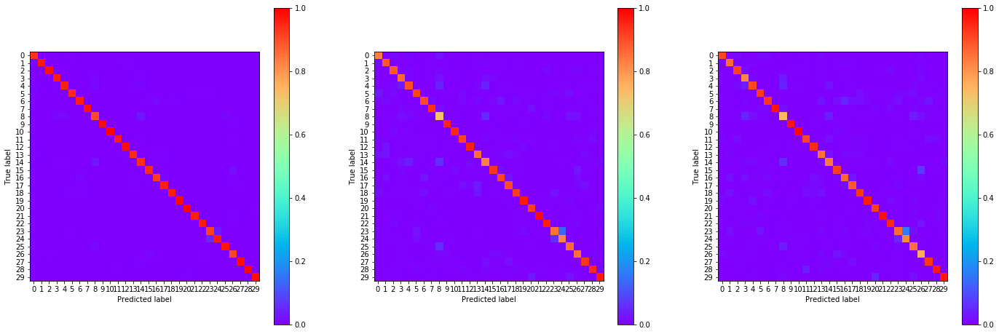

17:28:56.211525
#227 [Train: 0.142] [Test: 0.365] [Valid: 0.361]
#227 [Train: 0.958] [Test: 0.904] [Valid: 0.902]


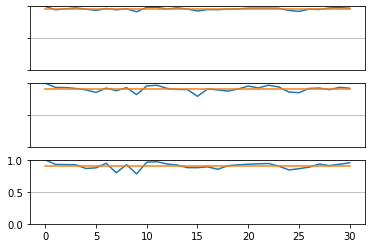

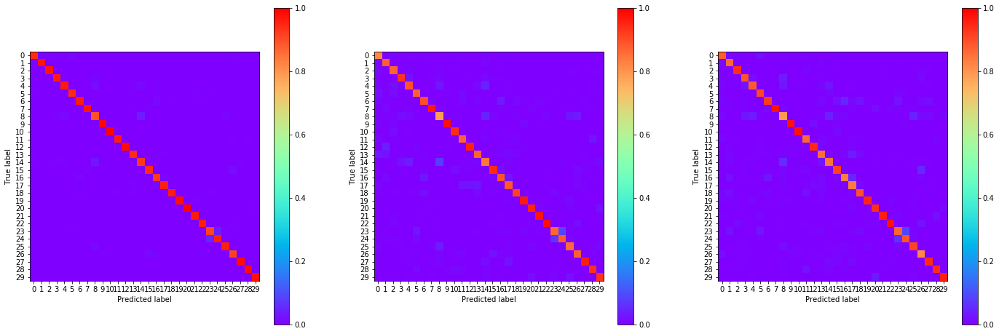

17:30:04.733420
#228 [Train: 0.144] [Test: 0.364] [Valid: 0.366]
#228 [Train: 0.958] [Test: 0.902] [Valid: 0.902]


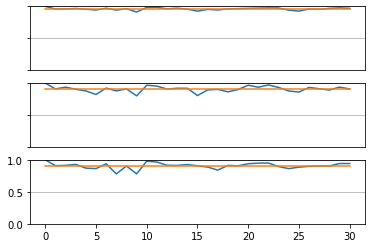

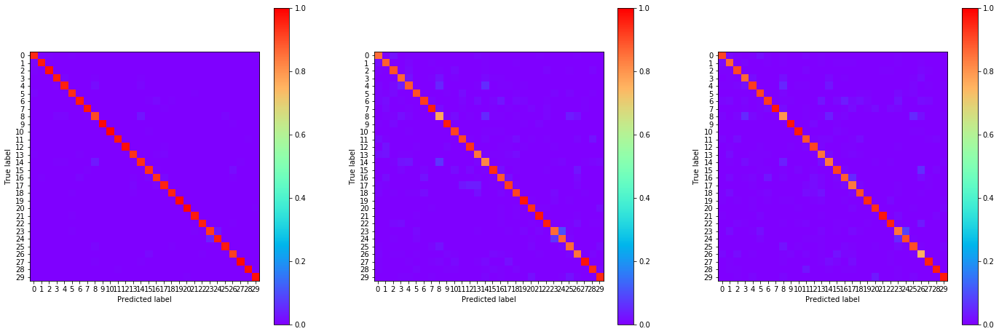

17:31:13.634590
#229 [Train: 0.140] [Test: 0.363] [Valid: 0.363]
#229 [Train: 0.959] [Test: 0.902] [Valid: 0.904]


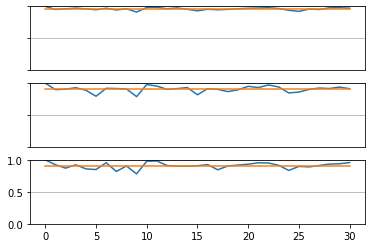

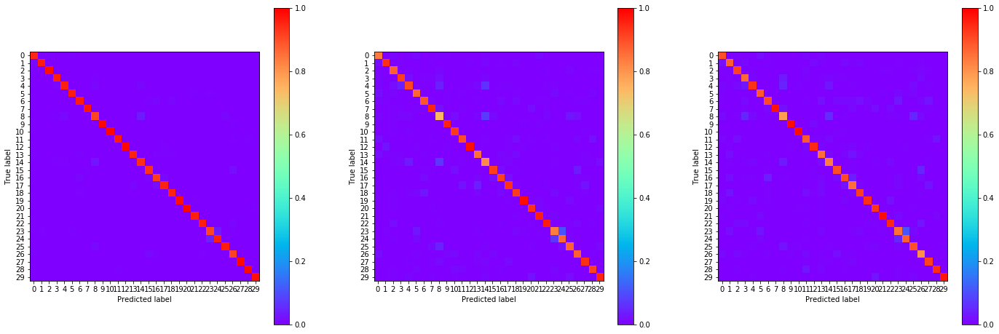

17:32:21.086562
#230 [Train: 0.138] [Test: 0.371] [Valid: 0.373]
#230 [Train: 0.960] [Test: 0.900] [Valid: 0.902]


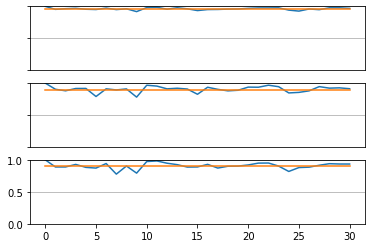

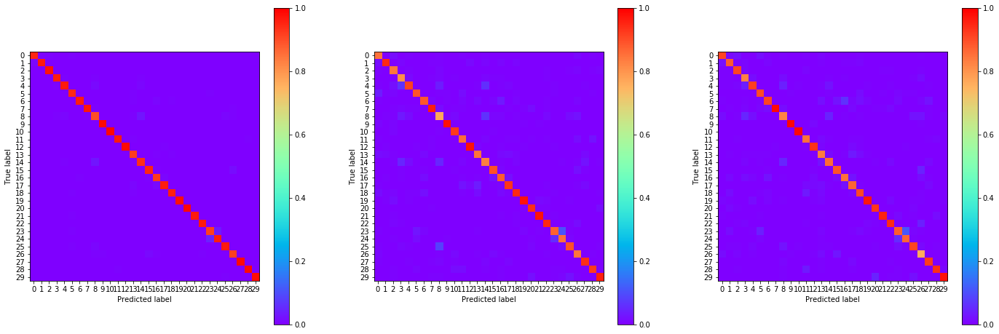

17:33:30.109172
#231 [Train: 0.136] [Test: 0.360] [Valid: 0.373]
#231 [Train: 0.960] [Test: 0.904] [Valid: 0.899]


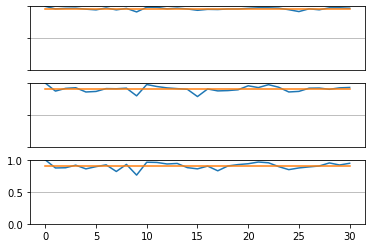

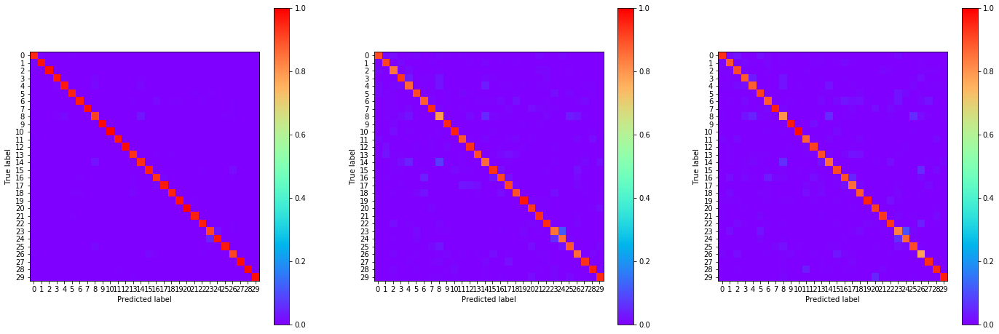

17:34:40.244420
#232 [Train: 0.142] [Test: 0.363] [Valid: 0.364]
#232 [Train: 0.958] [Test: 0.902] [Valid: 0.903]


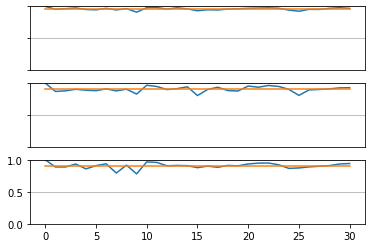

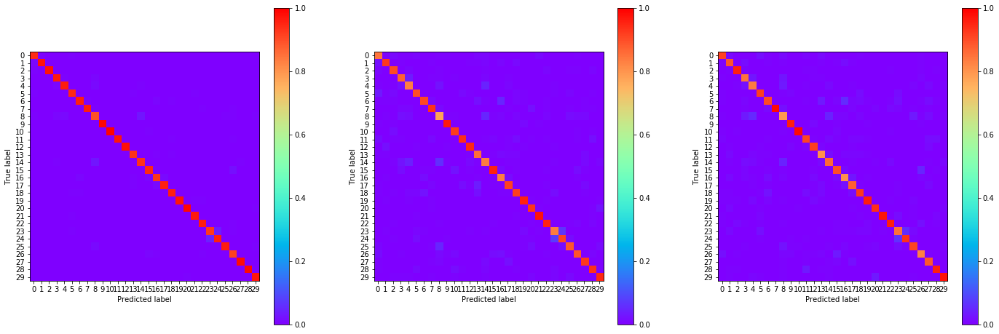

17:35:49.201966
#233 [Train: 0.139] [Test: 0.367] [Valid: 0.358]
#233 [Train: 0.959] [Test: 0.904] [Valid: 0.903]


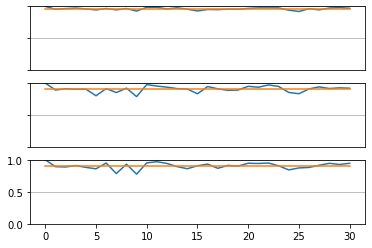

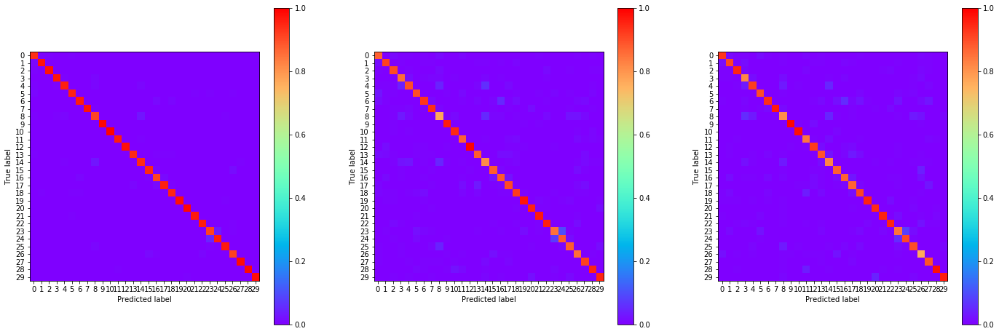

17:36:58.003708
#234 [Train: 0.140] [Test: 0.370] [Valid: 0.367]
#234 [Train: 0.959] [Test: 0.902] [Valid: 0.903]


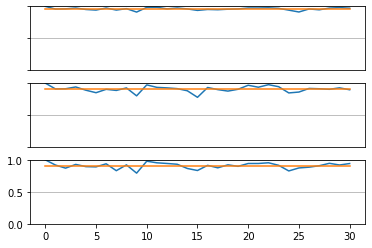

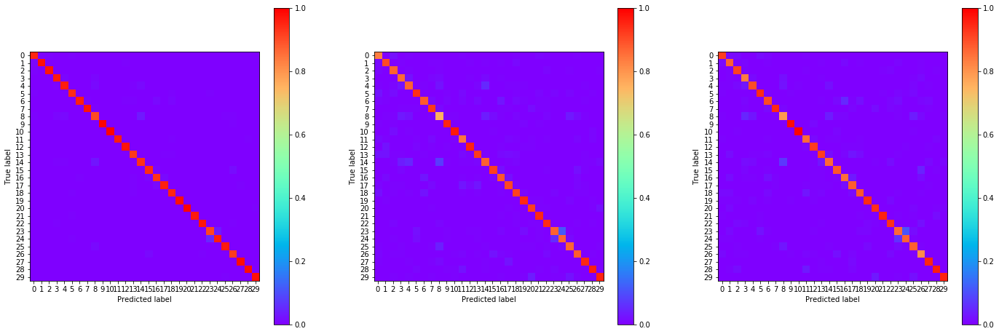

17:38:06.782052
#235 [Train: 0.137] [Test: 0.381] [Valid: 0.372]
#235 [Train: 0.959] [Test: 0.898] [Valid: 0.904]


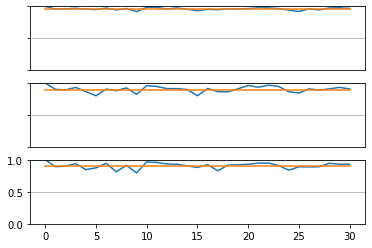

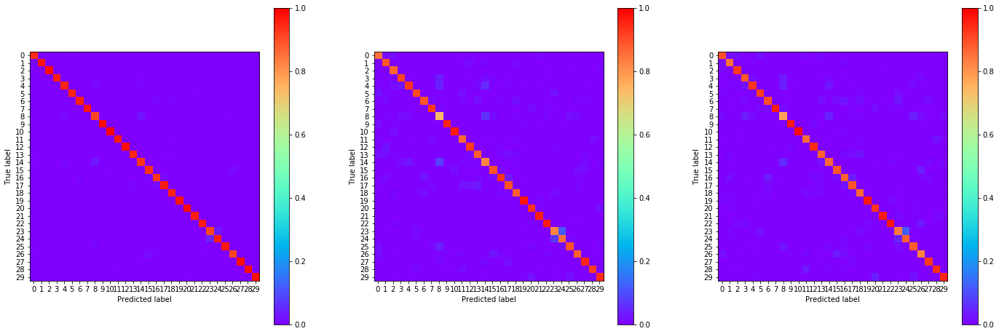

17:39:14.114993
#236 [Train: 0.135] [Test: 0.360] [Valid: 0.368]
#236 [Train: 0.960] [Test: 0.905] [Valid: 0.902]


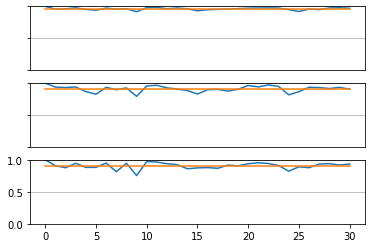

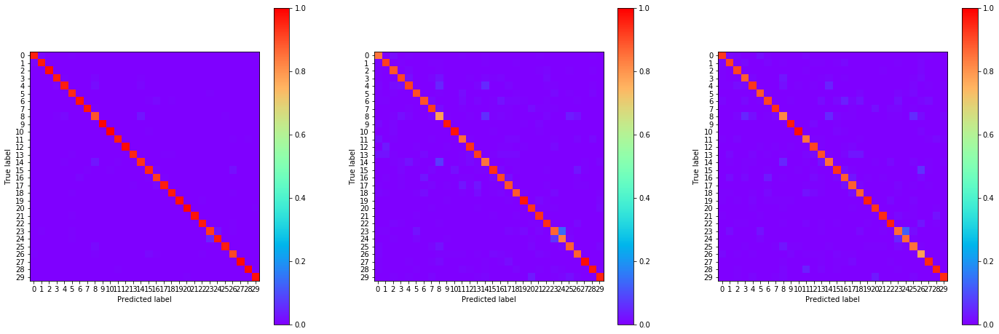

17:40:22.149079
#237 [Train: 0.137] [Test: 0.389] [Valid: 0.387]
#237 [Train: 0.961] [Test: 0.899] [Valid: 0.898]


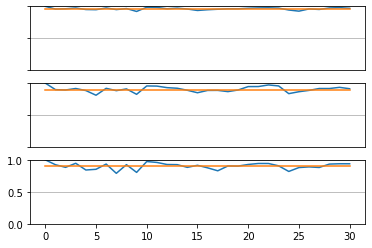

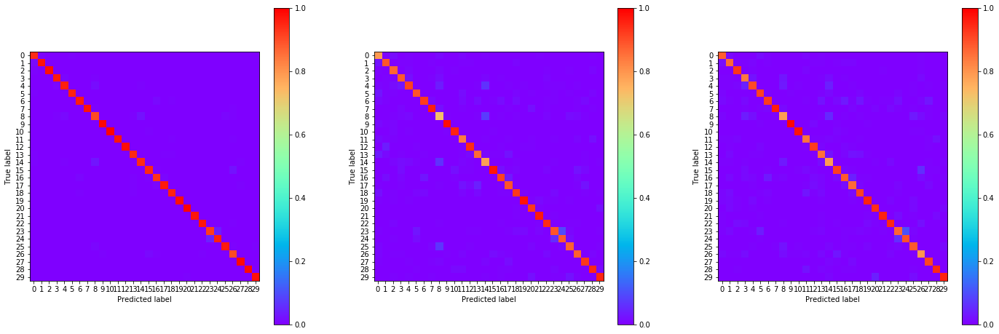

17:41:30.723867
#238 [Train: 0.135] [Test: 0.366] [Valid: 0.362]
#238 [Train: 0.960] [Test: 0.899] [Valid: 0.905]


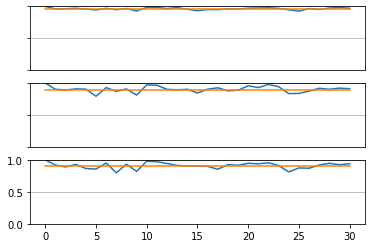

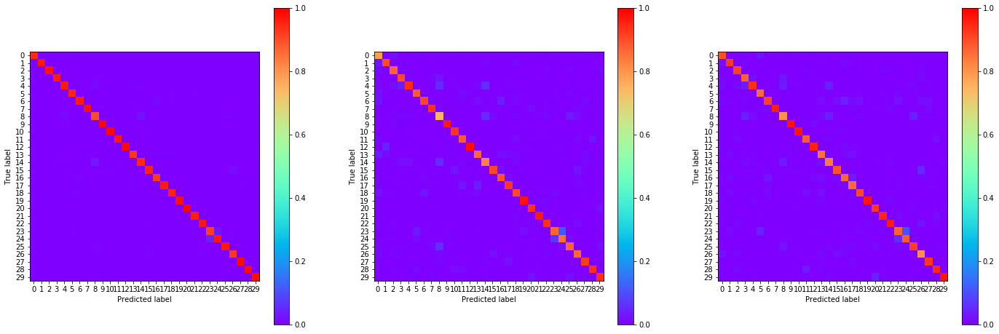

17:42:39.870969
#239 [Train: 0.131] [Test: 0.357] [Valid: 0.356]
#239 [Train: 0.962] [Test: 0.906] [Valid: 0.908]


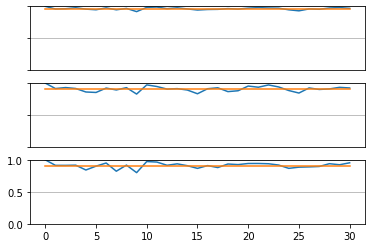

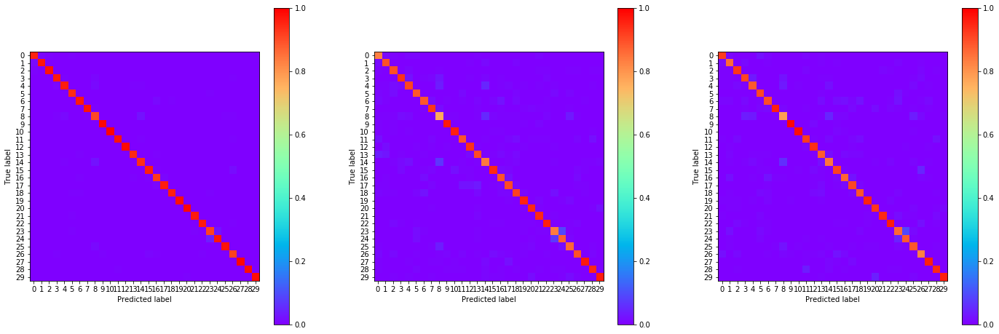

17:43:47.746895
#240 [Train: 0.133] [Test: 0.373] [Valid: 0.364]
#240 [Train: 0.961] [Test: 0.902] [Valid: 0.902]


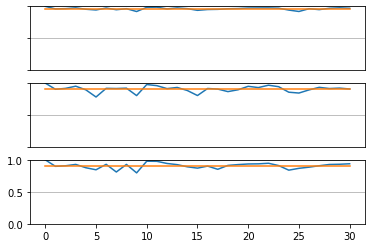

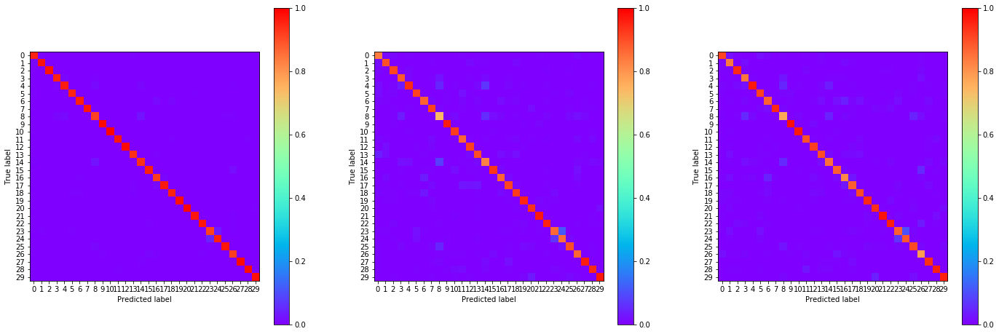

17:44:59.198814
#241 [Train: 0.134] [Test: 0.386] [Valid: 0.365]
#241 [Train: 0.961] [Test: 0.900] [Valid: 0.903]


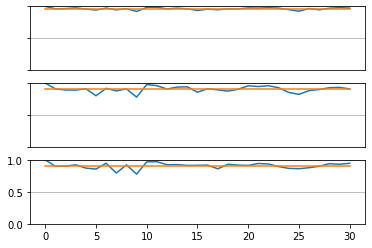

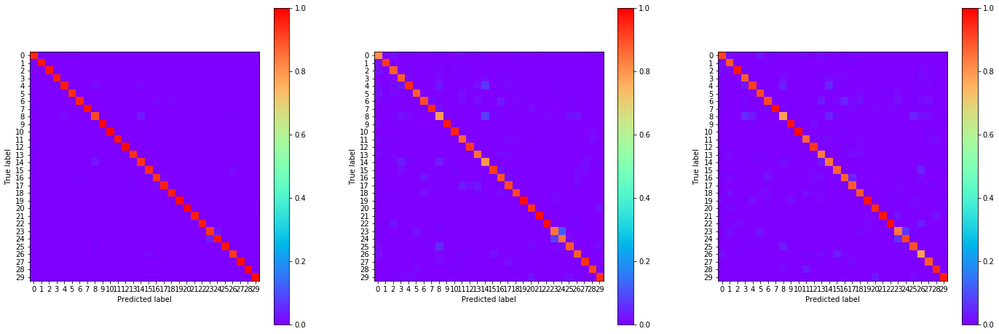

17:46:07.706434
#242 [Train: 0.132] [Test: 0.370] [Valid: 0.367]
#242 [Train: 0.961] [Test: 0.903] [Valid: 0.904]


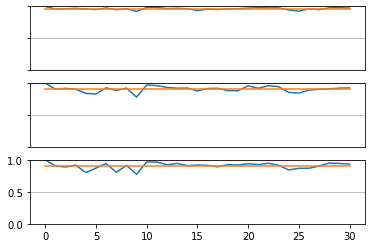

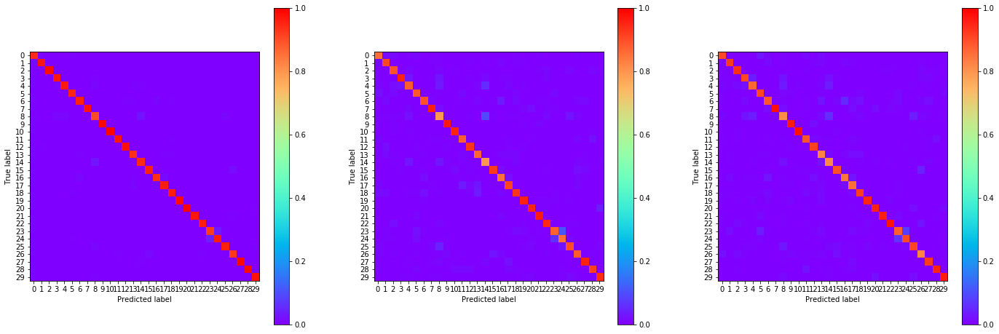

17:47:33.102044
#243 [Train: 0.128] [Test: 0.370] [Valid: 0.367]
#243 [Train: 0.963] [Test: 0.899] [Valid: 0.905]


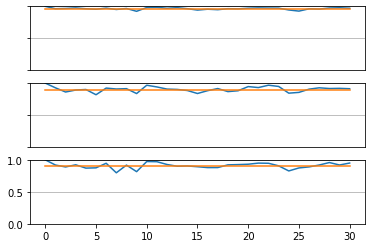

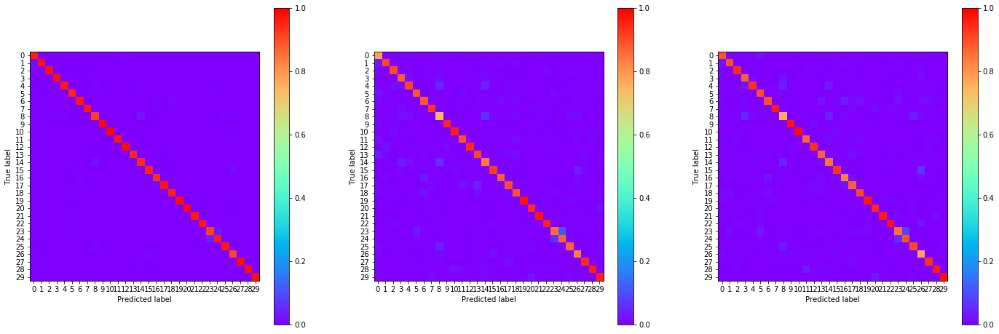

17:48:59.807857
#244 [Train: 0.128] [Test: 0.374] [Valid: 0.370]
#244 [Train: 0.963] [Test: 0.903] [Valid: 0.902]


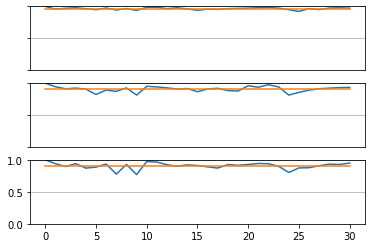

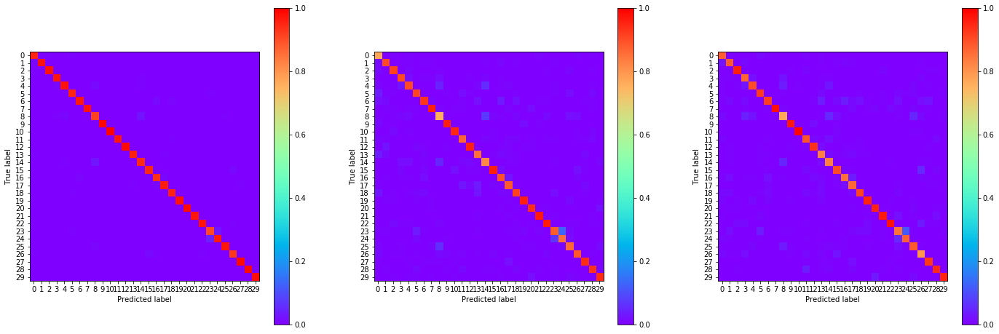

17:50:23.786895
#245 [Train: 0.126] [Test: 0.391] [Valid: 0.378]
#245 [Train: 0.963] [Test: 0.897] [Valid: 0.901]


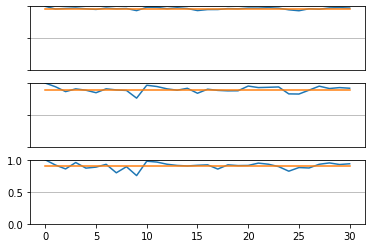

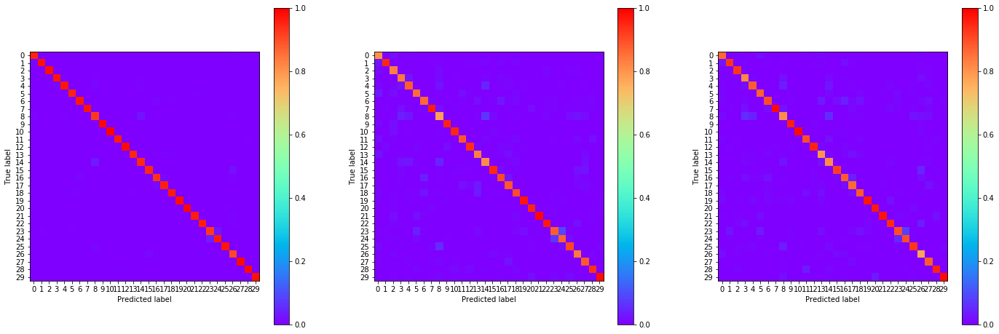

17:51:36.527390
#246 [Train: 0.128] [Test: 0.362] [Valid: 0.372]
#246 [Train: 0.963] [Test: 0.905] [Valid: 0.899]


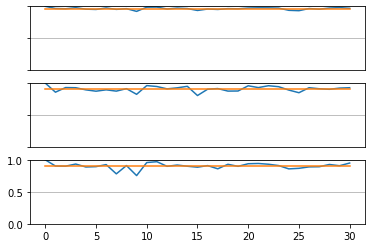

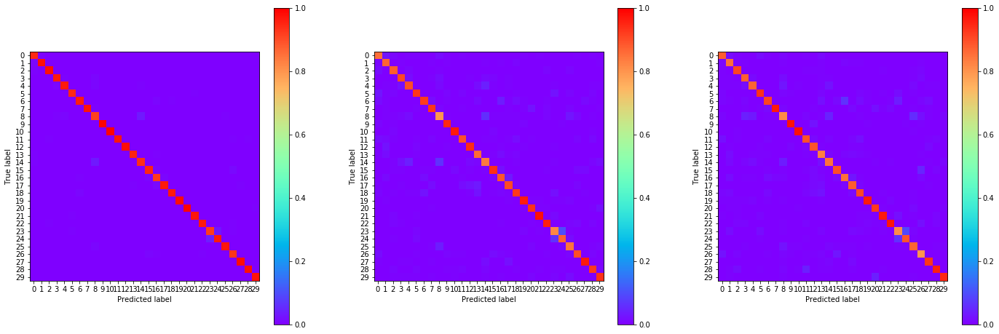

17:52:47.827099
#247 [Train: 0.129] [Test: 0.365] [Valid: 0.364]
#247 [Train: 0.963] [Test: 0.901] [Valid: 0.902]


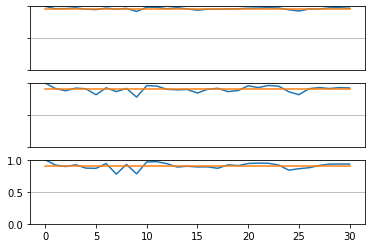

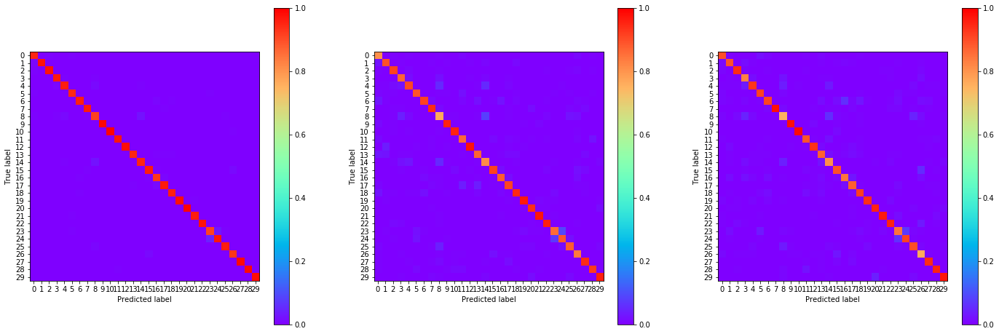

17:53:57.892257
#248 [Train: 0.122] [Test: 0.366] [Valid: 0.369]
#248 [Train: 0.965] [Test: 0.900] [Valid: 0.904]


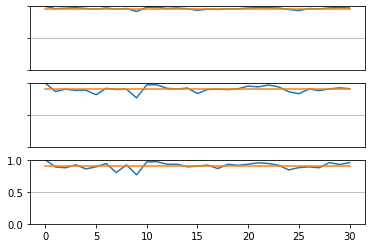

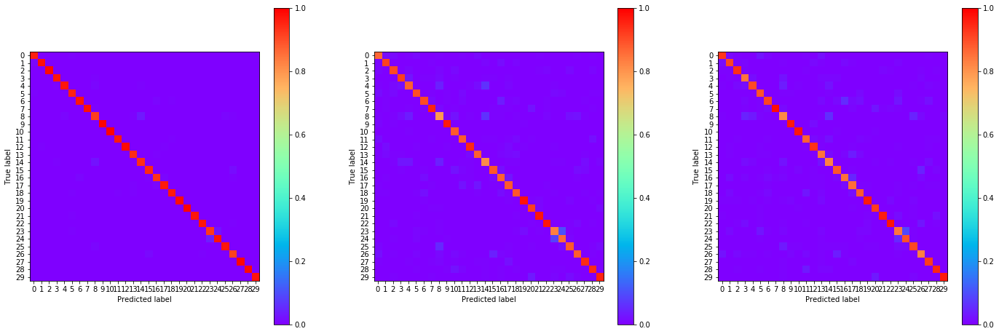

17:55:07.111028
#249 [Train: 0.126] [Test: 0.369] [Valid: 0.378]
#249 [Train: 0.963] [Test: 0.902] [Valid: 0.901]


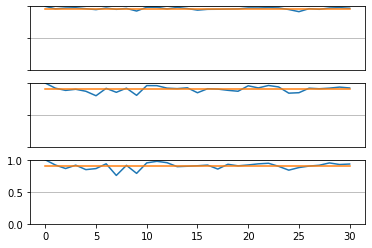

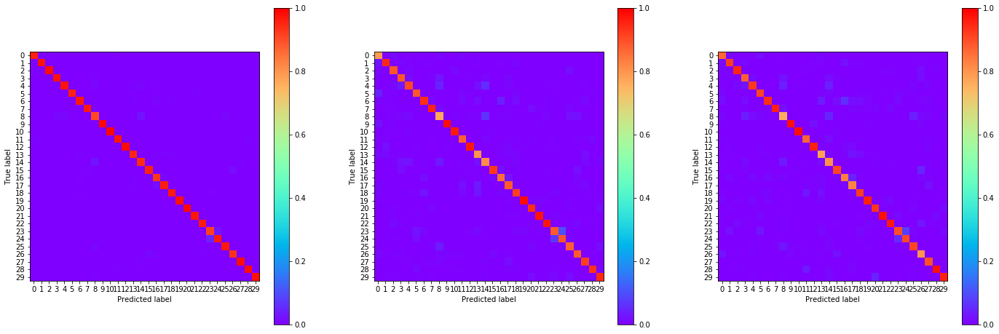

17:56:16.664867
#250 [Train: 0.127] [Test: 0.363] [Valid: 0.371]
#250 [Train: 0.963] [Test: 0.902] [Valid: 0.904]


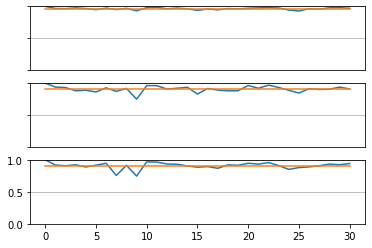

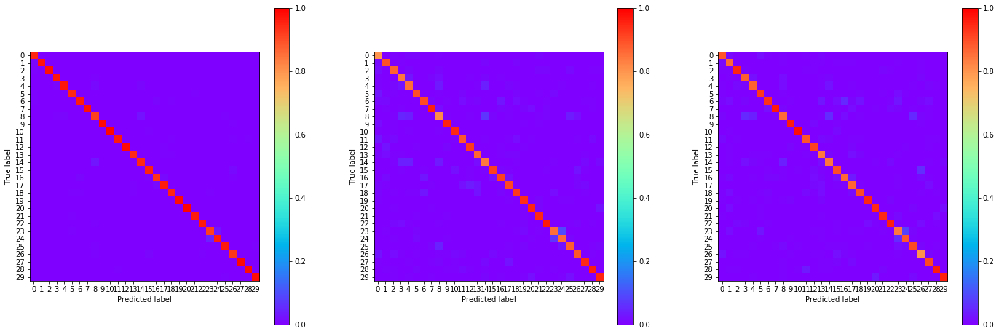

17:57:27.611051
#251 [Train: 0.125] [Test: 0.368] [Valid: 0.373]
#251 [Train: 0.964] [Test: 0.904] [Valid: 0.904]


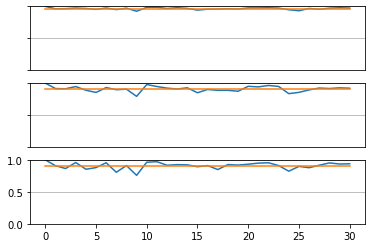

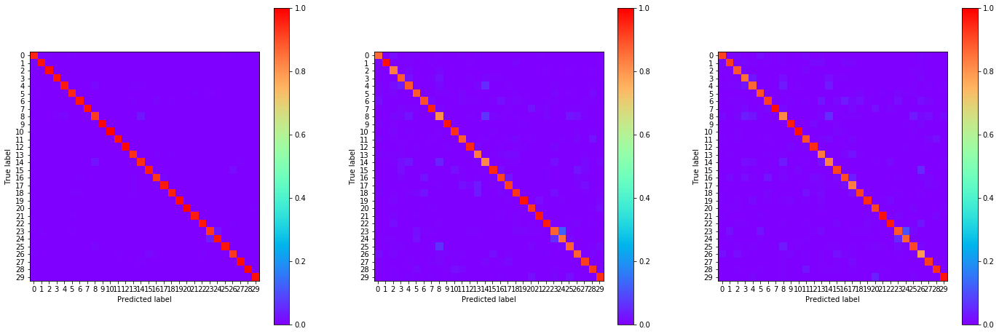

17:58:38.036786
#252 [Train: 0.121] [Test: 0.382] [Valid: 0.366]
#252 [Train: 0.965] [Test: 0.901] [Valid: 0.906]


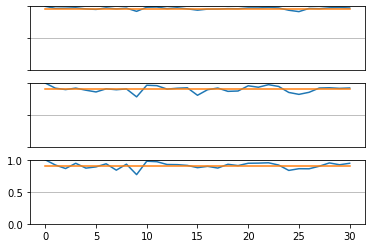

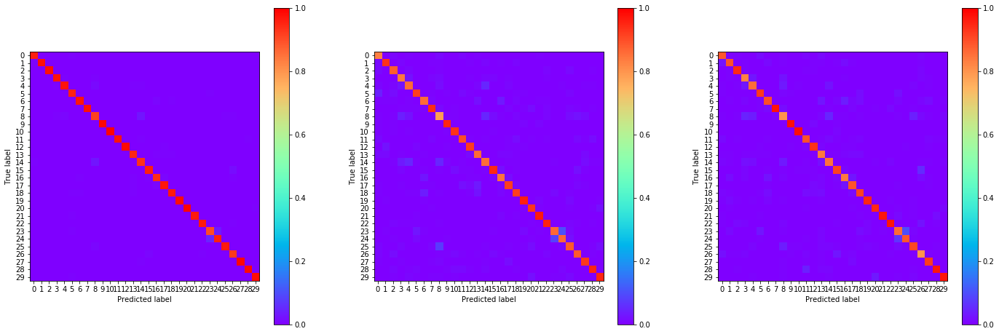

17:59:47.300079
#253 [Train: 0.124] [Test: 0.369] [Valid: 0.384]
#253 [Train: 0.963] [Test: 0.902] [Valid: 0.900]


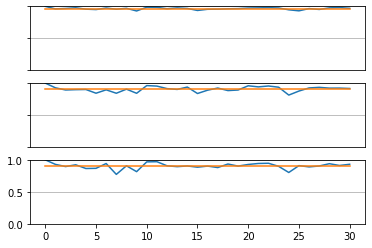

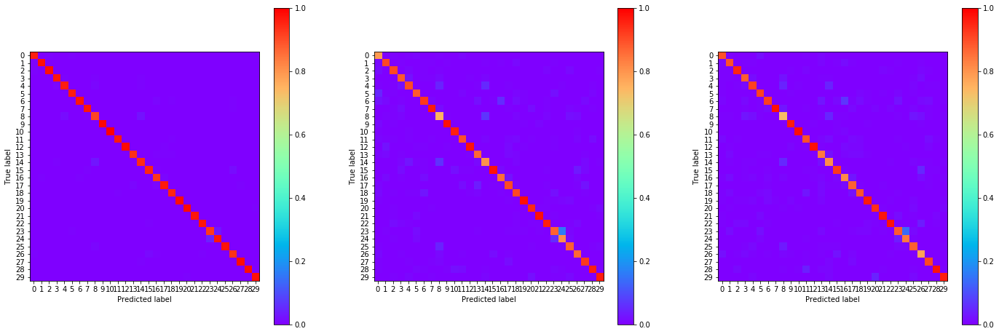

18:00:56.479759
#254 [Train: 0.126] [Test: 0.363] [Valid: 0.361]
#254 [Train: 0.963] [Test: 0.906] [Valid: 0.904]


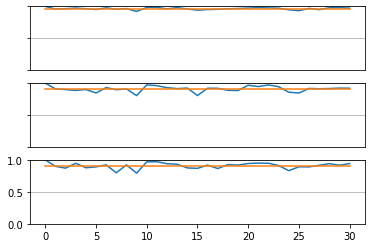

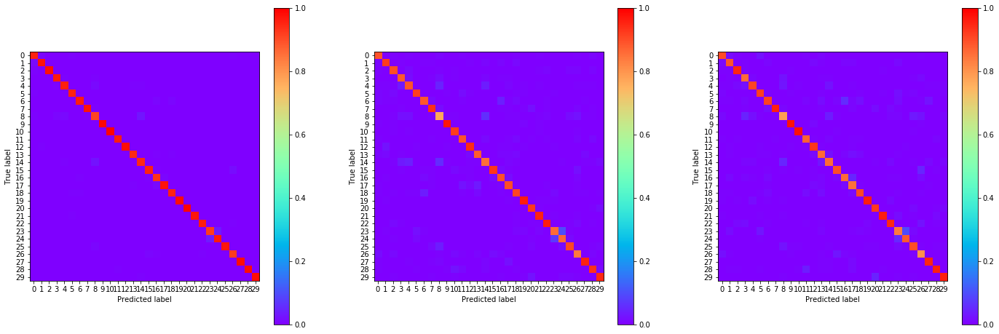

18:02:05.575039
#255 [Train: 0.119] [Test: 0.389] [Valid: 0.383]
#255 [Train: 0.966] [Test: 0.900] [Valid: 0.900]


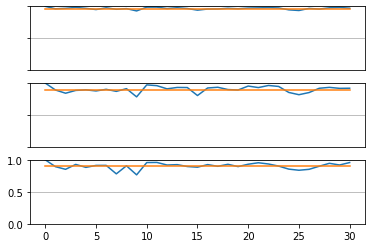

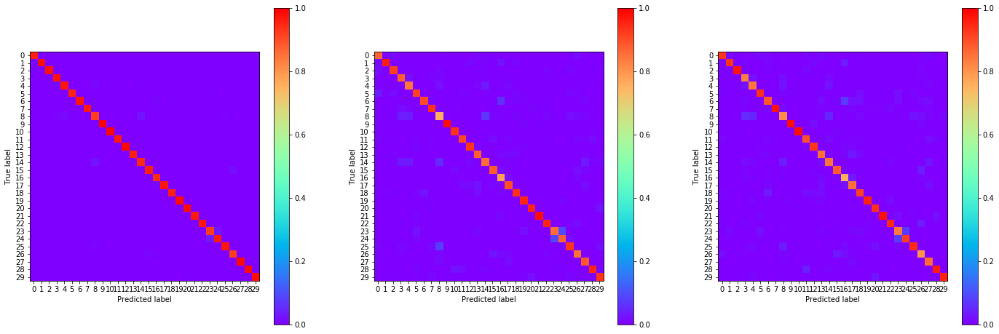

18:03:14.785207
#256 [Train: 0.124] [Test: 0.368] [Valid: 0.370]
#256 [Train: 0.964] [Test: 0.903] [Valid: 0.907]


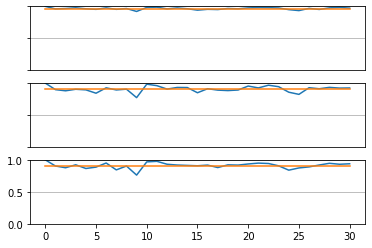

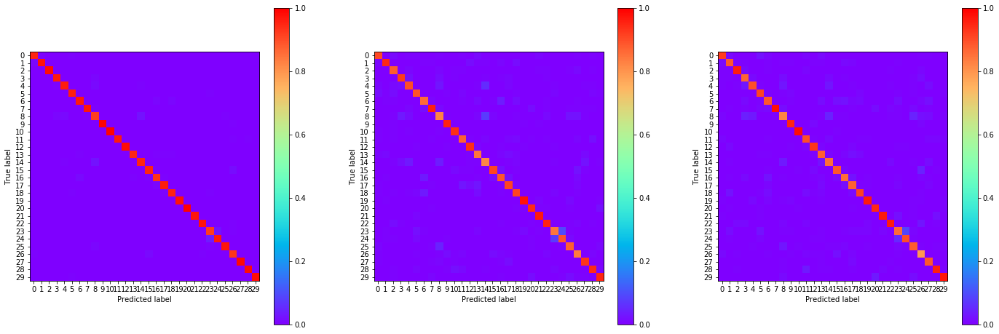

18:04:22.851241
#257 [Train: 0.120] [Test: 0.377] [Valid: 0.373]
#257 [Train: 0.965] [Test: 0.906] [Valid: 0.904]


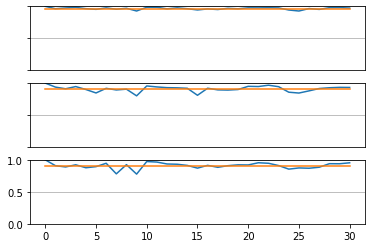

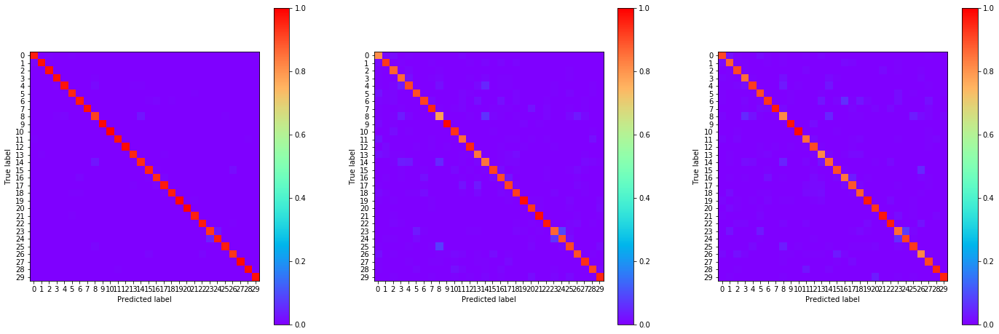

18:05:33.210867
#258 [Train: 0.116] [Test: 0.379] [Valid: 0.374]
#258 [Train: 0.967] [Test: 0.898] [Valid: 0.903]


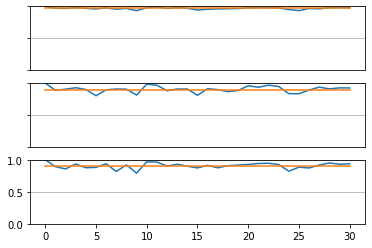

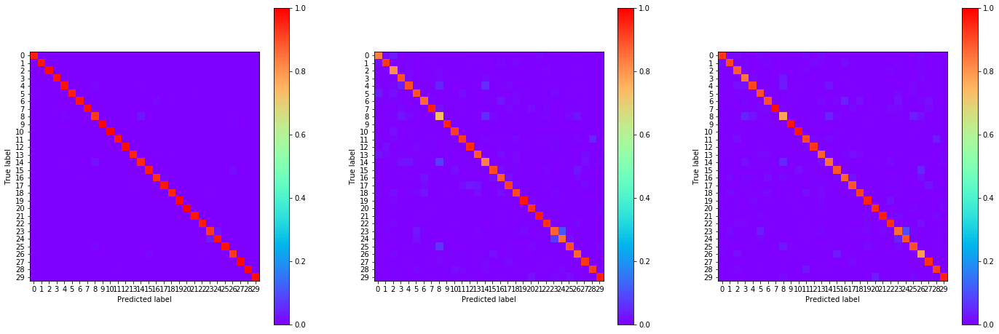

18:06:41.668413
#259 [Train: 0.117] [Test: 0.377] [Valid: 0.379]
#259 [Train: 0.966] [Test: 0.901] [Valid: 0.903]


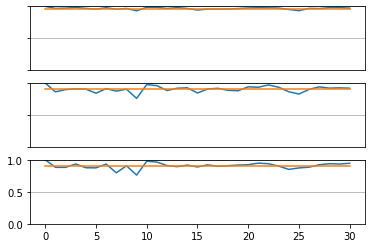

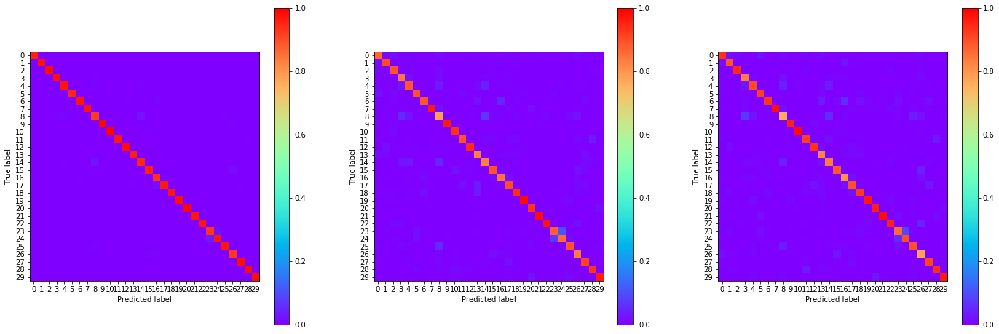

18:07:50.971368
#260 [Train: 0.117] [Test: 0.383] [Valid: 0.374]
#260 [Train: 0.966] [Test: 0.900] [Valid: 0.905]


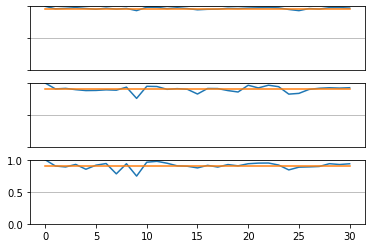

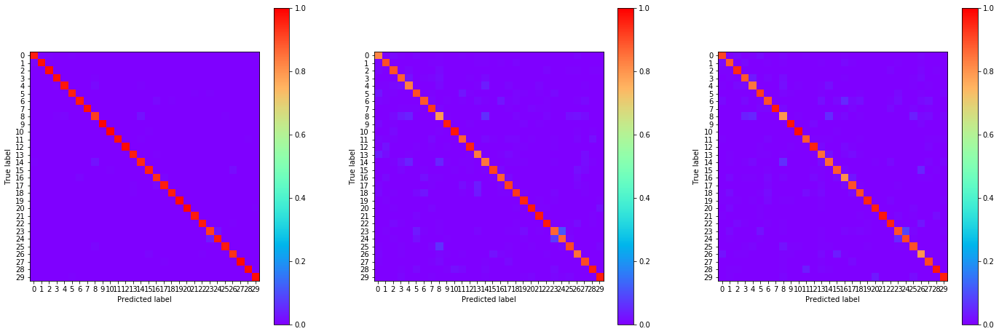

18:08:59.655803
#261 [Train: 0.121] [Test: 0.385] [Valid: 0.376]
#261 [Train: 0.964] [Test: 0.901] [Valid: 0.904]


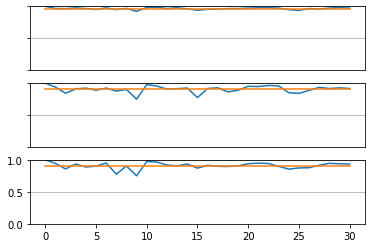

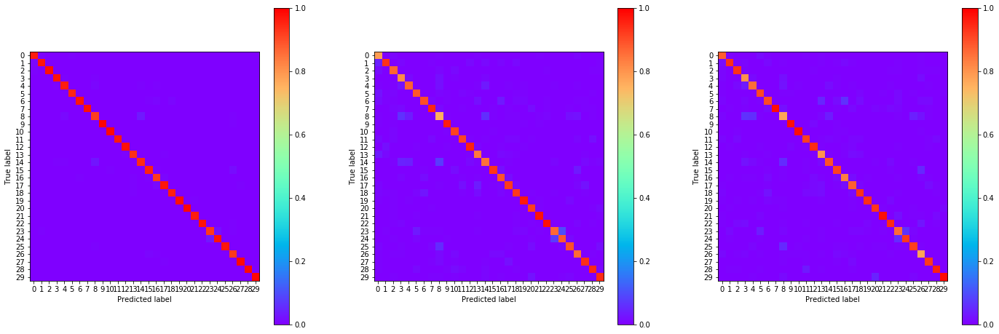

18:10:07.311511
#262 [Train: 0.119] [Test: 0.368] [Valid: 0.373]
#262 [Train: 0.966] [Test: 0.901] [Valid: 0.905]


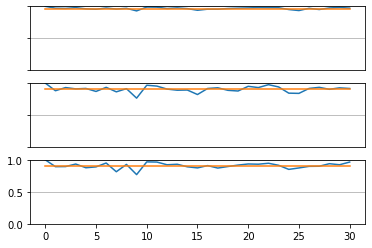

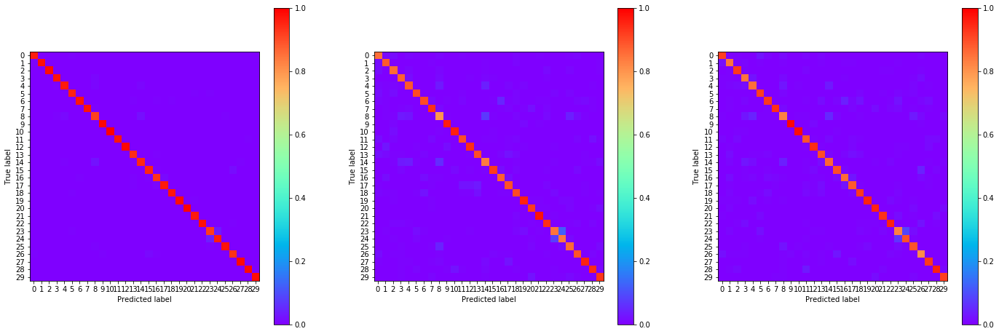

18:11:16.535270
#263 [Train: 0.115] [Test: 0.380] [Valid: 0.379]
#263 [Train: 0.967] [Test: 0.901] [Valid: 0.903]


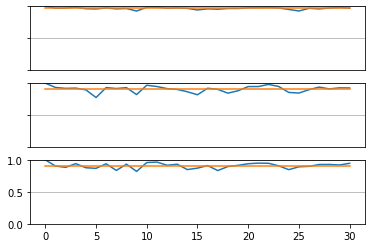

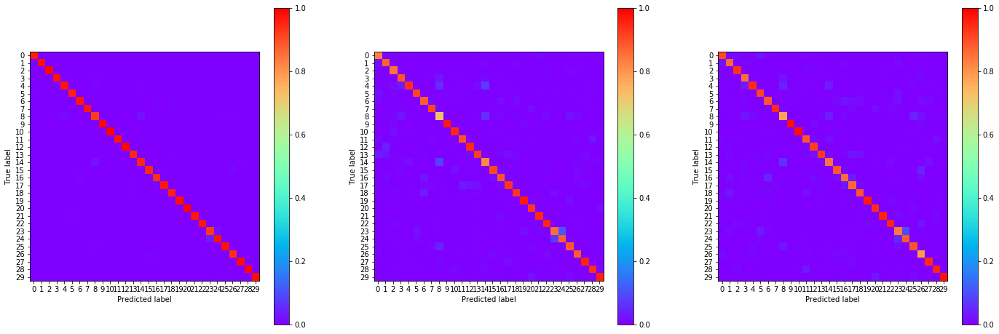

18:12:26.123049
#264 [Train: 0.119] [Test: 0.368] [Valid: 0.379]
#264 [Train: 0.965] [Test: 0.902] [Valid: 0.903]


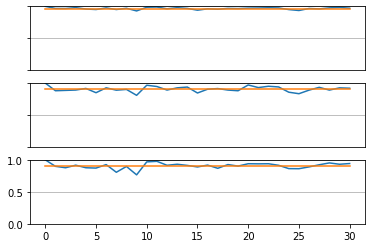

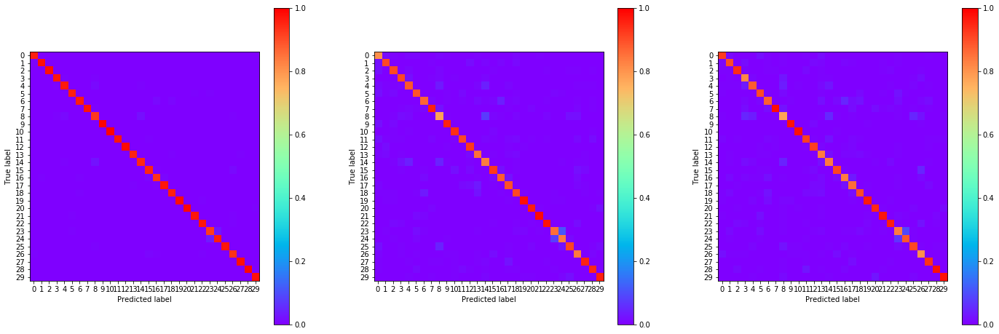

18:13:33.932137
#265 [Train: 0.117] [Test: 0.386] [Valid: 0.377]
#265 [Train: 0.966] [Test: 0.902] [Valid: 0.904]


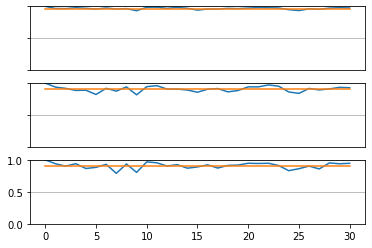

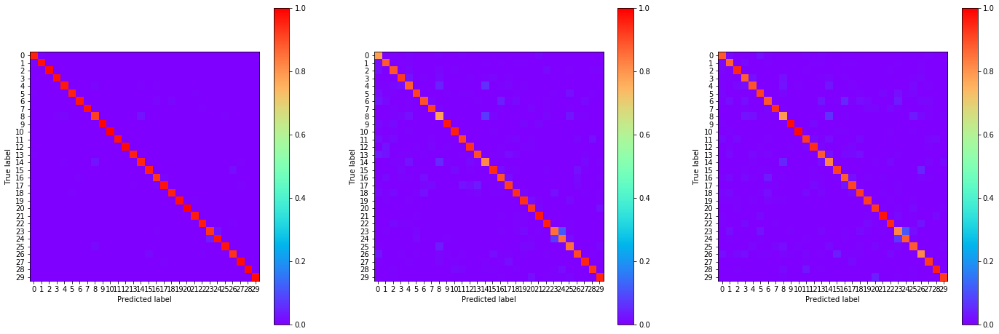

18:14:42.876576
#266 [Train: 0.115] [Test: 0.389] [Valid: 0.383]
#266 [Train: 0.966] [Test: 0.900] [Valid: 0.902]


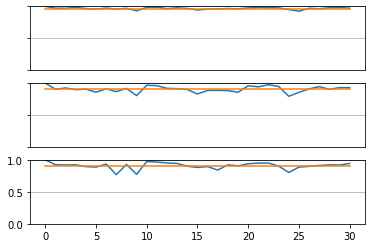

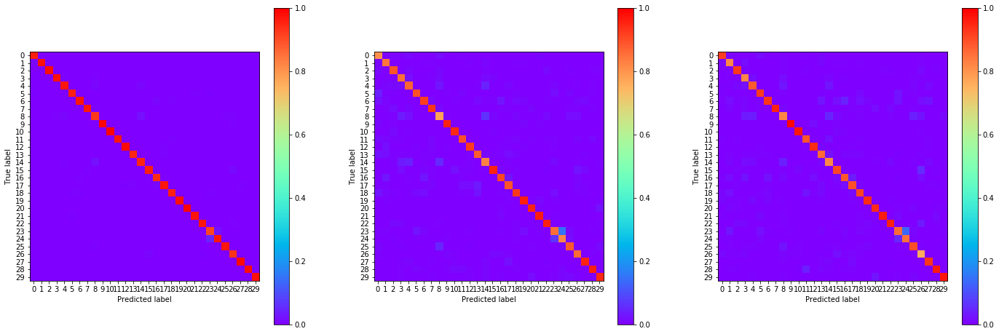

18:15:52.029705
#267 [Train: 0.112] [Test: 0.387] [Valid: 0.378]
#267 [Train: 0.968] [Test: 0.902] [Valid: 0.905]


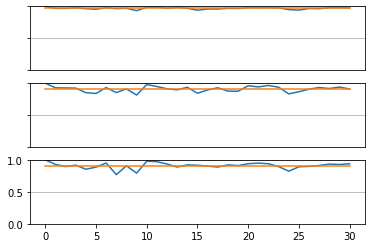

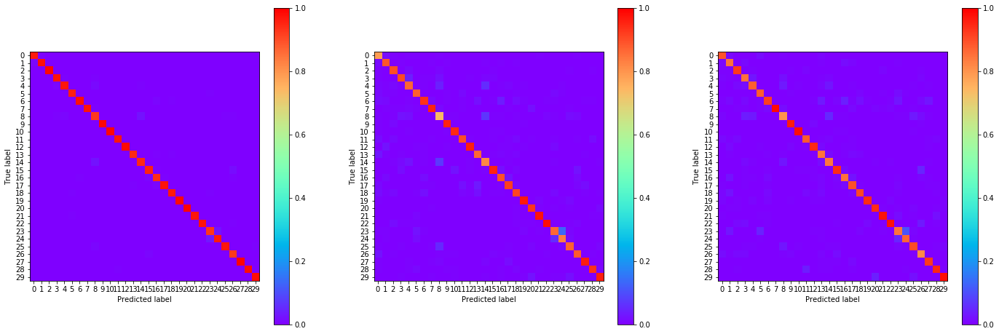

18:17:00.342213
#268 [Train: 0.112] [Test: 0.388] [Valid: 0.386]
#268 [Train: 0.967] [Test: 0.901] [Valid: 0.902]


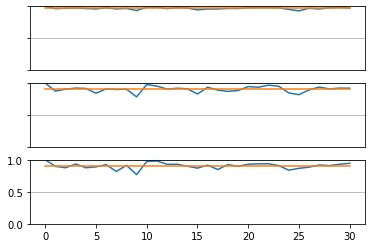

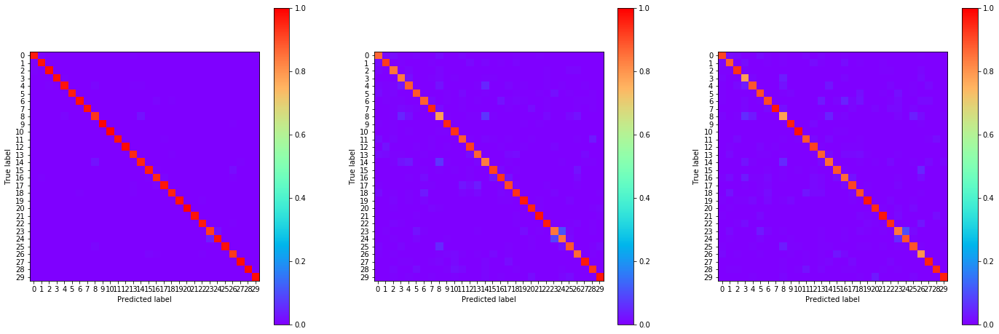

18:18:10.670999
#269 [Train: 0.115] [Test: 0.363] [Valid: 0.367]
#269 [Train: 0.966] [Test: 0.906] [Valid: 0.906]


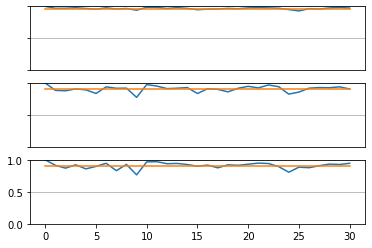

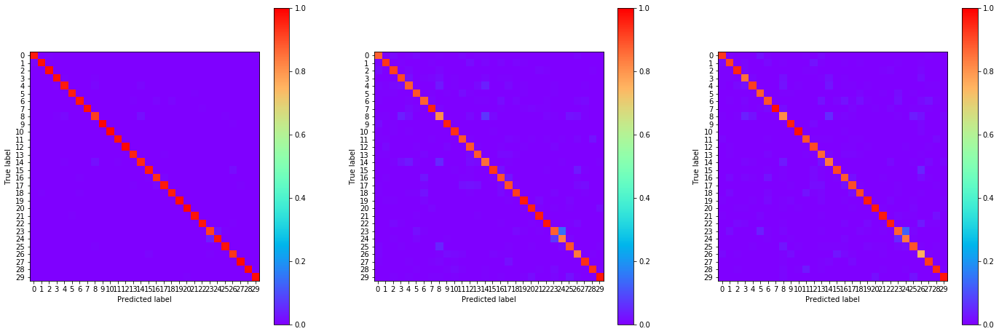

18:19:18.370462
#270 [Train: 0.113] [Test: 0.386] [Valid: 0.375]
#270 [Train: 0.967] [Test: 0.902] [Valid: 0.905]


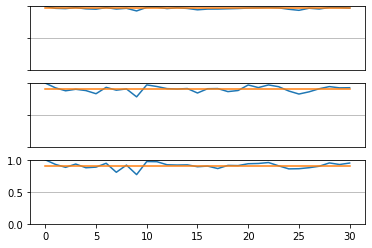

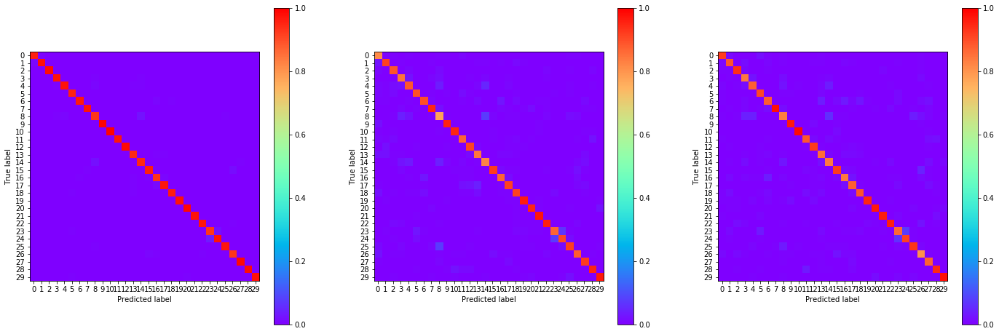

18:20:26.238681
#271 [Train: 0.111] [Test: 0.371] [Valid: 0.377]
#271 [Train: 0.967] [Test: 0.903] [Valid: 0.906]


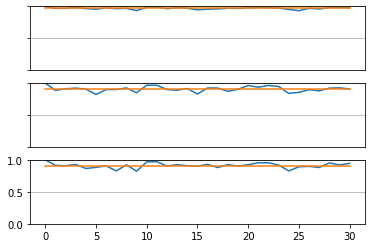

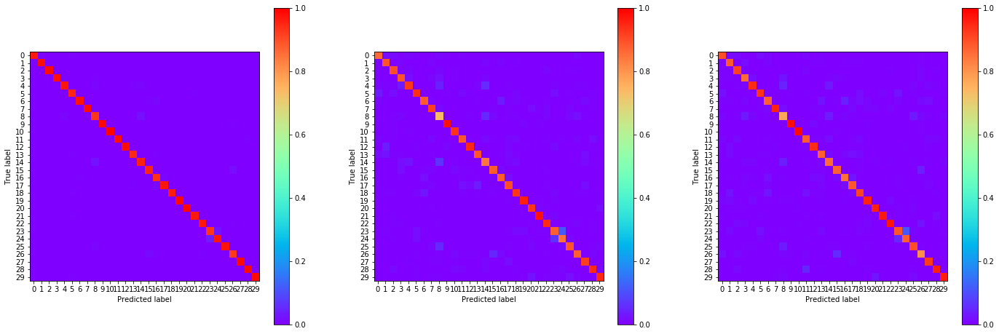

18:21:31.312365
#272 [Train: 0.111] [Test: 0.368] [Valid: 0.372]
#272 [Train: 0.968] [Test: 0.905] [Valid: 0.904]


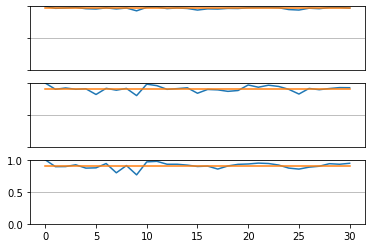

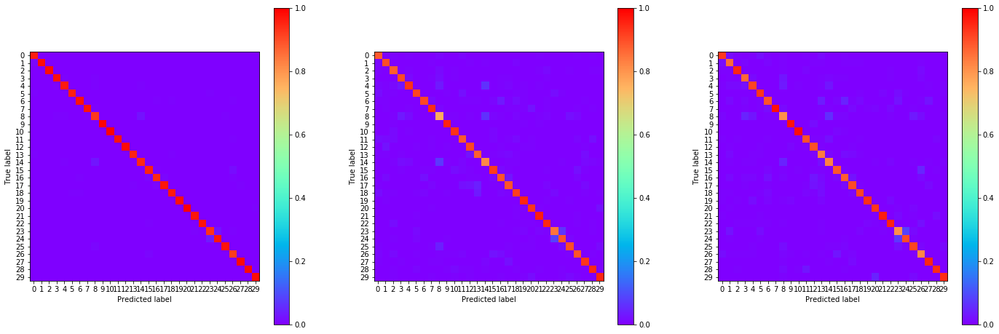

18:22:27.949644
#273 [Train: 0.108] [Test: 0.391] [Valid: 0.377]
#273 [Train: 0.969] [Test: 0.901] [Valid: 0.903]


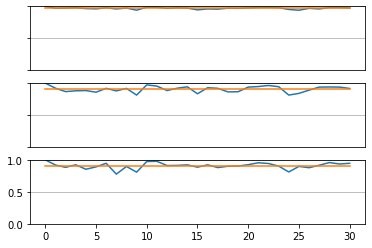

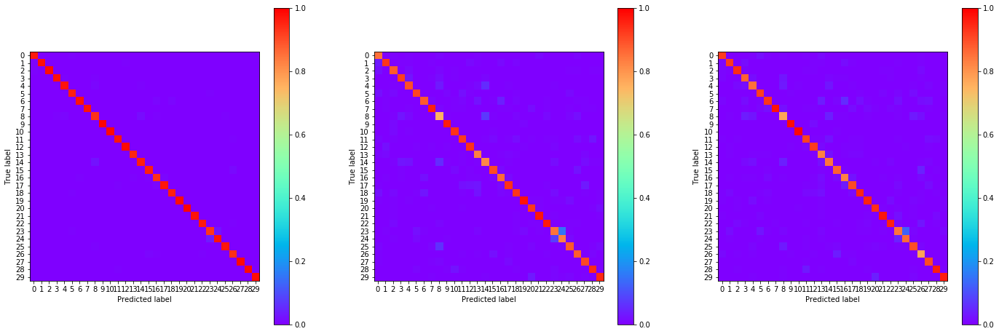

In [ ]:
MAX_EPOCH = 300

writer = SummaryWriter(log_dir=run_name)

for epoch in range(MAX_EPOCH):
    training_loss_list = list()
    batch_generator = dataset_loader_training.batch_generator()
    model.train()
    
    correct_num = 0
    total_num = 0
    
    result_matrix_train = np.zeros([31, 2])
    result_matrix_train[0, :] = [1, 1]
    y_pred_train = list()
    y_true_train = list()

    for (batch, label) in batch_generator:
        optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
        loss.backward()
        training_loss_list.append(loss.item())
        optimizer.step()
        
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_train += list(label)
        y_pred_train += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_train[label, 0] += 1
            if result:
                result_matrix_train[label, 1] += 1
        
    acc_train = correct_num / total_num

    testing_loss_list = list()

    batch_generator = dataset_loader_testing.batch_generator()

    model.eval()
    
    correct_num = 0
    total_num = 0
    
    result_matrix_test = np.zeros([31, 2])
    result_matrix_test[0, :] = [1, 1]
    y_pred_test = list()
    y_true_test = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label).to(device))
#         loss.backward()
        testing_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_test += list(label)
        y_pred_test += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_test[label, 0] += 1
            if result:
                result_matrix_test[label, 1] += 1
        
    acc_test = correct_num / total_num

    validation_loss_list = list()

    batch_generator = dataset_loader_validation.batch_generator()
    
    correct_num = 0
    total_num = 0
    
    result_matrix_eval = np.zeros([31, 2])
    result_matrix_eval[0, :] = [1, 1]
    y_pred_eval = list()
    y_true_eval = list()

    for (batch, label) in batch_generator:
    #     optimizer.zero_grad()
        pred = model(torch.cuda.FloatTensor(batch))
        loss = F.nll_loss(pred, torch.cuda.LongTensor(label))
#         loss.backward()
        validation_loss_list.append(loss.item())
    #     optimizer.step()
    
        _, pred_label = torch.max(pred, 1)
        correct_num += int((pred_label == torch.cuda.LongTensor(label)).sum().cpu().numpy())
        total_num += len(label)
        
        prediction_result = (pred_label == torch.cuda.LongTensor(label)).cpu().numpy()
        prediction_table = sorted(list(zip(prediction_result, label)), key = lambda x: x[1])
        
        y_true_eval += list(label)
        y_pred_eval += list(pred_label.cpu().numpy())
        
        for result, label in prediction_table:
            result_matrix_eval[label, 0] += 1
            if result:
                result_matrix_eval[label, 1] += 1
        
    acc_valid = correct_num / total_num
    
    training_loss_mean = np.mean(training_loss_list)
    testing_loss_mean = np.mean(testing_loss_list)
    validation_loss_mean = np.mean(validation_loss_list)
    
    print(datetime.datetime.now().time())
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, training_loss_mean, testing_loss_mean, validation_loss_mean))
    print('#{:03d} [Train: {:0.3f}] [Test: {:0.3f}] [Valid: {:0.3f}]'.format(epoch, acc_train, acc_test, acc_valid))
    
    fig, axes = plt.subplots(nrows=3, ncols=1, sharex=True)
    axes[0].plot(result_matrix_train[:, 1] / result_matrix_train[:, 0])
    axes[0].plot(np.ones(len(result_matrix_train)) * acc_train)
    axes[0].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[0].set_ylim([0, 1])
    axes[0].yaxis.grid(True)
                 
    axes[1].plot(result_matrix_test[:, 1] / result_matrix_test[:, 0])
    axes[1].plot(np.ones(len(result_matrix_test)) * acc_test)
    axes[1].tick_params(bottom=False, top=False, labelbottom=False, right=False, labelleft=False)
    axes[1].set_ylim([0, 1])
    axes[1].yaxis.grid(True)
                 
    axes[2].plot(result_matrix_eval[:, 1] / result_matrix_eval[:, 0])
    axes[2].plot(np.ones(len(result_matrix_eval)) * acc_valid)
    axes[2].set_ylim([0, 1])
    axes[2].yaxis.grid(True)
    plt.show()
    
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(24, 8))
    cm = confusion_matrix(y_true_train, y_pred_train, normalize='pred')
#     axes[0].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(31))
    disp.plot(include_values=False, ax=axes[0], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[0].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_test, y_pred_test, normalize='pred')
#     axes[1].imshow(cm)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(31))
    disp.plot(include_values=False, ax=axes[1], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[1].get_images():
        im.set_clim(0, 1)
    
    cm = confusion_matrix(y_true_eval, y_pred_eval, normalize='pred')
#     im = axes[2].imshow(cm)
#     plt.colorbar(im)
    
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=range(31))
    disp.plot(include_values=False, ax=axes[2], xticks_rotation='horizontal', cmap='rainbow')
    for im in axes[2].get_images():
        im.set_clim(0, 1)
    
    plt.show()
    
    writer.add_scalar('Loss/Train', training_loss_mean, epoch)
    writer.add_scalar('Loss/Test', testing_loss_mean, epoch)
    writer.add_scalar('Loss/Valid', validation_loss_mean, epoch)
    writer.add_scalar('Acc/Train', acc_train, epoch)
    writer.add_scalar('Acc/Test', acc_test, epoch)
    writer.add_scalar('Acc/Valid', acc_valid, epoch)
    

In [ ]:
# output = model(torch.cuda.FloatTensor(batch))

In [ ]:
# output.shape

In [ ]:
# torch.tensor(batch).unsqueeze_(1).shape

In [ ]:
# input_tensor = torch.tensor(batch).to(device).float()
# input_tensor = input_tensor.transpose(1, 2)
# model(input_tensor).shape

In [ ]:
# for batch, label_list in batch_generator:
#     print(batch.shape[0])
#     plt.figure(figsize=(5, 1))
#     plt.plot(label_list)
#     plt.show()
    
#     plt.figure(figsize=(6, 18))
# #     plt.imshow(batch[0], aspect='auto')
#     plt.imshow(batch[0])
#     plt.show()
    
#     break